#### Model taken from:
- [1] Offshore Pipelaying Dynamics. Gullik Anthon Jensen 
- [2] A nonlinear PDE formulation for offshore vessel pipeline installation. Gullik A. Jensen et al 
- [3] Modeling and Control of Offshore Pipelay Operations Based on a Finite Strain Pipe Model. Gullik A. Jensen 

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from datetime import datetime
from scipy.optimize import fsolve
from scipy.integrate import solve_ivp
from scipy import interpolate

In [2]:
import sys
sys.path.insert(0, "../../../../Ocean_Intella/PythonVehicleSimulator-master/src/python_vehicle_simulator")
sys.path.insert(0, "../../../../Ocean_Intella/PythonVehicleSimulator-master/src")

In [3]:
from python_vehicle_simulator.vehicles import *
from python_vehicle_simulator.lib import *
from python_vehicle_simulator.lib.gnc import ssa

In [4]:
mp = 96       #  (submerged pipe weight) [kg/m]

In [5]:
node_N = 5

In [6]:
mi = [mp for i in range(node_N)] 

In [7]:
# L - the hull length
# Xg - x-center of gravity
L = 169 # [m]
Xg = 78 # [m]
mn =   32219000 #123000000 # mass of the vessel, [kg]  Solitaire type vessel 
kp, kd=1.95e4,1.5e4

In [8]:
vessel_mass=mn/L # mass over length of the vessel

In [9]:
diag_Irho = 1e2*np.array([1, 1, 2]) # [m^4]  , p.99 in [1]
 
Irho=np.diag(diag_Irho)

In [10]:
Irho

array([[100.,   0.,   0.],
       [  0., 100.,   0.],
       [  0.,   0., 200.]])

In [11]:
# Fossen book p.181
def vessel_inertia_moment(mn, Xg, L):
    r = 0.25*L
    Ir = mn*r**2
    Iz=mn*Xg**2 + Ir
    return Iz

In [12]:
vessel_inertia = vessel_inertia_moment(mn, Xg, L)

In [13]:
vessel_inertia

253533324687.5

In [14]:
# Irho+=vessel_inertia

In [15]:
Irho

array([[100.,   0.,   0.],
       [  0., 100.,   0.],
       [  0.,   0., 200.]])

In [16]:
qw = 1025 # Water density [kg/m3]
d0 = 0.761 # Outer diameter of pipe, [m]
dI= 0.69 # Inner diameter of pipe, [m]

In [17]:
Ar=math.pi*((d0/2)**2-(dI/2)**2)

In [18]:
E = 210e9

In [19]:
E*Ar

16991625880.187403

In [20]:
diag_DT = 1.5*np.array([1, 1, 1]) 

In [21]:
DT=np.diag(diag_DT) # (35) in [2]

In [22]:
DT

array([[1.5, 0. , 0. ],
       [0. , 1.5, 0. ],
       [0. , 0. , 1.5]])

In [23]:
diag_CT = 1e9*np.array([1, 1, 1]) # [Nm2] p. 4721 in [3]

In [24]:
CT=np.diag(diag_CT)

In [25]:
CT

array([[1.e+09, 0.e+00, 0.e+00],
       [0.e+00, 1.e+09, 0.e+00],
       [0.e+00, 0.e+00, 1.e+09]])

In [26]:
# angles should be in radians, otherwise np.radians them  
def Re_t_(arr):
    φ,θ,ψ=arr[0],arr[1],arr[2]
  
    Cφ=np.matrix([[1,0,0],
                      [0,np.cos(φ),-np.sin(φ)],
                      [0,np.sin(φ),np.cos(φ)]])

    Cθ=np.matrix([[np.cos(θ),0,np.sin(θ)],
                      [0,1,0],
                      [-np.sin(θ),0,np.cos(θ)]])

    Cψ=np.matrix([[np.cos(ψ),-np.sin(ψ),0],
                      [np.sin(ψ),np.cos(ψ),0],
                      [0,0,1]])
        

    return np.array(np.dot(np.dot(Cφ,Cθ),Cψ) )

In [27]:
Re_t_([1,2,3])

array([[ 0.41198225,  0.05872664,  0.90929743],
       [-0.68124272, -0.64287284,  0.35017549],
       [ 0.60512725, -0.76371834, -0.2248451 ]])

In [28]:
rng = np.random.default_rng()

In [29]:
φ, θ, ψ = rng.standard_normal(node_N),rng.standard_normal(node_N),rng.standard_normal(node_N)

In [30]:
def Re_t(a,b,c):
    xyz=np.stack((a,b,c), axis=1)
    return np.apply_along_axis(Re_t_, 1, xyz)

In [31]:
Re_t_(np.array([φ[0], θ[0], ψ[0]]))

array([[ 0.49238   , -0.1630782 , -0.85496634],
       [-0.73478976,  0.44862669, -0.50874168],
       [ 0.46652539,  0.87871474,  0.10106661]])

In [32]:
startTime1 = datetime.now()
Ret=Re_t(φ,θ,ψ)
print(datetime.now() - startTime1)

0:00:00.001018


In [33]:
Ret.shape

(5, 3, 3)

In [34]:
dx,dy,dz=rng.standard_normal(node_N),rng.standard_normal(node_N),rng.standard_normal(node_N)

In [35]:
def C1(dx,dy,dz, Ret): # here
    B=np.vstack([np.abs(dx)*dx,(dy**2+dz**2)**0.5*dy,(dy**2+dz**2)**0.5*dz])
    ans=np.einsum('ijk,ik->ij', Ret, np.linalg.solve(Ret,B.T.astype(np.float32))) 
    return ans.T

In [36]:
startTime1 = datetime.now()
C1(dx,dy,dz,Ret)
print(datetime.now() - startTime1)

0:00:00.000279


In [37]:
def fD(dx,dy,dz,DT,Ret):
    return 1/2*d0*qw*np.dot(DT, C1(dx,dy,dz,Ret))*9.81

In [38]:
fD(dx,dy,dz,DT,Ret).T

array([[ -5415.06883882,  -1542.84040759,  26720.27781107],
       [ -9033.67180347,  17127.5580267 ,  26496.07216863],
       [-15089.92857926,  -6534.96068428,  -5156.04220935],
       [  -200.6885886 ,  -7456.91125831,  19834.85162667],
       [ -8874.16723152,    116.3583493 ,  17671.55273968]])

In [39]:
startTime1 = datetime.now()
fD(dx,dy,dz,DT,Ret)
print(datetime.now() - startTime1)

0:00:00.000324


In [40]:
# https://docs.scipy.org/doc/scipy-1.8.0/tutorial/integrate.html  
# 1-D Gray-Scott 

In [41]:
I=np.identity(3)

In [42]:
startTime1 = datetime.now()
np.dot(I,fD(dx,dy,dz,DT,Ret))
print(datetime.now() - startTime1)

0:00:00.000497


In [43]:
Rb_t=I # https://www.researchgate.net/profile/Thor-Fossen/publication/224560837_Modeling_and_Control_of_Offshore_Pipelay_Operations_Based_on_a_Finite_Strain_Pipe_Model/links/00b7d520e175a3f918000000/Modeling-and-Control-of-Offshore-Pipelay-Operations-Based-on-a-Finite-Strain-Pipe-Model.pdf

In [44]:
Rb_t

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

In [45]:
diag_DR = 1.5*np.array([1, 1, 1]) # [N m/rad]  p.4721 in [3]

In [46]:
DR=np.diag(diag_DR) 

In [47]:
Ar

0.08091250419136858

In [48]:
fg_e=np.array([[0,0,(mp-qw*Ar)*9.81] for x in range(node_N)])

In [49]:
fg_e

array([[  0.        ,   0.        , 128.16454223],
       [  0.        ,   0.        , 128.16454223],
       [  0.        ,   0.        , 128.16454223],
       [  0.        ,   0.        , 128.16454223],
       [  0.        ,   0.        , 128.16454223]])

In [50]:
x,y,z=rng.standard_normal(node_N),rng.standard_normal(node_N),rng.standard_normal(node_N)

In [51]:
def Re_b(Ret):
    return Ret

In [52]:
startTime1 = datetime.now()
Re_b(Ret)
print(datetime.now() - startTime1)

0:00:00.000177


In [53]:
def phi(x, y, z, Ret,dummy,dummy1): # here
    B=np.vstack([x,y,z])
    return np.linalg.solve(Ret.astype(np.float32),B.T.astype(np.float32))
#     return np.einsum('ijk,ik->ij', Ret,B.T.astype(np.float32))

In [54]:
phi(x,y,z,Ret,None,None)

array([[-0.97822875,  0.5154518 , -0.22331674],
       [ 1.0151159 , -0.5383271 ,  0.92617154],
       [ 1.16002   , -0.34819493,  0.9874981 ],
       [-0.63331324, -0.8631312 ,  0.4740922 ],
       [-1.0003093 , -0.39259112, -0.5052374 ]], dtype=float32)

In [55]:
startTime1 = datetime.now()
phi(x,y,z,Ret,None,None)
print(datetime.now() - startTime1)

0:00:00.000336


In [56]:
def Π_(arr):
    φ,θ,ψ=arr[0],arr[1],arr[2]
    return np.array([[np.cos(θ),0,np.cos(φ)*np.sin(θ)],
                  [0,1,-np.sin(φ)],
                  [-np.sin(θ),0,np.cos(φ)*np.cos(θ)]])

In [57]:
def Π(a,b,c):
    xyz=np.stack((a,b,c), axis=1)
  
    return np.apply_along_axis(Π_, 1, xyz)
    

In [58]:
startTime1 = datetime.now()
Π(φ,θ,ψ).shape
print(datetime.now() - startTime1)

0:00:00.000549


In [59]:
def ωe(φ,θ,ψ, dummy,dummy1,dummy2): # here # (100) in [2]
    A=Π(φ,θ,ψ)
    B=np.vstack([φ,θ,ψ])
    return np.einsum('ijk,ik->ij',A,B.T.astype(np.float32))

In [60]:
startTime1 = datetime.now()
ωe(φ,θ,ψ,None,None,None)
print(datetime.now() - startTime1)

0:00:00.005544


In [61]:
ωe(φ,θ,ψ,None,None,None)

array([[ 0.65974716, -1.33918852,  1.20763774],
       [ 0.48992347, -0.61607753,  0.04365675],
       [-1.37276263,  0.02548577,  0.43572283],
       [-0.79671513,  0.55593169,  0.08517099],
       [-0.14686624,  0.62721362,  0.00345333]])

In [62]:
def d_s(f,a,b,c,Ret,omega,force): # here
    
    fun = f(a,b,c,Ret,omega, force) 
    
    if any(force):
#         fun[-1]=-np.dot(Ret[-1],force)
        fun+=-np.dot(Ret,force) # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
    def S(arr):
        a1,a2,a3=arr[0],arr[1],arr[2]
        return np.array([[0, -a3, a2 ],
                         [a3, 0, -a1],
                        [-a2, a1, 0]])
    K=np.apply_along_axis(S, 1, omega)
    
    
   
    return np.einsum('ijk,ik->ij',K, fun.astype(np.float32)).T

In [63]:
φ, θ, ψ = np.array([0.00001 for i in range(node_N)]),np.array([0.00001 for i in range(node_N)]),np.array([0.00001 for i in range(node_N)])

In [64]:
d_s(phi,x,y,z,Ret, ωe(φ,θ,ψ,None,None,None), [1,20,3])

array([[-1.23711457e-04,  2.29003232e-05, -5.16822211e-05,
         2.47039388e-04,  2.12610846e-04],
       [ 2.29233326e-04,  1.04295437e-04, -1.76584408e-04,
        -2.69314780e-04, -6.02775873e-05],
       [-1.05519395e-04, -1.27196219e-04,  2.28267663e-04,
         2.22704512e-05, -1.52337510e-04]])

In [65]:
startTime1 = datetime.now()
d_s(phi,x,y,z,Ret,ωe(φ,θ,ψ,None,None,None),[0,0,0])
print(datetime.now() - startTime1)

0:00:00.000857


In [66]:
def ne(x,y,z,Ret,omega,force): # here
    A=np.multiply(np.multiply(Ret,CT),Ret)
    B=d_s(phi,x,y,z,Ret,omega,force).T
    return np.einsum('ijk,ik->ij', A.astype(np.float32),B
                     -
                     np.einsum('ijk,kp->ijp',Ret.astype(np.float32), np.array([1,0,0]).reshape(3,1)).squeeze()
                    )

In [67]:
φ, θ, ψ = np.array([0.000001 for i in range(node_N)]),np.array([0.000001 for i in range(node_N)]),np.array([0.000001 for i in range(node_N)])

In [68]:
d_s(ωe,x,y,z,Ret,ωe(φ,θ,ψ,None,None,None),[0,0,0])

array([[-7.38264059e-07,  1.43439464e-06,  2.19212372e-06,
         4.47098463e-07, -1.51012731e-07],
       [-5.19047819e-07, -1.00644294e-06, -4.45699340e-07,
        -9.53586081e-07, -9.02281612e-07],
       [ 1.25731335e-06, -4.27954565e-07, -1.74642876e-06,
         5.06486725e-07,  1.05329464e-06]])

In [69]:
def ne_(dx,dy,dz,DT,Ret):
    return -fg_e.T-fD(dx,dy,dz,DT,Ret) #-sigma(x,y,z).T

In [70]:
ne_(dx,dy,dz,DT,Ret)

array([[  5415.06883882,   9033.67180347,  15089.92857926,
           200.6885886 ,   8874.16723152],
       [  1542.84040759, -17127.5580267 ,   6534.96068428,
          7456.91125831,   -116.3583493 ],
       [-26848.4423533 , -26624.23671085,   5027.87766712,
        -19963.0161689 , -17799.71728191]])

In [71]:
startTime1 = datetime.now()
ne(x,y,z,Ret,ωe(φ,θ,ψ,None,None,None),[0,0,1])
print(datetime.now() - startTime1)

0:00:00.000665


In [72]:
d_s(ne, x, y, z, Ret, ωe(φ,θ,ψ,None,None,None), [0,0,1]).T

array([[-152.65331696, -114.60655757,  267.26017984],
       [-558.66604792, -125.40204373,  684.06920898],
       [-392.09795491,   32.14298096,  359.95575815],
       [ -84.69281909, -158.68383265,  243.37682113],
       [ 217.89261356, -881.61665265,  663.72360331]])

In [73]:
ne(x,y,z,Ret,ωe(φ,θ,ψ,None,None,None),[1,23,4])

array([[-1.19375112e+08,  1.47893566e+08, -4.76543562e+06],
       [-3.44678922e+08,  3.39396683e+08, -2.19283063e+08],
       [ 9.19152192e+04,  3.60034520e+08, -3.20499422e+07],
       [-1.06810174e+08,  1.36555848e+08,  5.18682771e+07],
       [-5.13354466e+08,  1.50347531e+08,  3.68234567e+08]])

In [74]:
startTime1 = datetime.now()
ne_(dx,dy,dz,DT,Ret)
print(datetime.now() - startTime1)

0:00:00.000319


In [75]:
Re_b(Ret).shape

(5, 3, 3)

In [76]:
# def Irho_e(Ret):
#     ans1 = np.multiply(np.multiply(Ret,Irho),Ret) # (19) in [3] 
#     tmp=Irho.copy()
    
#     tmp1=np.zeros(tmp.shape)
#     np.fill_diagonal(tmp1, vessel_inertia)
#     ans2=np.multiply(np.multiply(Ret,tmp+tmp1),Ret)
    
#     ans1[-1]+=ans2[-1]
#     return ans1
def Irho_e(Ret): # here
    ans= np.multiply(np.multiply(Ret,Irho),Ret) # (19) in [3] 
    return ans

In [77]:
Irho_e(Ret)

array([[[ 24.243806  ,   0.        ,   0.        ],
        [  0.        ,  20.12659049,   0.        ],
        [  0.        ,   0.        ,   2.04289213]],

       [[ 49.15986328,   0.        ,   0.        ],
        [  0.        ,  63.27128228,   0.        ],
        [  0.        ,   0.        ,  93.35678052]],

       [[  0.20368685,   0.        ,   0.        ],
        [  0.        ,  63.10430203,   0.        ],
        [  0.        ,   0.        ,   7.81717039]],

       [[ 22.51259848,   0.        ,   0.        ],
        [  0.        ,  15.89771184,   0.        ],
        [  0.        ,   0.        ,  53.92974702]],

       [[ 64.11410501,   0.        ,   0.        ],
        [  0.        ,  96.65333182,   0.        ],
        [  0.        ,   0.        , 127.3109346 ]]])

In [78]:
startTime1 = datetime.now()
Irho_e(Ret)
print(datetime.now() - startTime1)

0:00:00.000220


In [79]:
diag_CR = 1e11*np.array([1, 1, 1])
CR=np.diag(diag_CR)

In [80]:
CR

array([[1.e+11, 0.e+00, 0.e+00],
       [0.e+00, 1.e+11, 0.e+00],
       [0.e+00, 0.e+00, 1.e+11]])

In [81]:
def d_me(φ,θ,ψ,Ret,fun,omega,force):
    A=np.multiply(np.multiply(Ret,CR),Ret)
    B=d_s(fun,φ,θ,ψ,Ret,omega,force)
    return np.einsum('ijk,ik->ij', A,B.T.astype(np.float32)) 

In [82]:
startTime1 = datetime.now()
d_me_=d_me(φ,θ,ψ,Ret,ωe, ωe(φ,θ,ψ,None,None,None),[1,2,3])
print(datetime.now() - startTime1)

0:00:00.005957


In [83]:
d_me_

array([[ -94330.51599986,   99140.16576961,   -1057.10502338],
       [-168580.99170367,  284027.65205939,  -49469.67104646],
       [   -381.52646113, -192902.60280071,   19269.29363397],
       [  27056.05395102,  -62299.81338247,   73262.76814099],
       [  39993.55995722, -120548.56034616,   39685.21086995]])

In [84]:
diag_DR = 1.5*np.array([1, 1, 1]) 
 
DR=np.diag(diag_DR)

In [85]:
ne_(dx,dy,dz,DT,Ret)

array([[  5415.06883882,   9033.67180347,  15089.92857926,
           200.6885886 ,   8874.16723152],
       [  1542.84040759, -17127.5580267 ,   6534.96068428,
          7456.91125831,   -116.3583493 ],
       [-26848.4423533 , -26624.23671085,   5027.87766712,
        -19963.0161689 , -17799.71728191]])

### Static solution

In [86]:
def catenary(x,Ws,Fh):
    return (Fh/Ws)*(np.cosh(x*Ws/Fh)-1)

In [87]:
pipe_weight_per_unit_length = mi #  (submerged) [kg/m]  # 113.07 - not submerged

In [88]:
Fx_0=82945396

In [89]:
Ws = np.array(pipe_weight_per_unit_length)*9.81 # [N/m]
h=700

In [90]:
S=math.sqrt(h*(2*Fx_0/Ws[0] -h))
horizontal_length=(Fx_0/Ws[0] -h)*np.log((S+Fx_0/Ws[0])/(Fx_0/Ws[0]-h))

In [91]:
Ws

array([941.76, 941.76, 941.76, 941.76, 941.76])

In [92]:
delta_x=horizontal_length/(node_N-1)

In [93]:
x0=[i*delta_x for i in range(node_N)]
z0=[]

for i in range(len(x0)):
    z0.append(catenary(x0[i],Ws[0],Fx_0))

length_p=[]
for i in range(1,len(z0)):
    length_p.append(math.sqrt((x0[i]-x0[i-1])**2+(z0[i]-z0[i-1])**2))

In [94]:
x0,z0

([0.0,
  2763.171211115405,
  5526.34242223081,
  8289.513633346216,
  11052.68484446162],
 [0.0,
  43.34801072052057,
  173.43471225842703,
  390.38815474416316,
  694.4218951076863])

In [95]:
length_p

[2763.511207136747, 2766.231677183599, 2771.675294500312, 2779.8474161752847]

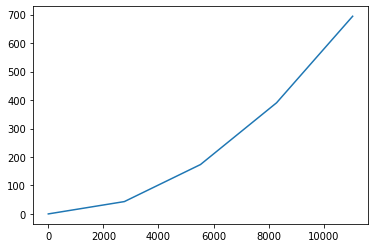

In [96]:
plt.plot(x0, z0)
plt.show()

In [97]:
rng = np.random.default_rng(seed=29)
q0=np.zeros(12*node_N)

In [98]:
for j in range(1,12):
    if j==1:  
        q0[(j-1)*node_N:j*node_N]=x0
    elif j==5:    
        q0[(j-1)*node_N:j*node_N]=z0

In [99]:
def static_func(Q): # here
    t=0
 
    x,y,z=Q[0:node_N],Q[2*node_N:3*node_N],Q[4*node_N:5*node_N]
    dx,dy,dz=Q[1*node_N:2*node_N],Q[3*node_N:4*node_N],Q[5*node_N:6*node_N]
    φ,θ,ψ=Q[6*node_N:7*node_N],Q[8*node_N:9*node_N],Q[10*node_N:11*node_N]
    Ret = Re_t(φ,θ,ψ)

    
    dφ,dθ,dψ=Q[7*node_N:8*node_N],Q[9*node_N:10*node_N],Q[11*node_N:12*node_N]
    
    η=[x[-1],y[-1],z[-1],φ[-1],θ[-1],ψ[-1]]
    
    tau_force=np.array([-Fx_0,0,0,0,0,0])
#     Z0=np.dot(Re_b(Ret),tau_force[:3])
    Z1 = d_s(ne, x, y, z, Ret, ωe(φ,θ,ψ,None,None,None), tau_force[:3]).T
#     test=np.einsum('ijk,ik->ij',Π(φ,θ,ψ).astype(np.float32),np.array([dφ,dθ,dψ]).astype(np.float32).T)

#     Z1 = d_s(ne, x, y, z, Ret, test).T
    DT_0=np.zeros((3,3))
    Z2=ne_(dx,dy,dz,DT_0,Ret).T
    
    
    Z =  Z1 + Z2 #+ Z0
    
    
############################################################ 
    ddx,ddy, ddz = np.linalg.solve(Ws[0]*Re_b(Ret),Z).T
    ddx,ddy, ddz = np.einsum('ijk,ik->ij',Ret, np.stack([ddx, ddy,ddz], axis=0).T).T

############################################################    

#     C0=np.einsum('ijk,kp->ijp',np.einsum('ijk,ikr->ijr',np.linalg.inv(Π(φ,θ,ψ).astype(np.float32)),
#                         Re_b(Ret)),tau_force[3:].reshape(3,1)) 
    C3=d_me(φ,θ,ψ,Ret,  ωe,ωe(φ,θ,ψ,None,None,None),tau_force[3:])
    B_ =C3
    B=(B_ #+ C0.squeeze()
      )

    A2 = Irho_e(Ret).astype(np.float32)
    A3=Π(φ,θ,ψ).astype(np.float32)
    A=np.einsum('ijk,ikr->ijr',A2,A3)


#############################################
    ddφ,ddθ,ddψ = np.linalg.solve(A,B).T
#############################################

    ans=np.concatenate([dx, ddx, dy, ddy, dz, ddz, dφ, ddφ, dθ, ddθ, dψ, ddψ], axis=0)
  
 
    return ans  

In [100]:
q0

array([    0.        ,  2763.17121112,  5526.34242223,  8289.51363335,
       11052.68484446,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,    43.34801072,   173.43471226,   390.38815474,
         694.42189511,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
      

In [101]:
root = fsolve(static_func, q0)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/optimize/minpack.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


In [102]:
root

array([    0.        ,  2763.17121112,  5526.34242223,  8289.51363335,
       11052.68484446,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,    43.34801072,   173.43471226,   390.38815474,
         694.42189511,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
      

In [103]:
x0_,z0_=root[:node_N],root[4*node_N:5*node_N]

In [104]:
x0

[0.0,
 2763.171211115405,
 5526.34242223081,
 8289.513633346216,
 11052.68484446162]

In [105]:
x0_

array([    0.        ,  2763.17121112,  5526.34242223,  8289.51363335,
       11052.68484446])

In [106]:
z0

[0.0,
 43.34801072052057,
 173.43471225842703,
 390.38815474416316,
 694.4218951076863]

In [107]:
z0_

array([  0.        ,  43.34801072, 173.43471226, 390.38815474,
       694.42189511])

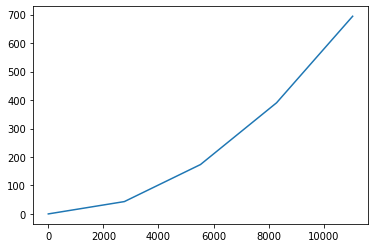

In [108]:
plt.plot(x0_, z0_)
plt.show()

In [109]:
init=0.4e-4
for j in range(1,12):
    if j==1:  
        q0[(j-1)*node_N:j*node_N]=x0_
    elif j==5:    
        q0[(j-1)*node_N:j*node_N]=z0_
#     elif j==9:    
#         q0[(j-1)*node_N:j*node_N]=1e-47*rng.standard_normal(node_N)
#         q0[(j-1)*node_N]=0
#     elif j==11:   
#         q0[(j-1)*node_N:j*node_N]=1e-47*rng.standard_normal(node_N)
#         q0[(j-1)*node_N]=0
#     elif j==9:    
#         q0[(j-1)*node_N:j*node_N]=init*np.array([0.13 for x in range(node_N)])
#         q0[(j-1)*node_N]=0
#     elif j==11:   
#         q0[(j-1)*node_N:j*node_N]=init*np.array([-0.13 for x in range(node_N)])
#         q0[(j-1)*node_N]=0    
q0[9*node_N-1]=0.13*init  # here

In [110]:
q0

array([0.00000000e+00, 2.76317121e+03, 5.52634242e+03, 8.28951363e+03,
       1.10526848e+04, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 4.33480107e+01, 1.73434712e+02, 3.90388155e+02,
       6.94421895e+02, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       5.20000000e-06, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
      

### Vessle Simulation

In [111]:
sampleTime = 0.01              # sample time [seconds]
N = 5000                      # number of samples

In [112]:
vehicle=semisub('DPcontrol',2,2,40.0,0,0) 

In [113]:
[simTime, simData] = simulate(N, sampleTime, vehicle)

In [114]:
ans_t=[]
sum_=0
for i in range(simData.shape[0]):
    ans_t.append(sum_)
    sum_+=sampleTime

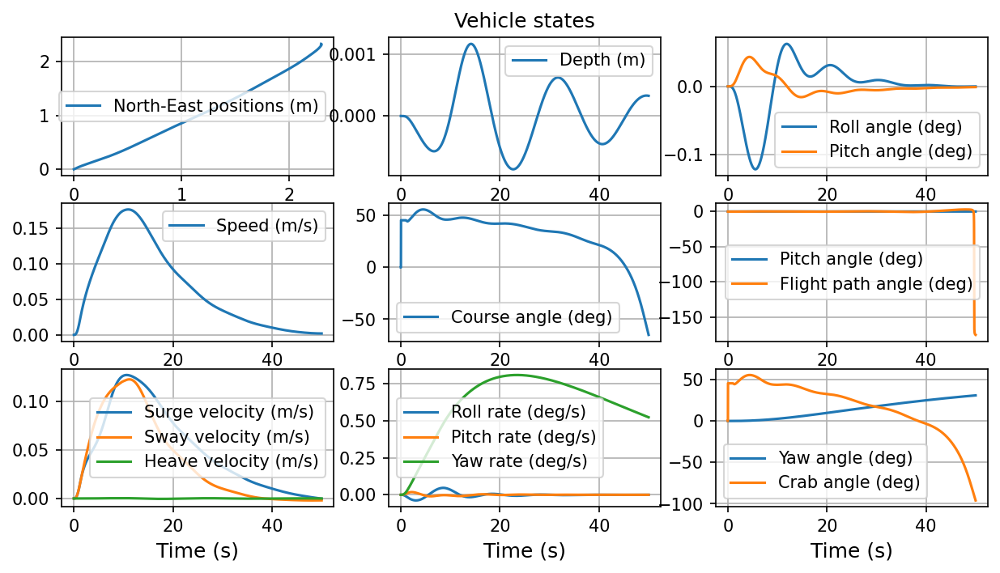

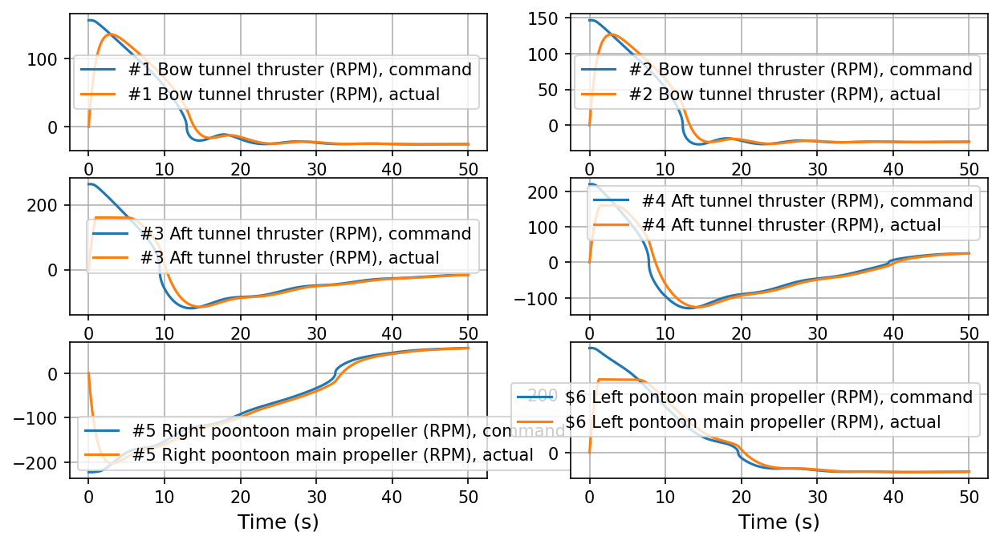

In [115]:
plotVehicleStates(simTime, simData, 1)                    
plotControls(simTime, simData, vehicle, 2)

In [116]:
numDataPoints = 5                 # number of 3D data points
FPS = 10                            # frames per second (animated GIF)
filename = '3D_animation.gif'       # data file for animated GIF
browser = 'safari'       

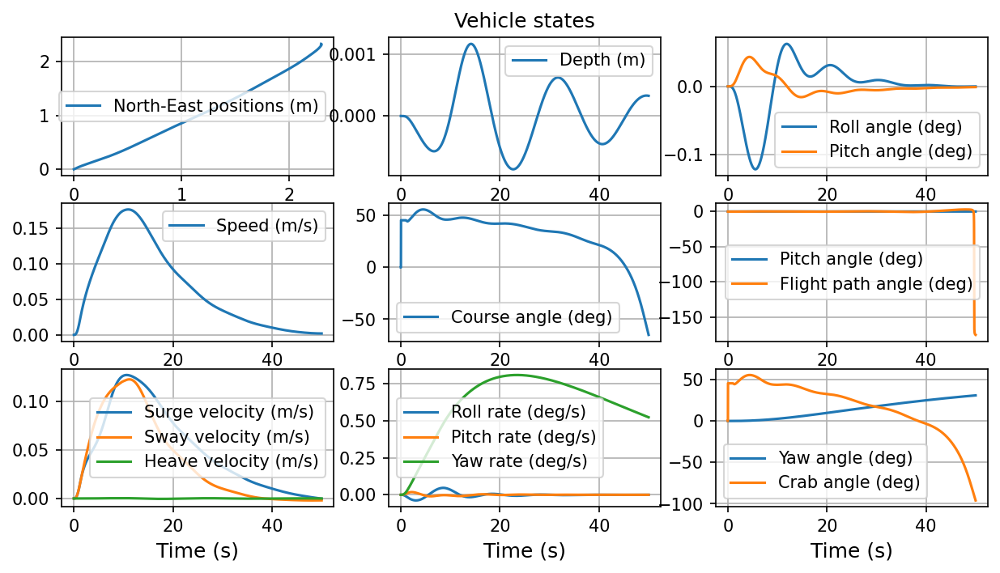

In [117]:
plotVehicleStates(simTime, simData, 3)

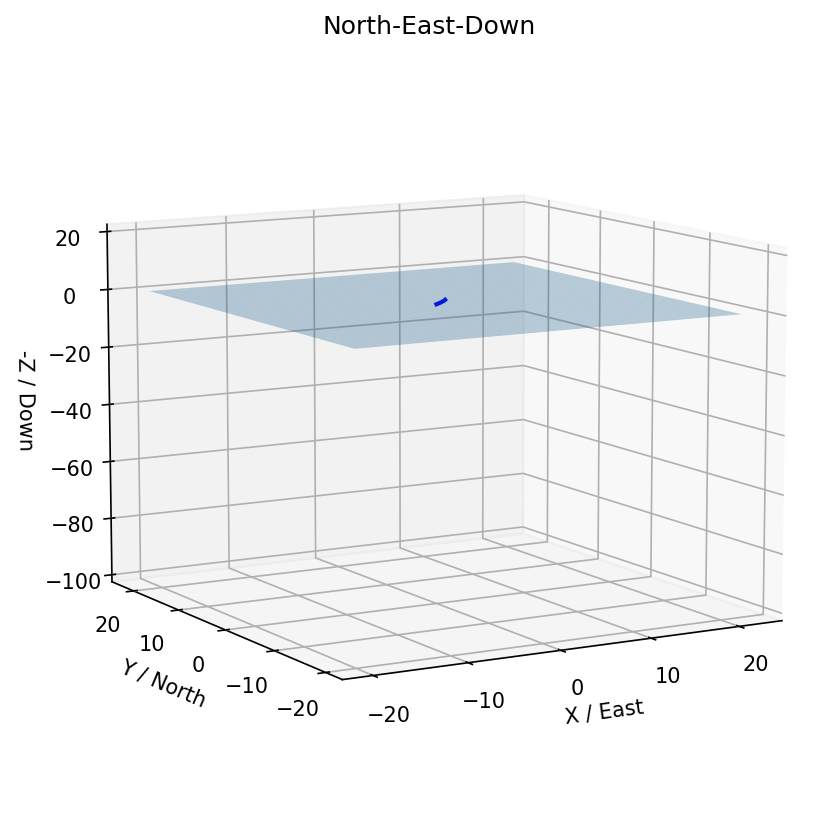

In [118]:
plot3D(simData, numDataPoints, FPS, filename, 3)  

In [119]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

### Dynamics

In [120]:
def grayscott1d(t, Q): # here
    print(t)
      
    x,y,z=Q[0:node_N],Q[2*node_N:3*node_N],Q[4*node_N:5*node_N]
    
    idx = find_nearest(np.array(ans_t),  t) 

    x_ve = simData[:, 0][idx]
    y_ve = simData[:, 1][idx]
    z_ve = simData[:, 2][idx]
    phi_ve = ssa(simData[:, 3][idx])
    theta_ve = ssa(simData[:, 4][idx])
    psi_v = ssa(simData[:, 5][idx])
    
    
    u_ve = simData[:, 6][idx]
    v_ve = simData[:, 7][idx]
    w_ve = simData[:, 8][idx]
    p_ve = simData[:, 9][idx]
    q_ve = simData[:, 10][idx]
    r_ve = simData[:, 11][idx]
    
    
    η=np.array([x_ve, y_ve, z_ve, phi_ve, theta_ve, psi_v])
    
    dη=np.array([u_ve, v_ve, w_ve, p_ve, q_ve, r_ve])
    
    
    n_ = vehicle.DPcontrol(η,dη,sampleTime) # /1e3
#     print(n_)
    

    dx,dy,dz=Q[1*node_N:2*node_N],Q[3*node_N:4*node_N],Q[5*node_N:6*node_N]
    

    φ,θ,ψ=Q[6*node_N:7*node_N],Q[8*node_N:9*node_N],Q[10*node_N:11*node_N]
    
    Ret = Re_t(φ,θ,ψ)

    dφ,dθ,dψ=Q[7*node_N:8*node_N],Q[9*node_N:10*node_N],Q[11*node_N:12*node_N]
    
#     force_schedule =1/(1+np.exp(-np.exp(t/10)+np.exp(2)))
#     force_schedule = t/15 if t<15 else 1
    force_schedule = 1e-1000
#     force_schedule=1
    tau_force = force_schedule*0.0166666667*n_ # [N]

    
#     Z0=np.dot(Re_b(Ret),tau_force[:3])   
#     print(Z0.shape)
    Z1 =d_s(ne, x, y, z, Ret,  ωe(φ,θ,ψ,None,None,None), tau_force[:3]).T
#     Z1 =d_s(ne, x, y, z, Ret, phi(x,y,z,Ret,None)).T
#     print(Z1)
    Z2=ne_(dx,dy,dz,DT,Ret).T

    Z= (Z1 + Z2 #+Z0
       )

############################################################    

    RRRR=Re_b(Ret)
    ddx,ddy, ddz = np.linalg.solve(np.einsum('i,ijk->ijk',
                                             [Ws[i] for i in range(node_N)]
#                                              +[Ws[-1] + vessel_mass]
                                             ,RRRR),
                                   Z).T 
#     print(ddx)
#     print(np.concatenate([ddx, ddy,ddz, dφ,], axis=0))
#     ddx,ddy, ddz = Ret
    ddx,ddy, ddz = np.einsum('ijk,ik->ij',Ret, np.stack([ddx, ddy,ddz], axis=0).T).T
#     print()
############################################################      

    
 
    
 

    C1=np.einsum('ijk,ik->ij', Irho_e(Ret).astype(np.float32),
                                                        np.einsum('ijk,ik->ij', Π(dφ,dθ,dψ).astype(np.float32), 
                                                                  np.array([dφ,dθ,dψ]).astype(np.float32).T))
   

    test=np.einsum('ijk,ik->ij',Π(φ,θ,ψ).astype(np.float32),np.array([dφ,dθ,dψ]).astype(np.float32).T)

    C2= np.cross(
         test,
                 np.einsum('ijk,ik->ij',Irho_e(Ret).astype(np.float32),
                            test))


    C3=d_me(φ,θ,ψ,Ret, ωe, ωe(φ,θ,ψ,None,None,None),tau_force[3:])
    
#     C4= np.cross(d_s(phi,x,y,z,Ret, phi(x,y,z,Ret,None)).T, ne(x,y,z,Ret, phi(x,y,z,Ret,None)))
    C4= np.cross(d_s(phi,x,y,z,Ret, ωe(φ,θ,ψ,None,None,None),[None,None,None]).T, 
                 ne(x,y,z,Ret, ωe(φ,θ,ψ,None,None,None),tau_force[:3]))

#     C4= np.cross(d_s(phi,x,y,z,Ret, test).T, ne(x,y,z,Ret, test))
    
    K1=test.T

    C5= np.einsum('ijk,ik->ij',Ret, -np.dot(DR,K1).astype(np.float32).T)

#     C0=np.einsum('ijk,kp->ijp',np.einsum('ijk,ikr->ijr',np.linalg.inv(Π(φ,θ,ψ).astype(np.float32)),
#                         Re_b(Ret)),tau_force[3:].reshape(3,1)) 
    B_ =(
        -C1
        -C2
        +C3
        +C4
        +C5
    )
    B= B_ #+C0.squeeze()
#     print(B)   

    A2 = Irho_e(Ret).astype(np.float32)
    A3=Π(φ,θ,ψ).astype(np.float32)

    A=np.einsum('ijk,ikr->ijr',A2,A3)
    

############################################
    ddφ,ddθ,ddψ = np.linalg.solve(A,B).T
#############################################


#     ddx[0],ddy[0],ddz[0],ddφ[0],ddθ[0],ddψ[0]=0,0,0,0,0,0
    A1111=np.concatenate([dx, ddx, dy, ddy, dz, ddz, dφ, ddφ, dθ, ddθ, dψ, ddψ], axis=0)
#     print(A1111)
    return A1111

In [121]:
tspan = (0., 0.2)

In [122]:
startTime1 = datetime.now()

us=solve_ivp(grayscott1d,  tspan, q0, 
#              nfev=842
#              method='LSODA',
#              method= 'BDF'
#              vectorized=True
#              min_step=1e-6
#              rtol=1e9, atol=1e9
            )
print(datetime.now() - startTime1)

0.0
4.9212232762318524e-11
9.842446552463706e-10
1.4763669828695556e-09
3.9369786209854826e-09
4.3744206899838686e-09
4.9212232762318526e-09
4.9212232762318526e-09
1.476366982869556e-08
1.968489310492741e-08
4.429100948608668e-08
4.866543017607054e-08
5.413345603855038e-08
5.413345603855038e-08
1.5255792156318743e-07
2.0177015432550596e-07
4.478313181370986e-07
4.915755250369372e-07
5.462557836617356e-07
5.462557836617356e-07
1.1514246031877246e-06
1.4540090129507187e-06
2.9669310617656914e-06
3.2358949815550193e-06
3.57209988129168e-06
3.57209988129168e-06
4.493979222203252e-06
4.954918892659038e-06
7.25961724493797e-06
7.669341396454225e-06
8.181496585849542e-06
8.181496585849542e-06
9.43197114995394e-06
1.0057208432006139e-05
1.3183394842267133e-05
1.3739161315202422e-05
1.4433869406371532e-05
1.4433869406371532e-05
1.5876076756177377e-05
1.65971804310803e-05
2.020269880559492e-05
2.0843679849953074e-05
2.1644906155400767e-05
2.1644906155400767e-05
1.5713367135694747e-05
1.635311600

0.00019317756273255177
0.00019403471704492454
0.00019446329420111093
0.00019660617998204285
0.00019698713745420853
0.00019746333429441563
0.00019746333429441563
0.00019853314497457982
0.00019906805031466194
0.00020174257701507245
0.00020221804842847875
0.00020281238769523664
0.00020281238769523664
0.00020398626164107447
0.00020457319861399338
0.00020750788347858793
0.00020802960523229363
0.00020868175742442575
0.00020868175742442575
0.00020373208160418294
0.00020419192855865612
0.0002064911633310219
0.00020689991617944248
0.00020741085723996821
0.00020741085723996821
0.00020831844182734544
0.00020877223412103406
0.00021104119558947715
0.00021144456651720037
0.00021194878017685438
0.00021194878017685438
0.00021284079058383375
0.00021328679578732344
0.00021551682180477184
0.00021591327087454047
0.00021640883221175122
0.00021640883221175122
0.0002173681977907978
0.0002178478805803211
0.0002202462945279376
0.00022067267922973609
0.0002212056601069842
0.0002212056601069842
0.000222144656929

0.0004306840255053636
0.0004316287905428544
0.00043210117306159983
0.00043446308565532697
0.0004348829812275451
0.0004354078506928178
0.0004354078506928178
0.0004364626558263089
0.00043699005839305445
0.00043962707122678223
0.0004400958735083338
0.0004406818763602733
0.0004406818763602733
0.00044164135352034754
0.00044212109210038463
0.0004445197850005702
0.0004449462192939365
0.0004454792621606444
0.0004454792621606444
0.0004414904672990904
0.00044189476276849894
0.0004439162401155417
0.00044427561386612704
0.00044472483105435876
0.00044472483105435876
0.00044552247760032556
0.00044592130087330896
0.000447915417238226
0.00044826992681421126
0.0004487130637841928
0.0004487130637841928
0.000449732784315654
0.0004502426445813846
0.00045279194591003744
0.0004532451550351313
0.0004538116664414986
0.0004538116664414986
0.0004547940889761144
0.0004552853002434223
0.00045774135657996175
0.0004581779888175688
0.00045872377911457756
0.00045872377911457756
0.0004545763295314796
0.000454958661076

0.000658545106377392
0.0006590012517238367
0.0006612819784560604
0.0006616874409862335
0.0006621942691489499
0.0006621942691489499
0.0006631065598418394
0.0006635627051882842
0.0006658434319205079
0.000666248894450681
0.0006667557226133974
0.0006667557226133974
0.0006677303976228142
0.0006682177351275226
0.0006706544226510644
0.0006710876115441386
0.0006716290976604812
0.0006716290976604812
0.0006729183586210515
0.0006735629891013365
0.000676786141502762
0.0006773591463741266
0.0006780754024633322
0.0006780754024633322
0.0006725198267530665
0.000672965191299359
0.0006751920140308221
0.0006755878936275266
0.0006760827431234074
0.0006760827431234074
0.0006769734722159926
0.0006774188367622852
0.0006796456594937482
0.0006800415390904528
0.0006805363885863335
0.0006805363885863335
0.0006814460270112459
0.0006819008462237022
0.0006841749422859831
0.0006845792260303887
0.0006850845807108956
0.0006850845807108956
0.000686077449806449
0.0006865738843542258
0.0006890560570931095
0.0006894973322

0.0008897295861770414
0.0008904809602303275
0.0008904809602303275
0.0008848799161554918
0.0008854605773578615
0.0008883638833697101
0.0008888800266607055
0.0008895252057744496
0.0008895252057744496
0.0008906089362968362
0.0008911508015580294
0.0008938601278639958
0.0008943417858739453
0.0008949438583863823
0.0008949438583863823
0.0008959823685374722
0.0008965016236130171
0.0008990978989907417
0.0008995594590578928
0.0009001364091418316
0.0009001364091418316
0.0008958732415574042
0.0008963379331429152
0.0008986613910704701
0.0008990744502575909
0.000899590774241492
0.000899590774241492
0.0009005201574125139
0.000900984848998025
0.0009033083069255798
0.0009037213661127006
0.0009042376900966017
0.0009042376900966017
0.0009052143372640361
0.0009057026608477532
0.0009081442787663392
0.0009085783441740878
0.0009091209259337736
0.0009091209259337736
0.0009100184740332668
0.0009104672480830134
0.0009127111183317464
0.0009131100285981878
0.0009136086664312396
0.0009136086664312396
0.00090990063

0.0011213410087776757
0.0011220014517142583
0.0011220014517142583
0.0011231089962645726
0.0011236627685397298
0.0011264316299155154
0.0011269238719378773
0.0011275391744658297
0.0011275391744658297
0.0011285827883918541
0.0011291045953548662
0.0011317136301699272
0.0011321774585814936
0.0011327572440959516
0.0011327572440959516
0.0011337090319004928
0.0011341849258027631
0.0011365643953141157
0.001136987412116134
0.0011375161831186568
0.0011375161831186568
0.0011384109671161585
0.0011388583591149092
0.001141095319108663
0.0011414930008853306
0.0011419901031061647
0.0011419901031061647
0.0011428970233855276
0.0011433504835252092
0.0011456177842236166
0.0011460208599033334
0.0011465247045029795
0.0011465247045029795
0.0011428003790155358
0.0011432055169702212
0.0011452312067436485
0.0011455913293700356
0.0011460414826530195
0.0011460414826530195
0.0011468517585623906
0.001147256896517076
0.0011492825862905033
0.0011496427089168904
0.0011500928621998743
0.0011500928621998743
0.00115141199

0.001347673925520532
0.0013480683704634993
0.0013485614266422086
0.0013485614266422086
0.0013494879699845698
0.0013499512416557504
0.0013522676000116533
0.0013526793970527026
0.0013531941433540145
0.0013531941433540145
0.0013542250236317733
0.0013547404637706529
0.0013573176644650503
0.0013577758334773875
0.0013583485447428091
0.0013583485447428091
0.0013595298323582242
0.0013601204761659318
0.0013630736952044697
0.001363598711922432
0.0013642549828198848
0.0013642549828198848
0.0013593209768739864
0.0013598071929395753
0.0013622382732675188
0.0013626704653258198
0.0013632107053986962
0.0013632107053986962
0.0013641831375298735
0.0013646693535954624
0.0013671004339234059
0.0013675326259817069
0.0013680728660545832
0.0013680728660545832
0.0013690679646149086
0.0013695655138950714
0.001372053260295885
0.0013724955263226962
0.0013730483588562103
0.0013730483588562103
0.001374346393939864
0.0013749954114816907
0.0013782404991908247
0.0013788174036724486
0.0013795385342744784
0.001379538534

0.001592775328337271
0.0015933100784216274
0.0015959838288434087
0.0015964591622517252
0.0015970533290121211
0.0015970533290121211
0.001598070445573902
0.0015985790038547925
0.0016011217952592446
0.0016015738470644806
0.0016021389118210255
0.0016021389118210255
0.0016030714170701132
0.0016035376696946573
0.0016058689328173768
0.001606283379594749
0.0016068014380664645
0.0016068014380664645
0.001607776735544637
0.0016082643842837232
0.0016107026279791545
0.0016111360935250087
0.0016116779254573268
0.0016116779254573268
0.0016125854740164812
0.0016130392482960583
0.0016153081196939444
0.001615711474609124
0.0016162156682530987
0.0016162156682530987
0.0016124504429919772
0.0016128367017593024
0.0016147679955959284
0.0016151113367224397
0.0016155405131305788
0.0016155405131305788
0.0016163130306652291
0.0016166992894325544
0.0016186305832691804
0.0016189739243956916
0.0016194031008038307
0.0016194031008038307
0.001620634228558281
0.001621249792435506
0.0016243276118216316
0.001624874779712

0.001849194258675663
0.001849194258675663
0.0018502182011771468
0.0018507301724278885
0.0018532900286815975
0.0018537451142378125
0.0018543139711830812
0.0018543139711830812
0.0018554852610870737
0.00185607090603907
0.0018589991307990511
0.0018595197040897145
0.0018601704207030435
0.0018601704207030435
0.0018553162295648737
0.0018558173587557697
0.0018583230047102507
0.0018587684528799363
0.0018593252630920432
0.0018593252630920432
0.0018603275214738356
0.0018608286506647316
0.0018633342966192126
0.0018637797447888982
0.001864336555001005
0.001864336555001005
0.0018601259651847165
0.001860526316231053
0.001862528071462736
0.0018628839390594796
0.0018633287735554092
0.0018633287735554092
0.0018641294756480825
0.001864529826694419
0.001866531581926102
0.0018668874495228456
0.0018673322840187753
0.0018673322840187753
0.0018686997564268362
0.0018693834926308667
0.0018728021736510191
0.001873409939165713
0.0018741696460590801
0.0018741696460590801
0.0018684815357407662
0.0018690561616017615

0.0020986016241568844
0.0020990471040547966
0.002099603953927187
0.002099603953927187
0.002095391262062198
0.0020957907405554596
0.0020977881330217682
0.002098143225015779
0.002098587090008292
0.002098587090008292
0.0020993860469948156
0.002099785525488077
0.0021017829179543856
0.002102138009948396
0.0021025818749409093
0.0021025818749409093
0.0021039500277936197
0.002104634104219975
0.0021080544863517504
0.002108662554286288
0.0021094226392044607
0.0021094226392044607
0.0021037306129001038
0.0021043049818797012
0.002107176826777687
0.0021076873769817735
0.0021083255647368817
0.0021083255647368817
0.0021093985140753133
0.0021099349887445293
0.002112617362090609
0.002113094228463245
0.0021136903114290406
0.0021136903114290406
0.002114708148004084
0.0021152170662916063
0.0021177616577292154
0.0021182140295403456
0.002118779494304259
0.002118779494304259
0.002114606181699934
0.002115064116835381
0.0021173537925126148
0.002117760845966345
0.002118269662783508
0.002118269662783508
0.0021191

0.0023445074452045868
0.0023445074452045868
0.0023388118091159154
0.002339385975779145
0.0023422568090952912
0.002342767179462606
0.00234340514242175
0.00234340514242175
0.0023444777059204104
0.0023450139876697407
0.0023476953964163922
0.0023481720913046855
0.0023487679599150527
0.0023487679599150527
0.002349785271605668
0.0023502939274509757
0.002352837206677514
0.0023532893452066763
0.0023538545183681295
0.0023538545183681295
0.002349683307309609
0.002350140981006887
0.0023524293494932777
0.002352836170557525
0.002353344696887834
0.002353344696887834
0.0023542600442823906
0.0023547177179796684
0.002357006086466059
0.0023574129075303067
0.0023579214338606156
0.0023579214338606156
0.0023588769860061194
0.0023593547620788715
0.0023617436424426316
0.0023621683322850775
0.0023626991945881353
0.0023626991945881353
0.002363559908614085
0.0023639902656270593
0.0023661420506919328
0.0023665245902590214
0.0023670027647178823
0.0023670027647178823
0.0023678770511115768
0.0023683141943084242
0.0

0.0025976874527060246
0.0025976874527060246
0.002598560348071779
0.0025989967957546567
0.0026011790341690434
0.0026015669876649342
0.002602051929534798
0.002602051929534798
0.0026028844317927888
0.0026033006829217845
0.0026053819385667624
0.002605751939570314
0.0026062144408247534
0.0026062144408247534
0.002607481441621995
0.002608114942020616
0.0026112824440137207
0.0026118455554791616
0.0026125494448109624
0.0026125494448109624
0.0026072109665272367
0.0026077092293784786
0.002610200543634687
0.002610643443946902
0.0026111970693371706
0.0026111970693371706
0.002612193595039654
0.002612691857890896
0.0026151831721471044
0.002615626072459319
0.0026161796978495877
0.0026161796978495877
0.002612044019870309
0.002612467495136878
0.0026145848714697233
0.002614961293928896
0.0026154318220028617
0.0026154318220028617
0.0026162759416490607
0.0026166980014721603
0.0026188083005876574
0.002619183464874857
0.0026196524202338565
0.0026196524202338565
0.002621003532688767
0.002621679088916222
0.002

0.0028344482650036703
0.0028348415759350846
0.0028368081305921557
0.0028371577403089685
0.0028375947524549843
0.0028375947524549843
0.002838378060397824
0.0028387697143692435
0.0028407279842263427
0.002841076121089827
0.002841511292169182
0.002841511292169182
0.0028425444660428404
0.0028430610529796693
0.002845643987663815
0.0028461031760521074
0.002846677161537473
0.002846677161537473
0.002847672741494354
0.0028481705314727943
0.0028506594813649967
0.0028511019613458328
0.0028516550613218775
0.0028516550613218775
0.002847422241010021
0.002847794780746295
0.0028496574794276653
0.0028499886258599085
0.002850402558900213
0.002850402558900213
0.002851147638372761
0.002851520178109035
0.0028533828767904053
0.0028537140232226484
0.002854127956262953
0.002854127956262953
0.002855422351757317
0.0028560695495044993
0.002859305538240409
0.0028598808251267933
0.0028605999337347732
0.0028605999337347732
0.0028617654891843715
0.0028623482669091703
0.0028652621555331653
0.002865780180177431
0.00286

0.0030830465665328717
0.003077758579389133
0.003078258902866894
0.003080760520255698
0.0030812052522359297
0.0030817611672112194
0.0030817611672112194
0.003082761814166741
0.003083262137644502
0.003085763755033306
0.0030862084870135376
0.0030867644019888273
0.0030867644019888273
0.0030825137496174595
0.00308289004082058
0.0030847714968361807
0.0030851059779056205
0.003085524079242421
0.003085524079242421
0.003086276661648661
0.0030866529528517815
0.003088534408867382
0.003088868889936822
0.0030892869912736223
0.0030892869912736223
0.0030905877134468004
0.0030912380745333895
0.0030944898799663352
0.00309506797870997
0.0030957906021395133
0.0030957906021395133
0.003090400118615219
0.0030909566822860174
0.0030937395006400093
0.003094234223902941
0.003094852627981606
0.003094852627981606
0.0030959320036589954
0.0030964716914976902
0.0030991701306911645
0.0030996498532144486
0.003100249506368554
0.003100249506368554
0.0031012786712440376
0.003101793253681779
0.0031043661658704874
0.00310482

0.0033281656440620807
0.0033286709346165956
0.0033311973873891712
0.0033316465345487405
0.0033322079684982016
0.0033322079684982016
0.0033332693593531256
0.003333800054780588
0.0033364535319178987
0.0033369252611867538
0.0033375149227728228
0.0033375149227728228
0.0033331337259686934
0.0033335966047039396
0.00333591099838017
0.003336322446144833
0.0033368367558506617
0.0033368367558506617
0.0033377625133211536
0.0033382253920563997
0.00334053978573263
0.003340951233497293
0.003341465543203122
0.003341465543203122
0.003342449138397764
0.0033429409359950852
0.0033453999239816904
0.0033458370774015313
0.0033463835191763327
0.0033463835191763327
0.0033476059341509376
0.00334821714163824
0.003351273179074752
0.003351816474619021
0.003352495594049357
0.003352495594049357
0.003347283492405834
0.003347733479020585
0.0033499834120943378
0.0033503834001963385
0.003350883385323839
0.003350883385323839
0.0033517833585533403
0.0033522333451680908
0.003354483278241844
0.003354883266343845
0.00335538

0.0035816291587637823
0.003582071384461107
0.0035842825129477306
0.0035846756024564635
0.0035851669643423797
0.0035851669643423797
0.0035859810352868015
0.003586388070759012
0.003588423248120066
0.0035887850574286982
0.003589237319064488
0.003589237319064488
0.0035904344650128654
0.0035910330379870545
0.003594025902857999
0.0035945579677239448
0.0035952230488063767
0.0035952230488063767
0.003590237862355799
0.003590738134001455
0.0035932394922297338
0.0035936841781369832
0.003594240035521045
0.003594240035521045
0.0035952405788123565
0.0035957408504580122
0.003598242208686291
0.0035986868945935406
0.0035992427519776025
0.0035992427519776025
0.0035950275418867492
0.0035954212950696017
0.0035973900609838623
0.003597740063813064
0.0035981775673495663
0.0035981775673495663
0.0035989650737152704
0.003599358826898123
0.0036013275928123835
0.0036016775956415853
0.0036021150991780875
0.0036021150991780875
0.003603489055982708
0.003604176034385019
0.003607610926396571
0.003608221573865291
0.003

0.0038146817959532984
0.0038146817959532984
0.0038155152517264147
0.003815931979612973
0.0038180156190457636
0.003818386043833815
0.00381884907481888
0.00381884907481888
0.0038196727217887725
0.0038200845452737186
0.00382214366269845
0.0038225097280184025
0.0038229673096683426
0.0038229673096683426
0.00382428812515664
0.0038249485329007894
0.0038282505716215336
0.0038288376007274433
0.003829571387109831
0.003829571387109831
0.0038239583708249256
0.0038244539014032166
0.0038269315542946735
0.0038273720259198217
0.0038279226154512565
0.0038279226154512565
0.0038289136766078394
0.0038294092071861304
0.0038318868600775873
0.0038323273317027355
0.0038328779212341703
0.0038328779212341703
0.0038286823865363367
0.003829062272078877
0.003830961699791578
0.0038312993758293913
0.003831721470876658
0.003831721470876658
0.0038324812419617384
0.0038328611275042787
0.0038347605552169796
0.003835098231254793
0.00383552032630206
0.00383552032630206
0.0038367984223560765
0.0038374374703830844
0.0038406

0.004036145168278309
0.00403931309801695
0.004039876285526042
0.004040580269912406
0.004040580269912406
0.004041804650173807
0.0040424168403045075
0.00404547779095801
0.004046021959963076
0.00404670217121941
0.00404670217121941
0.004041649227945392
0.004042183706961886
0.0040448561020443525
0.004045331194503457
0.004045925060077339
0.004045925060077339
0.004046994018110325
0.004047528497126819
0.004050200892209285
0.0040506759846683895
0.004051269850242271
0.004051269850242271
0.004052372664668694
0.004052924071881904
0.004055681107947961
0.004056171247693037
0.004056783922374383
0.004056783922374383
0.004052152956258326
0.004052594509266353
0.004054802274306489
0.0040551947658691795
0.004055685380322543
0.004055685380322543
0.004056548066533216
0.004056979409638552
0.004059136125165233
0.004059519541258865
0.004059998811375905
0.004059998811375905
0.004061003216476371
0.004061505419026603
0.004064016431777767
0.004064462834044641
0.004065020836878233
0.004065020836878233
0.00406605240

0.0042688162522704475
0.0042688162522704475
0.0042697402924134
0.004270202312484876
0.004272512412842258
0.004272923097350237
0.00427343645298521
0.00427343645298521
0.004274750540278425
0.004275407583925033
0.00427869280215807
0.004279276840955054
0.004280006889451285
0.004280006889451285
0.004274613734212364
0.00427520237482594
0.004278145577893824
0.004278668813994781
0.004279322859120977
0.004279322859120977
0.004280457026841879
0.004281024110702331
0.004283859530004586
0.004284363604547209
0.0042849936977254885
0.0042849936977254885
0.004286050422228019
0.004286578784479284
0.004289220595735608
0.004289690251070066
0.004290277320238138
0.004290277320238138
0.004291292516855509
0.004291800115164195
0.004294338106707624
0.004294789305204233
0.0042953533033249945
0.0042953533033249945
0.004291011679022064
0.004291378858414027
0.004293214755373841
0.004293541137055585
0.004293949114157767
0.004293949114157767
0.004294683472941692
0.004295050652333655
0.004296886549293469
0.00429721293

0.004512406550877951
0.004512835417850114
0.004512835417850114
0.004514157717810082
0.004514818867790066
0.004518124617689986
0.004518712306561083
0.004519446917649954
0.004519446917649954
0.004513925819843615
0.004514471020840366
0.00451719702582412
0.004517681648932343
0.004518287427817622
0.004518287427817622
0.004519377829811123
0.004519923030807874
0.0045226490357916285
0.004523133658899851
0.00452373943778513
0.00452373943778513
0.004524889721915785
0.004525464863981111
0.004528340574307748
0.00452885181169915
0.0045294908584384026
0.0045294908584384026
0.004524737595680438
0.004525236674628092
0.004527732069366363
0.004528175695097611
0.004528730227261671
0.004528730227261671
0.0045297283851569795
0.004530227464104634
0.004532722858842904
0.0045331664845741524
0.0045337210167382125
0.0045337210167382125
0.004529566394459809
0.004529984478058878
0.004532074896054223
0.004532446525920062
0.0045329110632523605
0.0045329110632523605
0.004533747230450498
0.004534165314049567
0.004536

0.0047388189900534495
0.0047398011984140665
0.004740292302594375
0.004742747823495918
0.004743184360545081
0.004743730031856535
0.004743730031856535
0.004739605083544586
0.004739998130290154
0.004741963364017995
0.004742312738902944
0.004742749457509131
0.004742749457509131
0.004743532937257119
0.0047439246771311125
0.0047458833765010805
0.004746231589722409
0.004746666856249068
0.004746666856249068
0.0047478020126883475
0.004748369590907986
0.004751207482006184
0.004751711995979197
0.004752342638445463
0.004752342638445463
0.004747659912469481
0.004748156440579686
0.004750639081130716
0.0047510804394509
0.004751632137351128
0.004751632137351128
0.004752625193571541
0.004753121721681746
0.004755604362232776
0.00475604572055296
0.004756597418453188
0.004756597418453188
0.00475238774129358
0.0047527655432648055
0.004754654553120933
0.004754990377095356
0.004755410157063385
0.004755410157063385
0.004756165761005836
0.004756543562977062
0.00475843257283319
0.004758768396807613
0.0047591881

0.004968838039688074
0.004969376436515703
0.0049720684206538465
0.0049725469956117384
0.0049731452143091034
0.0049731452143091034
0.004974368633105047
0.004974980342503019
0.004978038889492879
0.0049785826311799656
0.004979262308288823
0.004979262308288823
0.004974056060287312
0.004974511483276416
0.004976788598221938
0.004977193418656697
0.004977699444200147
0.004977699444200147
0.004978610290178355
0.0049790657131674595
0.0049813428281129815
0.004981747648547741
0.00498225367409119
0.00498225367409119
0.004983154318728601
0.004983604641047306
0.004985856252640834
0.00498625653914635
0.004986756897278245
0.004986756897278245
0.004987758549095018
0.004988259375003404
0.004990763504545336
0.004991208683130568
0.004991765156362109
0.004991765156362109
0.004987644477033862
0.0049880882669116715
0.0049903072163007154
0.004990701696192101
0.004991194796056333
0.004991194796056333
0.00499208237581195
0.004992526165689759
0.004994745115078803
0.004995139594970189
0.004995632694834421
0.004995

0.005201083462044002
0.0052033586084465275
0.0052037630789180875
0.0052042686670075375
0.0052042686670075375
0.005205218411407217
0.005205693283607056
0.005208067644606253
0.005208489753228333
0.005209017389005932
0.005209017389005932
0.005209878406373658
0.0052103089150575205
0.0052124614584768345
0.0052128441328624904
0.00521332247584456
0.00521332247584456
0.005214209250639895
0.005214652638037562
0.005216869575025898
0.005217263697157158
0.005217756349821233
0.005217756349821233
0.005219039420116755
0.005219680955264515
0.0052228886310033175
0.005223458884467994
0.005224171701298839
0.005224171701298839
0.005218749774682754
0.005219246487113514
0.005221730049267315
0.005222171571427991
0.0052227234741288354
0.0052227234741288354
0.005223716898990356
0.005224213611421116
0.005226697173574917
0.005227138695735593
0.005227690598436438
0.005227690598436438
0.005223608827602805
0.00522405150433979
0.005226264888024714
0.005226658378457589
0.005227150241498684
0.005227150241498684
0.0052

0.00545594455312475
0.005456550820614216
0.005459582158061545
0.005460121062496626
0.005460794693040477
0.005460794693040477
0.005455734659635441
0.005456235980380253
0.005458742584104313
0.005459188202544145
0.005459745225593936
0.005459745225593936
0.00546074786708356
0.005461249187828371
0.005463755791552431
0.005464201409992263
0.005464758433042055
0.005464758433042055
0.005460519716698998
0.005460906962251529
0.005462843190014184
0.005463187408283101
0.0054636176811192465
0.0054636176811192465
0.005464392172224309
0.0054647794177768395
0.005466715645539495
0.005467059863808412
0.005467490136644557
0.005467490136644557
0.0054688494800679485
0.005469529151779643
0.005472927510338121
0.00547353166297074
0.005474286853761513
0.005474286853761513
0.0054686302339459125
0.00546920028259659
0.005472050525849977
0.005472557235761691
0.005473190623151333
0.005473190623151333
0.005474262817638618
0.0054747989148822606
0.005477479401100474
0.005477955931983712
0.00547855159558776
0.0054785515

0.005688327417442806
0.005688772499894187
0.005690997912151093
0.005691393540996765
0.0056918880770538555
0.0056918880770538555
0.0056929158592229495
0.0056934297503074965
0.005695999205730232
0.005696455997805385
0.005697026987899326
0.005697026987899326
0.005697988623275855
0.00569846944096412
0.0057008735294054435
0.0057013009229061225
0.0057018351647819725
0.0057018351647819725
0.005703035666438475
0.005703635917266726
0.005706637171407983
0.005707170727699762
0.0057078376730644855
0.0057078376730644855
0.005709022583668438
0.005709615038970413
0.005712577315480293
0.0057131039424153825
0.005713762226084245
0.005713762226084245
0.005714830978273458
0.005715365354368064
0.005718037234841095
0.005718512235814079
0.005719105987030308
0.005719105987030308
0.00572014806518218
0.005720669104258117
0.0057232742996378
0.005723737445483077
0.005724316377789673
0.005724316377789673
0.005720035424929807
0.005720500143879556
0.005722823738628304
0.005723236822139192
0.005723753176527803
0.0057

0.005929454217545777
0.005930158934395342
0.0059336825186431675
0.005934308933620559
0.005935091952342298
0.005935091952342298
0.005928973688121069
0.005929438140258281
0.005931760400944338
0.005932173247288525
0.0059326893052187605
0.0059326893052187605
0.005933618209493183
0.005934082661630395
0.005936404922316452
0.005936817768660639
0.005937333826590874
0.005937333826590874
0.005938172048034384
0.0059385911587561385
0.005940686712364913
0.005941059255228695
0.005941524933808423
0.005941524933808423
0.005942588656160637
0.005943120517336743
0.005945779823217278
0.005946252588707151
0.005946843545569492
0.005946843545569492
0.005942461138187115
0.005942929240376461
0.0059452697513231925
0.005945685842158166
0.005946205955701884
0.005946205955701884
0.005947142160080576
0.005947610262269923
0.005949950773216654
0.0059503668640516275
0.005950886977595346
0.005950886977595346
0.0059520582896148
0.005952643945624526
0.005955572225673161
0.0059560928087929186
0.005956743537692615
0.005956

0.006177201340685657
0.006173283162551079
0.006173666907727589
0.006175585633610137
0.006175926740433701
0.0061763531239631565
0.0061763531239631565
0.0061771206143161755
0.006177504359492685
0.006179423085375234
0.006179764192198798
0.006180190575728253
0.006180190575728253
0.006181411517057433
0.0061820219877220224
0.006185074341044971
0.006185616981635719
0.0061862952823741515
0.0061862952823741515
0.006187523566193018
0.0061881377081024515
0.006191208417649618
0.006191754321569114
0.006192436701468485
0.006192436701468485
0.006193947552054502
0.006194702977347511
0.006198480103812555
0.006199151592961896
0.006199990954398572
0.006199990954398572
0.00619368505023157
0.006194309224613112
0.006197430096520825
0.006197984918193307
0.00619867844528391
0.00619867844528391
0.0061999267940469945
0.006200550968428537
0.006203671840336249
0.006204226662008732
0.006204920189099334
0.006204920189099334
0.0062061220996077636
0.006206723054861979
0.006209727831133051
0.006210262013581242
0.00621

0.006424860876101157
0.006425450789691812
0.006426188181680131
0.006426188181680131
0.006427515487259105
0.0064281791400485925
0.006431497403996029
0.006432087317586684
0.006432824709575003
0.006432824709575003
0.006434054771570929
0.006434669802568892
0.006437744957558707
0.006438291651779119
0.0064389750195546335
0.0064389750195546335
0.006440577185515947
0.006441378268496603
0.006445383683399884
0.006446095757160468
0.006446985849361197
0.006446985849361197
0.006439966904262449
0.006440462846616357
0.006442942558385896
0.006443383396033814
0.006443934443093711
0.006443934443093711
0.0064449263278015265
0.006445422270155435
0.006447901981924973
0.0064483428195728915
0.006448893866632789
0.006448893866632789
0.0064447469344575395
0.006445153180139453
0.006447184408549023
0.006447545515821836
0.006447996899912851
0.006447996899912851
0.006448809391276679
0.006449215636958593
0.0064512468653681624
0.006451607972640975
0.006452059356731991
0.006452059356731991
0.006453441085278956
0.0064

0.006701154132232494
0.006701751330714472
0.006701751330714472
0.006702900362044622
0.0067034748777096975
0.006706347456035072
0.00670685813662625
0.006707496487365222
0.006707496487365222
0.006702660755059381
0.0067031154672318365
0.006705389028094111
0.006705793216691848
0.006706298452439021
0.006706298452439021
0.00670720787678393
0.006707662588956385
0.00670993614981866
0.006710340338416397
0.006710845574163569
0.006710845574163569
0.006711670308580929
0.0067120826757896095
0.006714144511833009
0.006714511060462947
0.006714969246250369
0.006714969246250369
0.006716092044179944
0.006716653443144731
0.006719460437968668
0.0067199594592707015
0.006720583235898243
0.006720583235898243
0.00672199281399401
0.006722697603041893
0.00672622154828131
0.0067268480274349845
0.006727631126377077
0.006727631126377077
0.006729140685753685
0.00672989546544199
0.006733669363883513
0.006734340279162005
0.006735178923260122
0.006735178923260122
0.006737002554533033
0.006737914370169488
0.006742473448

0.006938615849002719
0.006939049162153576
0.006941215727907863
0.00694160089515307
0.006942082354209578
0.006942082354209578
0.006943238596600206
0.006943816717795519
0.00694670732377209
0.006947221209279036
0.006947863566162718
0.006947863566162718
0.0069430067726714
0.006943468981902311
0.006945780028056865
0.006946190880706564
0.006946704446518687
0.006946704446518687
0.006947593234961475
0.006948037629182869
0.006950259600289837
0.006950654617375521
0.006951148388732625
0.006951148388732625
0.006952529016869849
0.006953219330938461
0.0069566709012815215
0.006957284513786954
0.006958051529418746
0.006958051529418746
0.006952110189056832
0.006952591089218935
0.0069549955900294535
0.006955423056840212
0.0069559573903536604
0.0069559573903536604
0.006956919190677867
0.006957400090839971
0.006959804591650489
0.006960232058461247
0.006960766391974696
0.006960766391974696
0.006962088030562327
0.0069627488498561416
0.006966052946325218
0.006966640341253054
0.006967374584912849
0.0069673745

0.007177809416382871
0.007178273757046843
0.007180595460366706
0.007181008207623571
0.0071815241416946516
0.0071815241416946516
0.007182416716455635
0.007182863003836127
0.007185094440738586
0.007185491140632356
0.007185987015499569
0.007185987015499569
0.007187276572937098
0.007187921351655863
0.007191145245249687
0.007191718381888589
0.007192434802687216
0.007192434802687216
0.0071870018633877295
0.007187509287331809
0.007190046407052209
0.007190497450558058
0.0071910612549403695
0.0071910612549403695
0.00719207610282853
0.00719258352677261
0.0071951206464930095
0.007195571689998859
0.00719613549438117
0.00719613549438117
0.007197291962351054
0.007197870196335996
0.007200761366260707
0.007201275352025099
0.00720191783423059
0.00720191783423059
0.00719709402441246
0.007197573289428105
0.007199969614506331
0.007200395627853571
0.007200928144537621
0.007200928144537621
0.007201824738301522
0.007202273035183473
0.0072045145195932265
0.007204913005710516
0.007205411113357128
0.00720541111

0.007419386247337062
0.00741995776951005
0.00741995776951005
0.0074209844329329215
0.007421497764644357
0.007424064423201537
0.007424520718056147
0.007425091086624409
0.007425091086624409
0.007426227208861899
0.007426795269980644
0.007429635575574367
0.007430140518791029
0.007430771697811857
0.007430771697811857
0.007431879675742931
0.0074324336647084675
0.007435203609536152
0.007435696044172185
0.007436311587467226
0.007436311587467226
0.007437371396624473
0.0074379013012030966
0.007440550824096215
0.007441021850388324
0.007441610633253461
0.007441610633253461
0.007442628399442738
0.007443137282537376
0.007445681698010569
0.007446134038539136
0.007446699464199845
0.007446699464199845
0.007447714060692116
0.00744822135893825
0.007450757850168925
0.007451208781943268
0.007451772446661196
0.007451772446661196
0.007452965324007799
0.007453561762681101
0.007456543956047609
0.0074570741237572095
0.007457736833394212
0.007457736833394212
0.007458821452190129
0.007459363761588087
0.0074620753

0.00768867567021598
0.007689193623002452
0.0076917833869348156
0.007692243789411681
0.007692819292507761
0.007692819292507761
0.007693874686332386
0.007694402383244698
0.007697040867806259
0.007697509931728314
0.007698096261630883
0.007698096261630883
0.007699221774291931
0.007699784530622454
0.007702598312275072
0.007703098540124426
0.007703723824936119
0.007703723824936119
0.007704906764754518
0.007705498234663716
0.0077084555842097105
0.00770898133524011
0.007709638524028109
0.007709638524028109
0.007704743030283354
0.007705252632956972
0.007707800646325059
0.007708253626479386
0.007708819851672294
0.007708819851672294
0.0077098390570195284
0.007710348659693146
0.007712896673061234
0.00771334965321556
0.007713915878408468
0.007713915878408468
0.00771495324094781
0.007715471922217481
0.007718065328565836
0.007718526378583321
0.007719102691105178
0.007719102691105178
0.007720124471612854
0.007720635361866692
0.007723189813135883
0.007723643937805962
0.00772421159364356
0.0077242115936

0.007985792729195673
0.007985792729195673
0.007986932194504418
0.00798750192715879
0.00799035059043065
0.00799085701945676
0.007991490055739396
0.007991490055739396
0.007992683000787043
0.007993279473310865
0.007996261835929983
0.007996792033728937
0.007997454780977629
0.007997454780977629
0.007992509919499617
0.007993019851379726
0.007995569510780277
0.007996022783562597
0.007996589374540498
0.007996589374540498
0.007997609238300719
0.007998119170180827
0.008000668829581378
0.008001122102363699
0.0080016886933416
0.0080016886933416
0.008002730485972671
0.008003251382288207
0.00800585586386589
0.008006318882813033
0.008006897656496962
0.008006897656496962
0.008007911241645245
0.008008418034219386
0.008010951997090092
0.008011402479378218
0.008011965582238375
0.008011965582238375
0.008013103627782939
0.00801367265055522
0.00801651776441663
0.008017023562436436
0.008017655809961194
0.008017655809961194
0.008018848349411328
0.008019444619136396
0.008022425967761733
0.008022955985295127
0.

0.008283773314068111
0.008284340670036309
0.008284340670036309
0.008285361910779065
0.008285872531150443
0.008288425633007334
0.008288879517781893
0.00828944687375009
0.00828944687375009
0.008290489012362885
0.008291010081669282
0.00829361542820127
0.008294078600918067
0.008294657566814065
0.008294657566814065
0.00829566599541014
0.008296170209708176
0.008298691281198364
0.008299139471685509
0.00829969970979444
0.00829969970979444
0.00830083903923297
0.008301408703952236
0.008304257027548565
0.008304763396187912
0.008305396356987096
0.008305396356987096
0.008306589820385063
0.008307186552084046
0.008310170210578963
0.008310700638755837
0.00831136367397693
0.00831136367397693
0.008306417344071518
0.008306927837613729
0.008309480305324784
0.008309934077362306
0.008310501292409206
0.008310501292409206
0.008311522279493628
0.008312032773035839
0.008314585240746894
0.008315039012784416
0.008315606227831316
0.008315606227831316
0.008316648373516757
0.008317169446359476
0.008319774810573076
0

0.00858245276978119
0.00858245276978119
0.008583462027892041
0.008583966656947467
0.008586489802224597
0.008586938361384975
0.008587499060335449
0.008587499060335449
0.008588638653401242
0.00858920844993414
0.008592057432598624
0.008592563918405642
0.008593197025664417
0.008593197025664417
0.008594390905419259
0.008594987845296682
0.008597972544683788
0.008598503157908163
0.00859916642443863
0.00859916642443863
0.008594218009685685
0.00859472850169632
0.00859728096174949
0.008597734732425609
0.008598301945770758
0.008598301945770758
0.008599322929792026
0.00859983342180266
0.00860238588185583
0.00860283965253195
0.008603406865877098
0.008603406865877098
0.008604449238583039
0.008604970424936008
0.008607576356700859
0.008608039633459054
0.008608618729406799
0.008608618729406799
0.00860962798866581
0.008610132618295317
0.008612655766442845
0.008613104326113516
0.008613665025701857
0.008613665025701857
0.008614804676776592
0.00861537450231396
0.0086182236300008
0.00861873014158957
0.00861

0.00888105089882657
0.00888105089882657
0.008882245236946348
0.008882842406006236
0.00888582825130568
0.008886359068247803
0.008887022589425458
0.008887022589425458
0.008882071821419717
0.008882582282716291
0.00888513458919916
0.008885588332573892
0.008886155511792306
0.008886155511792306
0.008887176434385453
0.008887686895682027
0.008890239202164895
0.008890692945539628
0.008891260124758042
0.008891260124758042
0.008892302746439307
0.00889282405727994
0.008895430611483101
0.008895893998896997
0.008896473233164367
0.008896473233164367
0.008897482918683091
0.008897987761442456
0.00890051197523927
0.008900960724358703
0.008901521660757994
0.008901521660757994
0.00890266174238054
0.008903231783191811
0.008906081987248174
0.008906588690191527
0.00890722206887072
0.00890722206887072
0.008908416449489998
0.008909013639799637
0.008911999591347832
0.008912530427178622
0.00891319397196711
0.00891319397196711
0.00890824299250045
0.008908753454315315
0.008911305763389641
0.008911759507225078
0.00

0.009175083930922024
0.009175594380938753
0.009178146631022406
0.009178600364370612
0.009179167531055868
0.009179167531055868
0.00918021040511509
0.009180731842144702
0.009183339027292759
0.009183802526874636
0.009184381901351981
0.009184381901351981
0.009185391909564276
0.009185896913670421
0.009188421934201156
0.009188870826739954
0.00918943194241345
0.00918943194241345
0.00919057247793475
0.0091911427456954
0.009193994084498652
0.009194500989174785
0.009195134620019951
0.009195134620019951
0.009196329458180696
0.009196926877261067
0.009199913972662928
0.009200445011845483
0.009201108810823673
0.009201108810823673
0.009196155518474022
0.009196665967701056
0.00919921821383623
0.009199671946482484
0.009200239112290301
0.009200239112290301
0.009201260010744372
0.009201770459971406
0.00920432270610658
0.009204776438752834
0.009205343604560651
0.009205343604560651
0.009206386501488636
0.009206907949952629
0.009209515192272593
0.009209978702018364
0.009210558089200578
0.009210558089200578


0.009471765124403682
0.009472344638045384
0.009472344638045384
0.009473354972536284
0.009473860139781735
0.009476385976008986
0.009476835013560496
0.009477396310499885
0.009477396310499885
0.009478537300766032
0.009479107795899104
0.00948196027156447
0.009482467378349424
0.009483101261830617
0.009483101261830617
0.009484296559286088
0.009484894208013822
0.0094878824516525
0.009488413694966042
0.00948907774910797
0.00948907774910797
0.009484122137532726
0.00948463257538378
0.009487184764639051
0.009487638487173322
0.00948820564034116
0.00948820564034116
0.009489226516043269
0.009489736953894323
0.009492289143149594
0.009492742865683865
0.009493310018851703
0.009493310018851703
0.009494353166458372
0.009494874740261705
0.009497482609278376
0.009497946230436895
0.009498525756885045
0.009498525756885045
0.009499536120317347
0.0095000413020335
0.009502567210614255
0.009503016261028611
0.009503577574046558
0.009503577574046558
0.009504718604298431
0.009505289119424368
0.00950814169505405
0.0

0.009771122075386702
0.009772317832161535
0.009772915710548951
0.009775905102486031
0.009776436549941514
0.009777100859260864
0.009777100859260864
0.009772142931067344
0.009772653358907665
0.009775205498109271
0.009775659211745112
0.009776226353789913
0.009776226353789913
0.009777247209470555
0.009777757637310876
0.009780309776512482
0.009780763490148323
0.009781330632193124
0.009781330632193124
0.00978237402969794
0.009782895728450347
0.009785504222212386
0.00978596795443675
0.009786547619717203
0.009786547619717203
0.009787558305954123
0.009788063649072583
0.009790590364664887
0.009791039558547963
0.009791601050901808
0.009791601050901808
0.009792742533058172
0.009793313274136354
0.009796166979527263
0.009796674304930093
0.009797308461683628
0.009797308461683628
0.009798504260764678
0.009799102160305202
0.009802091658007826
0.009802623124266071
0.009803287457088876
0.009803287457088876
0.009798329316241252
0.009798839743520063
0.00980139187991412
0.009801845593050843
0.00980241273447

0.010090705221460331
0.010091369810455922
0.010091369810455922
0.010086409343154542
0.010086919759984016
0.010089471844131382
0.010089925547979803
0.010090492677790329
0.010090492677790329
0.010091513511449275
0.010092023928278748
0.010094576012426115
0.010095029716274536
0.010095596846085061
0.010095596846085061
0.01009664051463589
0.010097162348911302
0.010099771520288372
0.010100235372977629
0.0101008151888392
0.0101008151888392
0.010101826229407295
0.010102331749691341
0.010104859351111575
0.010105308702475172
0.010105870391679669
0.010105870391679669
0.010107012370649416
0.010107583360134289
0.010110438307558653
0.01011094585376743
0.0101115802865284
0.0101115802865284
0.0101127765879115
0.010113374738603048
0.010116365492060794
0.010116897181564393
0.010117561793443893
0.010117561793443893
0.010112601119131693
0.010113111535433338
0.010115663616941568
0.010116117320320809
0.01011668444954486
0.01011668444954486
0.010117705282148153
0.010118215698449798
0.010120767779958028
0.0101

0.010387906769949093
0.010388370732273292
0.01038895068517854
0.01038895068517854
0.01038996205351784
0.010390467737687491
0.010392996158535742
0.01039344565557543
0.010394007526875042
0.010394007526875042
0.010395149960534276
0.010395721177363895
0.01039857726151198
0.010399085009804973
0.010399719695171214
0.010399719695171214
0.010400916457937025
0.01040151483931993
0.010404506746234455
0.010405038640797039
0.010405703509000266
0.010405703509000266
0.010400740509414396
0.010401250916535987
0.01040380295214394
0.010404256647363132
0.010404823766387123
0.010404823766387123
0.010405844580630305
0.010406354987751896
0.010408907023359849
0.010409360718579041
0.010409927837603031
0.010409927837603031
0.01041097177556874
0.010411493744551593
0.01041410358946586
0.010414567561895065
0.010415147527431569
0.010415147527431569
0.010416158925758152
0.010416664624921444
0.010419193120737903
0.010419642631105274
0.010420204519064486
0.010420204519064486
0.010421346992111908
0.010421918228635618
0

0.01068791365090232
0.010689110875772212
0.010689709488207157
0.010692702550381886
0.01069323465032406
0.010693899775251777
0.010693899775251777
0.01068893444896396
0.010689444847994781
0.010691996843148885
0.01069245053117628
0.010693017641210525
0.010693017641210525
0.010694038439272165
0.010694548838302986
0.010697100833457089
0.010697554521484484
0.01069812163151873
0.01069812163151873
0.010699165815202149
0.01069968790704386
0.010702298366252411
0.010702762447889485
0.01070334254993583
0.01070334254993583
0.01070435427464171
0.010704860136994648
0.010707389448759347
0.010707839104184182
0.010708401173465226
0.010708401173465226
0.010709544101539436
0.010710115565576543
0.01071297288576207
0.010713480853795053
0.010714115813836281
0.010714115813836281
0.01071531308260221
0.010715911716985174
0.010718904888899997
0.010719437008351521
0.010720102157665926
0.010720102157665926
0.010715136609185646
0.010715647006860328
0.010718198995233739
0.01071865268205568
0.010719219790583105
0.010

0.010980245335186734
0.010980699016208831
0.010981266117486453
0.010981266117486453
0.010982286899786172
0.010982797290936033
0.010985349246685332
0.01098580292770743
0.010986370028985051
0.010986370028985051
0.010987414458465222
0.010987936673205306
0.01099054774690573
0.010991011937785806
0.0109915921763859
0.0109915921763859
0.010992604226940995
0.010993110252218542
0.010995640378606278
0.010996090178852986
0.010996652429161372
0.010996652429161372
0.010997795812572654
0.010998367504278295
0.011001225962806498
0.011001734133211512
0.01100236934621778
0.01100236934621778
0.011003567076758758
0.011004165942029246
0.01100716026838169
0.01100769259306657
0.011008357998922668
0.011008357998922668
0.011003390126648721
0.011003900516864193
0.011006452467941548
0.011006906148133077
0.01100747324837249
0.01100747324837249
0.01100849402880343
0.011009004419018902
0.011011556370096258
0.011012010050287787
0.0110125771505272
0.0110125771505272
0.01101362160188288
0.01101414382756072
0.011016754

0.01127885202525583
0.011279316324175325
0.011279896697824695
0.011279896697824695
0.011280909074799115
0.011281415263286326
0.011283946205722376
0.01128439615104434
0.011284958582696797
0.011284958582696797
0.011286102420881145
0.011286674339973319
0.01128953393543419
0.011290042307960567
0.011290677773618538
0.011290677773618538
0.011291875969283592
0.011292475067116118
0.011295470556278752
0.011296003087685443
0.011296668751943807
0.011296668751943807
0.011291698541021215
0.011292208924722553
0.011294760843229246
0.011295214517630436
0.011295781610631923
0.011295781610631923
0.0112968023780346
0.011297312761735939
0.011299864680242631
0.011300318354643821
0.011300885447645308
0.011300885447645308
0.011301930142299752
0.011302452489626975
0.011305064226263086
0.011305528534998395
0.01130610892091753
0.01130610892091753
0.011307121327004257
0.011307627530047621
0.011310158545264437
0.011310608503525204
0.011311170951351163
0.011311170951351163
0.011312314830568602
0.01131288677017732


0.011579041105568622
0.011579041105568622
0.011580239765266613
0.011580839095115607
0.011583835744360584
0.011584368482004136
0.011585034404058576
0.011585034404058576
0.011580061861101755
0.01158057223886832
0.011583124127701152
0.01158357779682699
0.011584144883234285
0.011584144883234285
0.011585165638767419
0.011585676016533984
0.011588227905366816
0.011588681574492653
0.01158924866089995
0.01158924866089995
0.011590293598547506
0.011590816067371284
0.011593428411490176
0.011593892828222424
0.011594473349137734
0.011594473349137734
0.011595486086622317
0.01159599245536461
0.011598524299076072
0.011598974404624776
0.011599537036560656
0.011599537036560656
0.011600681368929975
0.011601253535114636
0.011604114366037937
0.011604622958202079
0.011605258698407256
0.011605258698407256
0.011606457400428878
0.01160705675143969
0.011610053506493747
0.011610586262947802
0.011611252208515369
0.011611252208515369
0.011606279453267506
0.011606789830697632
0.011609341717848255
0.01160979538667503

0.011871996176130953
0.011872563257683943
0.011872563257683943
0.011873584004479324
0.011874094377877014
0.011876646244865468
0.01187709991010786
0.01187766699166085
0.01187766699166085
0.011878712169795034
0.011879234758862127
0.01188184770419759
0.011882312227812783
0.011882892882331774
0.011882892882331774
0.011883905943566146
0.011884412474183332
0.01188694512726926
0.011887395376706758
0.011887958188503632
0.011887958188503632
0.01188910297447238
0.011889675367456755
0.011892537332378628
0.011893046126142516
0.011893682118347376
0.011893682118347376
0.011894881287106277
0.011895480871485729
0.011898478793382985
0.01189901175727583
0.011899677962141886
0.011899677962141886
0.01189470286431645
0.011895213237300986
0.011897765102223668
0.011898218767098812
0.011898785848192742
0.011898785848192742
0.011899806594161816
0.011900316967146352
0.011902868832069034
0.011903322496944178
0.011903889578038108
0.011903889578038108
0.011904934778065214
0.011905457378078766
0.011908070378146528


0.01217587159018029
0.012176434585914593
0.012176434585914593
0.012177579826796386
0.012178152447237283
0.012181015549441766
0.01218152454538923
0.01218216079032356
0.01218216079032356
0.012183360426812236
0.012183960245056575
0.012186959336278266
0.01218749250805101
0.012188158972766943
0.012188158972766943
0.012183181531347077
0.012183691901858836
0.012186243754417632
0.012186697417094751
0.01218726449544115
0.01218726449544115
0.012188285236464667
0.012188795606976426
0.012191347459535222
0.012191801122212341
0.01219236820055874
0.01219236820055874
0.012193413638693036
0.012193936357760183
0.012196549953095921
0.012197014592266719
0.012197595391230217
0.012197595391230217
0.012198608820767723
0.012199115535536476
0.012201649109380243
0.012202099522508022
0.012202662538917749
0.012202662538917749
0.012203807819336302
0.012204380459545581
0.012207243660591968
0.012207752674111325
0.012208388941010522
0.012208388941010522
0.01220958862058438
0.012210188460371309
0.012213187659305956
0.

0.012470061504675998
0.01247069799186977
0.01247069799186977
0.012471898093153539
0.012472498143795425
0.01247549839700485
0.012476031775353192
0.01247669849828862
0.01247669849828862
0.012471718797610125
0.012472229200480302
0.01247478121483119
0.012475234906271348
0.012475802020571546
0.012475802020571546
0.012476822826311901
0.012477333229182078
0.012479885243532966
0.012480338934973124
0.012480906049273321
0.012480906049273321
0.012481951703762359
0.012482474531006878
0.01248508866722947
0.012485553402557931
0.012486134321718507
0.012486134321718507
0.012487148076562227
0.012487654953984087
0.012490189341093388
0.012490639898801708
0.012491203095937108
0.012491203095937108
0.012492348811478057
0.01249292166924853
0.0124957859581009
0.012496295165007987
0.012496931673641848
0.012496931673641848
0.012498131817722432
0.012498731889762724
0.012501732249964185
0.012502265647333333
0.012502932394044769
0.012502932394044769
0.012497952486173707
0.012498462892439638
0.012501014923769286
0.

0.01276529927526964
0.012760317310050118
0.012760827745771572
0.012763379924378841
0.012763833645020132
0.012764400795821747
0.012764400795821747
0.012765421667264654
0.012765932102986108
0.012768484281593377
0.012768938002234668
0.012769505153036284
0.012769505153036284
0.012770551024305802
0.01277107395994056
0.012773688638114355
0.012774153469789697
0.012774734509383873
0.012774734509383873
0.012775748600530773
0.01277625564610422
0.012778790873971468
0.012779241581147868
0.012779804965118368
0.012779804965118368
0.012780951115232649
0.01278152419028979
0.012784389565575493
0.012784898965626285
0.012785535715689774
0.012785535715689774
0.01278673632797927
0.012787336634124019
0.01279033816484776
0.01279087177030976
0.012791538777137257
0.012791538777137257
0.012786556592296895
0.012787067030600454
0.012789619222118255
0.012790072945054753
0.012790640098725376
0.012790640098725376
0.012791660975332497
0.012792171413636056
0.012794723605153857
0.012795177328090355
0.012795744481760978

0.013057145029081316
0.013057598782068497
0.01305816597330247
0.01305816597330247
0.013059212057686835
0.013059735099879018
0.013062350310839932
0.013062815237232983
0.013063396395224297
0.013063396395224297
0.013064410814676514
0.01306491802440262
0.01306745407303316
0.013067904926123034
0.013068468492485377
0.013068468492485377
0.013069615078643501
0.013070188371722564
0.013073054837117876
0.01307356443096593
0.013074201423276
0.013074201423276
0.013075402498696235
0.013076003036406353
0.01307900572495694
0.013079539536254821
0.013080206800377175
0.013080206800377175
0.013075222375343169
0.013075732851376753
0.013078285231544676
0.013078738988018973
0.013079306183611845
0.013079306183611845
0.013080327135679014
0.013080837611712599
0.013083389991880521
0.013083843748354819
0.01308441094394769
0.01308441094394769
0.013085457048765736
0.01308598010117476
0.013088595363219874
0.013089060298694562
0.01308964146803792
0.01308964146803792
0.013090655918555079
0.013091163143813658
0.0130936

0.013356630205361427
0.013357193956249234
0.013357193956249234
0.013358340977294568
0.013358914487817236
0.013361782040430573
0.013362291827561832
0.013362929061475907
0.013362929061475907
0.013364130605716113
0.013364731377836215
0.013367735238436727
0.01336826925809904
0.013368936782676933
0.013368936782676933
0.013363950086378354
0.013364460598829576
0.01336701316108569
0.013367466949931222
0.013368034185988137
0.013368034185988137
0.013369055210890584
0.013369565723341807
0.01337211828559792
0.013372572074443452
0.013373139310500368
0.013373139310500368
0.01337418562849668
0.013374708787494837
0.01337732458248562
0.013377789612706203
0.013378370900481933
0.013378370900481933
0.0133793856834188
0.013379893074887234
0.013382430032229402
0.013382881046868009
0.013383444815166269
0.013383444815166269
0.013384591875594699
0.013385165405808913
0.013388033056879987
0.013388542861514845
0.013389180117308417
0.013389180117308417
0.013390381704079479
0.013390982497465008
0.01339398646439266


0.013652740186094383
0.013653250737980842
0.013655803497413134
0.01365625732131221
0.013656824601186052
0.013656824601186052
0.01365784570495897
0.013658356256845429
0.013660909016277721
0.013661362840176796
0.013661930120050639
0.013661930120050639
0.01366297664926512
0.013663499913872359
0.01366611623690856
0.013666581361003884
0.01366716276612304
0.01366716276612304
0.01366817787877964
0.013668685435107939
0.013671223216749436
0.013671674377930147
0.013672238329406035
0.013672238329406035
0.013673385825711619
0.013673959573864409
0.013676828314628365
0.013677338312986403
0.013677975810933949
0.013677975810933949
0.013679177865020101
0.013679778892063177
0.01368278402727856
0.013683318273539071
0.013683986081364712
0.013683986081364712
0.013678996923015382
0.013679507479056097
0.01368206025925968
0.013682514086851429
0.013683081371341114
0.013683081371341114
0.013684102483422547
0.013684613039463264
0.013687165819666846
0.013687619647258594
0.013688186931748279
0.013688186931748279
0

0.01394976244570442
0.013950216306745384
0.013950783633046589
0.013950783633046589
0.013951830372805014
0.013952353742684227
0.01395497059208029
0.013955435809750701
0.013956017331838716
0.013956017331838716
0.013957032779779083
0.013957540503749267
0.013960079123600188
0.013960530433795906
0.013961094571540555
0.013961094571540555
0.013962242500639897
0.013962816465189569
0.013965686287937927
0.013966196478648746
0.01396683421703727
0.01396683421703727
0.013968036738979043
0.013968637999949931
0.013971644304804366
0.01397217875900071
0.01397284682674614
0.01397284682674614
0.013967855411541191
0.013968366008793153
0.013970918995052957
0.013971372859276923
0.01397194018955688
0.01397194018955688
0.013972961384060801
0.013973471981312761
0.013976024967572567
0.013976478831796533
0.01397704616207649
0.01397704616207649
0.01397809292179688
0.013978616301657074
0.013981233200958046
0.013981698427500442
0.013982279960678436
0.013982279960678436
0.013983295440882022
0.013983803180983814
0.01

0.014250013864133338
0.014250013864133338
0.014251162227403046
0.014251736409037898
0.014254607317212165
0.01425511770088759
0.014255755680481872
0.014255755680481872
0.014256958670861112
0.01425756016605073
0.014260567641998826
0.0142611023043896
0.014261770632378065
0.014261770632378065
0.014256776962815292
0.014257287603982
0.014259840809815546
0.014260294713074844
0.014260862092148965
0.014260862092148965
0.014261883374482384
0.014262394015649093
0.014264947221482638
0.014265401124741936
0.014265968503816057
0.014265968503816057
0.014267015471340835
0.014267538955103225
0.014270156373915174
0.014270621692815075
0.014271203341439952
0.014271203341439952
0.014272219152341826
0.014272727057792764
0.01427526658504745
0.014275718056559392
0.014276282395949323
0.014276282395949323
0.014277430798624209
0.014278004999961652
0.014280876006648867
0.014281386407837705
0.014282024409323753
0.014282024409323753
0.01428322744209148
0.014283828958475343
0.01428683654039466
0.014287371221624762
0.

0.014549554595862726
0.014550089466456808
0.01455075805469941
0.01455075805469941
0.014545762135925617
0.01454627282363043
0.014548826262154492
0.014549280206780991
0.014549847637564116
0.014549847637564116
0.01455086901297374
0.014551379700678553
0.014553933139202615
0.014554387083829114
0.014554954514612238
0.014554954514612238
0.014556001688289359
0.014556525275127918
0.014559143209320717
0.014559608619843881
0.014560190382997837
0.014560190382997837
0.014561206527743672
0.014561714600116588
0.014564254961981172
0.01456470658186821
0.014565271106727007
0.014565271106727007
0.014566419941494105
0.014566994358877653
0.014569866445795398
0.01457037703902522
0.014571015280562497
0.014571015280562497
0.01457221878339795
0.014572820534815676
0.01457582929190431
0.014576364182053402
0.014577032794739764
0.014577032794739764
0.014572036665157084
0.014572547357454377
0.014575100818940846
0.014575554767649553
0.014576122203535434
0.014576122203535434
0.014577143588130021
0.014577654280427316


0.014837875604315572
0.014838329592523666
0.014838897077783783
0.014838897077783783
0.014839918551251994
0.014840429287986099
0.014842982971656628
0.014843436959864722
0.014844004445124839
0.014844004445124839
0.014845051825107787
0.014845575515099262
0.014848193965056634
0.014848659467271277
0.014849241345039583
0.014849241345039583
0.014850257822408909
0.01485076606109357
0.014853307254516885
0.014853759022236585
0.01485432373188621
0.01485432373188621
0.014855473001761559
0.014856047636699234
0.014858920811387606
0.014859431597998872
0.014860070081262954
0.014860070081262954
0.014861274051766661
0.014861876037018515
0.014864885963277783
0.014865421061279431
0.01486608993378149
0.01486608993378149
0.014861091563869566
0.014861602305172871
0.014864156011689398
0.014864610003959004
0.014865177494296009
0.014865177494296009
0.01486619897690262
0.014866709718205926
0.014869263424722452
0.014869717416992058
0.014870284907329064
0.014870284907329064
0.014871332305098926
0.01487185600398385

0.015128010996749396
0.015129032573508824
0.015129543361888537
0.015132097303787107
0.015132551337902408
0.015133118880546536
0.015133118880546536
0.01513416646336579
0.015134690254775417
0.015137309211823552
0.015137774804187664
0.015138356794642805
0.015138356794642805
0.015139373604684191
0.015139882009704883
0.015142424034808349
0.015142875950382297
0.015143440844849735
0.015143440844849735
0.015144590544965045
0.0151451653950227
0.015148039645310975
0.015148550623140002
0.015149189345426285
0.015149189345426285
0.015150393784256887
0.015150996003672187
0.01515400710074869
0.015154542406895623
0.015155211539579291
0.015155211539579291
0.015150210933619004
0.015150721727715364
0.015153275698197164
0.015153729737393928
0.015154297286389883
0.015154297286389883
0.015155318874582602
0.015155829668678962
0.015158383639160762
0.015158837678357526
0.01515940522735348
0.01515940522735348
0.015160452828846984
0.015160976629593734
0.01516359563332749
0.015164061233991269
0.015164643234820993

0.015431605646753306
0.015432057710863503
0.015432622791001249
0.015432622791001249
0.015433772925465286
0.015434347992697306
0.015437223328857401
0.015437734499730306
0.015438373463321439
0.015438373463321439
0.015439578374070017
0.015440180829444306
0.015443193106315754
0.01544372862220401
0.015444398017064332
0.015444398017064332
0.01543939515691876
0.01543990600371742
0.015442460237710724
0.015442914323753979
0.015443481931308047
0.015443481931308047
0.015444503624905369
0.015445014471704028
0.015447568705697332
0.015448022791740587
0.015448590399294655
0.015448590399294655
0.015449638202819211
0.01545016210458149
0.01545278161339288
0.015453247303848238
0.015453829416917437
0.015453829416917437
0.01545484659122271
0.015455355178375346
0.015457898114138528
0.015458350191607538
0.0154589152884438
0.0154589152884438
0.015460065462445575
0.015460640549446463
0.015463515984450903
0.015464027172896137
0.015464666158452678
0.015464666158452678
0.01546587111017295
0.015466473586033086
0.0

0.01573171016422673
0.01573216430148622
0.015732731973060587
0.015732731973060587
0.015733753781894445
0.015734264686311374
0.01573681920839602
0.01573727334565551
0.015737841017229876
0.015737841017229876
0.015738889022136816
0.015739413024590282
0.015742033036857627
0.015742498816816268
0.015743081041764567
0.015743081041764567
0.01574409855087485
0.01574460730542999
0.015747151078205696
0.015747603304476936
0.01574816858731598
0.01574816858731598
0.01574931918981262
0.015749894491060942
0.015752770997302545
0.01575328237618994
0.015753921599799187
0.015753921599799187
0.015755127022352575
0.015755729733629268
0.015758743290012735
0.015759279033369798
0.015759948712566123
0.015759948712566123
0.015754943418457044
0.015755454327785974
0.01575800887443062
0.015758463016056334
0.015759030693088476
0.015759030693088476
0.015760052511746333
0.015760563421075263
0.015763117967719908
0.015763572109345623
0.015764139786377765
0.015764139786377765
0.015765187808807774
0.01576571182002278
0.01

0.016032398622316795
0.016032398622316795
0.016033416467439256
0.016033925390000484
0.01603647000280663
0.016036922378416613
0.01603748784792909
0.01603748784792909
0.016038638880291573
0.016039214396472812
0.016042091977379012
0.016042603547317895
0.016043243009741495
0.016043243009741495
0.016044448899941596
0.01604505184504165
0.016048066570541905
0.01604860252174195
0.016049272460742007
0.016049272460742007
0.01604426495009556
0.016044775920272595
0.01604733077115776
0.01604778496687068
0.016048352711511827
0.016048352711511827
0.016049374651865893
0.016049885622042927
0.016052440472928094
0.016052894668641012
0.01605346241328216
0.01605346241328216
0.016054510633763064
0.016055034744003514
0.016057655295205774
0.016058121170975066
0.016058703515686678
0.016058703515686678
0.016059721391557452
0.016060230329492838
0.01606277501916977
0.016063227408445672
0.016063792895040545
0.016063792895040545
0.016064943965065002
0.01606551950007723
0.016068397175138367
0.016068908761815905
0.01

0.016332630970065792
0.016332630970065792
0.01633383733117116
0.016334440511723843
0.016337456414487257
0.016337992574978533
0.016338662775592625
0.016338662775592625
0.016333653037527242
0.016334164071257963
0.016336719239911583
0.016337173492116674
0.016337741307373033
0.016337741307373033
0.016338763374834482
0.016339274408565203
0.016341829577218824
0.016342283829423914
0.016342851644680273
0.016342851644680273
0.016343900061651435
0.016344424270137017
0.01634704531256492
0.016347511275663213
0.016348093729536082
0.016348093729536082
0.01634911193683543
0.01634962104048511
0.016352166558733488
0.016352619095310977
0.016353184766032838
0.016353184766032838
0.01635433626669882
0.016354912017031813
0.016357790768696766
0.016358302546770537
0.01635894226936275
0.01635894226936275
0.016360148672326984
0.016360751873809098
0.016363767881219682
0.0163643040603149
0.016364974284183917
0.016364974284183917
0.01635996435021691
0.01636047539064399
0.016363030592779385
0.01636348485093679
0.01

0.01662361930565238
0.016626174806561717
0.01662662911783449
0.016627197006925453
0.016627197006925453
0.01662821920728919
0.016628730307471057
0.016631285808380393
0.016631740119653165
0.01663230800874413
0.01663230800874413
0.016633356620050044
0.016633880925703004
0.016636502453967795
0.01663696850343709
0.01663755106527371
0.01663755106527371
0.016638569610472276
0.01663907888307156
0.016641625246067968
0.016642077932822887
0.016642643791266534
0.016642643791266534
0.016643795720666564
0.01664437168536658
0.01664725150886666
0.016647763477488895
0.01664840343826669
0.01664840343826669
0.016649610308798506
0.016650213744064418
0.016653230920393964
0.016653767307296993
0.01665443779092578
0.01665443779092578
0.016649425652819343
0.01664993676009567
0.016652492296477302
0.01665294661405626
0.016653514511029956
0.016653514511029956
0.01665453672558261
0.016655047832858934
0.01665760336924057
0.016658057686819525
0.016658625583793222
0.016658625583793222
0.016659674211852733
0.016660198

0.016926493554560263
0.01692707622365088
0.01692707622365088
0.016928095102800828
0.016928604542375804
0.016931151740250682
0.016931604575428437
0.01693217061940063
0.01693217061940063
0.016933322975362243
0.01693389915334305
0.016936780043247075
0.016937292201452236
0.016937932399208686
0.016937932399208686
0.016939139739842648
0.01693974341015963
0.016942761761744536
0.016943298357581852
0.016943969102378498
0.016943969102378498
0.016938954755045883
0.016939465932964484
0.01694202182255748
0.016942476202929563
0.016943044178394675
0.016943044178394675
0.01694406653423187
0.016944577712150473
0.016947133601743467
0.016947587982115552
0.016948155957580664
0.016948155957580664
0.016949204780390387
0.016949729191795247
0.016952351248819553
0.016952817392290542
0.016953400071629276
0.016953400071629276
0.016954418979238533
0.016954928433043165
0.01695747570206631
0.016957928549892646
0.016958494609675568
0.016958494609675568
0.016959647006323755
0.016960223204647847
0.01696310419626831
0.

0.017218198570011133
0.017220746597549606
0.01722119958022311
0.017221765808564993
0.017221765808564993
0.0172229185924582
0.017223494984404803
0.017226376944137818
0.0172268892925348
0.017227529728031026
0.017227529728031026
0.017228737536328698
0.017229341440477535
0.017232360961221715
0.01723289776490957
0.017233568769519387
0.017233568769519387
0.017228552233847144
0.017229063486755205
0.0172316197512955
0.017232074198324888
0.01723264225711162
0.01723264225711162
0.017233664762927738
0.0172341760158358
0.017236732280376095
0.01723718672740548
0.017237754786192213
0.017237754786192213
0.017238803798735026
0.01723932830500643
0.01724195083636346
0.017242417064160267
0.017242999848906274
0.017242999848906274
0.017244019095684692
0.0172445287190739
0.01724707683601994
0.01724752983458813
0.01724809608279836
0.01724809608279836
0.017249248905378177
0.017249825316668084
0.017252707373117623
0.017253219738708653
0.01725386019569744
0.01725386019569744
0.017255068046865427
0.0172556719724

0.01752323758030908
0.01752323758030908
0.01751821885503283
0.017518730185865024
0.017521286840025976
0.017521741356321254
0.017522309501690356
0.017522309501690356
0.017523332163354735
0.017523843494186928
0.01752640014834788
0.017526854664643158
0.01752742281001226
0.01752742281001226
0.017528472012162268
0.01752899661323727
0.01753161961861229
0.01753208593067896
0.0175326688207623
0.0175326688207623
0.01753368840063808
0.017534198190575973
0.01753674714026543
0.017537200286876886
0.01753776672014121
0.01753776672014121
0.01753891996724327
0.017539496590794304
0.017542379708549456
0.01754289226281704
0.017543532955651517
0.017543532955651517
0.017544741274410774
0.017545345433790403
0.017548366230688547
0.01754890326124822
0.017549574549447805
0.017549574549447805
0.017544555632097957
0.017545066970321176
0.017547623661437275
0.01754807818430236
0.017548646337883715
0.017548646337883715
0.017549669014330155
0.017550180352553374
0.017552737043669473
0.017553191566534558
0.01755375972

0.01781716073110535
0.017818210118747943
0.01781873481256924
0.017821358281675727
0.017821824676183547
0.01782240766931832
0.01782240766931832
0.01782342758506529
0.017823937542938775
0.017826487332306202
0.017826940628193743
0.01782750724805317
0.01782750724805317
0.017828660919477674
0.017829237755189926
0.01783212193375118
0.017832634676606514
0.017833275605175683
0.017833275605175683
0.01783448439147122
0.01783508878461899
0.01783811075035784
0.01783864798871141
0.017839319536653377
0.017839319536653377
0.01783429844804055
0.017834809869472987
0.017837366976635162
0.017837821573463992
0.01783838981950003
0.01783838981950003
0.017839412662364898
0.017839924083797334
0.01784248119095951
0.01784293578778834
0.017843504033824377
0.017843504033824377
0.017844553438332512
0.017845078140586577
0.017847701651856916
0.01784816805386053
0.01784875105636505
0.01784875105636505
0.017849771002717
0.017850280975892977
0.017852830841772856
0.01785328415126261
0.017853850788124806
0.01785385078812

0.018122447838453227
0.018123089001506776
0.018123089001506776
0.01812429825129803
0.018124902876193658
0.0181279260006718
0.018128463445023467
0.018129135250463054
0.018129135250463054
0.018124112021159624
0.01812462353098605
0.01812718108011817
0.018127635755519438
0.01812820409977102
0.01812820409977102
0.018129227119423868
0.018129738629250294
0.018132296178382416
0.018132750853783682
0.018133319198035264
0.018133319198035264
0.018134368785497183
0.018134893579228144
0.018137517547882943
0.01813798403119935
0.01813856713534486
0.01813856713534486
0.018139587419785753
0.0181400975620062
0.01814264827310843
0.018143101732859938
0.01814366855754932
0.01814366855754932
0.018144822689290727
0.018145399755161433
0.01814828508451495
0.018148798031955574
0.018149439216256356
0.018149439216256356
0.01815064851085148
0.01815125315814904
0.01815427639463685
0.01815481385890135
0.018155485689231976
0.018155485689231976
0.01815046225107448
0.018150973768483538
0.018153531355528843
0.01815398603

0.01841808993080922
0.01841911313664807
0.018419624739567493
0.01842218275416462
0.018422637512315217
0.018423205960003467
0.018423205960003467
0.01842425572949639
0.018424780614242853
0.018427405037975162
0.01842787160219424
0.018428454807468086
0.018428454807468086
0.018429475427319746
0.018429985737245577
0.018432537286874724
0.018432990895697686
0.018433557906726385
0.018433557906726385
0.018434712459027926
0.018435289735178693
0.018438176115932542
0.018438689250288784
0.018439330668234083
0.018439330668234083
0.01844054042644718
0.01844114530555373
0.018444169701086473
0.018444707371403406
0.018445379459299572
0.018445379459299572
0.018440353889567225
0.0184408655002338
0.018443423553566658
0.01844387831860361
0.0184444467748998
0.0184444467748998
0.018445469996232942
0.018445981606899517
0.018448539660232376
0.018448994425269327
0.018449562881565518
0.018449562881565518
0.018450612668163734
0.018451137561462844
0.01845376202795839
0.01845422859977982
0.018454811814556608
0.018454

0.018718414975757824
0.018718414975757824
0.018719435933640578
0.018719946412581956
0.018722498807288837
0.018722952566347838
0.01872351976517159
0.01872351976517159
0.018724674741041922
0.018725252228977085
0.018728139668652912
0.01872865299126195
0.018729294644523244
0.018729294644523244
0.018730504864145004
0.01873110997395588
0.018734135523010276
0.018734673398397725
0.018735345742632036
0.018735345742632036
0.01873031806156304
0.018730829770082936
0.01873338831268242
0.018733843164700104
0.018734411729722213
0.018734411729722213
0.018735435146762007
0.018735946855281904
0.018738505397881387
0.018738960249899073
0.01873952881492118
0.01873952881492118
0.018740578779517916
0.018741103761816282
0.018743728673308115
0.018744195324239998
0.01874477863790485
0.01874477863790485
0.01874579962671507
0.01874631012112018
0.01874886259314573
0.01874931636595027
0.018749883581955947
0.018749883581955947
0.018751038598016596
0.018751616106046923
0.01875450364619855
0.018755016986669946
0.01875

0.01904506191444284
0.019045703831433915
0.019045703831433915
0.01904691454421406
0.019047519900604135
0.019050546682554504
0.019051084777123455
0.01905175739533465
0.01905175739533465
0.019046727479078766
0.019047239302901194
0.019049798422013323
0.019050253376522146
0.019050822069658174
0.019050822069658174
0.019051845717303024
0.019052357541125452
0.01905491666023758
0.019055371614746405
0.01905594030788243
0.01905594030788243
0.019056990462373
0.019057515539618285
0.019060140925844703
0.019060607661173845
0.01906119108033527
0.01906119108033527
0.01906221244131969
0.019062723121811898
0.019065276524272944
0.01906573046248824
0.019066297885257363
0.019066297885257363
0.019067453375692132
0.019068031120909514
0.01907091984699643
0.019071433398300773
0.0190720753374312
0.0190720753374312
0.019073286092341386
0.019073891469796482
0.019076918357071957
0.019077456470365375
0.019078129111982145
0.019078129111982145
0.019073099004200962
0.019073610837585846
0.01907617000451026
0.0190766249

0.019345039965673945
0.01934549501971721
0.019346063837271298
0.019346063837271298
0.01934711416271311
0.019347639325434013
0.019350265139038536
0.01935073195034601
0.019351315464480347
0.019351315464480347
0.019352337166477027
0.019352848017475367
0.019355402272467064
0.019355856362243365
0.019356423974463743
0.019356423974463743
0.019357579899299097
0.01935815786171677
0.01936104767380515
0.01936156141817642
0.019362203598640503
0.019362203598640503
0.019363414801375187
0.01936402040274253
0.019367048409579236
0.019367586721905763
0.01936825961231392
0.01936825961231392
0.019363227491669542
0.019363739438184063
0.019366299170756662
0.019366754234325125
0.0193673230637857
0.0193673230637857
0.01936834695681474
0.01936885890332926
0.01937141863590186
0.019371873699470323
0.0193724425289309
0.0193724425289309
0.019373492869371896
0.019374018039592395
0.019376643890694885
0.01937711070866866
0.019377694231135882
0.019377694231135882
0.019378715961940192
0.019379226827342347
0.01938178115

0.019642539183554505
0.01964305020404433
0.01964560530649345
0.01964605954692885
0.0196466273474731
0.0196466273474731
0.019647783703429532
0.01964836188140775
0.019651252771298828
0.019651766707279465
0.01965240912725526
0.01965240912725526
0.019653620778303894
0.019654226603828213
0.0196572557314498
0.01965779424302697
0.01965846738249843
0.01965846738249843
0.019653433258897006
0.019653945324717877
0.019656505653822234
0.01965696082344079
0.01965752978546398
0.01965752978546398
0.019658553917105723
0.019659065982926594
0.01966162631203095
0.019662081481649506
0.019662650443672696
0.019662650443672696
0.019663700953432565
0.0196642262083125
0.019666852482712167
0.019667319375938776
0.019667902992472036
0.019667902992472036
0.01966892506165235
0.01966943609624251
0.019671991269193296
0.019672445522162324
0.01967301333837361
0.01967301333837361
0.019674169736086298
0.01967474793494264
0.019677638929224354
0.019678152883763327
0.019678795326937042
0.019678795326937042
0.0196800070184046

0.019948080287861984
0.0199487536732714
0.0199487536732714
0.019943717589072547
0.0199442297813155
0.01994679074253025
0.019947246024523985
0.019947815127016152
0.019947815127016152
0.019948839511502052
0.019949351703745004
0.019951912664959756
0.01995236794695349
0.019952937049445656
0.019952937049445656
0.019953987723676916
0.019954513060792545
0.019957139746370693
0.019957606712695697
0.019958190420601953
0.019958190420601953
0.01995921283288354
0.019959724039024334
0.019962280069728305
0.01996273447518679
0.019963302482009893
0.019963302482009893
0.019964459311173757
0.019965037725755686
0.019967929798665345
0.019968443944960397
0.01996908662782921
0.01996908662782921
0.019970298762398593
0.019970904829683285
0.01997393516610674
0.01997447389258202
0.019975147300676125
0.019975147300676125
0.01997011103402869
0.019970623237128424
0.01997318425262712
0.01997363954427133
0.019974208658826598
0.019974208658826598
0.019975233065026077
0.019975745268125813
0.019978306283624507
0.0199787

0.020244879986156584
0.020247507071799335
0.020247974109246936
0.020248557906056435
0.020248557906056435
0.020249580658146603
0.020250092034191685
0.0202526489144171
0.020253103470901618
0.020253671666507267
0.020253671666507267
0.020254828921815078
0.020255407549468984
0.020258300687738512
0.02025881502343087
0.020259457943046323
0.020259457943046323
0.02026067051662826
0.02026127680341923
0.020264308237374073
0.020264847158966044
0.02026552081095601
0.02026552081095601
0.020260482620257224
0.020260994958862678
0.020263556651889933
0.020264012063983667
0.020264581329100834
0.020264581329100834
0.020265606006311734
0.020266118344917188
0.020268680037944443
0.020269135450038177
0.020269704715155344
0.020269704715155344
0.020270755563947057
0.020271280988342917
0.020273908110322203
0.02027437515422963
0.020274958959113916
0.020274958959113916
0.020275981741995554
0.020276493133436373
0.020279050090640464
0.02027950466081008
0.0202800728735221
0.0202800728735221
0.020281230165729296
0.020

0.020539006808419934
0.020539006808419934
0.020540029902353776
0.0205405414493207
0.02054309918415531
0.02054355389257035
0.020544122278089154
0.020544122278089154
0.02054527995793364
0.02054585879785588
0.020548752997467085
0.020549267521842413
0.02054991067731157
0.02054991067731157
0.020551123684855684
0.020551730188627743
0.020554762707488027
0.020555301821952077
0.020555975715032142
0.020555975715032142
0.02055093564136717
0.020551448123394975
0.020554010533533982
0.020554466073114248
0.020555035497589583
0.020555035497589583
0.020556060461645185
0.02055657294367299
0.020559135353811996
0.020559590893392262
0.020560160317867598
0.020560160317867598
0.020561211322590724
0.02056173682495229
0.02056436433676011
0.02056483144997039
0.020565415341483238
0.020565415341483238
0.020566438465134063
0.020566950026959473
0.020569507836086534
0.020569962557709123
0.02057053095973736
0.02057053095973736
0.020571688678115548
0.02057226753730464
0.02057516183325011
0.020575676374751526
0.0205763

0.020842266606035748
0.020845300194834052
0.020845839499509307
0.020846513630353374
0.020846513630353374
0.020841471720834916
0.020841984354873992
0.02084454752506937
0.020845003199770774
0.020845572793147523
0.020845572793147523
0.020846598061225675
0.02084711069526475
0.02084967386546013
0.020850129540161532
0.02085069913353828
0.02085069913353828
0.020851750291644044
0.020852275870696928
0.020854903765961337
0.020855370947341675
0.0208559549240671
0.0208559549240671
0.02085697839058746
0.020857490123847636
0.020860048790148532
0.020860503664157582
0.020861072256668892
0.020861072256668892
0.020862230398364802
0.020862809469212755
0.020865704823452524
0.02086621955309515
0.020866862965148433
0.020866862965148433
0.020868076439131585
0.02086868317612316
0.02087171686108104
0.020872256182851327
0.02087293033506419
0.02087293033506419
0.020867888263323833
0.02086840091241153
0.020870964157850024
0.02087141984592798
0.020871989456025423
0.020871989456025423
0.020873014754200822
0.0208735

0.021140753202107048
0.021141322977051156
0.021141322977051156
0.021142374283424657
0.02114289993661141
0.02114552820254517
0.02114599544982228
0.02114657950891867
0.02114657950891867
0.021147603315977908
0.02114811521950753
0.021150674737155626
0.021151129762515288
0.021151698544214864
0.021151698544214864
0.021152857103292635
0.021153436382831525
0.021156332780525956
0.02115684769567163
0.021157491339603728
0.021157491339603728
0.021158705235387747
0.02115931218327976
0.02116234692273981
0.02116288643197715
0.02116356081852383
0.02116356081852383
0.02115851696474591
0.021159029777317002
0.02116159384017246
0.021162049673568984
0.02116261946531464
0.02116261946531464
0.021163645090456824
0.021164157903027916
0.021166721965883373
0.021167177799279898
0.021167747591025556
0.021167747591025556
0.021168798910297666
0.02116932456993372
0.021171952868113995
0.021172420121123824
0.021173004187386105
0.021173004187386105
0.021174028024916327
0.021174539943681434
0.021177099537506985
0.0211775

0.021437290923586306
0.021437290923586306
0.021438315068613656
0.02143882714112733
0.021441387503695702
0.021441842679263415
0.021442411648723052
0.021442411648723052
0.02144357062357794
0.021444150111005384
0.0214470475481426
0.02144756264807811
0.02144820652299749
0.02144820652299749
0.02144942083329051
0.02145002798843702
0.021453063764169566
0.02145360345763313
0.021454278074462586
0.021454278074462586
0.021449232500296917
0.021449745488946632
0.0214523104321952
0.021452766422106057
0.021453336409494626
0.021453336409494626
0.021454362386794053
0.021454875375443765
0.021457440318692334
0.021457896308603192
0.02145846629599176
0.02145846629599176
0.02145951775730553
0.02146004348796242
0.02146267214124685
0.0214631394573863
0.02146372360256062
0.02146372360256062
0.021464747781705484
0.021465259871277915
0.02146782031914007
0.021468275509871123
0.021468844498284935
0.021468844498284935
0.021470003510561785
0.02147058301670021
0.02147348054739233
0.02147399566395982
0.021474639559669

0.0217349528432984
0.021737851307301524
0.021738366589790968
0.021739010692902773
0.021739010692902773
0.021740225408916403
0.021740832766923218
0.021743869556957292
0.021744409430741126
0.02174508427297092
0.02174508427297092
0.021740037044682754
0.021740550220572745
0.021743116100022695
0.021743572256369352
0.021744142451802676
0.021744142451802676
0.021745168803582657
0.021745681979472648
0.021748247858922598
0.021748704015269255
0.02174927421070258
0.02174927421070258
0.021750325809700922
0.02175085160920009
0.021753480606695942
0.02175394798402854
0.021754532205694285
0.021754532205694285
0.021755556725143236
0.021756068984867708
0.021758630283490083
0.021759085625467394
0.021759654802939035
0.021759654802939035
0.02176081422649433
0.021761393938271978
0.021764292497160213
0.021764807796518123
0.02176545192071551
0.02176545192071551
0.021766666673118953
0.021767274049320676
0.02177031093032929
0.021770850820286375
0.021771525682732735
0.021771525682732735
0.021766478307745595
0.02

0.022030932933893382
0.022031446312381395
0.022034013204821453
0.02203446954125524
0.022035039961797474
0.022035039961797474
0.022036066718773496
0.022036580097261508
0.022039146989701566
0.022039603326135353
0.022040173746677588
0.022040173746677588
0.022041225475952036
0.022041751340589257
0.022044380663775374
0.022044848099008463
0.022045432393049822
0.022045432393049822
0.022046457254940508
0.022046969685885848
0.02204953184061256
0.0220499873347862
0.022050556702503245
0.022050556702503245
0.022051716530356508
0.02205229644428314
0.022055196013916298
0.02205571149296219
0.02205635584176956
0.02205635584176956
0.022057570986701767
0.02205817855916787
0.022061216421498386
0.0220617564859127
0.022062431566430594
0.022062431566430594
0.02205738263599874
0.02205789603311333
0.022060463018686274
0.02206091937167702
0.022061489812915454
0.022061489812915454
0.022062516607144634
0.022063030004259222
0.022065596989832167
0.022066053342822915
0.022066623784061348
0.022066623784061348
0.0220

0.022332219331918292
0.02233274525815726
0.02233537488935211
0.022335842379342306
0.022336426741830052
0.022336426741830052
0.022337451945193074
0.022337964546874586
0.02234052755528214
0.02234098320122126
0.02234155275864516
0.02234155275864516
0.02234271298650956
0.02234329310044176
0.02234619367010275
0.022346709326931374
0.02234735389796715
0.02234735389796715
0.022348569424741217
0.022349177188128254
0.022352216005063427
0.022352756239185232
0.022353431531837494
0.022353431531837494
0.022348381130691628
0.02234889474705387
0.022351462828865073
0.022351919376742618
0.022352490061589552
0.022352490061589552
0.02235351729431403
0.022354030910676274
0.022356598992487476
0.02235705554036502
0.022357626225211955
0.022357626225211955
0.022358678088294403
0.022359204019835627
0.022361833677541743
0.022362301172245053
0.02236288554062419
0.02236288554062419
0.022363910774631904
0.02236442339163576
0.02236698647665504
0.022367442136214024
0.022368011710662754
0.022368011710662754
0.02236917

0.02265030405895488
0.022652934000535165
0.02265340154570499
0.02265398597716728
0.02265398597716728
0.02265501155333109
0.022655524341412995
0.022658088281822523
0.02265854409345088
0.022659113857986333
0.022659113857986333
0.02266027451399565
0.02266085484200031
0.022663756482023605
0.022664272329138858
0.02266491713803292
0.02266491713803292
0.022666133063880156
0.02266674102680377
0.022669780841421853
0.022670321252909513
0.022670996767269087
0.022670996767269087
0.02266594489138245
0.022666458768057215
0.022669028151431035
0.02266948493069749
0.022670055904780564
0.022670055904780564
0.022671083658130094
0.02267159753480486
0.022674166918178678
0.022674623697445134
0.022675194671528207
0.022675194671528207
0.022676246657966387
0.02267677265118548
0.02267940261728093
0.02267987016680901
0.02268045460371911
0.02268045460371911
0.022681480209276645
0.022681993012055413
0.02268455702594925
0.02268501285064149
0.022685582631506787
0.022685582631506787
0.022686743321955614
0.02268732366

0.022949746866878822
0.022950316820195767
0.022950316820195767
0.022951477861523333
0.022952058382187113
0.022954960985506024
0.02295547700387383
0.02295612202683359
0.02295612202683359
0.022957338301921655
0.022957946439465686
0.022960987127185844
0.02296152769389165
0.02296220340227391
0.02296220340227391
0.022957150299307238
0.022957664435544062
0.022960235116728185
0.022960692126716472
0.022961263389201833
0.022961263389201833
0.02296229166167548
0.022962805797912305
0.02296537647909643
0.022965833489084715
0.022966404751570076
0.022966404751570076
0.022967456842730626
0.022967982888310902
0.02297061311621228
0.022971080712283636
0.02297166520737283
0.02297166520737283
0.022972691152271456
0.022973204124720766
0.022975768986967328
0.02297622496247783
0.022976794931865954
0.022976794931865954
0.022977956007824357
0.022978536545803556
0.022981439235699556
0.022981955269458846
0.02298260031165796
0.02298260031165796
0.02298381661712272
0.022984424769855103
0.022987465533517007
0.02298

0.023247431507994177
0.023247431507994177
0.023248648106434837
0.023249256405655165
0.023252297901756813
0.023252838612174885
0.023253514500197473
0.023253514500197473
0.023248460350609734
0.023248974771917515
0.023251546878456413
0.023252004141841105
0.02325257572107197
0.02325257572107197
0.023253604563687528
0.023254118984995308
0.023256691091534207
0.023257148354918898
0.023257719934149764
0.023257719934149764
0.02325877211708778
0.02325929820855679
0.023261928665901835
0.023262396302763177
0.02326298084883985
0.02326298084883985
0.023264007134498745
0.023264520277328195
0.023267085991475433
0.02326754211843494
0.023268112277134326
0.023268112277134326
0.02326927372942541
0.02326985445557095
0.02327275808629865
0.02327327428731691
0.023273919538589732
0.023273919538589732
0.02327513616633645
0.02327574448020981
0.023278786049576606
0.023279326773019592
0.023280002677323323
0.023280002677323323
0.023274948435001573
0.023275462883207493
0.023278035124237095
0.023278492411531248
0.023

0.023566565274621146
0.023567173737113936
0.02357021604957788
0.023570756905127027
0.023571432974563458
0.023571432974563458
0.02356637787771683
0.02356689264175746
0.023569466461960602
0.02356992402999672
0.02357049599004186
0.02357049599004186
0.02357152551812312
0.02357204028216375
0.023574614102366893
0.02357507167040301
0.023575643630448152
0.023575643630448152
0.023576695897999923
0.023577222031775806
0.023579852700655234
0.023580320375122688
0.023580904968207004
0.023580904968207004
0.02358193162090348
0.02358244494725172
0.02358501157899291
0.02358546786908023
0.023586038231689383
0.023586038231689383
0.023587200079139965
0.023587781002865252
0.023590685621491702
0.023591201998136406
0.023591847468942283
0.023591847468942283
0.023593064419694085
0.023593672895069983
0.023596715271949485
0.023597256138950286
0.023597932222701287
0.023597932222701287
0.023592877058343273
0.02359339185304377
0.023595965826546245
0.02359642342183557
0.023596995415947234
0.023596995415947234
0.02359

0.023871403515699545
0.02387187121696014
0.023872455843535884
0.023872455843535884
0.023873482833101492
0.023873996327884298
0.023876563801798322
0.02387702024160526
0.02387759079136393
0.02387759079136393
0.02387875299120867
0.02387933409113104
0.023882239590742885
0.023882756124007216
0.023883401790587625
0.023883401790587625
0.02388461900107008
0.02388522760631131
0.02388827063251745
0.023888811614954097
0.023889487842999907
0.023889487842999907
0.023884432085911133
0.023884947233572887
0.023887522971881656
0.023887980880914327
0.023888553267205164
0.023888553267205164
0.023889583562528672
0.023890098710190426
0.023892674448499195
0.023893132357531866
0.023893704743822703
0.023893704743822703
0.023894757075677977
0.023895283241605614
0.0238979140712438
0.023898381774290586
0.023898966403099072
0.023898966403099072
0.023899993421299844
0.023900506930400228
0.02390307447590215
0.023903530928435827
0.023904101494102922
0.023904101494102922
0.023905263724445954
0.023905844839617472
0.02

0.024181164905605165
0.024176108849703812
0.024176624391791413
0.02417920210222941
0.024179660361862833
0.02418023318640461
0.02418023318640461
0.02418126427057981
0.02418177981266741
0.024184357523105406
0.02418481578273883
0.024185388607280606
0.024185388607280606
0.024186440975634618
0.024186967159811622
0.024189598080696647
0.024190065799965098
0.02419065044905066
0.02419065044905066
0.024191677801487434
0.02419219147770582
0.024194759858797762
0.02419521645988077
0.024195787211234537
0.024195787211234537
0.02419694977679673
0.024197531059577823
0.024200437473483303
0.024200954169288722
0.024201600039045496
0.024201600039045496
0.024202817484551945
0.02420342620730517
0.02420646982107129
0.024207010907963043
0.024207687266577738
0.024207687266577738
0.024202631201363962
0.024203146782523194
0.02420572468831936
0.024206182982683126
0.024206755850637827
0.024206755850637827
0.024207787012956294
0.02420830259411553
0.024210880499911692
0.024211338794275457
0.02421191166223016
0.024211

0.024473074588828293
0.02447359057281668
0.024476170492758624
0.024476629145192746
0.0244772024607354
0.0244772024607354
0.024478254842212596
0.024478781032951195
0.024481411986644188
0.024481879711745164
0.024482464368121383
0.024482464368121383
0.02448349204788023
0.024484005887759657
0.02448657508715678
0.024487031833716266
0.024487602766915625
0.024487602766915625
0.024488765650486768
0.024489347092272337
0.024492254301200195
0.024492771138342924
0.024493417184771337
0.024493417184771337
0.024494634798545186
0.024495243605432114
0.02449828763986674
0.024498828801544005
0.02449950525364059
0.02449950525364059
0.024494449238160357
0.02449496526485487
0.024497545398327426
0.024498004088722544
0.024498577451716446
0.024498577451716446
0.024499609505105466
0.02450012553179998
0.024502705665272535
0.024503164355667652
0.024503737718661555
0.024503737718661555
0.024504790099178282
0.024505316289436647
0.024507947240728464
0.024508414965402566
0.02450899962124519
0.02450899962124519
0.0245

0.024775958758992196
0.02477852876695984
0.0247789856572652
0.0247795567701469
0.0247795567701469
0.0247807199481993
0.024781301537225502
0.02478420948235651
0.0247847264503798
0.02478537266040891
0.02478537266040891
0.02478659037523326
0.02478719923264543
0.024790243519706292
0.024790784726294892
0.02479146123453064
0.02479146123453064
0.024786405726746258
0.024786922259914933
0.024789504925758297
0.024789964066352674
0.024790537992095643
0.024790537992095643
0.02479157105843299
0.02479208759160166
0.02479467025744503
0.024795129398039406
0.024795703323782375
0.024795703323782375
0.024796755681330235
0.024797281860104162
0.02479991275397381
0.024800380468439527
0.02480096511152167
0.02480096511152167
0.024801993142155344
0.024802507157472183
0.024805077234056363
0.02480553413656022
0.024806105264690036
0.024806105264690036
0.0248072684673378
0.024807850068661683
0.024810758075281093
0.024811275054235655
0.024811921277928858
0.024811921277928858
0.024813138997231803
0.02481374785688327

0.025082649088617244
0.025083683333474334
0.02508420045590288
0.025086786068045604
0.025087245732426534
0.025087820312902694
0.025087820312902694
0.02508887260167263
0.025089398746057597
0.02509202946798244
0.025092497151880187
0.025093081756752376
0.025093081756752376
0.025094110105748912
0.025094624280247183
0.02509719515273853
0.02509765219673699
0.025098223501735066
0.025098223501735066
0.02509938696214744
0.025099968692353626
0.025102877343384556
0.025103394436901166
0.02510404080379693
0.02510404080379693
0.025105258520014884
0.02510586737812386
0.025108911668668743
0.025109452875876723
0.025110129384886697
0.025110129384886697
0.02510507516214836
0.025105592341324076
0.02510817823720266
0.025108637952025517
0.02510921259555409
0.02510921259555409
0.025110246953905523
0.02511076413308124
0.02511335002895982
0.02511380974378268
0.025114384387311253
0.025114384387311253
0.025115436668189082
0.025115962808627997
0.02511859351082257
0.025119061191212717
0.0251196457917004
0.025119645

0.025386907331449056
0.02538947895808886
0.025389936136158156
0.02539050760874478
0.02539050760874478
0.025391671288805272
0.02539225312883552
0.025395162328986753
0.02539567952012475
0.025396326009047246
0.025396326009047246
0.02539754359339923
0.02539815238557522
0.025401196346455178
0.02540173749505606
0.025402413930807163
0.025402413930807163
0.025397361768646792
0.025397879648446565
0.025400469047445428
0.025400929385045228
0.025401504807044974
0.025401504807044974
0.02540254056664452
0.025403058446444294
0.025405647845443156
0.025406108183042956
0.025406683605042703
0.025406683605042703
0.02540773575178733
0.025408261825159643
0.025410892192021212
0.025411359812796602
0.02541194433876584
0.02541194433876584
0.025412973015613304
0.025413487354037038
0.025416059046155702
0.025416516235865685
0.025417087723003166
0.025417087723003166
0.02541825142145187
0.02541883327067622
0.025421742516797977
0.025422259716108512
0.02542290621524668
0.02542290621524668
0.02542412377970286
0.0254247

0.025694205700288606
0.025694881962861935
0.025694881962861935
0.02568983303607918
0.025690351754267787
0.02569294534521082
0.02569340642804514
0.025693982781588035
0.025693982781588035
0.02569502021796525
0.025695538936153856
0.02569813252709689
0.02569859360993121
0.025699169963474103
0.025699169963474103
0.025700221890486992
0.025700747853993438
0.025703377671525664
0.025703845194642503
0.025704429598538553
0.025704429598538553
0.025705458559073534
0.025705973039341027
0.025708545440678483
0.025709002756471807
0.025709574401213464
0.025709574401213464
0.02571073825963889
0.0257113201888516
0.025714229834915163
0.025714747105326466
0.02571539369334059
0.02571539369334059
0.025716610928473018
0.025717219546039234
0.025720262633870304
0.025720803627262496
0.025721479869002733
0.025721479869002733
0.02571643129570561
0.02571695009688812
0.025719544102800678
0.025720005259407354
0.0257205817051657
0.0257205817051657
0.02572161930753072
0.02572213810871323
0.025724732114625788
0.025725193

0.025991867990020606
0.025992919586783084
0.025993445385164324
0.025996074377070525
0.025996541753409402
0.025997125973833003
0.025997125973833003
0.02599815517615187
0.0259986697773113
0.02600124278310846
0.026001700206361292
0.026002271985427327
0.026002271985427327
0.026003435937522388
0.026004017913569915
0.026006927793807564
0.026007445105849816
0.026008091745902625
0.026008091745902625
0.02600930840227264
0.026009916730457647
0.026012958371382684
0.026013499107547137
0.0260141750277527
0.0260141750277527
0.02600913140917511
0.026009651240811348
0.02601225039899255
0.026012712471558102
0.026013290062265035
0.026013290062265035
0.026014329725537518
0.026014849557173758
0.02601744871535496
0.026017910787920512
0.026018488378627445
0.026018488378627445
0.026019539938417036
0.02602006571831183
0.026022694617785804
0.02602316197769229
0.026023746177575396
0.026023746177575396
0.02602477539999761
0.02602529001120872
0.026027863067264262
0.026028320499451914
0.026028892289686478
0.026028

0.026295209301582606
0.026295209301582606
0.02629637327015428
0.026296955254440115
0.0262998651758693
0.02630038249523449
0.026301029144440973
0.026301029144440973
0.02630224489868099
0.026302852775800998
0.026305892161401043
0.026306432496618827
0.02630710791564106
0.02630710791564106
0.026302071283661323
0.026302592353271495
0.026305197701322367
0.02630566087430919
0.026306239840542717
0.026306239840542717
0.026307281979763068
0.02630780304937324
0.02631040839742411
0.026310871570410933
0.02631145053664446
0.02631145053664446
0.026312501610113812
0.026313027146848487
0.026315654830521864
0.02631612197428602
0.026316705903991214
0.026316705903991214
0.02631773530658541
0.026318250007882512
0.026320823514368007
0.026321281026632094
0.026321852916962204
0.026321852916962204
0.02632301688145897
0.026323598863707352
0.02632650877494927
0.026327026092503387
0.026327672739446036
0.026327672739446036
0.026328888395020407
0.026329496222807596
0.026332535361743528
0.026333075653109914
0.026333

0.026590161658330665
0.026593071456300407
0.026593588753717246
0.0265942353754883
0.0265942353754883
0.026595449869544176
0.026596057116572112
0.0265990933517118
0.026599633126847745
0.026600307845767675
0.026600307845767675
0.026595280385465426
0.02659580289045399
0.0265984154153968
0.02659887986427552
0.026599460425373925
0.026599460425373925
0.02660050543535105
0.02660102794033961
0.026603640465282425
0.026604104914161146
0.02660468547525955
0.02660468547525955
0.026605735911350462
0.026606261129395917
0.026608887219623196
0.026609354080108047
0.026609937655714108
0.026609937655714108
0.026610967135529958
0.02661148187543788
0.0266140555749775
0.026614513121562322
0.02661508505479335
0.02661508505479335
0.026616248965253154
0.026616830920483052
0.026619740696632557
0.02662025799017025
0.02662090460709236
0.02662090460709236
0.026622118971073586
0.026622726153064196
0.02662576206301726
0.02662630178034225
0.026626976426998485
0.026626976426998485
0.026621949891978622
0.02662247253442

0.02689296854570039
0.02689296854570039
0.02689401657103794
0.026894540583706713
0.02689716064705058
0.026897626436089492
0.026898208672388128
0.026898208672388128
0.02689925839454851
0.026899783255628702
0.026902407561029656
0.02690287410421205
0.02690345728319004
0.02690345728319004
0.026904486722355393
0.02690500144193807
0.02690757503985146
0.02690803256836939
0.02690860447901681
0.02690860447901681
0.026909768336382277
0.026910350265065008
0.026913259908478666
0.026913777178418873
0.02691442376584413
0.02691442376584413
0.026915636627518127
0.026916243058355122
0.02691927521254011
0.026919814262173
0.026920488074214106
0.026920488074214106
0.02691547205781017
0.026915996203793185
0.026918616933708277
0.026919082841248738
0.026919665225674315
0.026919665225674315
0.026920713517640353
0.02692123766362337
0.02692385839353846
0.02692432430107892
0.0269249066855045
0.0269249066855045
0.026925956344412243
0.026926481173866118
0.02692910532113548
0.02692957183620559
0.026930154980043225


0.02720239927228684
0.02720239927228684
0.02720356314960136
0.02720414508825862
0.02720705478154492
0.027207572060351373
0.02720821865885944
0.02720821865885944
0.02720943010834136
0.027210035833082322
0.02721306445678713
0.027213602878779095
0.027214275906269052
0.027214275906269052
0.027209269657437994
0.027209795156727272
0.027212422653173664
0.027212889763653023
0.02721347365175222
0.02721347365175222
0.027214524650330776
0.027215050149620054
0.027217677646066446
0.027218144756545805
0.027218728644645
0.027218728644645
0.027219777664436017
0.027220302174331523
0.02722292472380906
0.02722339095482729
0.027223973743600076
0.027223973743600076
0.027225003082048536
0.027225517751272764
0.02722809109739391
0.02722854858114878
0.027229120435842368
0.027229120435842368
0.027230284319314853
0.027230866261051097
0.027233775969732307
0.027234293251275632
0.02723493985320479
0.02723493985320479
0.027236151188443383
0.027236756856062676
0.02723978519415915
0.0272403235653763
0.0272409965293977

0.027508307312267763
0.02750330898067205
0.027503835598170066
0.02750646868566015
0.027506936790102833
0.027507521920656183
0.027507521920656183
0.027508575155652217
0.027509101773150232
0.027511734860640315
0.027512202965083
0.02751278809563635
0.02751278809563635
0.027513836617500866
0.027514360878433126
0.02751698218309442
0.02751744819281198
0.027518030704958937
0.027518030704958937
0.027519059994799318
0.027519574639719508
0.027522147864320463
0.027522605326471744
0.027523177154160843
0.027523177154160843
0.027524341160787325
0.027524923164100563
0.027527833180666764
0.027528350516945202
0.027528997187293246
0.027528997187293246
0.027530207410346917
0.027530812521873754
0.027533838079507933
0.027534375956420675
0.027535048302561604
0.027535048302561604
0.027530050605415038
0.027530577314475932
0.027533210859780406
0.027533679045612314
0.027534264277902197
0.027534264277902197
0.02753531769602399
0.027535844405084883
0.027538477950389356
0.027538946136221265
0.027539531368511148
0.

0.027807053594745584
0.027807053594745584
0.02780810173162069
0.027808625800058242
0.027811246142246
0.02781171198085716
0.027812294279121106
0.027812294279121106
0.027813323582281512
0.02781383823386171
0.027816411491762724
0.027816868959834016
0.02781744079492313
0.02781744079492313
0.027818604984578336
0.02781918707940594
0.02782209755354395
0.02782261497116849
0.027823261743199157
0.027823261743199157
0.027824471078432677
0.02782507574604944
0.02782809908413324
0.027828636566459248
0.02782930841936676
0.02782930841936676
0.027824317012648394
0.02782484464737301
0.027827482820996098
0.027827951829640204
0.027828538090445335
0.027828538090445335
0.027829593359894572
0.02783012099461919
0.027832759168242276
0.027833228176886382
0.027833814437691513
0.027833814437691513
0.027834862544099448
0.027835386597303415
0.02783800686332325
0.027838472688393446
0.027839054969731186
0.027839054969731186
0.027840084273751876
0.02784059892576222
0.027843172185813943
0.027843629654267583
0.027844201

0.02810674358759411
0.02810777293628886
0.028108287610636235
0.028110860982373115
0.028111318470681892
0.028111890331067865
0.028111890331067865
0.028113054748525806
0.028113636957254776
0.028116548000899633
0.028117065519769828
0.028117712418357574
0.028117712418357574
0.028118921016788638
0.02811952531600417
0.028122546812081827
0.028123083966940077
0.02812375541051289
0.02812375541051289
0.028118769316224215
0.028119297765157536
0.028121940009824143
0.028122409742209316
0.028122996907690784
0.028122996907690784
0.028124053805557426
0.028124582254490747
0.028127224499157354
0.028127694231542526
0.028128281397023995
0.028128281397023995
0.028129329198247344
0.028129853098859015
0.028132472601917383
0.028132938291349982
0.02813352040314073
0.02813352040314073
0.02813454975568966
0.028135064431964125
0.028137637813336447
0.02813809530335819
0.028138667165885374
0.028138667165885374
0.028139831607652408
0.028140413828535927
0.028143324932953514
0.02814384246262775
0.028144489374720548
0.

0.02841414730411028
0.028417167221777003
0.028417704096028867
0.028418375188843693
0.028418375188843693
0.028413393721458916
0.02841392290543325
0.02841656882530492
0.028417039211059886
0.02841762719325359
0.02841762719325359
0.02841868556120226
0.028419214745176596
0.028421860665048267
0.028422331050803232
0.028422919032996936
0.028422919032996936
0.028423966582119438
0.02842449035668069
0.028427109229486942
0.02842757480687472
0.028428156778609444
0.028428156778609444
0.02842918620432638
0.02842970091718485
0.028432274481477192
0.028432732004018052
0.02843330390719413
0.02843330390719413
0.028434468611670073
0.028435050963908047
0.028437962725097906
0.028438480371531658
0.02843912742957385
0.02843912742957385
0.028440335341787287
0.028440939297894006
0.0284439590784276
0.028444495928300235
0.028445166990641035
0.028445166990641035
0.028440185924352428
0.028440715171741716
0.028443361408688157
0.02844383185081197
0.028444419903466734
0.028444419903466734
0.02844547839824531
0.02844600

0.028716657748214046
0.02871712873377792
0.028717717465732755
0.028717717465732755
0.028718764803781428
0.028719288472805766
0.02872190681792745
0.028722372301504637
0.028722954155976123
0.028722954155976123
0.028723983670036864
0.028724498427067237
0.028727072212219092
0.028727529774023867
0.028728101726279834
0.028728101726279834
0.028729266715735526
0.028729849210463374
0.028732761684102607
0.028733279457194026
0.0287339266735583
0.0287339266735583
0.028735134047017965
0.028735737733747796
0.02873875616739696
0.02873929277782348
0.028739963540856627
0.028739963540856627
0.028734986508758997
0.028735516426359343
0.028738166014361084
0.028738637052228063
0.028739225849561782
0.028739225849561782
0.02874028568476248
0.028740815602362826
0.028743465190364567
0.028743936228231546
0.028744525025565265
0.028744525025565265
0.02874557234608971
0.028746096006351928
0.028748714307663036
0.028749179783451678
0.02874976162818748
0.02874976162818748
0.02875079115094087
0.028751305912317563
0.028

0.02901371636317098
0.029014239942902004
0.029016857841557123
0.029017323245762477
0.02901790500101917
0.02901790500101917
0.029018934619318107
0.029019449428467577
0.029022023474214922
0.02902248108234778
0.029023053092513858
0.029023053092513858
0.029024218387254774
0.02902480103462523
0.029027714271477517
0.02902823218025126
0.029028879566218434
0.029028879566218434
0.029030086467078376
0.02903068991750835
0.029033707169658206
0.0290342435700404
0.02903491407051815
0.02903491407051815
0.029029940648699376
0.029030471189939847
0.029033123896142207
0.02903359548835596
0.02903418497862315
0.02903418497862315
0.02903524606110409
0.029035776602344562
0.02903842930854692
0.029038900900760674
0.029039490391027864
0.029039490391027864
0.029040537535676637
0.02904106110800102
0.02904367896962295
0.029044144367244628
0.029044726114271724
0.029044726114271724
0.029045755741930978
0.029046270555760607
0.029048844624908747
0.029049302237201747
0.029049874252568
0.029049874252568
0.02905103957630

0.029319317607544648
0.02931990041501067
0.029322814452340792
0.0293233325034217
0.02932398006727284
0.02932398006727284
0.029325186544854522
0.029325789783645362
0.02932880597759957
0.029329342189858096
0.029330012455181253
0.029330012455181253
0.02932504232279274
0.02932557345055269
0.029328229089352436
0.029328701202916835
0.029329291344872336
0.029329291344872336
0.029330353600392236
0.029330884728152186
0.029333540366951932
0.02933401248051633
0.029334602622471832
0.029334602622471832
0.029335649617285044
0.029336173114691652
0.029338790601724687
0.02933925593275278
0.0293398375965379
0.0293398375965379
0.029340867337929833
0.029341382208625803
0.02934395656210564
0.029344414224946498
0.029344986303497574
0.029344986303497574
0.02934615194615167
0.029346734767478715
0.029349648874113947
0.029350166937515767
0.02935081451676804
0.02935081451676804
0.02935202096218638
0.029352624184895548
0.029355640298441392
0.0293561764964051
0.02935684674385973
0.02935684674385973
0.0293518768764

0.029623476695746356
0.029623949302628818
0.029624540061231896
0.029624540061231896
0.029625603426717436
0.02962613510946021
0.029628793523174064
0.029629266130056526
0.029629856888659604
0.029629856888659604
0.02963090375597476
0.029631427189632336
0.029634044357920223
0.029634509632282514
0.029635091225235378
0.029635091225235378
0.029636121090774372
0.02963663602354387
0.02963921068739136
0.02963966840540869
0.029640240552930353
0.029640240552930353
0.029641406534096176
0.02964198952467909
0.02964490447759365
0.029645422691445125
0.02964607045875947
0.02964607045875947
0.029647276531817188
0.029647879568346046
0.029650894750990336
0.02965143078346043
0.029652100824048053
0.029652100824048053
0.029647133921942317
0.029647665653533738
0.029650324311490846
0.029650796961794332
0.02965138777467369
0.02965138777467369
0.029652451237856536
0.029652982969447957
0.029655641627405065
0.02965611427770855
0.02965670509058791
0.02965670509058791
0.029657751947439748
0.029658275375865666
0.02966

0.029930482998276157
0.029931512992830436
0.029932027990107572
0.029934602976493266
0.029935060751850723
0.029935632971047545
0.029935632971047545
0.029936799295841064
0.02993738245823782
0.029940298270221613
0.02994081663679651
0.029941464595015132
0.029941464595015132
0.029942670336583547
0.029943273207367754
0.029946287561288792
0.02994682344643031
0.029947493302857207
0.029947493302857207
0.02994252911340428
0.029943061372598858
0.029945722668571737
0.029946195787855803
0.029946787186960887
0.029946787186960887
0.029947851705350036
0.029948383964544613
0.029951045260517492
0.029951518379801558
0.02995210977890664
0.02995210977890664
0.029953156528511753
0.02995367990331431
0.029956296777327085
0.0299567619993738
0.029957343526932197
0.029957343526932197
0.02995837353225132
0.029958888534910882
0.02996146354820869
0.029961921328350523
0.029962493553527814
0.029962493553527814
0.029963659913175435
0.02996424309299925
0.029967158992118305
0.029967677374183915
0.029968325351765926
0.02

0.03023805907219637
0.030238591835207617
0.030241255650263858
0.03024172921738497
0.030242321176286356
0.030242321176286356
0.030243386702308854
0.0302439194653201
0.03024658328037634
0.030247056847497452
0.03024764880639884
0.03024764880639884
0.030248695465508593
0.03024921879506347
0.030251835442837858
0.030252300624664413
0.030252882101947612
0.030252882101947612
0.030253912246040782
0.03025442731808737
0.0302570026783203
0.030257460520139487
0.03025803282241347
0.03025803282241347
0.030259199537523502
0.030259782895078514
0.030262699682853587
0.03026321822290249
0.030263866397963617
0.030263866397963617
0.030265071819827856
0.030265674530759977
0.03026868808542058
0.030269223828471352
0.030269893507284817
0.030269893507284817
0.030264932013557948
0.030265464821355115
0.030268128860340943
0.030268602467271755
0.030269194475935273
0.030269194475935273
0.030270260091529604
0.03027079289932677
0.0302734569383126
0.03027393054524341
0.03027452255390693
0.03027452255390693
0.03027556920

0.03054436520771066
0.030544888532399644
0.03054750515584456
0.030547970333345876
0.030548551805222524
0.030548551805222524
0.030549581970914775
0.0305500970537609
0.03055267246799153
0.03055313031941031
0.03055370263368378
0.03055370263368378
0.030554869764325813
0.030555453329646827
0.030558371156251905
0.030558889880981696
0.030559538286893936
0.030559538286893936
0.03056074344756089
0.030561346027894364
0.030564358929561747
0.030564894556524835
0.0305655640902287
0.0305655640902287
0.030560604874352477
0.030561138168081748
0.0305638046367281
0.030564278675598563
0.030564871224186642
0.030564871224186642
0.0305659374788359
0.030566470606160526
0.030569136242783665
0.030569610133738892
0.030570202497432922
0.030570202497432922
0.030571249226036948
0.030571772590338962
0.030574389411849024
0.030574854624561925
0.03057543614045305
0.03057543614045305
0.030576466210072924
0.030576981244882864
0.030579556418932553
0.030580014227652497
0.030580586488552428
0.030580586488552428
0.030581753

0.03084947205353346
0.03085064004261524
0.03085122403715613
0.03085414400986057
0.03085466311611914
0.03085531199894235
0.03085531199894235
0.03085651673744546
0.030857119106697018
0.030860130952954798
0.030860666392289512
0.03086133569145791
0.03086133569145791
0.030856379602095373
0.030856913403671887
0.03085958241155445
0.030860056901844683
0.030860650014707475
0.030860650014707475
0.0308617150404606
0.030862247553337163
0.030864910117719982
0.03086538346249915
0.03086597514347311
0.03086597514347311
0.030867022828761092
0.030867546671405087
0.03087016588462505
0.030870631522530816
0.03087121356991303
0.03087121356991303
0.030872242050898484
0.03087275629139121
0.030875327493854843
0.030875784596515046
0.030876355974840296
0.030876355974840296
0.030877524407677555
0.030878108624096186
0.030881029706189337
0.030881549009672563
0.030882198139026595
0.030882198139026595
0.030883403412004632
0.03088400604849365
0.030887019230938735
0.030887554907817864
0.030888224503916772
0.03088822450

0.031156503984276007
0.031157172316249718
0.031157172316249718
0.031152226455359543
0.03115276101879616
0.031155433835979247
0.031155909003478463
0.031156502962852484
0.031156502962852484
0.0311575644546906
0.031158095200609654
0.03116074893020494
0.031161220704355213
0.031161810422043055
0.031161810422043055
0.031162860280039874
0.03116338520903828
0.03116600985403033
0.031166476457584472
0.03116705971202715
0.03116705971202715
0.03116808217473003
0.031168593406081465
0.03117114956283866
0.031171603990706606
0.03117217202554154
0.03117217202554154
0.031173343161754876
0.031173928729861543
0.03117685657039488
0.031177377075378584
0.031178027706608217
0.031178027706608217
0.031179232515078724
0.03117983491931398
0.03118284694049025
0.031183382410921584
0.031184051748960755
0.031184051748960755
0.031179096783518948
0.031179631321974315
0.03118230401425114
0.031182779159544798
0.03118337309116187
0.03118337309116187
0.031184437725031742
0.03118497004196668
0.03118763162664136
0.0311881047

0.031457120706015335
0.031457710844638484
0.031457710844638484
0.03145876014633471
0.031459284797182824
0.03146190805142339
0.03146237440773282
0.03146295735311962
0.03146295735311962
0.03146397999150767
0.0314644913107017
0.031467047906671826
0.03146750241262207
0.03146807054505988
0.03146807054505988
0.03146924132469338
0.03146982671451013
0.03147275366359388
0.031473274010097654
0.03147392444322738
0.03147392444322738
0.03147512595077555
0.031475726704549636
0.03147873047342007
0.031479264476774814
0.03147993198096824
0.03147993198096824
0.031474994888312874
0.031475530110855625
0.03147820622356937
0.0314786819769407
0.03147927666865487
0.03147927666865487
0.031480334953441394
0.03148086409583465
0.03148350980780096
0.03148398015659497
0.031484568092587484
0.031484568092587484
0.03148562003470577
0.031486146005764916
0.03148877586106064
0.03148924339089099
0.03148982780317893
0.03148982780317893
0.0314908449235022
0.03149135348366384
0.03149389628447202
0.03149434833794903
0.0314949

0.0317851987455392
0.03178578137414497
0.03178578137414497
0.03178680691210959
0.03178731968109189
0.03178988352600343
0.03179033932065438
0.03179090906396805
0.03179090906396805
0.03179207931782119
0.03179266444474775
0.03179559007938059
0.031796110192204206
0.031796760333233726
0.031796760333233726
0.03179796148228237
0.0317985620568067
0.03180156492942832
0.031802098773449944
0.03180276607847697
0.03180276607847697
0.03179783123549778
0.0317983666866298
0.03180104394228993
0.03180151989885173
0.03180211484455398
0.03180211484455398
0.03180317191572175
0.03180370045130563
0.03180634312922505
0.031806812938632946
0.03180740020039281
0.03180740020039281
0.03180845288552051
0.03180897922808436
0.031811610940903595
0.031812078800960354
0.031812663626031294
0.031812663626031294
0.03181367808720453
0.03181418531779115
0.031816721470724244
0.03181717234235679
0.03181773593189748
0.03181773593189748
0.03181891086659097
0.03181949833393772
0.03182243567067145
0.03182295786386856
0.03182361060

0.03209277499317985
0.0320939811237425
0.032094584189023834
0.03209759951543048
0.03209813557345832
0.032098805645993135
0.032098805645993135
0.03209384379306691
0.032094378193010434
0.03209705019272808
0.032097525214900106
0.03209811899261514
0.03209811899261514
0.032099185202490874
0.032099718307428735
0.03210238383211807
0.03210285770317395
0.0321034500419938
0.0321034500419938
0.03210449771705943
0.03210502155459224
0.03210764074225629
0.03210810637561879
0.032108688417321916
0.032108688417321916
0.0321097189887555
0.0321102342744723
0.03211281070305628
0.03211326873480454
0.032113841274489865
0.032113841274489865
0.032115010411010086
0.0321155949792702
0.032118517820570756
0.032119037436801966
0.03211968695709098
0.03211968695709098
0.03212088843466078
0.03212148917344568
0.03212449286737019
0.032125026857401213
0.03212569434493999
0.03212569434493999
0.032120758081681376
0.03212129364397658
0.03212397145545259
0.0321244475108261
0.032125042580042985
0.032125042580042985
0.0321260

0.03242798058534966
0.03243059881156623
0.032431064274004724
0.032431646102052854
0.032431646102052854
0.03243268446678673
0.03243320364915366
0.03243579956098835
0.03243626105642563
0.032436837925722224
0.032436837925722224
0.032438005771765206
0.0324385896947867
0.032441509309894145
0.032442028352579914
0.03244267715593713
0.03244267715593713
0.03244388122097081
0.03244448325348766
0.032447493416071865
0.03244802855608683
0.03244869748110555
0.03244869748110555
0.032443747770939356
0.03244428307844047
0.03244695961594603
0.03244743544483591
0.032448030230948256
0.032448030230948256
0.03244909187673104
0.032449622699622434
0.032452276814079396
0.03245274865664952
0.03245333845986218
0.03245333845986218
0.03245438876756212
0.03245491392141209
0.032457539690661924
0.03245800649408412
0.03245858999836186
0.03245858999836186
0.03245961230400554
0.032460123456827375
0.03246267922093657
0.03246313357900043
0.03246370152658025
0.03246370152658025
0.032464873958061545
0.03246546017380219
0.03

0.032744861258075644
0.032744861258075644
0.03273985601174023
0.03274038823293887
0.032743049338932094
0.032743522424442
0.03274411378132938
0.03274411378132938
0.03274517822372667
0.032745710444925316
0.03274837155091853
0.03274884463642844
0.03274943599331582
0.03274943599331582
0.03275048446741954
0.032751008704471396
0.0327536298897307
0.032754095878221236
0.032754678363834416
0.032754678363834416
0.032755721310495915
0.03275624278382666
0.03275885015048041
0.03275931368232997
0.03275989309714191
0.03275989309714191
0.03276106114207105
0.03276164516453563
0.03276456527685848
0.0327650844079381
0.03276573332178762
0.03276573332178762
0.03276694111265486
0.03276754500808847
0.03277056448525655
0.03277110128119755
0.03277177227612379
0.03277177227612379
0.03276680273706893
0.03276733744470959
0.03277001098291287
0.03277048627859345
0.03277108039819418
0.03277108039819418
0.032772148464591415
0.03277268249779003
0.03277535266378312
0.03277582735995967
0.032776420730180354
0.03277642073

0.03307407671428122
0.033076706452776314
0.033077173961842114
0.033077758348174356
0.033077758348174356
0.033078803272263556
0.033079325734308156
0.03308193804453115
0.03308240245523746
0.03308298296862035
0.03308298296862035
0.03308415288414702
0.03308473784191035
0.03308766263072703
0.03308818259318333
0.0330888325462537
0.0330888325462537
0.0330900465804472
0.03309065359754395
0.03309368868302769
0.03309422825378036
0.033094902717221195
0.033094902717221195
0.03308989788348351
0.03309043055209842
0.03309309389517295
0.033093567378386195
0.033094159232402755
0.033094159232402755
0.03309522456963256
0.033095757238247474
0.033098420581322
0.03309889406453525
0.03309948591855181
0.03309948591855181
0.03310053439304061
0.033101058630285014
0.03310367981650702
0.033104145805168704
0.03310472829099582
0.03310472829099582
0.03310577256933128
0.03310629470849902
0.03310890540433768
0.03310936952804233
0.03310994968267315
0.03310994968267315
0.0331111179736386
0.03311170211912133
0.0331146228

0.03338502702865952
0.03338502702865952
0.03338624306440809
0.03338685108228238
0.033389891171653814
0.03339043163198652
0.03339110720740239
0.03339110720740239
0.03338609589544024
0.0333866303288306
0.03338930249578241
0.033389777547684955
0.033390371362563134
0.033390371362563134
0.03339144022934386
0.03339197466273422
0.03339464682968603
0.03339512188158857
0.03339571569646675
0.03339571569646675
0.03339676505595674
0.03339728973570173
0.033399913134426695
0.033400379516422246
0.033400962493916685
0.033400962493916685
0.03340202027356291
0.03340254916338603
0.03340519361250161
0.03340566373678882
0.03340625139214784
0.03340625139214784
0.033407419654357645
0.033408003785462555
0.033410924440987075
0.033411443668635875
0.03341209270319688
0.03341209270319688
0.03341331786696051
0.033413930448842326
0.0334169933582514
0.03341753787547968
0.03341821852201503
0.03341821852201503
0.033413145628055245
0.03341367209048443
0.03341630440263035
0.033416772369234064
0.03341735732748871
0.03341

0.03369209868460647
0.03369209868460647
0.03369315459611532
0.03369368255186975
0.03369632233064186
0.0336967916246458
0.03369737824215071
0.03369737824215071
0.03369838571001377
0.0336988894439453
0.03370140811360295
0.03370185587709764
0.03370241558146601
0.03370241558146601
0.0337035955085867
0.03370418547214705
0.03370713528994878
0.03370765970200242
0.033708315217069476
0.033708315217069476
0.03370951400441809
0.033710113398092385
0.033713110366463905
0.033713643160841064
0.033714309153812516
0.033714309153812516
0.033709391437730434
0.03370992954806091
0.0337126200997133
0.03371309842000706
0.033713696320374256
0.033713696320374256
0.03371474550095012
0.03371527009123805
0.033717893042677714
0.03371835934515587
0.03371894222325358
0.03371894222325358
0.03372000159732894
0.03372053128436662
0.033723179719555026
0.03372365055247741
0.03372423909363039
0.03372423909363039
0.033725243243447736
0.03372574531835641
0.03372825569289978
0.033728701981707486
0.03372925984271712
0.03372925

0.03400068573072881
0.03400360854586971
0.03400412815745031
0.03400477767192607
0.03400477767192607
0.03400598935388981
0.034006595194871675
0.03400962439978101
0.034010162925098224
0.034010836081744746
0.034010836081744746
0.034005847680612496
0.034006382684955705
0.03400905770667176
0.03400953326608795
0.034010127715358184
0.034010127715358184
0.03401119772404461
0.03401173272838782
0.03401440775010387
0.034014883309520065
0.0340154777587903
0.0340154777587903
0.034016525085254025
0.034017048748485886
0.0340196670646452
0.034020132543073525
0.03402071439110893
0.03402071439110893
0.034021757417430104
0.03402227893059069
0.03402488649639363
0.034025350063647486
0.034025929522714805
0.034025929522714805
0.03402709850725567
0.034027682999526104
0.034030605460878265
0.03403112500956309
0.034031774445419126
0.034031774445419126
0.03403297743560627
0.034033578930699845
0.03403658640616772
0.03403712106847311
0.034037789396354864
0.034037789396354864
0.03403284856602984
0.0340333856263352
0

0.03433308590056455
0.03433363247081359
0.0343343156836249
0.0343343156836249
0.03432921452169068
0.03432973839837444
0.03433235778179324
0.034332823449956584
0.03433340553516076
0.03433340553516076
0.03433445328852828
0.03433497716521204
0.03433759654863084
0.03433806221679418
0.03433864430199836
0.03433864430199836
0.03433969922202334
0.03434022668203583
0.03434286398209829
0.034343332835442726
0.03434391890212327
0.03434391890212327
0.034344965441225006
0.03434548871077587
0.0343481050585302
0.03434857018701986
0.03434915159763193
0.03434915159763193
0.03435032468260981
0.03435091122509876
0.03435384393754346
0.03435436530864474
0.03435501702252134
0.03435501702252134
0.03435623590636889
0.03435684534829266
0.03435989255791153
0.034360434284065995
0.03436111144175908
0.03436111144175908
0.034356081434423355
0.034356613640374366
0.034359274670129406
0.034359747742085854
0.03436033908203142
0.03436033908203142
0.034361403493933435
0.034361935699884445
0.034364596729639485
0.0343650698

0.03463521833635756
0.03463521833635756
0.03463628032032688
0.034636811312311534
0.034639466272234826
0.03463993826511008
0.034640528256204145
0.034640528256204145
0.03464152014992148
0.034642016096780144
0.03464449583107347
0.03464493667272562
0.034645487724790806
0.034645487724790806
0.034646676175368735
0.034647270400657695
0.03465024152710252
0.03465076972735938
0.03465142997768045
0.03465142997768045
0.0346526324710977
0.03465323371780633
0.03465623995134946
0.03465677439286824
0.03465744244476671
0.03465744244476671
0.034652511074138914
0.03465305162236815
0.03465575436351431
0.034656234850829186
0.03465683545997278
0.03465683545997278
0.03465788968894012
0.03465841680342379
0.03466105237584215
0.034661520922049854
0.034662106604809485
0.034662106604809485
0.03466316538782117
0.03466369477932701
0.03466634173685622
0.034666812307083635
0.0346674005198679
0.0346674005198679
0.03466842162951267
0.03466893218433505
0.03467148495844696
0.03467193878495575
0.03467250606809173
0.034672

0.034946927510649595
0.034947447584928064
0.03494809767777615
0.03494809767777615
0.034949314314610125
0.03494992263302711
0.03495296422511205
0.03495350495259381
0.03495418086194602
0.03495418086194602
0.03494916604127641
0.03494970022302654
0.03495237113177718
0.03495284595999952
0.03495343949527744
0.03495343949527744
0.0349545078587777
0.03495504204052782
0.03495771294927847
0.03495818777750081
0.03495878131277873
0.03495878131277873
0.0349598299953072
0.034960354336571436
0.03496297604289262
0.034963442124016385
0.034964024725421095
0.034964024725421095
0.03496507400545632
0.03496559864547394
0.03496822184556201
0.03496868819224433
0.03496927112559724
0.03496927112559724
0.03497044081699819
0.03497102566269866
0.034973949891201034
0.0349744697540459
0.034975119582601986
0.034975119582601986
0.03497632557644092
0.034976928573360384
0.034979943557957714
0.03498047955521946
0.034981149551796646
0.034981149551796646
0.034976194851418965
0.03497673248582746
0.03497942065786991
0.034979

0.03522705222481149
0.035227577353737195
0.035230202998365746
0.035230669779633045
0.03523125325621717
0.03523125325621717
0.035232315464783254
0.0352328465690663
0.03523550209048152
0.03523597418317755
0.035236564299047604
0.035236564299047604
0.03523761510651013
0.035238140510241385
0.03524076752889769
0.03524123455443659
0.03524181833636021
0.03524181833636021
0.03524299605402675
0.03524358491286001
0.03524652920702634
0.03524705263710036
0.035247706924692875
0.035247706924692875
0.03524893250301349
0.03524954529217379
0.035252609237975324
0.03525315393945115
0.03525383481629594
0.03525383481629594
0.035248762333078956
0.035249290037271994
0.035251928558237194
0.035252397628631006
0.035252983966623276
0.035252983966623276
0.03525403937500936
0.035254567079202395
0.035257205600167596
0.03525767467056141
0.03525826100855368
0.03525826100855368
0.0352593146112426
0.03525984141258706
0.03526247541930936
0.0352629436871711
0.03526352902199828
0.03526352902199828
0.03526458294670207
0.035

0.035524789484803955
0.0355270191992735
0.035527415592956975
0.035527911085061314
0.035527911085061314
0.03552902463848125
0.03552958141519122
0.03553236529874107
0.035532860211372155
0.03553347885216101
0.03553347885216101
0.035528764527607976
0.035529191248881306
0.035531324855247966
0.03553170416304648
0.03553217829779463
0.03553217829779463
0.03553303174034129
0.03553345846161462
0.03553559206798128
0.035535971375779796
0.03553644551052794
0.03553644551052794
0.03553776671321839
0.035538427314563616
0.035541730321289745
0.0355423175224855
0.0355430515239802
0.0355430515239802
0.03553750891745912
0.035538040620924714
0.03554069913825267
0.03554117176355541
0.03554176254518385
0.03554176254518385
0.035542825952115026
0.03554335765558062
0.035546016172908576
0.03554648879821132
0.035547079579839755
0.035547079579839755
0.035548343928156985
0.035548976102315596
0.03555213697310866
0.0355526989056941
0.03555340132142589
0.03555340132142589
0.035548216470862044
0.035548784916373186
0.035

0.035824846423127395
0.03582551323654222
0.03582551323654222
0.035820588613838064
0.03582112696285268
0.03582381870792578
0.035824297240383225
0.03582489540595502
0.03582489540595502
0.03582594512281257
0.035826469981241345
0.03582909427338522
0.0358295608142108
0.03583014399024277
0.03583014399024277
0.03583120289580734
0.03583173234858962
0.03583437961250103
0.03583485023719639
0.035835438518065595
0.035835438518065595
0.03583643899319061
0.035836939230753116
0.03583944041856565
0.03583988507417677
0.035840440893690664
0.035840440893690664
0.03584162573459144
0.03584221815504182
0.03584518025729376
0.035845706853249656
0.035846365098194534
0.035846365098194534
0.03584755856295412
0.035848155295333924
0.0358511389572329
0.03585166938601494
0.03585233242199249
0.03585233242199249
0.035853407765162514
0.035853945436747525
0.03585663379467259
0.03585711172497038
0.035857709137842614
0.035857709137842614
0.03585876623744243
0.03585929478724234
0.03586193753624188
0.03586240735828624
0.035

0.036104777007185306
0.036107398578922624
0.03610786463612037
0.03610844720761755
0.03610844720761755
0.03610950040704679
0.03611002700676141
0.036112660005334495
0.036113128093969715
0.03611371320476373
0.03611371320476373
0.03611488366754118
0.03611546889892991
0.03611839505587354
0.036118915261552406
0.03611956551865099
0.03611956551865099
0.03612077120238979
0.03612137404425919
0.0361243882536062
0.036124924113045666
0.036125593937345
0.036125593937345
0.03612064331977009
0.036121182220329645
0.0361238767231274
0.036124355745847
0.0361249545242465
0.0361249545242465
0.036126013430944855
0.03612654288429403
0.036129190151039915
0.036129660776239185
0.03613024905773827
0.03613024905773827
0.03613130353220155
0.03613183076943319
0.03613446695559139
0.0361349356109084
0.03613552143005467
0.03613552143005467
0.03613654202544693
0.03613705232314306
0.03613960381162371
0.03614005740957583
0.03614062440701597
0.03614062440701597
0.03614180344945176
0.03614239297066966
0.03614534057675913
0

0.03639820835097287
0.03639887260626239
0.03639887260626239
0.036399949007560044
0.036400487208208876
0.03640317821145301
0.03640365661202974
0.03640425461275066
0.03640425461275066
0.036405309848384575
0.036405837466201525
0.036408475555286306
0.03640894454890138
0.03640953079092022
0.03640953079092022
0.03641067874350812
0.03641125271980207
0.03641412260127181
0.036414632802421985
0.03641527055385971
0.03641527055385971
0.03641642170283466
0.036416997277322144
0.03641987514975953
0.036420386771526175
0.036421026298734484
0.036421026298734484
0.036422229674207836
0.03642283136194451
0.0364258398006279
0.03642637463417161
0.03642704317610125
0.03642704317610125
0.03642208976258484
0.03642262149451002
0.0364252801541359
0.03642575280473606
0.03642634361798626
0.03642634361798626
0.036427407081836616
0.036427938813761794
0.03643059747338768
0.03643107012398784
0.036431660937238035
0.036431660937238035
0.036432706075697395
0.03643322864492708
0.03643584149107549
0.036436305997057425
0.036

0.036680980292902635
0.036681398935085
0.036681922237812956
0.036681922237812956
0.03668285363033485
0.0366833193265958
0.036685647807900526
0.03668606176013248
0.03668657920042242
0.03668657920042242
0.036687739656272214
0.036688319884197115
0.03669122102382161
0.03669173678197707
0.0366923814796714
0.0366923814796714
0.03669358334003674
0.03669418427021941
0.036697188921132745
0.03669772308129512
0.03669839078149808
0.03669839078149808
0.03669331444093699
0.03669378092156979
0.03669611332473376
0.036696527974185135
0.03669704628599935
0.03669704628599935
0.03669793070598855
0.03669837291598314
0.03670058396595612
0.03670097704150688
0.03670146838594532
0.03670146838594532
0.03670255213648067
0.03670309401174836
0.03670580338808675
0.03670628505499135
0.03670688713862211
0.03670688713862211
0.036702373011406754
0.036702825324137475
0.036705086887791075
0.03670548894355171
0.03670599151325251
0.03670599151325251
0.036706894327381646
0.036707345734446215
0.036709602769769055
0.036710004

0.03695622626455226
0.03695664313621168
0.03695716422578596
0.03695716422578596
0.0369583801342068
0.03695898808841722
0.036962027859469324
0.03696256826321192
0.03696324376789016
0.03696324376789016
0.03696435670352054
0.036964913171335725
0.03696769551041167
0.03696819014846962
0.03696880844604205
0.03696880844604205
0.03697000014213551
0.03697059599018224
0.036973575230415875
0.03697410487312408
0.036974766926509334
0.036974766926509334
0.036969848615304286
0.036970368699935405
0.036972969123091
0.03697343142054088
0.036974009292353234
0.036974009292353234
0.03697504946161547
0.03697556954624659
0.03697816996940218
0.036978632266852066
0.03697921013866442
0.03697921013866442
0.036980262997749404
0.03698078942729189
0.036983421575004345
0.036983889512375454
0.03698447443408933
0.03698447443408933
0.03698556768035793
0.036986114303492225
0.036988847419163716
0.0369893333063942
0.03698994066543231
0.03698994066543231
0.036991104730658364
0.03699168676327139
0.036994596926336526
0.03699

0.03724779983130631
0.03724849115369166
0.03724849115369166
0.03724330638034719
0.03724382494440903
0.03724641776471827
0.037246878710551025
0.037247454892841966
0.037247454892841966
0.03724849202096566
0.03724901058502751
0.037251603405336745
0.0372520643511695
0.03725264053346044
0.03725264053346044
0.03725369876292812
0.03725422787766196
0.037256873451331156
0.03725734377553901
0.037257931680798835
0.037257931680798835
0.03725895706529931
0.03725946975754955
0.03726203321880073
0.037262488945245385
0.0372630586033012
0.0372630586033012
0.03726423830807419
0.037264828160460686
0.03726777742239316
0.03726830173562559
0.037268957127166144
0.037268957127166144
0.03727015053682396
0.03727074724165288
0.03727373076579743
0.03727426117008979
0.03727492417545525
0.03727492417545525
0.03727599938033756
0.037276536982778705
0.03727922499498447
0.037279702863821054
0.03728030019986678
0.03728030019986678
0.037281356985297595
0.037281885378013
0.03728452734159003
0.03728499702400373
0.037285584

0.03752684840237463
0.03752948652042484
0.03752995551918933
0.03753054176764493
0.03753054176764493
0.03753160778896561
0.037532140799625954
0.03753480585292766
0.037535279640181295
0.03753587187424834
0.03753587187424834
0.03753704669297805
0.037537634102342905
0.03754057114916718
0.03754109329082483
0.03754174596789689
0.03754174596789689
0.037542975656896925
0.03754359050139694
0.03754666472389703
0.03754721125234149
0.03754789441289707
0.03754789441289707
0.037542806459345615
0.03754333670506998
0.03754598793369179
0.03754645926322456
0.03754704842514052
0.03754704842514052
0.037548108916589246
0.03754863916231361
0.037551290390935424
0.03755176172046819
0.03755235088238415
0.03755235088238415
0.03755340467616043
0.03755393157304857
0.037556566057489284
0.037557034410278745
0.037557619851265565
0.037557619851265565
0.03755867963888418
0.03755920953269349
0.037561859001740035
0.03756233001845942
0.03756291878935865
0.03756291878935865
0.03756409296538731
0.03756468005340164
0.037567

0.03782874073321762
0.03783136257759298
0.03783182868325972
0.03783241131534313
0.03783241131534313
0.037833467426622976
0.0378339954822629
0.03783663576046251
0.03783710514325356
0.03783769187174236
0.03783769187174236
0.0378388635804132
0.037839449434748616
0.03784237870642571
0.037842899465834974
0.03784355041509655
0.03784355041509655
0.03784475111598617
0.03784535146643097
0.037848353218655005
0.037848886863494836
0.03784955391954462
0.03784955391954462
0.03784463035086325
0.0378451703187466
0.03784787015816335
0.03784835012961522
0.03784895009393005
0.03784895009393005
0.03784999734814075
0.0378505209752461
0.037853139110772836
0.0378536045570887
0.037854186364983534
0.037854186364983534
0.037855248028961175
0.03785577886094999
0.03785843302089408
0.03785890487155081
0.03785949468487172
0.03785949468487172
0.03786049145776273
0.03786098984420823
0.03786348177643574
0.03786392478660952
0.037864478549326744
0.037864478549326744
0.037865667883685325
0.037866262550864616
0.0378692358

0.03813392520923588
0.03813450867575046
0.03813450867575046
0.03813560680492291
0.038136155869509136
0.03813890119244026
0.03813938924985024
0.03813999932161271
0.03813999932161271
0.03814116228357537
0.0381417437645567
0.03814465116946336
0.03814516804144676
0.03814581413142602
0.03814581413142602
0.038147026730821626
0.03814763303051943
0.03815066452900843
0.03815120346207314
0.03815187712840403
0.03815187712840403
0.03814688810028992
0.03814742508472187
0.03815011000688161
0.038150587326376675
0.0381511839757455
0.0381511839757455
0.03815225569717687
0.03815279155789255
0.038155470861470954
0.03815594718210712
0.03815654258290232
0.03815654258290232
0.038157590026980145
0.03815811374901906
0.038160732359213634
0.03816119788991489
0.03816177980329146
0.03816177980329146
0.038162818424453425
0.03816333773503441
0.03816593428793931
0.03816639589734463
0.038166972909101274
0.038166972909101274
0.038168144997446786
0.038168731041619545
0.03817166126248333
0.03817218219063689
0.0381728333

0.03842327431134829
0.03842381373530944
0.038424488015260876
0.038424488015260876
0.03841933084634859
0.03841978652167391
0.0384220648983005
0.038422469943034124
0.03842297624895114
0.03842297624895114
0.038423862570880804
0.03842430573184563
0.038426521536669776
0.038426915457527404
0.03842740785859944
0.03842740785859944
0.03842845374082344
0.03842897668193544
0.03843159138749545
0.03843205622403945
0.038432637269719454
0.038432637269719454
0.038433616128532945
0.0384341055579397
0.03843655270497343
0.038436987753334984
0.038437531563786924
0.038437531563786924
0.0384389024467208
0.03843958788818774
0.03844301509552244
0.038443624376826385
0.03844438597845632
0.03844438597845632
0.03843861804711895
0.03843916128878497
0.038441877497115036
0.038442360378595934
0.03844296398044706
0.03844296398044706
0.038444050463779085
0.038444593705445104
0.03844730991377517
0.03844779279525607
0.0384483963971072
0.0384483963971072
0.038449650788429914
0.03845027798409127
0.038453413962398056
0.0384

0.03868880900368852
0.03868937615081619
0.03868937615081619
0.03869056186274137
0.038691154718703956
0.038694118998516894
0.03869464598159475
0.03869530471044207
0.03869530471044207
0.03869650717521279
0.038697108407598144
0.038700114569524935
0.038700648998311916
0.03870131703429565
0.03870131703429565
0.03870240291731096
0.038702945858818616
0.03870566056635689
0.03870614318103036
0.0387067464493722
0.0387067464493722
0.038707803876888616
0.03870833259064683
0.03871097615943788
0.03871144612722295
0.0387120335869543
0.0387120335869543
0.03871321050749449
0.038713798967764584
0.03871674126911507
0.03871726434491071
0.03871791818965526
0.03871791818965526
0.03871906894842295
0.03871964432780679
0.03872252122472601
0.038723032673067204
0.0387236719834937
0.0387236719834937
0.03872489901875825
0.038725512536390526
0.03872858012455191
0.038729125473558376
0.038729807159816464
0.038729807159816464
0.03872471569548743
0.03872523755148429
0.03872784683146862
0.038728310703465836
0.0387288905

0.03901443443237438
0.039015005811017724
0.039017862704234435
0.03901837059636185
0.03901900546152112
0.03901900546152112
0.039020161940833256
0.03902074018048933
0.03902363137876967
0.03902414536957506
0.039024787858081805
0.039024787858081805
0.03902598535407972
0.03902658410207868
0.039029577842073476
0.039030110062517
0.039030775338071394
0.039030775338071394
0.039025858960610324
0.03902639451187458
0.03902907226819587
0.0390295483137641
0.03903014337072439
0.03903014337072439
0.03903120060295411
0.03903172921906898
0.03903437229964329
0.03903484218063427
0.03903542953187301
0.03903542953187301
0.03903648150874883
0.03903700749718675
0.03903963743937632
0.03904010498465447
0.03904068941625215
0.03904068941625215
0.039041686772404105
0.039042185450480084
0.03904467884085997
0.039045122110260844
0.03904567619701193
0.03904567619701193
0.039046850885203765
0.03904743822929969
0.03905037494977929
0.0390508970334201
0.039051549637971125
0.039051549637971125
0.03905272310401186
0.0390533

0.03930032043913863
0.03930081708445968
0.039301437891110985
0.039301437891110985
0.03930256944045379
0.03930313521512519
0.039305964088482206
0.03930646699930123
0.03930709563782501
0.03930709563782501
0.03930815085762149
0.03930867846751973
0.03931131651701094
0.03931178550358715
0.03931237173680742
0.03931237173680742
0.039313374074880496
0.03931387524391704
0.03931638108909974
0.03931682657268777
0.039317383427172815
0.039317383427172815
0.03931873900453671
0.03931941679321865
0.03932280573662839
0.03932340821545679
0.03932416131399229
0.03932416131399229
0.039318473308028803
0.0393190182484568
0.03932174295059678
0.03932222734208833
0.03932283283145277
0.03932283283145277
0.03932392271230876
0.039324467652736755
0.039327192354876736
0.039327676746368286
0.039328282235732724
0.039328282235732724
0.039329498040420185
0.03933010594276392
0.03933314545448258
0.039333685812121454
0.039334361259170045
0.039334361259170045
0.03932936539538386
0.03932990697520943
0.039332614874337285
0.03

0.039625542768214145
0.03962846876644609
0.039628988943909545
0.03962963916573886
0.03962963916573886
0.03963081374172585
0.03963140102971935
0.03963433746968682
0.03963485950345882
0.03963551204567381
0.03963551204567381
0.03963061255843234
0.039631099254779076
0.03963353273651276
0.03963396535548764
0.039634506129206236
0.039634506129206236
0.03963541446437086
0.03963586863195318
0.039638139469864754
0.03963854317438236
0.03963904780502938
0.03963904780502938
0.03964018009439865
0.03964074623908329
0.039643576962506484
0.03964408020222616
0.03964470925187576
0.03964470925187576
0.03963987491539027
0.03964028847057072
0.039642356246472936
0.039642723851077775
0.039643183356833825
0.039643183356833825
0.039644010467194714
0.039644424022375155
0.03964649179827738
0.03964685940288222
0.03964731890863827
0.03964731890863827
0.03964879882995882
0.039649538790619096
0.03965323859392047
0.039653896336729604
0.03965471851524102
0.03965471851524102
0.03964831816048283
0.03964881778640512
0.039

0.039876178388214
0.03986969735174273
0.03987021014882304
0.039872774134224596
0.03987322995385154
0.03987379972838522
0.03987379972838522
0.03987482532254585
0.03987533811962616
0.039877902105027715
0.03987835792465466
0.03987892769918834
0.03987892769918834
0.03988020887511804
0.039880849463082894
0.039884052402907155
0.03988462181443146
0.039885333578836855
0.039885333578836855
0.03988649636247493
0.039887077754293974
0.03988998471338917
0.039890501506117206
0.03989114749702725
0.03989114749702725
0.039892196981566964
0.03989272172383682
0.03989534543518612
0.039895811872759326
0.03989639491972584
0.03989639491972584
0.03989768531711246
0.039898330515805776
0.03990155650927233
0.039902130019221944
0.039902846906658955
0.039902846906658955
0.039897524399260954
0.03989808913902851
0.0399009128378663
0.0399014148287708
0.039902042317401416
0.039902042317401416
0.03990317179693653
0.03990373653670409
0.03990656023554188
0.039907062226446376
0.039907689715076994
0.039907689715076994
0.03

0.0401369116799187
0.04013734752472944
0.04013789233074286
0.04013789233074286
0.040138994952044954
0.040139546262696
0.040142302815951235
0.040142792869863275
0.04014340543725333
0.04014340543725333
0.040138760364787716
0.04013919438181015
0.040141364466922305
0.04014175025983113
0.040142232500967163
0.040142232500967163
0.04014310053501202
0.040143534552034454
0.04014570463714661
0.04014609043005544
0.04014657267119147
0.04014657267119147
0.040147796441692266
0.040148408326942664
0.040151467753194656
0.04015201165119501
0.04015269152369545
0.04015269152369545
0.04015389607725791
0.04015449835403914
0.04015750973794529
0.04015804509508416
0.04015871429150775
0.04015871429150775
0.04015358569229939
0.04015403277660136
0.04015626819811121
0.04015666560637963
0.04015716236671515
0.04015716236671515
0.040158056535319085
0.040158503619621054
0.040160739041130905
0.04016113644939932
0.04016163320973484
0.04016163320973484
0.04016263075471613
0.04016312952720677
0.04016562338965998
0.0401660

0.04044979832778311
0.04045037956821233
0.04045328577035846
0.04045380242851778
0.04045444825121692
0.04045444825121692
0.040455683550009044
0.04045630119940511
0.040459389446385434
0.04045993846807082
0.04046062474517756
0.04046062474517756
0.04045534530609403
0.04045579383353258
0.04045803647072535
0.040458435161781846
0.04045893352560246
0.04045893352560246
0.04045983058047957
0.04046027910791812
0.04046252174511089
0.040462920436167386
0.040463418799988
0.040463418799988
0.040464446412349205
0.04046496021852981
0.04046752924943281
0.04046798596603779
0.040468556861794014
0.040468556861794014
0.04046961291828388
0.04047014094652881
0.04047278108775347
0.04047325044619341
0.04047383714424334
0.04047383714424334
0.04047489722218869
0.04047542726116136
0.04047807745602472
0.04047854860177821
0.04047913753397007
0.04047913753397007
0.04048031312976408
0.04048090092766109
0.040483839917146124
0.04048436240416568
0.040485015512940134
0.040485015512940134
0.04048621355375796
0.040486812574

0.04073061131096971
0.04073115272561026
0.040733859798813006
0.040734341056271266
0.0407349426280941
0.0407349426280941
0.04073620694419696
0.040736839102248394
0.04073999989250555
0.040740561810773485
0.04074126420860841
0.04074126420860841
0.04073602745223893
0.040736569864311345
0.04073928192467342
0.04073976406873779
0.04074036674881825
0.04074036674881825
0.04074144303019489
0.04074198117088321
0.0407446718743248
0.04074515022160331
0.04074574815570144
0.04074574815570144
0.04074679824031497
0.04074732328262173
0.04074994849415554
0.040750415198428216
0.040750998578769064
0.040750998578769064
0.04075206322874111
0.04075259555372712
0.040755257178657224
0.040755730356422576
0.04075632182862927
0.04075632182862927
0.040757495774362634
0.04075808274722932
0.04076101761156274
0.04076153936522201
0.04076219155729611
0.04076219155729611
0.04076338796725234
0.040763986172230454
0.040766977197121024
0.04076750893487935
0.040768173607077254
0.040768173607077254
0.040769252828171766
0.04076

0.04105520218715906
0.04105604718217725
0.04105646967968635
0.041058582167231836
0.041058957720573254
0.04105942716225003
0.04105942716225003
0.04106065227122231
0.04106126482570845
0.041064327598139154
0.041064872091015725
0.04106555270711144
0.04106555270711144
0.04106674411675441
0.041067339821575885
0.0410703183456833
0.04107084786108018
0.04107150975532627
0.04107150975532627
0.041072610080285746
0.041073160242765486
0.04107591105516418
0.0410764000884795
0.04107701138012365
0.04107701138012365
0.0410780487641539
0.04107856745616902
0.04108116091624465
0.041081621975813644
0.041082198300274896
0.041082198300274896
0.04108313565539772
0.041083604332959135
0.04108594772076621
0.041086364323043016
0.041086885075889035
0.041086885075889035
0.04108834755173561
0.0410890787896589
0.04109273497927535
0.041093384968540494
0.041094197455121925
0.041094197455121925
0.041087916943219754
0.041088432876885114
0.04109101254521192
0.04109147115291446
0.04109204441254264
0.04109204441254264
0.041

0.04133369764889176
0.041334289886321054
0.041334289886321054
0.041335341630725844
0.04133586750292824
0.04133849686394021
0.041338964305897896
0.041339548608345
0.041339548608345
0.04134057636266535
0.041341090239825524
0.041343659625626396
0.04134411640532433
0.041344687379946746
0.041344687379946746
0.04134586485869168
0.04134645359806415
0.0413493972949265
0.04134992061881314
0.04135057477367144
0.04135057477367144
0.041351752748252424
0.04135234173554292
0.04135528667199539
0.0413558102162536
0.04135646464657637
0.04135646464657637
0.04135159806534426
0.041352109711180675
0.04135466794036274
0.04135512273666177
0.04135569123203556
0.04135569123203556
0.041356648477478025
0.04135712710019926
0.04135952021380542
0.0413599456562243
0.04136047745924789
0.04136047745924789
0.04136159303862337
0.041362150828311114
0.04136493977674982
0.04136543558980559
0.0413660553561253
0.0413660553561253
0.04136132313830737
0.041361745977837115
0.04136386017548583
0.0413642360328456
0.041364705854545

0.041616647081205466
0.041618744805354116
0.04161911773409165
0.04161958389501358
0.04161958389501358
0.04162085957822137
0.041621497419825265
0.041624686627844736
0.04162525359815931
0.041625962311052526
0.041625962311052526
0.041627126990799575
0.04162770933067309
0.041630621030040706
0.04163113866548384
0.041631785709787754
0.041631785709787754
0.04162697729962555
0.04162748479391206
0.04163002226534462
0.04163047337137707
0.04163103725391764
0.04163103725391764
0.04163204084600927
0.041632542642055084
0.04163505162228416
0.041635497663213776
0.04163605521437579
0.04163605521437579
0.04163710867828499
0.04163763541023959
0.04164026907001259
0.04164073727619445
0.04164132253392178
0.04164132253392178
0.04164237131567825
0.041642895706556486
0.04164551766094765
0.04164598378617275
0.04164656644270412
0.04164656644270412
0.0416477133828517
0.041648286852925494
0.041651154203294447
0.041651663954471146
0.041652301143442025
0.041652301143442025
0.04165345670905193
0.04165403449185688
0.0

0.04190307311735246
0.04190366224588168
0.04190660788852779
0.04190713155833155
0.04190778614558624
0.04190778614558624
0.04190898445717694
0.04190958361297229
0.04191257939194905
0.041913111974878244
0.04191377770353975
0.04191377770353975
0.04191486057175169
0.04191540200585767
0.041918109176387545
0.04191859045114841
0.04191919204459949
0.04191919204459949
0.041920250664997244
0.04192077997519612
0.04192342652619049
0.04192389702414504
0.04192448514658824
0.04192448514658824
0.04192561533263991
0.041926180425665746
0.04192900589079492
0.041929508195706774
0.04193013607684659
0.04193013607684659
0.04193129993950204
0.04193188187082975
0.04193479152746836
0.04193530879975967
0.041935955390123805
0.041935955390123805
0.041937144517862436
0.04193773908173175
0.04194071190107832
0.04194124040229549
0.04194190102881695
0.04194190102881695
0.04194297158830646
0.04194350686805122
0.041946183266774996
0.041946659070992556
0.041947253826264505
0.041947253826264505
0.04194830889918391
0.041948

0.04215873780340295
0.042159239548184936
0.04216174827209485
0.04216219426745661
0.04216275176165882
0.04216275176165882
0.04216400646749905
0.04216463382041917
0.04216777058501976
0.04216832823205986
0.042169025290859995
0.042169025290859995
0.042163810302891756
0.04216433957350822
0.04216698592659057
0.042167456389360765
0.04216804446782351
0.04216804446782351
0.04216369566773928
0.042164167620779514
0.042166527385980666
0.04216694689979421
0.04216747129206113
0.04216747129206113
0.04216839775512259
0.042168860986653324
0.04217117714430699
0.042171588905667634
0.04217210360736845
0.04217210360736845
0.042173221310936274
0.042173780162720186
0.042176574421639745
0.042177071178781
0.04217769212520757
0.04217769212520757
0.042172935924869974
0.04217335208362074
0.042175432877374554
0.04217580279626412
0.04217626519487608
0.04217626519487608
0.0421770975123776
0.04217751367112837
0.04217959446488218
0.04217996438377175
0.042180426782383706
0.042180426782383706
0.04218195637485265
0.04218

0.04244461684943493
0.042445221656870855
0.042445221656870855
0.042446294834565315
0.042446831423412545
0.042449514367648704
0.04244999133551291
0.042450587545343164
0.042450587545343164
0.0424516414497402
0.04245216840193872
0.0424548031629313
0.04245527156488554
0.04245585706732834
0.04245585706732834
0.04245691687579148
0.04245744678002305
0.0424600963011809
0.04246056732716452
0.042461156109644044
0.042461156109644044
0.04246233572728656
0.042462925536107816
0.04246587458021411
0.04246639885472189
0.042467054197856624
0.042467054197856624
0.04246825416823933
0.04246885415343068
0.04247185407938744
0.042472387399557526
0.04247305404977014
0.04247305404977014
0.04247413949723776
0.04247468222097156
0.042477395839640594
0.04247787826073732
0.04247848128710821
0.04247848128710821
0.042479540057777924
0.04248006944311278
0.04248271636978705
0.04248318693452915
0.042483775140456766
0.042483775140456766
0.04248491391826362
0.042485483307167046
0.042488330251684185
0.042488836375153896
0.0

0.042726242293328234
0.042729254271557014
0.04272978973435324
0.04273045906284852
0.04273045906284852
0.042725434596424736
0.04272593434144162
0.04272843306652605
0.04272887728431884
0.042729432556559824
0.042729432556559824
0.04273034928273492
0.042730807645822474
0.04273309946126022
0.04273350689511582
0.04273401618743532
0.04273401618743532
0.042735144590164524
0.042735708791529124
0.04273852979835213
0.042739031310676225
0.04273965820108134
0.04273965820108134
0.042734843669848074
0.04273525741105445
0.04273732611708634
0.04273769388704757
0.0427381535994991
0.0427381535994991
0.042738981081911855
0.04273939482311823
0.04274146352915012
0.04274183129911135
0.04274229101156288
0.04274229101156288
0.042743803216850285
0.04274455931949398
0.04274833983271249
0.04274901192395134
0.0427498520379999
0.0427498520379999
0.04274330370614954
0.042743810053442875
0.042746341789909534
0.04274679187639249
0.042747354484496194
0.042747354484496194
0.042748367179082855
0.04274887352637619
0.04275

0.04297641732389529
0.04297641732389529
0.04297744789199999
0.04297796317605233
0.04298053959631408
0.042980997626582834
0.04298157016441878
0.04298157016441878
0.04298260859287213
0.042983127807098814
0.0429857238782322
0.042986185401989244
0.04298676230668555
0.04298676230668555
0.04298774188865957
0.042988231679646584
0.04299068063458164
0.04299111600434787
0.04299166021655566
0.04299166021655566
0.04299300325452258
0.04299367477350603
0.04299703236842332
0.04299762927418639
0.04299837540639023
0.04299837540639023
0.04299276205853203
0.042993312979520214
0.04299606758446113
0.04299655729200618
0.0429971694264375
0.0429971694264375
0.042998271268413865
0.04299882218940205
0.043001576794342966
0.043002066501888016
0.04300267863631933
0.04300267863631933
0.04300394321314971
0.0430045755015649
0.04300773694364083
0.043008298977787664
0.043009001520471206
0.043009001520471206
0.04300375285346588
0.04300428996203916
0.04300697550490552
0.04300745293474843
0.04300804972205207
0.04300804972

0.04328285575959425
0.043283372772044915
0.04328401903760824
0.04328401903760824
0.04328520540034307
0.043285798581710486
0.04328876448854756
0.04328929176087415
0.043289950851282386
0.043289950851282386
0.043284968409504014
0.0432854430954519
0.043287816525191335
0.04328823846825612
0.043288765897087106
0.043288765897087106
0.043289656379072367
0.043290101620065
0.04329232782502814
0.04329272359479937
0.0432932183070134
0.0432932183070134
0.043294338886402474
0.04329489917609701
0.04329770062456969
0.04329819865985372
0.04329882120395876
0.04329882120395876
0.04329408738841791
0.04329452192912017
0.04329669463263145
0.04329708089103345
0.04329756371403596
0.04329756371403596
0.04329843279544047
0.04329886733614273
0.04330104003965401
0.04330142629805601
0.04330190912105852
0.04330190912105852
0.04330320425363976
0.043303851819930385
0.043307089651383496
0.04330766526586405
0.04330838478396474
0.04330838478396474
0.04330297924634092
0.04330351430898211
0.04330618962218811
0.04330666523

0.043550427152224506
0.04355092782399531
0.04355092782399531
0.043551825403783016
0.04355227419367687
0.04355451814314613
0.043554917067496215
0.04355541572293383
0.04355541572293383
0.043556581483077554
0.043557164363149416
0.043560078763508724
0.04356059687912816
0.04356124452365245
0.04356124452365245
0.04356248905215574
0.04356311131640739
0.04356622263766562
0.04356677576144487
0.04356746716616892
0.04356746716616892
0.0435621586087896
0.043562615651358175
0.043564900864201055
0.04356530712426201
0.04356581494933821
0.04356581494933821
0.04356672903447536
0.043567186077043935
0.043569471289886814
0.04356987754994777
0.043570385375023966
0.043570385375023966
0.04357142512788058
0.04357194500430888
0.043574544386450406
0.04357500649883112
0.04357558413930702
0.04357558413930702
0.04357664009211436
0.04357716806851803
0.04357980795053639
0.043580277262895206
0.04358086390334373
0.04358086390334373
0.043581930126344766
0.04358246323784529
0.04358512879534788
0.043585602672237225
0.043

0.0438389537396306
0.04384150937313196
0.04384196370797664
0.0438425316265325
0.0438425316265325
0.04384374673669604
0.04384435429177782
0.043847392067186686
0.04384793211614826
0.04384860717735023
0.04384860717735023
0.04384348704118236
0.04384396474850729
0.04384635328513195
0.04384677791386522
0.04384730869978181
0.04384730869978181
0.04384819724941227
0.0438486415242275
0.04385086289830365
0.04385125780925052
0.04385175144793411
0.04385175144793411
0.043852862469897835
0.043853417980879696
0.04385619553578901
0.043856689323328445
0.04385730655775274
0.04385730655775274
0.043852632254951236
0.04385307265845981
0.043855274676002635
0.04385566614578802
0.043856155483019764
0.043856155483019764
0.04385703385026066
0.0438574730338811
0.04385966895198333
0.04386005933742373
0.04386054731922422
0.04386054731922422
0.04386182397952785
0.043862462309679655
0.04386565396043871
0.0438662213650181
0.04386693062074234
0.04386693062074234
0.043861628743398814
0.043862169455486114
0.0438648730159

0.04409878108360289
0.04409977492066285
0.04410027183919284
0.04410275643184275
0.04410319813720273
0.04410375026890271
0.04410375026890271
0.0441048022801447
0.04410532828576569
0.04410795831387065
0.044108425874422645
0.044109010325112635
0.044109010325112635
0.044110061148611844
0.044110586560361445
0.04411321361910947
0.04411368065177579
0.04411426444260868
0.04411426444260868
0.0441154070512825
0.044115978355619416
0.04411883487730398
0.044119342703381234
0.044119977485977804
0.044119977485977804
0.04412113888269762
0.044121719581057525
0.04412462307285707
0.044125139249176985
0.044125784469576886
0.044125784469576886
0.044126987625045556
0.04412758920277989
0.044130597091451576
0.04413113182721543
0.04413180024692025
0.04413180024692025
0.04413288438057822
0.044133426447407205
0.04413613678155213
0.04413661861873345
0.0441372209152101
0.0441372209152101
0.04413827664153366
0.044138804504695435
0.044141443820504334
0.04414191303220369
0.04414249954682789
0.04414249954682789
0.0441

0.04438576340729855
0.0443862301393139
0.04438856379939065
0.04438897867229319
0.044389497263421354
0.044389497263421354
0.044390622272590566
0.04439118477717517
0.04439399730009821
0.044394497304173414
0.04439512230926742
0.04439512230926742
0.04439032786628012
0.0443907431677095
0.04439281967485642
0.044393188831682535
0.044393650277715184
0.044393650277715184
0.04439448088057395
0.04439489618200333
0.04439697268915025
0.044397341845976365
0.044397803292009014
0.044397803292009014
0.04439921053601315
0.044399914158015225
0.044403432268025574
0.04440405770980519
0.04440483951202971
0.04440483951202971
0.044398894188856244
0.04439943963727986
0.04440216687939794
0.04440265172244116
0.044403257776245174
0.044403257776245174
0.044404348673092404
0.04440489412151602
0.0444076213636341
0.04440810620667732
0.044408712260481334
0.044408712260481334
0.0444099803440443
0.04441061438582578
0.04441378459473319
0.04441434818742784
0.04441505267829616
0.04441505267829616
0.04440979430242223
0.0444

0.04466726811995331
0.04466726811995331
0.04466835067527958
0.04466889195294271
0.044671598341258396
0.04467207947695896
0.04467268089658467
0.04467268089658467
0.04467373844078896
0.04467426721289111
0.04467691107340185
0.044677381093048196
0.04467796861760614
0.04467796861760614
0.04467909387269909
0.044679656500245565
0.044682469637977944
0.04468296975135259
0.044683594893070895
0.044683594893070895
0.0446847578225215
0.0446853392872468
0.04468824661087332
0.044688763468406924
0.044689409540323924
0.044689409540323924
0.044690580098482126
0.04469116537756122
0.04469409177295672
0.04469461202102703
0.04469526233111492
0.04469526233111492
0.044690420108517016
0.04469092539261356
0.044693451813096294
0.04469390095451545
0.044694462381289386
0.044694462381289386
0.044695411171719754
0.044695885566934934
0.04469825754301085
0.044698679227646566
0.04469920633344122
0.04469920633344122
0.04470032812846722
0.044700889025980226
0.044703693513545244
0.04470419208911235
0.04470481530857125
0.0

0.04496988326741274
0.04496988326741274
0.044971079719721814
0.044971677945876344
0.04497466907664902
0.04497520083323083
0.044975865528958096
0.044975865528958096
0.044976945967212745
0.04497748618634007
0.044980187281976704
0.044980667476756546
0.04498126772023135
0.04498126772023135
0.04498232548863631
0.04498285437283879
0.04498549879385119
0.044985968913142285
0.04498655656225615
0.04498655656225615
0.04498767055227562
0.044988227547285355
0.04499101252233403
0.04499150762900935
0.0449921265123535
0.0449921265123535
0.04499329063171225
0.04499387269139163
0.044996782989788514
0.04499730037617018
0.044997947109147264
0.044997947109147264
0.04499911781720454
0.044999703171233175
0.04500262994137637
0.04500315025606849
0.04500380064943364
0.04500380064943364
0.04499894527526852
0.044999444358329144
0.04500193977363228
0.04500238340301951
0.04500293793975354
0.04500293793975354
0.04500387269451154
0.045004340071890546
0.04500667695878555
0.045007092405344666
0.045007611713543554
0.045

0.045249223896683906
0.04524978162605525
0.045252570272911956
0.04525306603235314
0.045253685731654635
0.045253685731654635
0.04525491607846869
0.045255531251875716
0.04525860711891085
0.0452591539397171
0.04525983746572491
0.04525983746572491
0.045254787784658496
0.04525533881116043
0.04525809394367009
0.04525858374500514
0.045259195996673954
0.045259195996673954
0.045260247650542075
0.04526077347747613
0.045263402612146425
0.045263870013865594
0.045264454266014546
0.045264454266014546
0.04526551557121759
0.04526604622381912
0.045268699486826734
0.04526917117802809
0.04526976079202978
0.04526976079202978
0.0452707724963186
0.045271278348463014
0.04527380760918506
0.045274257255535647
0.04527481931347388
0.04527481931347388
0.04527600441413178
0.04527659696446072
0.045279559716105464
0.04528008642750898
0.04528074481676336
0.04528074481676336
0.045281927420263275
0.045282518722013235
0.04528547523076302
0.04528600083231853
0.04528665783426293
0.04528665783426293
0.04528174002582007
0.0

0.04553346886432188
0.04553346886432188
0.045534741643430285
0.045535378032984485
0.0455385599807555
0.04553912566035923
0.0455398327598639
0.0455398327598639
0.04553456680251104
0.04553511577160563
0.04553786061707854
0.04553834858960706
0.045538958555267704
0.045538958555267704
0.04554004253099847
0.04554058451886385
0.045543294458190754
0.04554377622518221
0.04554437843392152
0.04554437843392152
0.04554543420177147
0.045545962085696445
0.045548601505321314
0.04554907073547685
0.045549657273171264
0.045549657273171264
0.045550758662142976
0.045551309356628836
0.04555406282905812
0.04555455233526777
0.04555516421802983
0.04555516421802983
0.04555634310905935
0.04555693255457412
0.04555987978214792
0.045560403733716594
0.04556105867317744
0.04556105867317744
0.04556228538862394
0.04556289874634718
0.04556596553496343
0.04556651074182854
0.04556719225040993
0.04556719225040993
0.04556214924506468
0.04556269453100831
0.04556542096072642
0.045565905659342966
0.04556651153261366
0.04556651

0.045829522097675976
0.045830057709332336
0.04583273576761415
0.04583321186686425
0.04583380699092688
0.04583380699092688
0.0458349908314156
0.04583558275165996
0.045838542352881775
0.045839068504210094
0.0458397261933705
0.0458397261933705
0.045840929935704836
0.04584153180687201
0.045844541162707864
0.045845076159300904
0.0458457449050422
0.0458457449050422
0.04584683767511372
0.04584738406014949
0.045850115985328295
0.04585060166091564
0.04585120875539982
0.04585120875539982
0.04585226919424111
0.04585279941366175
0.04585545051076498
0.04585592181691667
0.04585651094960627
0.04585651094960627
0.04585765867525657
0.04585823253808172
0.045861101852207466
0.04586161195249649
0.04586224957785776
0.04586224957785776
0.04586341696892661
0.04586400066446104
0.045866919142133165
0.04586743798260821
0.04586808653320201
0.04586808653320201
0.04586927970352848
0.04586987628869171
0.04587285921450787
0.045873389512430744
0.045874052384834337
0.045874052384834337
0.04587512983853608
0.0458756685

0.046108277110573075
0.04610880305455576
0.04610880305455576
0.04610992509805751
0.046110486119808385
0.04611329122856277
0.046113789914563545
0.04611441327206452
0.04611441327206452
0.04610963953051523
0.046110057768494965
0.04611214895839364
0.04611252072548674
0.04611298543435311
0.04611298543435311
0.04611382191031258
0.04611424014829232
0.04611633133819099
0.04611670310528409
0.04611716781415046
0.04611716781415046
0.04611846217594841
0.046119109356847376
0.046122345261342235
0.04612292053325243
0.04612363962314018
0.04612363962314018
0.04611832314349017
0.046118900808160015
0.04612178913150928
0.04612230261121581
0.04612294446084898
0.04612294446084898
0.04612409979018869
0.04612467745485854
0.0461275657782078
0.04612807925791433
0.0461287211075475
0.0461287211075475
0.04612996544173738
0.04613058760883232
0.046133698444307
0.046134251481724724
0.046134942778496876
0.046134942778496876
0.04612974353153851
0.046130254743534015
0.04613281080351153
0.0461332652141742
0.0461338332275

0.04637593335446489
0.04637703115421522
0.046377580054090387
0.04638032455346622
0.04638081246446637
0.04638142235321655
0.04638142235321655
0.04638263203723367
0.04638323687924222
0.046386261089285
0.04638679872662594
0.04638747077330212
0.04638747077330212
0.046382455262399196
0.04638297171699052
0.04638555398994713
0.04638601306069497
0.04638658689912977
0.04638658689912977
0.04638753199123566
0.046388004537288606
0.046390367267553335
0.046390787308489286
0.04639131235965922
0.04639131235965922
0.04639243275096401
0.046392992946616404
0.04639579392487838
0.04639629187656939
0.04639691431618317
0.04639691431618317
0.04639215327236177
0.04639257372871304
0.046394676010469406
0.04639504974944832
0.04639551692317195
0.04639551692317195
0.0463963578358745
0.04639677829222577
0.046398880573982136
0.04639925431296105
0.046399721486684684
0.046399721486684684
0.04640103819218548
0.04640169654493589
0.04640498830868789
0.04640557351113268
0.04640630501418869
0.04640630501418869
0.04640087730

0.04667016548776426
0.04667016548776426
0.04666519107994175
0.04666565996115908
0.04666800436724573
0.046668421150550025
0.046668942129680396
0.046668942129680396
0.04666982700226852
0.04667026943856258
0.046672481620032895
0.04667287489673873
0.04667336649262102
0.04667336649262102
0.04667449007021503
0.04667505185901203
0.046677860802997045
0.046678360170816606
0.04667898438059105
0.04667898438059105
0.046674266266992046
0.04667471615417756
0.04667696559010511
0.04667736548982557
0.046677865364476136
0.046677865364476136
0.04667875858043597
0.04667920518841588
0.04668143822831546
0.0466818352131865
0.0466823314442753
0.0466823314442753
0.046683604562909785
0.04668424112222702
0.04668742391881323
0.04668798974931745
0.04668869703744772
0.04668869703744772
0.046683408737467055
0.04668394738406294
0.046686640617042335
0.04668711941401645
0.04668771791023409
0.04668771791023409
0.04668879520342585
0.04668933385002173
0.04669202708300113
0.04669250587997525
0.04669310437619289
0.046693104

0.04692942042705909
0.046930102922260596
0.046930102922260596
0.04693121787461562
0.04693177535079314
0.04693456273168071
0.04693505826606072
0.04693567768403573
0.04693567768403573
0.0469367397703241
0.04693727081346829
0.04693992602918921
0.0469403980675396
0.04694098811547758
0.04694098811547758
0.04694232881409988
0.046942999163411034
0.046946350909966794
0.046946946776021146
0.046947691608589096
0.046947691608589096
0.04694212309766383
0.046942690588756955
0.04694552804422257
0.04694603248074979
0.04694666302640882
0.04694666302640882
0.04694779800859507
0.04694836549968819
0.04695120295515381
0.04695170739168103
0.046952337937340057
0.046952337937340057
0.0469535831533238
0.04695420576131567
0.04695731880127502
0.04695787223060113
0.046958564017258765
0.046958564017258765
0.046953367505890506
0.046953882290165734
0.04695645621154187
0.04695691379756429
0.04695748578009232
0.04695748578009232
0.04695851534864277
0.046959030132917995
0.04696160405429413
0.04696206164031655
0.046962

0.047225412785628695
0.047225412785628695
0.04722663012799546
0.04722723879917884
0.04723028215509575
0.047230823196147645
0.04723149949746251
0.04723149949746251
0.04723272729169918
0.047233341188817515
0.04723641067440918
0.04723695636073659
0.04723763846864585
0.04723763846864585
0.047238752096999584
0.047239308911176454
0.0472420929820608
0.047242587927995794
0.047243206610414534
0.047243206610414534
0.04724426916512306
0.04724480044247733
0.04724745682924865
0.04724792907578577
0.047248519383957174
0.047248519383957174
0.04724984997282909
0.04725051526726504
0.04725384173944483
0.0472544331122768
0.04725517232831675
0.04725517232831675
0.04724965616920674
0.04725022456183152
0.04725306652495542
0.04725357176284412
0.04725420331020499
0.04725420331020499
0.047255340095454554
0.04725590848807933
0.04725875045120324
0.047259255689091936
0.0472598872364528
0.0472598872364528
0.04726114367380669
0.04726177189248363
0.04726491298586834
0.04726547140247007
0.047266169423222225
0.04726616

0.047537032904761675
0.04753765965368211
0.0475407933982843
0.0475413505084358
0.04754204689612518
0.04754204689612518
0.04753690415118199
0.04753746652331259
0.047540278383965566
0.047540778270303875
0.04754140312822676
0.04754140312822676
0.04754252787248795
0.047543090244618544
0.04754590210527153
0.04754640199160984
0.04754702684953272
0.04754702684953272
0.047548221081171654
0.04754881819699112
0.04755180377608845
0.04755233454570575
0.04755299800772738
0.04755299800772738
0.04754795437988975
0.047548418145068265
0.047550736970960836
0.04755114920667507
0.04755166450131786
0.04755166450131786
0.047552545837478616
0.047552986505558996
0.04755518984596088
0.04755558155092122
0.047556071182121636
0.047556071182121636
0.047557176838848095
0.04755772966721133
0.047560493809027486
0.04756098521201702
0.047561599465753945
0.047561599465753945
0.04755701387802306
0.04755748522597378
0.047559841965727344
0.04756026094168353
0.04756078466162877
0.04756078466162877
0.04756171828187459
0.0475

0.047777489819279075
0.04777804767723418
0.04777874499967807
0.04777874499967807
0.04777356733004244
0.0477741164462221
0.04777686202712042
0.047777350130391236
0.04777796025947975
0.04777796025947975
0.04777905849183908
0.04777960760801874
0.04778235318891706
0.04778284129218788
0.04778345142127639
0.04778345142127639
0.04778465528358086
0.0477852572147331
0.04778826687049426
0.04778880192040736
0.04778947073279873
0.04778947073279873
0.047784444406041064
0.0477849408984234
0.04778742336033508
0.04778786468689715
0.04778841634509975
0.04778841634509975
0.04778933128397414
0.04778978875341133
0.04779207610059732
0.04779248274009705
0.04779299103947171
0.04779299103947171
0.047794116689327
0.047794679514254645
0.04779749363889287
0.04779799392771745
0.047798619288748165
0.047798619288748165
0.0477938239611978
0.047794240422060846
0.04779632272637608
0.0477966929138099
0.04779715564810217
0.04779715564810217
0.04779798856982826
0.047798405030691306
0.04780048733500654
0.04780085752244036

0.04804048294507106
0.04804114655065472
0.04804114655065472
0.048036135464128216
0.04803661614599146
0.048039019555307684
0.04803944682807502
0.04803998091903418
0.04803998091903418
0.04804087963814105
0.04804132899769448
0.048043575795461646
0.04804397522617581
0.048044474514568516
0.048044474514568516
0.04804559208378677
0.0480461508683959
0.048048944791441534
0.048049441488871865
0.048050062360659784
0.048050062360659784
0.048045333591410125
0.04804576312983092
0.048047910821934936
0.048048292633864544
0.048048769898776544
0.048048769898776544
0.04804962897561815
0.04805005851403895
0.048052206206142964
0.04805258801807257
0.04805306528298457
0.04805306528298457
0.048054398493989625
0.04805506509949215
0.04805839812700478
0.04805899066522924
0.04805973133800983
0.04805973133800983
0.04805413144255405
0.04805466452233878
0.048057329921262465
0.04805780376996001
0.04805839608083194
0.04805839608083194
0.04805946224040142
0.04805999532018615
0.048062660719109834
0.04806313456780738
0.0

0.048300998925421126
0.048300998925421126
0.048302056109630204
0.048302584701734735
0.04830522766225742
0.0483056975219059
0.0483062848464665
0.0483062848464665
0.04830737787873414
0.04830792439486797
0.048310656975537075
0.04831114276765602
0.048311750007804716
0.048311750007804716
0.04831292944608623
0.048313519165226984
0.048316467760930765
0.048316991955722546
0.04831764719921228
0.04831764719921228
0.048318840975514685
0.04831943786366589
0.0483224223044219
0.048322952871667414
0.04832361608072431
0.04832361608072431
0.04831872022574369
0.0483192567390094
0.04832193930533794
0.04832241620601856
0.04832301233186935
0.04832301233186935
0.04832402386831684
0.048324529636540596
0.048327058477659335
0.04832750804941378
0.04832807001410683
0.04832807001410683
0.048329157408257745
0.0483297011053332
0.0483324195907105
0.048332902876999796
0.04833350698486142
0.04833350698486142
0.0483289934402143
0.048329455153268044
0.04833176371853674
0.04833217413014006
0.04833268714464421
0.048332687

0.0485778739547639
0.04857848619951084
0.04857848619951084
0.048579697521259395
0.048580303182133674
0.04858333148650505
0.04858386985172663
0.048584542808253604
0.048584542808253604
0.04857955774850086
0.048580093522995874
0.048582772395470916
0.04858324863946648
0.048583843944460935
0.048583843944460935
0.04858483268409668
0.04858532705391455
0.04858779890300391
0.04858823834284202
0.04858878764263965
0.04858878764263965
0.04858988687305748
0.0485904364882664
0.04859318456431098
0.048593673111163346
0.048594283794728806
0.048594283794728806
0.04858967741818284
0.04859012230595443
0.048592346744812394
0.04859274220060937
0.04859323652035558
0.04859323652035558
0.04859412629589877
0.04859457118367036
0.048596795622528326
0.0485971910783253
0.048597685398071515
0.048597685398071515
0.048598868545872406
0.048599460119772855
0.04860241798927508
0.04860294383274214
0.04860360113707597
0.04860360113707597
0.04860485153571484
0.04860547673503428
0.04860860273163145
0.048609158464359835
0.048

0.04885527511646677
0.04885822186380691
0.04885874573000071
0.04885940056274296
0.04885940056274296
0.0488606553334561
0.04886128271881267
0.04886441964559552
0.04886497732146802
0.04886567441630866
0.04886567441630866
0.048860388713345665
0.04886088278864702
0.04886335316515377
0.048863792343199416
0.048864341315756475
0.048864341315756475
0.04886532543048193
0.04886581748784465
0.048868277774658284
0.04886871515898071
0.04886926188938374
0.04886926188938374
0.04887031214248506
0.048870837269035725
0.04887346290178903
0.04887392968094517
0.04887451315489035
0.04887451315489035
0.04887556699525106
0.048876093915431414
0.04887872851633318
0.04887919688982683
0.048879782356693886
0.048879782356693886
0.048880916211309376
0.04888148313861712
0.04888431777515585
0.04888482171054052
0.04888545162977134
0.04888545162977134
0.04888662033803166
0.04888720469216181
0.048890126462812586
0.048890645888706064
0.0488912951710729
0.0488912951710729
0.04889248122523608
0.04889307425231767
0.048896039

0.049141235032709576
0.049142315780941234
0.049142856155057056
0.04914555802563619
0.0491460383581836
0.04914663877386785
0.04914663877386785
0.04914786983403605
0.04914848536412015
0.04915156301454065
0.04915211015239318
0.04915279407470885
0.04915279407470885
0.049147550385798926
0.049148006191764466
0.04915028522159216
0.049150690382450415
0.04915119683352324
0.04915119683352324
0.049152086285763986
0.049152531011884354
0.04915475464248622
0.04915514995459322
0.04915564409472697
0.04915564409472697
0.049156693056391525
0.049157217537223796
0.04915983994138518
0.04916030614656943
0.04916088890304974
0.04916088890304974
0.04916190989667822
0.049162420393492466
0.049164972877563676
0.04916542665250967
0.04916599387119216
0.04916599387119216
0.04916728361105722
0.04916792848098975
0.0491711528306524
0.0491717260483702
0.049172442570517456
0.049172442570517456
0.049167114879910115
0.04916767538426909
0.04917047790606398
0.04917097613216085
0.049171598914781935
0.049171598914781935
0.0491

0.049405178181031954
0.049405178181031954
0.04939877589598328
0.04939928756086273
0.04940184588525999
0.04940230069848617
0.049402869215018894
0.049402869215018894
0.0494038925447778
0.04940440420965725
0.04940696253405451
0.049407417347280685
0.04940798586381341
0.04940798586381341
0.0494092372361083
0.04940986292225575
0.04941299135299298
0.049413547518457376
0.04941424272528787
0.04941424272528787
0.04940902770366331
0.04940954862358826
0.04941215322321301
0.049412616263146296
0.04941319506306291
0.04941319506306291
0.049408920581618616
0.049409387940521216
0.049411724735034225
0.04941214016516987
0.04941265945283943
0.04941265945283943
0.049413582040586955
0.04941404333446072
0.049416349803829536
0.04941675984282844
0.04941727239157706
0.04941727239157706
0.04941838193070414
0.04941893670026769
0.0494217105480854
0.04942220367658632
0.04942282008721248
0.04942282008721248
0.049418117510515815
0.049418540069985195
0.04942065286733209
0.049421028475749314
0.049421497986270845
0.04942

0.04968378987738073
0.04968432886328424
0.0496870237928018
0.0496875028913827
0.049688101764608826
0.049688101764608826
0.04968931846446091
0.049689926814386956
0.04969296856401718
0.049693509319506994
0.04969418526386926
0.04969418526386926
0.04968908871567739
0.04968958219121167
0.049692049568883075
0.04969248821380244
0.04969303651995164
0.04969303651995164
0.049693945012816564
0.04969439925924903
0.04969667049141135
0.04969707426601798
0.04969757898427627
0.04969757898427627
0.049698697899440515
0.04969925735702264
0.04970205464493325
0.0497025519405618
0.04970317356009749
0.04970317356009749
0.0496984222512141
0.049698843884683014
0.04970095205202759
0.04970132683733329
0.04970179531896542
0.04970179531896542
0.04970263858590324
0.04970306021937216
0.049705168386716736
0.049705543172022436
0.04970601165365456
0.04970601165365456
0.04970744595941742
0.04970816311229885
0.049711748876706
0.04971238634593394
0.04971318318246886
0.04971318318246886
0.04970704991310559
0.04970756904283

0.049998370165216875
0.04999955012340456
0.050000140102498404
0.05000308999796762
0.050003614423828814
0.050004269956155305
0.050004269956155305
0.04999935586381204
0.04999984871310962
0.05000231295959753
0.050002751047862046
0.05000329865819269
0.05000329865819269
0.05000421825386772
0.050004678051705234
0.05000697704089282
0.05000738575008172
0.05000789663656785
0.05000789663656785
0.05000902670409571
0.050009591737859634
0.05001241690667928
0.050012919158913885
0.05001354697420714
0.05001354697420714
0.05000872659285952
0.05000914157100536
0.05001121646173455
0.05001158533119751
0.05001204641802622
0.05001204641802622
0.050012876374317894
0.05001329135246373
0.05001536624319292
0.05001573511265588
0.050016196199484594
0.050016196199484594
0.05001770670540611
0.05001846195836687
0.05002223822317067
0.05002290955913579
0.05002374872909219
0.05002374872909219
0.050017201955415265
0.050017704833380604
0.050020219223207284
0.050020666225843134
0.050021224979137954
0.050021224979137954
0.

0.050283304946247886
0.050283304946247886
0.050277260211106165
0.050277776744812964
0.05028035941334697
0.05028081855441969
0.05028139248076058
0.05028139248076058
0.050282425548174185
0.050282942081880985
0.05028552475041499
0.05028598389148771
0.0502865578178286
0.0502865578178286
0.050287797064888805
0.050288416688418915
0.050291514806069436
0.05029206558254064
0.05029275405312964
0.05029275405312964
0.05028748269772054
0.05028794513766651
0.050290257337396366
0.050290668395126116
0.05029118221728831
0.05029118221728831
0.05029207485188857
0.0502925211691887
0.05029475275568935
0.05029514948217836
0.05029564539028961
0.05029564539028961
0.05029670173432901
0.0502972299063487
0.05029987076644718
0.05030034025268691
0.050300927110486574
0.050300927110486574
0.050301913031495886
0.05030240599200054
0.05030487079452381
0.05030530898163906
0.05030585671553312
0.05030585671553312
0.05030725528586329
0.050307954571028365
0.05031145099685377
0.050312072583667176
0.05031284956718393
0.050312

0.050548164331961874
0.050548724114167054
0.050548724114167054
0.050549697165092396
0.05055018369055506
0.050552616317868414
0.05055304878494635
0.050553589368793755
0.050553589368793755
0.050554696946317874
0.05055525073507993
0.050558019678890224
0.05055851193556761
0.05055912725641434
0.05055912725641434
0.050554449222270176
0.050554879149008386
0.050557028782699444
0.050557410939800075
0.050557888636175864
0.050557888636175864
0.050558748489652285
0.050559178416390495
0.05056132805008155
0.050561710207182184
0.05056218790355797
0.05056218790355797
0.05056347210417323
0.05056411420448086
0.05056732470601902
0.05056789546184802
0.050568608906634276
0.050568608906634276
0.05056980649069944
0.05057040528273203
0.05057339924289495
0.05057393150247947
0.05057459682696012
0.05057459682696012
0.05056953390799442
0.050569996408674496
0.05057230891207487
0.05057272002379049
0.05057323391343502
0.05057323391343502
0.050574158914795164
0.05057462141547524
0.05057693391887561
0.0505773450305912

0.05083863284468044
0.050833914370561444
0.05083434159059963
0.050836477690790575
0.05083685744193563
0.050837332130866955
0.050837332130866955
0.050838186570943335
0.05083861379098152
0.05084074989117247
0.050841129642317524
0.050841604331248846
0.050841604331248846
0.050842971323999446
0.05084365482037474
0.05084707230225124
0.05084767985458484
0.05084843929500184
0.05084843929500184
0.05084266648128619
0.05084319755630487
0.05084585293139824
0.050846324998081505
0.05084691508143559
0.05084691508143559
0.050847977231472934
0.05084850830649161
0.05085116368158498
0.050851635748268245
0.05085222583162233
0.05085222583162233
0.05085345493031844
0.050854069479666496
0.05085714222640677
0.05085768849249393
0.05085837132510288
0.05085837132510288
0.05085323591647156
0.05085374095889618
0.05085626617101927
0.05085671509761893
0.05085727625586851
0.05085727625586851
0.050858196346728474
0.050858656392158454
0.05086095661930836
0.05086136554857946
0.05086187671016833
0.05086187671016833
0.050

0.0510891274239954
0.05109192874982007
0.05109242676330001
0.05109304928014994
0.05109304928014994
0.051088283222666106
0.051088701519748855
0.05109079300516261
0.05109116482479172
0.051091629599328114
0.051091629599328114
0.05109246619349362
0.05109288449057637
0.05109497597599012
0.051095347795619236
0.05109581257015563
0.05109581257015563
0.05109733073157869
0.05109808981229022
0.05110188521584787
0.051102559954258116
0.05110340337727093
0.05110340337727093
0.051096854286207555
0.05109737514423352
0.05109997943436334
0.051100442419275305
0.05110102115041527
0.05110102115041527
0.05110206286646719
0.05110258372449316
0.05110518801462298
0.05110565099953494
0.051106229730674906
0.051106229730674906
0.05110751580447623
0.05110815884137689
0.0511113740258802
0.05111194561423634
0.051112660099681524
0.051112660099681524
0.05110738247327439
0.05110795884457413
0.051110840701072836
0.05111135303111705
0.05111199344367232
0.05111199344367232
0.05111303599531266
0.05111355727113283
0.0511161

0.05137560805186214
0.05137560805186214
0.051370931996574214
0.05137136585396641
0.0513735351409274
0.05137392079194269
0.0513744028557118
0.0513744028557118
0.0513752705704962
0.05137570442788839
0.051377873714849386
0.051378259365864674
0.051378741429633785
0.051378741429633785
0.05138006254274396
0.05138072309929905
0.05138402588207449
0.05138461304345679
0.05138534699518466
0.05138534699518466
0.051379821679161615
0.05138036180392552
0.05138306242774509
0.05138354253864635
0.05138414267727292
0.05138414267727292
0.05138522292680075
0.051385763051564656
0.05138846367538422
0.05138894378628548
0.05138954392491205
0.05138954392491205
0.05139076608416326
0.05139137716378885
0.05139443256191686
0.05139497574380628
0.05139565472116806
0.05139565472116806
0.051390551119325056
0.05139105471653156
0.05139357270256407
0.0513940203445254
0.05139457989697707
0.05139457989697707
0.05139550066809347
0.05139596105365168
0.05139826298144269
0.05139867221304998
0.05139918375255909
0.051399183752559

0.05163389154080074
0.05163681094952293
0.05163732995551799
0.0516379787130118
0.0516379787130118
0.051639251866035185
0.05163988844254687
0.051643071325105316
0.051643637170893486
0.0516443444781287
0.0516443444781287
0.05163894883780406
0.05163943390020019
0.05164185921218083
0.05164229037875516
0.05164282933697308
0.05164282933697308
0.05164379946176534
0.05164428452416146
0.051646709836142106
0.05164714100271644
0.05164767996093436
0.05164767996093436
0.051648729907645435
0.05164925488100097
0.051651879747778656
0.051652346390761356
0.05165292969448973
0.05165292969448973
0.05165398604848414
0.05165451422548135
0.051657155110467375
0.05165762460113155
0.051658211464461784
0.051658211464461784
0.051659330303683706
0.05165988972329467
0.05166268682134948
0.05166318408322589
0.0516638056605714
0.0516638056605714
0.051664979269982605
0.0516655660746882
0.0516685000982162
0.051669021702398954
0.0516696737076274
0.0516696737076274
0.05167085813648617
0.05167145035091555
0.051674411423062

0.05191680549349925
0.05191999775945258
0.05192056527339984
0.05192127466583391
0.05192127466583391
0.051922459133685046
0.05192305136761061
0.051926012537238456
0.05192653896739451
0.05192719700508959
0.05192719700508959
0.05192836653217608
0.05192895129571932
0.05193187511343553
0.051932394903251744
0.051933044640522015
0.051933044640522015
0.05192822676221791
0.05192874164078207
0.051931316033602855
0.05193177370343766
0.05193234579073117
0.05193234579073117
0.05193337554785949
0.05193389042642365
0.05193646481924444
0.051936922489079246
0.051937494576372756
0.051937494576372756
0.051938535139434756
0.05193905542096575
0.05194165682862075
0.05194211930109275
0.05194269739168275
0.05194269739168275
0.05194387560081185
0.051944464705376406
0.05194741022819917
0.05194793387670099
0.05194858843732827
0.05194858843732827
0.05194974408578553
0.05195032191001416
0.05195321103115732
0.05195372465269388
0.05195436667961458
0.05195436667961458
0.05195554797675433
0.051956138625324194
0.051959

0.05215545960408945
0.05215610391298253
0.052159325457447926
0.052159898176464
0.052160614075234084
0.052160614075234084
0.05215528952143996
0.0521558487890083
0.05215864512684997
0.05215914225357738
0.05215976366198664
0.05215976366198664
0.05215517725080488
0.05215568038305567
0.05215819604430964
0.052158643272977014
0.05215920230881123
0.05215920230881123
0.05216017607851083
0.05216066296336064
0.05216309738760966
0.05216353017414281
0.05216407115730926
0.05216407115730926
0.0521651780240038
0.05216573145735107
0.052168498624087414
0.05216899056484054
0.05216960549078195
0.05216960549078195
0.052164933026609905
0.05216536396126023
0.05216751863451184
0.05216790168753435
0.052168380503812485
0.052168380503812485
0.05216924237311313
0.05216967330776345
0.052171827981015065
0.052172211034037574
0.05217268985031571
0.05217268985031571
0.05217398951249979
0.05217463934359184
0.05217788849905205
0.052178466126689416
0.05217918816123613
0.05217918816123613
0.05218038510304439
0.05218098357

0.05244529739359573
0.05244618654545015
0.05244663112137737
0.05244885400101343
0.052449249179615395
0.05244974315286785
0.05244974315286785
0.05245085520430069
0.05245141123001711
0.05245419135859921
0.052454685603680475
0.05245530341003205
0.05245530341003205
0.05245065241384242
0.0524511070443297
0.052453380196766125
0.052453784312754825
0.052454289457740694
0.052454289457740694
0.0524551931659914
0.05245564502011676
0.052457904290743526
0.05245830593885495
0.05245880799899423
0.05245880799899423
0.05246007822490228
0.0524607133378563
0.052463888902626404
0.05246445344747443
0.05246515912853445
0.05246515912853445
0.05245989666492782
0.05246044099789461
0.052463162662728574
0.052463646514254614
0.05246425132866216
0.05246425132866216
0.05246533999459575
0.052465884327562544
0.05246860599239651
0.052469089843922546
0.052469694658330096
0.052469694658330096
0.0524709520598536
0.05247158076061535
0.05247472426442412
0.05247528310954568
0.05247598166594763
0.05247598166594763
0.05247059

0.052736499076588686
0.052736499076588686
0.0527373213306154
0.05273773245762875
0.05273978809269553
0.05274015353892962
0.05274061034672224
0.05274061034672224
0.05274210320398599
0.052742849632617876
0.05274658177577726
0.05274724526789448
0.052748074633041014
0.052748074633041014
0.052741614978518425
0.05274211729441652
0.05274462887390698
0.052745075376927505
0.05274563350570317
0.05274563350570317
0.05274663813749935
0.05274714045339744
0.05274965203288791
0.05275009853590843
0.05275065666468409
0.05275065666468409
0.05275205727236587
0.05275275757620675
0.05275625909541119
0.05275688158771421
0.05275765970309297
0.05275765970309297
0.0527517575859932
0.05275230804664775
0.05275506034992052
0.05275554964828013
0.05275616127122963
0.05275616127122963
0.05275726219253874
0.05275781265319329
0.05276056495646606
0.05276105425482567
0.05276166587777517
0.05276166587777517
0.05276273819983355
0.052763274360862734
0.05276595516600867
0.05276643175359017
0.052767027488067046
0.05276702748

0.052993640164041615
0.052993640164041615
0.05299475897397249
0.05299531837893793
0.052998115403765124
0.05299861265262329
0.052999234213696
0.052999234213696
0.05299446405949903
0.052994876007227736
0.052996935745871276
0.05299730192163012
0.05299775964132869
0.05299775964132869
0.052998583536786104
0.05299899548451481
0.05300105522315835
0.0530014213989172
0.053001879118615765
0.053001879118615765
0.053003160198838634
0.05300380073895007
0.05300700343950724
0.05300757280849518
0.05300828451973011
0.05300828451973011
0.053002984313657776
0.05300353691117878
0.05300629989878382
0.05300679109658027
0.05300740509382583
0.05300740509382583
0.05300851026191926
0.053009062845965974
0.053011825766199554
0.053012316952018856
0.05301293093429298
0.05301293093429298
0.05301427873448159
0.0530149526345759
0.05301832213504743
0.05301892115735348
0.05301966993523604
0.05301966993523604
0.05301403672380065
0.05301458961855449
0.05301735409232367
0.05301784555432708
0.05301845988183134
0.05301845988

0.05324231958382072
0.05324278277932235
0.05324336177369939
0.05324336177369939
0.05324477514768724
0.053245481834681155
0.053249015269650764
0.053249643435867584
0.05325042864363861
0.05325042864363861
0.05324446636300309
0.053245018657654936
0.053247780130914184
0.053248271059493604
0.05324888472021788
0.05324888472021788
0.05324998930952158
0.05325054160417343
0.05325330307743267
0.053253794006012094
0.05325440766673637
0.05325440766673637
0.0532554270480484
0.05325593673870442
0.0532584851919845
0.053258938250345396
0.05325950457329653
0.05325950457329653
0.05326057450698612
0.05326110947383092
0.0532637843080549
0.05326425983413916
0.05326485424174449
0.05326485424174449
0.05326043777155003
0.053260904370676786
0.05326323736631055
0.05326365212108988
0.053264170564564055
0.053264170564564055
0.05326509621249362
0.053265559036458396
0.05326787315628229
0.0532682845553621
0.053268798804211856
0.053268798804211856
0.053269934484626025
0.0532705023248331
0.05327334152586852
0.05327384

0.0535223385554762
0.053522902030911805
0.053525719408089825
0.0535262202751437
0.05352684635896104
0.05352684635896104
0.053522082959584306
0.05352251863707396
0.05352469702452225
0.05352508429340194
0.053525568379501565
0.053525568379501565
0.05352643973448088
0.053526875411970536
0.05352905379941882
0.05352944106829852
0.05352992515439814
0.05352992515439814
0.05353098730731032
0.05353151838376641
0.053534173766046855
0.05353464583400783
0.053535235918959034
0.053535235918959034
0.0535362505514162
0.05353675786764478
0.05353929444878769
0.05353974539654643
0.05354030908124485
0.05354030908124485
0.05354139276549359
0.053541934607617955
0.0535446438182398
0.053545125455683684
0.05354572750248854
0.05354572750248854
0.05354700090302393
0.05354763760329162
0.053550821104630095
0.0535513870604236
0.05355209450516549
0.05355209450516549
0.0535535064179487
0.0535542123743403
0.05355774215629833
0.05355836967309086
0.05355915406908154
0.05355915406908154
0.053560821809277535
0.053561655679

0.053853093604839156
0.05385365580163193
0.05385365580163193
0.05385469053410235
0.05385520790033756
0.05385779473151361
0.053858254612611574
0.05385882946398403
0.05385882946398403
0.05385986256411393
0.053860379114178875
0.05386296186450362
0.05386342102011692
0.053863994964633524
0.053863994964633524
0.053865119865903185
0.053865682316538016
0.053868494569712176
0.05386899452583203
0.05386961947098184
0.05386961947098184
0.053870941929484994
0.053871603158736577
0.05387490930499447
0.05387549706432921
0.05387623176349763
0.05387623176349763
0.05387783979006885
0.053878643803354456
0.05388266386978251
0.0538833785482586
0.053884271896353725
0.053884271896353725
0.05388585114197629
0.05388664076478757
0.05389058887884398
0.053891290765787345
0.053892168124466545
0.053892168124466545
0.05389437201423154
0.05389547395911404
0.053900983683526534
0.053901963190088754
0.05390318757329153
0.05390318757329153
0.05389339494985944
0.05389400836255588
0.05389707542603812
0.053897620681768295
0.

0.05421005516588594
0.05421005516588594
0.05421095157121695
0.05421139977388246
0.05421364078721
0.05421403918957934
0.05421453719254101
0.05421453719254101
0.054215681988137664
0.05421625438593599
0.05421911637492763
0.05421962517297058
0.05422026117052428
0.05422026117052428
0.05421549527575975
0.05421597431736912
0.054218369525415956
0.05421879534017984
0.054219327608634696
0.054219327608634696
0.054220285691853436
0.0542207647334628
0.05422315994150964
0.05422358575627353
0.05422411802472838
0.05422411802472838
0.05422498830748291
0.05422542344886017
0.054227599155746486
0.054227985948081835
0.054228469438501015
0.054228469438501015
0.054229792005232876
0.0542304532885988
0.054233759705428444
0.05423434751286483
0.054235082272160305
0.054235082272160305
0.05423653919155409
0.05423726765125098
0.05424090994973545
0.05424155746946602
0.054242366869129234
0.054242366869129234
0.05424395991001125
0.05424475643045226
0.054248739032657305
0.054249447050827085
0.05425033207353932
0.054250

0.054524037579933494
0.05452490253003421
0.05452490253003421
0.054526730944828204
0.0545276451522252
0.05453221618921017
0.0545330288180075
0.05453404460400416
0.05453404460400416
0.05452601123182989
0.054526565582727726
0.054529337337216925
0.054529830093570555
0.0545304460390126
0.0545304460390126
0.05453155474080828
0.05453210909170612
0.054534880846195316
0.054535373602548946
0.05453598954799099
0.05453598954799099
0.054531407100398735
0.054531887631091805
0.05453429028455714
0.054534717422950976
0.054535251345943274
0.054535251345943274
0.05453621240732941
0.05453669293802248
0.05453909559148781
0.05453952272988165
0.054540056652873946
0.054540056652873946
0.05454113149014055
0.054541668908773856
0.05454435600194037
0.054544833707392194
0.054545430839206974
0.054545430839206974
0.05454642380737774
0.05454692029146312
0.05454940271189004
0.054549844031077044
0.0545503956800608
0.0545503956800608
0.054551429542484965
0.054551946473697044
0.054554531129757444
0.05455499062416819
0.05

0.05484061162984082
0.05484139902565188
0.054845336004707174
0.054846035912094776
0.054846910796329286
0.054846910796329286
0.05484851244988678
0.054849313276665534
0.05485331741055929
0.05485402925658484
0.05485491906411678
0.05485491906411678
0.05484787814488197
0.05484836181915831
0.05485078019054002
0.054851210123230104
0.05485174753909271
0.05485174753909271
0.05485271488764539
0.05485319856192174
0.054855616933303444
0.054856046865993525
0.05485658428185613
0.05485658428185613
0.05485763310362995
0.05485815751451686
0.05486077956895141
0.054861245711962
0.05486182839072523
0.05486182839072523
0.05486287834034873
0.054863403315160486
0.054866028189219235
0.05486649483349634
0.054867078138842736
0.054867078138842736
0.0548626746117906
0.05486309772232328
0.05486521327498669
0.05486558937323796
0.054866059496052055
0.054866059496052055
0.05486690571711742
0.0548673288276501
0.05486944438031351
0.054869820478564785
0.05487029060137888
0.05487029060137888
0.05487148491711084
0.0548720

0.05516634416853602
0.05516675038737958
0.05516725816093404
0.05516725816093404
0.05516812180290029
0.05516855362388341
0.05517071272879904
0.05517109656967292
0.055171576370765286
0.055171576370765286
0.055172757191039846
0.05517334760117713
0.05517629965186354
0.055176824460874456
0.0551774804721381
0.0551774804721381
0.05517260330502091
0.05517311677214873
0.0551756841077878
0.05517614052301252
0.05517671104204343
0.05517671104204343
0.05517771287718272
0.055178213794752365
0.05518071838260059
0.0551811636426625
0.05518172021773988
0.05518172021773988
0.05518314966515768
0.05518386438886658
0.05518743800741107
0.05518807331737454
0.05518886745482887
0.05518886745482887
0.05519032071498442
0.055191047345062194
0.05519468049545106
0.05519532638885352
0.055196133755606606
0.055196133755606606
0.05519802301630499
0.055198967646654176
0.05520369079840013
0.055204530469821635
0.055205580059098515
0.055205580059098515
0.05519728459980608
0.05519786002190581
0.05520073713240449
0.0552012486

0.05550686769377431
0.055509461978482236
0.05550992318465253
0.055510499692365406
0.055510499692365406
0.055511537406248576
0.05551205626319016
0.05551465054789809
0.05551511175406838
0.05551568826178126
0.05551568826178126
0.055516694326938267
0.055517197359516775
0.05551971252240931
0.05552015966247909
0.05552071858756632
0.05552071858756632
0.05552179553393506
0.05552233400711944
0.055525026373041304
0.055525505015871855
0.05552610331941005
0.05552610331941005
0.055521586389155254
0.05552202028994972
0.055524189793922055
0.055524575483517136
0.05552505759551099
0.05552505759551099
0.055525925397099926
0.055526359297894394
0.055528528801866726
0.05552891449146181
0.05552939660345566
0.05552939660345566
0.05553056228747491
0.05553114512948453
0.05553405933953264
0.055534577421318974
0.05553522502355189
0.05553522502355189
0.05553633621799814
0.05553689181522127
0.0555396698013369
0.05554016366553523
0.05554078099578315
0.05554078099578315
0.05554221941407538
0.0555429386232215
0.05554

0.05579840468245365
0.05579897219948282
0.05580180978462867
0.05580231424421015
0.05580294481868701
0.05580294481868701
0.0558039761636998
0.0558044918362062
0.05580707019873818
0.05580752857429942
0.055808101543750974
0.055808101543750974
0.0558094573649207
0.05581013527550556
0.05581352482842986
0.05581412741561641
0.05581488064959959
0.05581488064959959
0.055816403068365834
0.055817164277748965
0.05582097032466459
0.055821646955227365
0.05582249274343084
0.05582249274343084
0.055824453214888166
0.055825433450616836
0.05583033462926016
0.05583120594990786
0.05583229510071749
0.05583229510071749
0.055834716438794015
0.05583592710783228
0.0558419804530236
0.05584305660327983
0.055844401791100125
0.055844401791100125
0.05584682169626103
0.05584803164884149
0.05585408141174375
0.0558551569251486
0.05585650131690466
0.05585650131690466
0.055859737680879866
0.05586135586286747
0.055869446772805496
0.055870885156794475
0.055872683136780704
0.055872683136780704
0.05585928131380398
0.05586067

0.05610660154783714
0.0561078946090984
0.05610854113972904
0.056111773792882194
0.056112348486776084
0.056113066854143454
0.056113066854143454
0.05611471185815597
0.05611553436016223
0.05611964687019352
0.056120377983087964
0.05612129187420603
0.05612129187420603
0.05612300609003187
0.05612386319794478
0.05612814873750936
0.05612891061120973
0.0561298629533352
0.0561298629533352
0.056132005892500184
0.05613307736208268
0.056138434709995154
0.05613938712740181
0.05614057764916014
0.05614057764916014
0.0561427809670439
0.05614388262598578
0.05614939092069518
0.056150370173087966
0.05615159423857894
0.05615159423857894
0.056141668009479465
0.056142213189639134
0.056144939090437454
0.056145423695023816
0.05614602945075678
0.05614602945075678
0.056147119811076104
0.056147664991235774
0.056150390892034094
0.056150875496620456
0.05615148125235342
0.05615148125235342
0.05615256364750173
0.05615310484507588
0.05615581083294666
0.056156291897457015
0.056156893228094966
0.056156893228094966
0.056

0.05647485558006976
0.05647485558006976
0.056475877343089904
0.05647638822459997
0.05647894263215032
0.056479396749048165
0.056479964395170466
0.056479964395170466
0.05648119534117476
0.056481810814176914
0.056484888179187655
0.05648543526630067
0.05648611912519195
0.05648611912519195
0.056487353934736875
0.056487971339509335
0.05649105836337164
0.05649160716761383
0.05649229317291657
0.05649229317291657
0.05649371118424229
0.05649442018990515
0.056497965218219454
0.05649859544547533
0.056499383229545175
0.056499383229545175
0.05649343332331713
0.056494003398517414
0.056496853774518824
0.056497360508030184
0.05649799392491939
0.05649799392491939
0.05649913407531995
0.05649970415052023
0.05650255452652164
0.056503061260033
0.056503694676922206
0.056503694676922206
0.05650485490057559
0.05650543501240228
0.05650833557153574
0.0565088512264928
0.05650949579518913
0.05650949579518913
0.05651104681842443
0.05651182233004208
0.056515699888130336
0.05651638923179047
0.056517250911365634
0.056

0.0567852740502733
0.05678790765232853
0.056788375848249466
0.056788961093150625
0.056788961093150625
0.05679029227463901
0.056790957865383206
0.05679428581910417
0.05679487745532123
0.05679561700059256
0.05679561700059256
0.05679698518641208
0.05679766927932184
0.056801089743870645
0.056801697826457095
0.056802457929690166
0.056802457929690166
0.056803772616370686
0.056804429959710946
0.05680771667641225
0.05680830098160359
0.05680903136309277
0.05680903136309277
0.056803362296828155
0.056803814480397154
0.05680607539824214
0.056806477339192356
0.05680697976538013
0.05680697976538013
0.05680788413251812
0.056808336316087116
0.0568105972339321
0.05681099917488232
0.05681150160107009
0.05681150160107009
0.056812648933990434
0.05681322260045061
0.05681609093275147
0.05681660085849385
0.05681723826567182
0.05681723826567182
0.05681246127850299
0.05681294111721944
0.05681534031080169
0.056815766834105205
0.05681629998823459
0.05681629998823459
0.056817259665667495
0.05681773950438394
0.056

0.05711565534635789
0.05711565534635789
0.057117001356736384
0.057117674361925636
0.05712103938787188
0.05712163761470677
0.057122385398250375
0.057122385398250375
0.057123623071587804
0.05712424190825652
0.05712733609160008
0.05712788616863894
0.05712857376493751
0.05712857376493751
0.05713003935485346
0.05713077214981143
0.0571344361246013
0.05713508749789727
0.05713590171451725
0.05713590171451725
0.05712978196793827
0.05713038606943865
0.05713340657694055
0.057133943556051996
0.057134614779941306
0.057134614779941306
0.057135822982942064
0.05713642708444244
0.057139447591944344
0.05713998457105579
0.0571406557949451
0.0571406557949451
0.057141837247494796
0.057142427973769644
0.05714538160514389
0.05714590669516598
0.05714656305769358
0.05714656305769358
0.05714813143233659
0.05714891561965809
0.05715283655626561
0.0571535336116625
0.05715440493090861
0.05715440493090861
0.057147508924148493
0.05714798185737595
0.05715034652351323
0.0571507669086043
0.05715129238996814
0.0571512923

0.05739930575411314
0.05739930575411314
0.057400182916235006
0.05740062149729593
0.057402814402600595
0.05740320425243254
0.05740369156472246
0.05740369156472246
0.05740477860302416
0.05740532212217501
0.05740803971792925
0.05740852284606334
0.05740912675623095
0.05740912675623095
0.0574101149039112
0.05741060897775133
0.057413079346951966
0.05741351852369874
0.057414067494632216
0.057414067494632216
0.057415103908054356
0.057415622114765426
0.05741821314832078
0.057418673776508396
0.05741924956174292
0.05741924956174292
0.05742075779096227
0.057421511905571945
0.05742528247862032
0.057425952802717804
0.05742679070783967
0.05742679070783967
0.057428498245562225
0.0574293520144235
0.057433620858729884
0.057434379764384355
0.05743532839645244
0.05743532839645244
0.05743698939455808
0.0574378198936109
0.05744197238887501
0.05744271061025529
0.05744363338698065
0.05744363338698065
0.057436726118932274
0.05743742498017219
0.05744091928637176
0.0574415404963628
0.05744231700885159
0.05744231

0.05769196985719456
0.05769246440933266
0.05769246440933266
0.057693354603181236
0.05769379970010552
0.05769602518472696
0.057696420826437445
0.05769691537857554
0.05769691537857554
0.057697781791734744
0.05769821499831434
0.05770038103121234
0.05770076610372754
0.057701247444371544
0.057701247444371544
0.057702360053754696
0.05770291635844628
0.05770569788190417
0.05770619237496335
0.05770681049128732
0.05770681049128732
0.05770223166535017
0.05770272377583949
0.05770518432828606
0.05770562175983211
0.057706168549264684
0.057706168549264684
0.05770715277024331
0.05770764488073263
0.0577101054331792
0.05771054286472525
0.057711089654157825
0.057711089654157825
0.05771213277777669
0.057712654339586125
0.057715262148633296
0.057715725759130566
0.05771630527225216
0.05771630527225216
0.05771769531175882
0.057718390331512145
0.05772186543027878
0.05772248322561507
0.05772325546978544
0.05772325546978544
0.05772491643801296
0.05772574692212672
0.05772989934269551
0.05773063755079663
0.05773

0.05803922915572354
0.058040524071489824
0.058041171529372965
0.05804440881878866
0.05804498433690701
0.05804570373455494
0.05804570373455494
0.05804725799730538
0.0580480351286806
0.058051920785556696
0.058052611569001336
0.058053475048307136
0.058053475048307136
0.05805487769617795
0.05805557902011336
0.05805908563979039
0.05805970903884409
0.05806048828766121
0.05806048828766121
0.058061801063649277
0.05806245745164332
0.0580657393916135
0.058066322847608196
0.058067052167601566
0.058067052167601566
0.058068746326956286
0.058069593406633646
0.05807382880502044
0.05807458176473365
0.05807552296437516
0.05807552296437516
0.05806809215472396
0.058068612148285154
0.05807121211609114
0.05807167433258998
0.05807225210321353
0.05807225210321353
0.058073292090335925
0.05807381208389712
0.05807641205170311
0.05807687426820195
0.0580774520388255
0.0580774520388255
0.05807311886906873
0.05807355225199633
0.05807571916663431
0.058076104395903286
0.0580765859324895
0.0580765859324895
0.058077452

0.05835189521662622
0.05835473539543472
0.058355240316111785
0.05835587146695812
0.05835587146695812
0.05835754137603963
0.058358376330580386
0.058362551103284165
0.058363293285098164
0.05836422101236567
0.05836422101236567
0.05836611445186333
0.05836706117161216
0.05837179477035631
0.05837263629902194
0.05837368820985397
0.05837368820985397
0.05836534173388799
0.05836590209464916
0.05836870389845497
0.058369201996909335
0.05836982461997729
0.05836982461997729
0.058370945341499614
0.05837150570226078
0.05837430750606659
0.058374805604520956
0.05837542822758891
0.05837542822758891
0.05837694073296908
0.05837769698565917
0.05838147824910961
0.05838215047372301
0.05838299075448978
0.05838299075448978
0.05838438095935855
0.05838507606179294
0.05838855157396488
0.058389169442795444
0.05838994177883365
0.05838994177883365
0.058391548004544866
0.05839235111740047
0.05839636668167852
0.05839708055977239
0.05839797290738973
0.05839797290738973
0.058390909294798427
0.05839139305278081
0.05839381

0.05866649642213225
0.05866697073636692
0.05866756362916025
0.05866756362916025
0.058668981111344075
0.05866968985243598
0.058673233557895534
0.05867386354997724
0.05867465104007936
0.05867465104007936
0.058676316200368145
0.058677148780512535
0.05868131168123449
0.05868205175247396
0.05868297684152328
0.05868297684152328
0.05868488599600672
0.058685840573248445
0.05869061345945706
0.05869146197256081
0.0586925226139405
0.0586925226139405
0.05868461182163368
0.05868542931168889
0.058689516761964905
0.058690243419791746
0.05869115174207531
0.05869115174207531
0.05869278672218571
0.058693604212240916
0.05869769166251693
0.058698418320343775
0.058699326642627336
0.058699326642627336
0.05870087777235202
0.05870165333721436
0.05870553116152607
0.058706220552514815
0.05870708229125075
0.05870708229125075
0.058708953004796456
0.058709888361569304
0.05871456514543356
0.058715396573676096
0.05871643585897926
0.05871643585897926
0.05870820614967481
0.05870876807888685
0.058711577724947006
0.0587

0.05901026094453948
0.059014697285671526
0.05901548596853944
0.05901647182212434
0.05901647182212434
0.059008972146840234
0.05900965865033022
0.05901309116778016
0.0590137013931046
0.05901446417476014
0.05901446417476014
0.05901583718174012
0.0590165236852301
0.059019956202680045
0.05902056642800448
0.05902132920966002
0.05902132920966002
0.05902280984135142
0.059023550157197124
0.05902725173642563
0.05902790979495514
0.05902873236811703
0.05902873236811703
0.05903056005254544
0.05903147389475965
0.05903604310583069
0.05903685541002109
0.0590378707902591
0.0590378707902591
0.05902985852346069
0.05903042160113252
0.05903323698949166
0.05903373750297773
0.05903436314483532
0.05903436314483532
0.059035489300178975
0.059036052377850805
0.059038867766209945
0.05903936827969602
0.0590399939215536
0.0590399939215536
0.05903527627809176
0.05903573284471999
0.059038015677861114
0.05903842151486398
0.05903892881111756
0.05903892881111756
0.059039841944374005
0.05904029851100223
0.059042581344143

0.05936834859840218
0.059370061842195336
0.05937091846409191
0.059375201573574794
0.05937596301526064
0.05937691481736795
0.05937691481736795
0.05937896130857739
0.0593799845541821
0.05938510078220569
0.059386010333854336
0.05938714727341513
0.05938714727341513
0.059378055958701936
0.05937862652936893
0.059381479382703904
0.05938198655663012
0.059382620524037893
0.059382620524037893
0.05938376166537188
0.05938433223603888
0.05938718508937385
0.05938769226330007
0.05938832623070784
0.05938832623070784
0.05938986366047893
0.05939063237536448
0.05939447594979221
0.059395159251912695
0.0593960133795633
0.0593960133795633
0.05939746176745805
0.05939818596140542
0.059401806931142276
0.059402450659095496
0.05940325531903702
0.05940325531903702
0.059404937327672026
0.059405778331989526
0.059409983353577035
0.059410730912970375
0.05941166536221204
0.05941166536221204
0.05940415248962654
0.05940460107492131
0.059406844001395114
0.059407242743879346
0.059407741171984635
0.059407741171984635
0.059

0.05972822033760076
0.05972899472204933
0.059732866644292205
0.05973355498602427
0.05973441541318936
0.05973441541318936
0.05973627063365738
0.059737198243891385
0.05974183629506143
0.05974266083749166
0.059743691515529454
0.059743691515529454
0.05973553465977143
0.05973609428306247
0.059738892399517664
0.05973938984244303
0.05974001164609974
0.05974001164609974
0.059741130892681814
0.059741690515972855
0.059744488632428046
0.05974498607535341
0.05974560787901012
0.05974560787901012
0.05974101580131595
0.05974151787892406
0.059744028266964594
0.0597444745581718
0.05974503242218081
0.05974503242218081
0.059746030289807614
0.05974652922362102
0.059749023892688026
0.05974946738941105
0.05975002176031483
0.05975002176031483
0.05975107828248484
0.05975160654356984
0.05975424784899486
0.05975471741440375
0.059755304371164865
0.059755304371164865
0.059756310926492084
0.0597568142041557
0.05975933059247376
0.05975977795039696
0.059760337147800976
0.059760337147800976
0.05976140910405599
0.0597

0.060058341441320745
0.060061140681046676
0.06006163832366462
0.06006226037693705
0.06006226037693705
0.060063380072827424
0.06006393992077261
0.06006673916049854
0.060067236803116486
0.06006785885638891
0.06006785885638891
0.06006324280819398
0.060063734023822445
0.06006619010196476
0.06006662673807895
0.06006717253322169
0.06006717253322169
0.06006815310261927
0.060068643387318064
0.06007109481081202
0.06007153061943317
0.0600720753802096
0.0600720753802096
0.060073137857118694
0.06007366909557324
0.06007632528784596
0.06007679749980556
0.060077387764755054
0.060077387764755054
0.060078390730404795
0.06007889221322966
0.060081399627354
0.060081845389865
0.06008240259300374
0.06008240259300374
0.06008345881034163
0.06008398691901058
0.0600866274623553
0.060087096892283254
0.06008768367969319
0.06008768367969319
0.06008926408322885
0.06009005428499668
0.06009400529383582
0.06009470769540723
0.06009558569737148
0.06009558569737148
0.06009742812129994
0.06009834933326417
0.06010295539308

0.0603882741301232
0.06038912018655844
0.06038912018655844
0.06038248650340418
0.06038297691578561
0.06038542897769281
0.06038586489980964
0.06038640980245569
0.06038640980245569
0.06038739062721857
0.0603878810396
0.060390333101507196
0.06039076902362403
0.06039131392627008
0.06039131392627008
0.06039239498819928
0.06039293551916389
0.060395638173986896
0.060396118645955434
0.0603967192359161
0.0603967192359161
0.06039774549389965
0.06039825862289143
0.06040082426785032
0.06040128038250967
0.06040185052583387
0.06040185052583387
0.06039759968521224
0.06039803990986031
0.06040024103310066
0.06040063234389894
0.0604011214823968
0.0604011214823968
0.060402001553365794
0.06040244158885029
0.06040464176627278
0.06040503290892567
0.06040552183724178
0.06040552183724178
0.06040674751352947
0.060407360351673316
0.060410424542392545
0.0604109692874093
0.06041165021868024
0.06041165021868024
0.06041336214062196
0.060414218101592816
0.06041849790644711
0.060419258760643434
0.06042020982838883
0.

0.060709143604564995
0.060711471892630334
0.06071188581050861
0.060712403207856466
0.060712403207856466
0.0607133345230826
0.06071380018069567
0.06071612846876101
0.06071654238663929
0.06071705978398714
0.06071705978398714
0.06071792751321111
0.0607183613778231
0.06072053070088302
0.06072091635831589
0.06072139843010699
0.06072139843010699
0.060722526307321466
0.06072309024592871
0.06072590993896491
0.0607264112177269
0.060727037816179386
0.060727037816179386
0.06072238153586755
0.06072287308874783
0.06072533085314923
0.06072576778904282
0.060726313958909796
0.060726313958909796
0.06072729706467036
0.06072778861755064
0.06073024638195204
0.060730683317845625
0.060731229487712604
0.060731229487712604
0.060732300604863766
0.060732836163439344
0.06073551395631724
0.06073599000838442
0.0607365850734684
0.0607365850734684
0.06073811564182499
0.06073888092600328
0.060742707346894756
0.060743387599497684
0.060744237915251346
0.060744237915251346
0.0607459759770293
0.06074684500791827
0.060751

0.060998396911350866
0.06099990807179267
0.061000663652013565
0.06100444155311806
0.061005113179981085
0.06100595271355986
0.06100595271355986
0.06100760078224092
0.06100842481658145
0.0610125449882841
0.06101327746325346
0.06101419305696516
0.06101419305696516
0.06100693343861063
0.06100742380113602
0.06100987561376295
0.061010311491563295
0.06101085633881372
0.06101085633881372
0.061011837063864496
0.06101232742638988
0.06101477923901681
0.06101521511681716
0.061015759964067585
0.061015759964067585
0.06101670429476979
0.06101717646012089
0.0610195372868764
0.06101995698941071
0.06102048161757861
0.06102048161757861
0.06102159821280389
0.06102215651041653
0.06102494799847974
0.06102544426302431
0.06102606459370502
0.06102606459370502
0.06102129340720016
0.061021699302010936
0.06102372877606481
0.06102408957145217
0.06102454056568636
0.06102454056568636
0.06102535235530791
0.06102575825011869
0.06102778772417256
0.06102814851955992
0.061028599513794114
0.061028599513794114
0.0610299336

0.06133458411736623
0.061335148103390746
0.061335853085921384
0.061335853085921384
0.061337245907367006
0.06133794231808981
0.06134142437170386
0.061342043403457475
0.06134281719314948
0.06134281719314948
0.06133695099130925
0.061337499944003185
0.06134024470747286
0.061340732665423024
0.06134134261286073
0.06134134261286073
0.061342440518248595
0.06134298947094253
0.061345734234412204
0.06134622219236237
0.06134683213980007
0.06134683213980007
0.06134801250128546
0.06134860268202815
0.06135155358574161
0.061352078190846225
0.061352733947227
0.061352733947227
0.06135426173748392
0.06135502563261238
0.06135884510825468
0.06135952412614665
0.0613603728985116
0.0613603728985116
0.06135371373273138
0.06135420362548357
0.06135665308924453
0.061357088549468704
0.061357632874748914
0.061357632874748914
0.061358612660253296
0.06135910255300549
0.06136155201676645
0.06136198747699062
0.06136253180227083
0.06136253180227083
0.0613634422074786
0.06136389741008248
0.061366173423101904
0.0613665780

0.06167090385444819
0.06166308850345035
0.06166353912103507
0.06166579220895866
0.06166619275792285
0.0616666934441281
0.0616666934441281
0.061667594679297534
0.06166804529688225
0.061670298384805845
0.061670698933770036
0.06167119961997528
0.06167119961997528
0.061672072763048154
0.06167250933458459
0.061674692192266775
0.06167508025585472
0.06167556533533965
0.06167556533533965
0.06167672570300081
0.061677305886831395
0.0616802068059843
0.06168072252494482
0.06168136717364547
0.06168136717364547
0.06167657672350976
0.06167708241759483
0.061679610888020125
0.06168006039387351
0.06168062227619024
0.06168062227619024
0.06168160429389201
0.061682095302742886
0.0616845503469973
0.06168498679930919
0.061685532364699064
0.061685532364699064
0.06168696474399623
0.061687680933644816
0.06169126188188774
0.0616918984949087
0.061692694261184906
0.061692694261184906
0.061694522936306825
0.06169543727386778
0.06170000896167257
0.0617008217061712
0.06170183763679449
0.06170183763679449
0.0617039347

0.06200575562741357
0.062006853744993054
0.06200740280378279
0.062010148097731504
0.06201063614998906
0.06201124621531099
0.06201124621531099
0.06201273378311053
0.0620134775670103
0.06201719648650914
0.06201785762775338
0.06201868405430868
0.06201868405430868
0.06202037185112245
0.06202121574952933
0.06202543524156375
0.06202618537348098
0.06202712303837752
0.06202712303837752
0.06202896515921918
0.06202988621964001
0.06203449152174415
0.062035310242118225
0.06203633364258581
0.06203633364258581
0.06202853004841726
0.062029233553437126
0.06203275107853647
0.062033376416331915
0.062034158088576215
0.062034158088576215
0.062035565098615957
0.06203626860363582
0.06203978612873517
0.06204041146653061
0.06204119313877491
0.06204119313877491
0.062042735457711384
0.06204350661717962
0.0620473624145208
0.06204804788960368
0.062048904733457276
0.062048904733457276
0.06205077149535305
0.062051704876300934
0.06205637178104037
0.062057201452994044
0.06205823854293614
0.06205823854293614
0.0620500

0.06235809189745022
0.06235809189745022
0.06234968355748124
0.06235028378417858
0.0623532849176653
0.062353818452507384
0.06235448537105999
0.06235448537105999
0.06235568582445468
0.062356286051152024
0.06235928718463874
0.062359820719480825
0.06236048763803343
0.06236048763803343
0.06236216337954027
0.06236300125029369
0.0623671906040608
0.062367935378063837
0.06236886634556764
0.06236886634556764
0.06236187277242657
0.06236256533962315
0.06236602817560601
0.06236664379089185
0.062367413309999155
0.062367413309999155
0.0623687984443923
0.062369491011588875
0.06237295384757174
0.062373569462857575
0.06237433898196488
0.06237433898196488
0.06237601513754281
0.062376853215331776
0.0623810436042766
0.06238178856231123
0.06238271975985453
0.06238271975985453
0.06237527439290952
0.06237574209838184
0.06237808062574345
0.06237849636394107
0.06237901603668809
0.06237901603668809
0.06237995144763273
0.062380419153105056
0.062382757680466666
0.062383173418664284
0.062383693091411306
0.062383693

0.0627365150361119
0.06273822396493693
0.06273907842934945
0.06274335075141203
0.06274411027533427
0.06274505968023707
0.06274505968023707
0.06273744075122892
0.06273790360878742
0.06274021789657995
0.06274062932552085
0.06274114361169697
0.06274114361169697
0.06274206932681399
0.0627425321843725
0.06274484647216502
0.06274525790110592
0.06274577218728204
0.06274577218728204
0.06274666152631043
0.06274710619582463
0.0627493295433956
0.062749724805186
0.06275021888242399
0.06275021888242399
0.06275137123268724
0.06275194740781888
0.06275482828347702
0.06275534043914957
0.06275598063374027
0.06275598063374027
0.06275110913417563
0.06275155426005144
0.06275377988943051
0.06275417555687568
0.06275467014118215
0.06275467014118215
0.062755555091128
0.06275599756610092
0.06275820994096554
0.06275860325205258
0.06275909489091139
0.06275909489091139
0.06276046435089128
0.06276114908088123
0.06276457273083097
0.06276518137971092
0.06276594219081086
0.06276594219081086
0.06276032526832077
0.06276

0.06306120629569298
0.06306190176293866
0.06306190176293866
0.06306347119230425
0.06306425590698705
0.06306817948040103
0.06306887700456351
0.06306974890976662
0.06306974890976662
0.06307171223332972
0.06307269389511126
0.06307760220401899
0.06307847479226926
0.0630795655275821
0.0630795655275821
0.06307085766651961
0.06307141204489612
0.06307418393677862
0.06307467671755772
0.06307529269353161
0.06307529269353161
0.0630764014502846
0.06307695582866112
0.06307972772054361
0.06308022050132271
0.0630808364772966
0.0630808364772966
0.06308229926426805
0.06308303065775378
0.0630866876251824
0.06308733775272525
0.06308815041215383
0.06308815041215383
0.06308958592685256
0.06309030368420192
0.06309389247094872
0.0630945304774815
0.06309532798564745
0.06309532798564745
0.06309691619682474
0.06309771030241337
0.0631016808303566
0.06310238670199095
0.06310326904153389
0.06310326904153389
0.06309632720406678
0.06309682681327645
0.0630993248593248
0.06309976895640007
0.06310032407774414
0.0631003

0.06343759783148055
0.06343849030989088
0.06343849030989088
0.06343141574543161
0.06343189461604846
0.06343428896913272
0.06343471463190327
0.06343524671036643
0.06343524671036643
0.06343620445160014
0.063436683322217
0.06343907767530126
0.0634395033380718
0.06344003541653497
0.06344003541653497
0.06343610679572112
0.06343653683839846
0.06343868705178518
0.06343906931194282
0.06343954713713987
0.06343954713713987
0.06344040722249455
0.0634408372651719
0.06344298747855862
0.06344336973871625
0.0634438475639133
0.0634438475639133
0.06344498722374463
0.06344555705366028
0.0634484062032386
0.06344891271871919
0.06344954586306993
0.06344954586306993
0.0634448114845353
0.0634452934448463
0.0634477032464013
0.06344813165556663
0.0634486671670233
0.0634486671670233
0.0634496310876453
0.0634501130479563
0.06345252284951129
0.06345295125867663
0.0634534867701333
0.0634534867701333
0.063454514176428
0.06345502787957535
0.06345759639531212
0.06345805302033199
0.06345862380160683
0.0634586238016068

0.06374424575969473
0.06374511463922597
0.06374554907899159
0.06374772127781968
0.06374810744650022
0.06374859015735092
0.06374859015735092
0.06374971272265297
0.063750274005304
0.06375308041855914
0.06375357933647115
0.06375420298386118
0.06375420298386118
0.06374957707970418
0.06375007054088082
0.06375253784676398
0.06375297647892098
0.06375352476911723
0.06375352476911723
0.06375451169147049
0.06375500515264713
0.06375747245853029
0.06375791109068729
0.06375845938088355
0.06375845938088355
0.06375953438307268
0.06376007188416725
0.06376275938964009
0.0637632371683908
0.06376383439182921
0.06376383439182921
0.06376542930386397
0.06376622675988136
0.06377021403996828
0.06377092288976151
0.06377180895200305
0.06377180895200305
0.06377367825108526
0.06377461290062636
0.06377928614833189
0.06378011694792399
0.06378115544741411
0.06378115544741411
0.0637730057762615
0.06377360418839072
0.06377659624903684
0.06377712817092948
0.06377779307329529
0.06377779307329529
0.06377898989755373
0.06

0.06408805145952157
0.06408805145952157
0.0640892681873926
0.06408987655132813
0.06409291837100571
0.0640934591389484
0.06409413509887675
0.06409413509887675
0.06409621138142842
0.06409724952270425
0.06410244022908343
0.06410336302132862
0.0641045165116351
0.0641045165116351
0.06410644611263232
0.06410741091313094
0.06411223491562398
0.0641130925160672
0.0641141645166212
0.0641141645166212
0.0641058976745251
0.06410658825597011
0.06411004116319513
0.06411065501336846
0.06411142232608513
0.06411142232608513
0.06411280348897513
0.06411349407042015
0.06411694697764517
0.0641175608278185
0.06411832814053517
0.06411832814053517
0.06412010707032637
0.06412099653522196
0.06412544385969995
0.0641262344951627
0.06412722278949115
0.06412722278949115
0.06412891028008158
0.0641297540253768
0.06413397275185286
0.06413472274767082
0.06413566024244328
0.06413566024244328
0.06413733387559924
0.0641381706921772
0.06414235477506706
0.06414309861202527
0.06414402840822302
0.06414402840822302
0.0641366288

0.06445860656038657
0.06445860656038657
0.0644519063666149
0.06445239952437105
0.06445486531315187
0.06445530367560179
0.06445585162866418
0.06445585162866418
0.0644568379441765
0.06445733110193266
0.06445979689071347
0.0644602352531634
0.0644607832062258
0.0644607832062258
0.0644619323837338
0.06446250697248779
0.06446537991625777
0.06446589066181688
0.06446652909376577
0.06446652909376577
0.06446175349916923
0.06446223864564095
0.06446466437799953
0.06446509561930772
0.06446563467094296
0.06446563467094296
0.0644666049638864
0.06446709011035812
0.0644695158427167
0.06446994708402488
0.06447048613566013
0.06447048613566013
0.06447136079605133
0.06447179812624693
0.06447398477722492
0.06447437351517657
0.06447485943761612
0.06447485943761612
0.06447609531684599
0.06447671325646094
0.06447980295453563
0.06448035223419335
0.0644810388337655
0.0644810388337655
0.06448300181257921
0.06448398330198606
0.0644888907490203
0.06448976318404862
0.064490853727834
0.064490853727834
0.0644930295065

0.06481711407081193
0.06481775466614788
0.06481775466614788
0.06481927837592923
0.0648200402308199
0.06482384950527328
0.06482452670962055
0.06482537321505463
0.06482537321505463
0.06481881664493032
0.06481934763432154
0.06482200258127764
0.06482247457184762
0.06482306456006008
0.06482306456006008
0.06482412653884252
0.06482465752823374
0.06482731247518984
0.06482778446575982
0.06482837445397228
0.06482837445397228
0.06482935389542095
0.0648298436161453
0.06483229221976698
0.0648327275270775
0.06483327166121565
0.06483327166121565
0.06483436856192257
0.06483491701227603
0.06483765926404335
0.06483814677546865
0.06483875616475027
0.06483875616475027
0.0648341318823194
0.06483456199287128
0.06483671254563067
0.06483709486612123
0.06483757276673442
0.06483757276673442
0.06483843298783817
0.06483886309839006
0.06484101365114944
0.06484139597164
0.0648418738722532
0.0648418738722532
0.0648430640238338
0.0648436590996241
0.06484663447857561
0.06484716343483365
0.06484782463015622
0.064847824

0.06516732757955954
0.06516732757955954
0.06516144042861918
0.0651619091697652
0.0651642528754953
0.06516466953429174
0.06516519035778733
0.06516519035778733
0.06516612784007936
0.06516659658122538
0.06516894028695547
0.06516935694575192
0.0651698777692475
0.0651698777692475
0.06517093840749964
0.0651714687266257
0.06517412032225604
0.06517459171703478
0.06517518096050819
0.06517518096050819
0.06517620912003488
0.06517672319979823
0.06517929359861498
0.06517975055840462
0.06518032175814167
0.06518032175814167
0.06518135989227569
0.0651818789593427
0.06518447429467775
0.0651849356876262
0.06518551242881176
0.06518551242881176
0.06518672264413791
0.06518732775180099
0.06519035329011634
0.06519089116359462
0.06519156350544249
0.06519156350544249
0.0651928222957448
0.06519345169089596
0.06519659866665177
0.06519715812900835
0.06519785745695408
0.06519785745695408
0.06519940222448058
0.06520017460824382
0.06520403652706003
0.06520472309040513
0.06520558129458652
0.06520558129458652
0.065198

0.06552041662991433
0.06552116617574115
0.0655249139048752
0.06552558016783237
0.06552641299652882
0.06552641299652882
0.0655199354136696
0.06552044435137404
0.06552298903989624
0.06552344142896686
0.06552400691530513
0.06552400691530513
0.06552502479071402
0.06552553372841846
0.06552807841694067
0.06552853080601129
0.06552909629234956
0.06552909629234956
0.06553021510810356
0.06553077451598055
0.06553357155536553
0.06553406880681176
0.06553469037111953
0.06553469037111953
0.06553007395482757
0.06553056278606659
0.06553300694226163
0.06553344145891853
0.06553398460473965
0.06553398460473965
0.06553496226721767
0.06553545109845668
0.06553789525465173
0.06553832977130862
0.06553887291712975
0.06553887291712975
0.06553979280665623
0.06554025275141948
0.06554255247523567
0.06554296131502522
0.06554347236476216
0.06554347236476216
0.06554476122439623
0.06554540565421328
0.06554862780329848
0.06554920062980252
0.06554991666293256
0.06554991666293256
0.0655516461003621
0.06555251081907687
0.0

0.06588396716922067
0.06588396716922067
0.06588511594287658
0.06588569032970454
0.06588856226384432
0.06588907282991362
0.06588971103750023
0.06588971103750023
0.06588486843821609
0.06588531907271379
0.06588757224520234
0.06588797280920031
0.06588847351419776
0.06588847351419776
0.06588936755161401
0.06588981457032214
0.06589204966386276
0.06589244701382554
0.06589294370127902
0.06589294370127902
0.06589429949846523
0.06589497739705834
0.06589836689002389
0.06589896946655109
0.0658997226872101
0.0658997226872101
0.06589412592219628
0.0658947170326549
0.06589767258494802
0.0658981980164668
0.06589885480586528
0.06589885480586528
0.06590003702678254
0.06590062813724117
0.06590358368953429
0.06590410912105307
0.06590476591045155
0.06590476591045155
0.06590613223535438
0.06590681539780578
0.06591023121006284
0.06591083846557522
0.06591159753496567
0.06591159753496567
0.06591299149877719
0.06591368848068296
0.06591717339021178
0.06591779292968356
0.0659185673540233
0.0659185673540233
0.0659

0.0662415327057452
0.0662415327057452
0.0662427393485197
0.06624334266990693
0.06624635927684314
0.0662468955625207
0.06624756591961763
0.06624756591961763
0.06624888828648906
0.06624954946992477
0.06625285538710335
0.06625344310571288
0.06625417775397478
0.06625417775397478
0.06625571501601699
0.0662564836470381
0.06626032680214361
0.06626101002971792
0.06626186406418581
0.06626186406418581
0.06625519847512683
0.06625570883570285
0.06625826063858295
0.0662587142924283
0.066259281359735
0.066259281359735
0.06626030208088704
0.06626081244146306
0.06626336424434316
0.06626381789818851
0.06626438496549521
0.06626438496549521
0.06626547599879869
0.06626602151545041
0.0662687490987091
0.06626923400239954
0.06626984013201258
0.06626984013201258
0.06627086191193436
0.06627137280189525
0.0662739272516997
0.06627438137610939
0.06627494903162148
0.06627494903162148
0.06627590319506793
0.06627638027679116
0.06627876568540726
0.06627918975805012
0.06627971984885371
0.06627971984885371
0.0662808989

0.06656044157900998
0.06656104588861704
0.06656104588861704
0.06656224391752685
0.06656284293198177
0.0665658380042563
0.06656637046154955
0.06656703603316612
0.06656703603316612
0.06656838966347353
0.06656906647862723
0.06657245055439576
0.06657305216786572
0.06657380418470317
0.06657380418470317
0.06657517344737755
0.06657585807871473
0.06657928123540068
0.0665798897965893
0.06658065049807506
0.06658065049807506
0.06657473332578771
0.06657519789632999
0.06657752074904136
0.06657793370063449
0.0665784498901259
0.0665784498901259
0.06657937903121044
0.06657984360175272
0.06658216645446409
0.06658257940605722
0.06658309559554863
0.06658309559554863
0.06658415821283781
0.06658468952148239
0.06658734606470532
0.06658781833905607
0.06658840868199449
0.06658840868199449
0.0665894355616127
0.06658994900142182
0.06659251620046737
0.0665929725914088
0.06659354308008558
0.06659354308008558
0.06659457647133697
0.06659509316696266
0.06659767664509114
0.06659813593009176
0.06659871003634253
0.0665

0.06688185375632788
0.06688434270646133
0.06688478518648507
0.06688533828651472
0.06688533828651472
0.06688640325327609
0.06688693573665677
0.06688959815356019
0.0668900714721208
0.06689066312032156
0.06689066312032156
0.06689205005622655
0.06689274352417902
0.06689621086394147
0.06689682727989925
0.06689759779984646
0.06689759779984646
0.06689921809507281
0.06690002824268598
0.06690407898075185
0.06690479911196356
0.0669056992759782
0.0669056992759782
0.06689870528230409
0.06689925902353289
0.06690202772967695
0.06690251994410257
0.06690313521213458
0.06690313521213458
0.0669042426945922
0.066904796435821
0.06690756514196507
0.06690805735639069
0.0669086726244227
0.0669086726244227
0.06690995108625625
0.06691059031717302
0.06691378647175689
0.06691435467701624
0.06691506493359044
0.06691506493359044
0.06691659852727522
0.0669173653241176
0.06692119930832954
0.06692188090552278
0.06692273290201432
0.06692273290201432
0.06691623493584765
0.06691681993697625
0.06691974494261928
0.0669202

0.06720783945598055
0.06720864532108647
0.06720864532108647
0.06721008005948612
0.06721079742868595
0.06721438427468507
0.06721502193619602
0.06721581901308471
0.06721581901308471
0.0672179737070623
0.0672190510540511
0.06722443778899506
0.06722539543076288
0.06722659248297265
0.06722659248297265
0.06721687343070262
0.06721740063951158
0.06722003668355636
0.06722050531360876
0.06722109110117427
0.06722109110117427
0.06722214551879219
0.06722267272760114
0.06722530877164593
0.06722577740169833
0.06722636318926384
0.06722636318926384
0.06722753662174476
0.06722812333798521
0.06723105691918749
0.06723157844473457
0.0672322303516684
0.0672322303516684
0.0672274143097389
0.06722793986997644
0.06723056767116409
0.06723103483581967
0.06723161879163915
0.06723161879163915
0.06723266991211421
0.06723319547235174
0.0672358232735394
0.06723629043819498
0.06723687439401446
0.06723687439401446
0.06723788922296488
0.06723839663744009
0.06724093370981615
0.06724138474490522
0.06724194853876657
0.0672

0.06754562798715126
0.06754961675692422
0.06755032587155052
0.0675512122648334
0.0675512122648334
0.06754426599591441
0.06754478163122787
0.0675473598077952
0.06754781815029605
0.06754839107842212
0.06754839107842212
0.06754942234904904
0.0675499379843625
0.06755251616092982
0.06755297450343067
0.06755354743155674
0.06755354743155674
0.06755485592413323
0.06755551017042147
0.06755878140186267
0.06755936295411888
0.06756008989443915
0.06756008989443915
0.06756139816972577
0.06756205230736907
0.06756532299558561
0.06756590445126856
0.06756663127087223
0.06756663127087223
0.06756788768545605
0.06756851589274794
0.06757165692920747
0.06757221533568916
0.06757291334379129
0.06757291334379129
0.06756750853139454
0.06756794716165569
0.06757014031296146
0.06757053020652694
0.06757101757348377
0.06757101757348377
0.06757189483400608
0.06757233346426723
0.067574526615573
0.06757491650913848
0.06757540387609531
0.06757540387609531
0.06757654214989572
0.06757711128679594
0.06757995697129698
0.0675

0.06784977877145915
0.06784977877145915
0.06785091374815719
0.06785148123650621
0.0678543186782513
0.06785482311233931
0.06785545365494934
0.06785545365494934
0.06785648830989871
0.0678570056373734
0.06785959227474685
0.06786005212139101
0.06786062692969622
0.06786062692969622
0.06786165474633006
0.06786216865464698
0.0678647381962316
0.06786519500362441
0.06786576601286544
0.06786576601286544
0.06786718808083995
0.0678678991148272
0.06787145428476347
0.06787208631497438
0.06787287635273799
0.06787287635273799
0.06787415741045705
0.06787479793931658
0.06787800058361422
0.06787856994260047
0.06787928164133328
0.06787928164133328
0.06787402055551162
0.06787459265689844
0.06787745316383252
0.06787796169839858
0.06787859736660615
0.06787859736660615
0.06787974156937977
0.06788031367076659
0.06788317417770068
0.06788368271226673
0.0678843183804743
0.0678843183804743
0.06788550020090947
0.06788609111112705
0.06788904566221496
0.0678895709157417
0.06789022748265013
0.06789022748265013
0.06789

0.06813687646170144
0.06813687646170144
0.06813790426573958
0.06813841816775866
0.06814098767785404
0.06814144447964876
0.06814201548189218
0.06814201548189218
0.06814330242996873
0.068143945904007
0.06814716327419837
0.06814773525112128
0.06814845022227492
0.06814845022227492
0.06814975041213431
0.06815040050706399
0.06815365098171244
0.06815422884387218
0.06815495117157183
0.06815495117157183
0.06815616519545713
0.06815677220739978
0.06815980726711303
0.06816034683328427
0.06816102129099832
0.06816102129099832
0.06815582423830854
0.06815626077167691
0.0681584434385187
0.06815883146817947
0.06815931650525542
0.06815931650525542
0.06816018299885239
0.06816061624565087
0.0681627824796433
0.06816316758790862
0.06816364897324027
0.06816364897324027
0.06816479506837475
0.06816536811594198
0.06816823335377815
0.06816874272939348
0.06816937944891263
0.06816937944891263
0.06816459000490893
0.06816506052074325
0.06816741309991489
0.06816783133621207
0.06816835413158355
0.06816835413158355
0.06

0.0684287370448424
0.0684287370448424
0.06842963033639114
0.06843007698216551
0.06843231021103736
0.06843270722950348
0.06843320350258611
0.06843320350258611
0.06843466353337543
0.06843539354877008
0.06843904362574338
0.06843969252831641
0.0684405036565327
0.0684405036565327
0.0684343999325947
0.06843499814759899
0.06843798922262045
0.06843852096929094
0.06843918565262905
0.06843918565262905
0.06844038208263764
0.06844098029764192
0.06844397137266339
0.06844450311933388
0.06844516780267199
0.06844516780267199
0.0684467693835284
0.06844757017395661
0.06845157412609765
0.0684522859398116
0.06845317570695406
0.06845317570695406
0.06844627910181299
0.06844683475138348
0.06844961299923596
0.06845010690996531
0.06845072429837697
0.06845072429837697
0.06845183559751797
0.06845239124708846
0.06845516949494095
0.06845566340567029
0.06845628079408195
0.06845628079408195
0.06845757419601504
0.06845822089698159
0.06846145440181432
0.06846202924711792
0.06846274780374742
0.06846274780374742
0.06846

0.06874411676578303
0.06874791082198778
0.06874858532086861
0.06874942844446967
0.06874942844446967
0.06874311070516034
0.06874374589171042
0.06874692182446081
0.06874748643472754
0.06874819219756097
0.06874819219756097
0.06874946257066113
0.0687500977572112
0.06875327368996159
0.06875383830022833
0.06875454406306175
0.06875454406306175
0.06875600303012344
0.06875673251365429
0.06876037993130853
0.06876102836111372
0.06876183889837022
0.06876183889837022
0.06875555194809133
0.06875605589060611
0.06875857560318005
0.06875902355208208
0.06875958348820962
0.06875958348820962
0.0687605913732392
0.06876109531575399
0.06876361502832792
0.06876406297722995
0.0687646229133575
0.0687646229133575
0.06876573600332266
0.06876629254830524
0.06876907527321813
0.06876956997986931
0.06877018836318328
0.06877018836318328
0.06876562143799202
0.06876612070030928
0.0687686170118956
0.06876906080062205
0.06876961553653012
0.06876961553653012
0.06877061406116464
0.0687711133234819
0.06877360963506822
0.0687

0.06905266031987012
0.06905266031987012
0.06905368327540827
0.06905419475317735
0.06905675214202275
0.0690572067889286
0.0690577750975609
0.0690577750975609
0.06905902264182805
0.06905964641396162
0.06906276527462948
0.06906331973874821
0.06906401281889663
0.06906401281889663
0.06906522748215078
0.06906583481377787
0.06906887147191328
0.06906941132224846
0.06907008613516744
0.06907008613516744
0.06907131109185596
0.06907192357020023
0.06907498596192155
0.06907553038711645
0.06907621091861008
0.06907621091861008
0.06907114097830036
0.06907166839986681
0.06907430550769911
0.0690747743268693
0.06907536035083203
0.06907536035083203
0.06907641519396496
0.0690769426155314
0.0690795797233637
0.0690800485425339
0.06908063456649663
0.06908063456649663
0.06908176261192814
0.06908232663464389
0.06908514674822268
0.06908564810174779
0.06908627479365419
0.06908627479365419
0.0690875828988695
0.06908823695147714
0.06909150721451542
0.06909208859461112
0.06909281531973073
0.06909281531973073
0.069087

0.069352492041638
0.0693529791227522
0.06935541452832328
0.06935584748931369
0.0693563886905517
0.0693563886905517
0.06935736285278013
0.06935784993389435
0.06936028533946541
0.06936071830045581
0.06936125950169383
0.06936125950169383
0.06936216337007423
0.06936261530426442
0.06936487497521539
0.06936527669449556
0.06936577884359578
0.06936577884359578
0.06936725314402764
0.06936799029424356
0.06937167604532322
0.06937233128995961
0.06937315034575509
0.06937315034575509
0.06937477594479162
0.06937558874430988
0.0693796527419012
0.06938037523036188
0.06938127834093773
0.06938127834093773
0.06937425626752063
0.0693748092284034
0.06937757403281727
0.06937806555360196
0.06937867995458281
0.06937867995458281
0.06937978587634835
0.06938033883723113
0.069383103641645
0.06938359516242969
0.06938420956341054
0.06938420956341054
0.0693857177503482
0.06938647184381704
0.0693902423111612
0.06939091261646682
0.06939175049809886
0.06939175049809886
0.06938547485542584
0.0693861075014335
0.0693892707

0.06966677381095263
0.06966740035624248
0.0696705330826918
0.06967109001183835
0.06967178617327154
0.06967178617327154
0.06967314249035765
0.06967382064890072
0.06967721144161602
0.06967781424920985
0.06967856775870214
0.06967856775870214
0.0696729682554575
0.06967355929655049
0.06967651450201542
0.06967703987187586
0.06967769658420139
0.06967769658420139
0.06967887866638736
0.06967946970748035
0.06968242491294528
0.06968295028280572
0.06968360699513125
0.06968360699513125
0.06967857315953004
0.06967901144719435
0.06968120288551596
0.06968159247455091
0.0696820794608446
0.0696820794608446
0.06968295603617325
0.06968339432383758
0.06968558576215918
0.06968597535119413
0.06968646233748782
0.06968646233748782
0.06968759413611174
0.0696881600354237
0.06969098953198351
0.06969149255359414
0.06969212133060743
0.06969212133060743
0.0696874241484347
0.06968790505390815
0.06969030958127537
0.06969073705280732
0.06969127139222225
0.06969127139222225
0.06969223320316914
0.06969271410864258
0.0696

0.0699602979262204
0.0699602979262204
0.06995578076447181
0.06995627156318096
0.06995872555672673
0.06995916182224599
0.06995970715414504
0.06995970715414504
0.06996068875156335
0.0699611795502725
0.06996363354381827
0.06996406980933752
0.06996461514123657
0.06996461514123657
0.06996554055554542
0.06996600326269985
0.06996831679847199
0.06996872809372036
0.06996924221278084
0.06996924221278084
0.06997074494062334
0.06997149630454459
0.06997525312415086
0.06997592100319197
0.06997675585199337
0.06997675585199337
0.06997841866026686
0.06997925006440359
0.0699834070850873
0.06998414611098663
0.06998506989336079
0.06998506989336079
0.06997784736798567
0.06997839312598181
0.06998112191596255
0.06998160703418135
0.06998221343195485
0.06998221343195485
0.06998330494794715
0.06998385070594329
0.06998657949592403
0.06998706461414284
0.06998767101191633
0.06998767101191633
0.06998916192211765
0.0699899073772183
0.0699936346527216
0.06999429727947774
0.06999512556292292
0.06999512556292292
0.0699

0.07027611592583557
0.07027687944872472
0.07027687944872472
0.0702782537899252
0.07027894096052544
0.07028237681352663
0.07028298763183795
0.0702837511547271
0.0702837511547271
0.07028517221860721
0.07028588275054727
0.07028943541024756
0.07029006699419427
0.07029085647412767
0.07029085647412767
0.07029265847143923
0.07029355947009501
0.07029806446337392
0.07029886535106794
0.07029986646068548
0.07029986646068548
0.07029198403961637
0.0702925478223607
0.07029536673608244
0.07029586787629964
0.07029649430157114
0.07029649430157114
0.07029762186705985
0.07029818564980418
0.07030100456352592
0.07030150570374312
0.07030213212901462
0.07030213212901462
0.07029738245288386
0.0702978265285402
0.07030004690682198
0.07030044164073875
0.0703009350581347
0.0703009350581347
0.07030182320944742
0.07030226728510376
0.07030448766338554
0.0703048823973023
0.07030537581469826
0.07030537581469826
0.07030644567033502
0.07030698059815339
0.07030965523724528
0.0703101307286394
0.07031072509288204
0.0703107

0.07059870309314625
0.07059870309314625
0.07059967112695612
0.07060015514386105
0.0706025752283857
0.07060300546563453
0.07060354326219556
0.07060354326219556
0.07060443493620787
0.07060488077321403
0.07060710995824482
0.07060750625780585
0.07060800163225713
0.07060800163225713
0.07060940631413543
0.07061010865507458
0.07061362035977033
0.07061424466282736
0.07061502504164863
0.07061502504164863
0.07061656645639645
0.07061733716377036
0.07062119070063991
0.07062187577386117
0.07062273211538773
0.07062273211538773
0.07062417375861307
0.07062489458022575
0.07062849868828912
0.07062913941861149
0.07062994033151446
0.07062994033151446
0.07063128217764308
0.0706319531007074
0.07063530771602897
0.07063590409208613
0.0706366495621576
0.0706366495621576
0.07063824589627582
0.07063904406333493
0.07064303489863051
0.07064374438046084
0.07064463123274874
0.07064463123274874
0.07063782536886189
0.07063841327221403
0.07064135278897474
0.07064187536973221
0.07064252859567903
0.07064252859567903
0.07

0.07093054628202916
0.07092319226987352
0.07092366873986536
0.07092605108982454
0.07092647461870617
0.07092700402980821
0.07092700402980821
0.07092795696979189
0.07092843343978372
0.0709308157897429
0.07093123931862454
0.07093176872972658
0.07093176872972658
0.0709326398949325
0.07093307547753545
0.07093525339055026
0.07093564057508622
0.07093612455575618
0.07093612455575618
0.07093726233294254
0.07093783122153571
0.0709406756645016
0.07094118134325109
0.07094181344168796
0.07094181344168796
0.07093711363797117
0.07093760817907867
0.07094008088461615
0.0709405204767117
0.07094106996683114
0.07094106996683114
0.07094205904904613
0.07094255359015363
0.0709450262956911
0.07094546588778666
0.0709460153779061
0.0709460153779061
0.07094713333560046
0.07094769231444764
0.07095048720868355
0.07095098407876993
0.07095160516637791
0.07095160516637791
0.07095303475632563
0.07095374955129947
0.07095732352616875
0.07095795889947884
0.07095875311611646
0.07095875311611646
0.07096045917081785
0.07096

0.07124155421118383
0.07124155421118383
0.07123435702740694
0.07123489026931833
0.07123755647887528
0.0712380304716854
0.07123862296269806
0.07123862296269806
0.07123968944652084
0.07124022268843223
0.07124288889798919
0.07124336289079931
0.07124395538181197
0.07124395538181197
0.07124539794962756
0.07124611923353535
0.07124972565307434
0.07125036679432571
0.07125116822088993
0.07125116822088993
0.07124523338837502
0.07124587239165654
0.07124906740806418
0.07124963541098109
0.07125034541462723
0.07125034541462723
0.07125162342119028
0.0712522624244718
0.07125545744087944
0.07125602544379635
0.07125673544744249
0.07125673544744249
0.07125818613180727
0.07125891147398966
0.07126253818490164
0.07126318293350821
0.07126398886926642
0.07126398886926642
0.07125774890297049
0.07125825563073448
0.0712607892695545
0.0712612396942336
0.0712618027250825
0.0712618027250825
0.07126281618061049
0.07126332290837449
0.0712658565471945
0.07126630697187361
0.0712668700027225
0.0712668700027225
0.0712680

0.07155881624299722
0.07155881624299722
0.07155978517298643
0.07156026963798102
0.07156269196295405
0.07156312259850481
0.07156366089294326
0.07156366089294326
0.0715645566551935
0.07156500453631862
0.0715672439419442
0.07156764205849987
0.07156813970419444
0.07156813970419444
0.07156954958854417
0.07157025453071904
0.07157377924159336
0.07157440585685991
0.07157518912594309
0.07157518912594309
0.07157673867677862
0.07157751345219639
0.0715813873292852
0.07158207601854545
0.07158293688012074
0.07158293688012074
0.07158437017734381
0.07158508682595535
0.07158867006901304
0.07158930709000107
0.07159010336623611
0.07159010336623611
0.07159147104730912
0.07159215488784562
0.07159557409052812
0.0715961819487828
0.07159694177160113
0.07159694177160113
0.07159853376822378
0.0715993297665351
0.07160330975809172
0.07160401731214623
0.07160490175471437
0.07160490175471437
0.0715981140161314
0.07159870013839655
0.07160163074972223
0.07160215174729125
0.0716028029942525
0.0716028029942525
0.071603

0.07188415718310097
0.07188472610265774
0.07188543725210371
0.07188543725210371
0.07187995017288998
0.07188040680578994
0.07188268997028982
0.07188309586620091
0.07188360323608978
0.07188360323608978
0.07188451650188973
0.0718849731347897
0.07188725629928958
0.07188766219520067
0.07188816956508953
0.07188816956508953
0.07188928316295384
0.071889839961886
0.07189262395654678
0.07189311888893091
0.07189373755441109
0.07189373755441109
0.07188914421937735
0.07188963154652125
0.07189206818224078
0.07189250136192427
0.0718930428365286
0.0718930428365286
0.07189401749081642
0.07189450481796032
0.07189694145367985
0.07189737463336333
0.07189791610796767
0.07189791610796767
0.0718988236130584
0.07189927736560375
0.07190154612833055
0.07190194946392643
0.07190245363342128
0.07190245363342128
0.07190396481855078
0.07190472041111554
0.07190849837393928
0.07190917001177462
0.07191000955906879
0.07191000955906879
0.0719116022224885
0.07191239855419837
0.07191638021274765
0.07191708806315641
0.07191

0.07219784938489165
0.07219846407192781
0.07220153750710862
0.0722020838955852
0.07220276688118094
0.07220276688118094
0.07220443395548465
0.07220526749263649
0.07220943517839576
0.07221017610030853
0.07221110225269947
0.07221110225269947
0.07220372980315813
0.07220421126414674
0.07220661856908973
0.07220704653441293
0.07220758149106693
0.07220758149106693
0.07220854441304413
0.07220902587403273
0.07221143317897573
0.07221186114429892
0.07221239610095292
0.07221239610095292
0.07221326936300657
0.07221370599403339
0.0722158891491675
0.07221627726563579
0.07221676241122114
0.07221676241122114
0.0722178974440353
0.07221846496044237
0.07222130254247776
0.07222180700150627
0.07222243757529191
0.07222243757529191
0.07221776196143966
0.07221826173654891
0.07222076061209518
0.07222120485663673
0.07222176016231369
0.07222176016231369
0.0722227597125322
0.07222325948764145
0.07222575836318772
0.07222620260772927
0.07222675791340623
0.07222675791340623
0.07222791172410327
0.07222848862945179
0.07

0.07250174546991008
0.07250174546991008
0.0725031987998273
0.07250392546478593
0.072507558789579
0.07250820471398665
0.07250901211949623
0.07250901211949623
0.07250300404873325
0.07250363333814484
0.0725067797852028
0.07250733915356865
0.07250803836402597
0.07250803836402597
0.07250929694284915
0.07250992623226074
0.0725130726793187
0.07251363204768455
0.07251433125814187
0.07251433125814187
0.07251587773529303
0.07251665097386861
0.0725205171667465
0.07252120448992479
0.07252206364389766
0.07252206364389766
0.07251570527073929
0.07251639227703802
0.07251982730853158
0.0725204379807971
0.072521201321129
0.072521201321129
0.07252257533372643
0.07252326234002515
0.07252669737151872
0.07252730804378424
0.07252807138411614
0.07252807138411614
0.07252243288901089
0.07252304867295184
0.07252612759265657
0.07252667495615962
0.07252735916053846
0.07252735916053846
0.07252859072842034
0.07252920651236129
0.07253228543206602
0.07253283279556907
0.07253351699994791
0.07253351699994791
0.072535219

0.072819773800594
0.072819773800594
0.07282138012472529
0.07282218328679094
0.07282619909711917
0.0728269130189553
0.07282780542125046
0.07282780542125046
0.07282073616430232
0.07282121734615647
0.07282362325542725
0.07282405097263095
0.07282458561913557
0.07282458561913557
0.0728255479828439
0.07282602916469805
0.07282843507396883
0.07282886279117252
0.07282939743767715
0.07282939743767715
0.07283026612617305
0.07283070047042099
0.07283287219166072
0.07283325827543669
0.07283374088015662
0.07283374088015662
0.0728349086781862
0.072835492577201
0.07283841207227496
0.07283893109362144
0.07283957987030454
0.07283957987030454
0.07283475500649812
0.07283526206966888
0.07283779738552265
0.0728382481083411
0.07283881151186415
0.07283881151186415
0.07283979536217752
0.07284028728733422
0.07284274691311765
0.0728431841799236
0.07284373076343102
0.07284373076343102
0.07284518920771063
0.07284591842985044
0.07284956454054949
0.07285021273800708
0.0728510229848291
0.0728510229848291
0.07284501627

0.0731174467496285
0.07311976613067749
0.0731201784650862
0.07312069388309708
0.07312069388309708
0.07312217593476938
0.07312291696060554
0.07312662208978629
0.07312728077941842
0.0731281041414586
0.0731281041414586
0.073129708691022
0.07313051096580371
0.07313452233971224
0.07313523547285153
0.07313612688927565
0.07313612688927565
0.07312913831085995
0.07312965539556063
0.07313224081906401
0.07313270044990905
0.07313327498846536
0.07313327498846536
0.07313430915786671
0.0731348262425674
0.07313741166607078
0.07313787129691582
0.07313844583547213
0.07313844583547213
0.07313971306030298
0.0731403466727184
0.07314351473479551
0.07314407794583144
0.07314478195962636
0.07314478195962636
0.07314612712323157
0.07314679970503417
0.07315016261404718
0.07315076046453839
0.07315150777765239
0.07315150777765239
0.07314598968154358
0.0731465935425022
0.07314961284729528
0.07315014961259182
0.0731508205692125
0.0731508205692125
0.07315202829112973
0.07315263215208835
0.07315565145688142
0.073156188

0.07342561360527314
0.07342561360527314
0.07342673429837078
0.07342729464491961
0.07343009637766372
0.07343059446348489
0.07343121707076136
0.07343121707076136
0.073426581621766
0.07342706563001243
0.07342948567124459
0.07342991590079698
0.07343045368773746
0.07343045368773746
0.07343142170423032
0.07343190571247675
0.07343432575370891
0.0734347559832613
0.07343529377020178
0.07343529377020178
0.07343620319263729
0.07343665790385503
0.07343893145994379
0.07343933564769291
0.0734398408823793
0.0734398408823793
0.07344134702063583
0.07344210008976408
0.07344586543540539
0.07344653483018608
0.07344737157366192
0.07344737157366192
0.07344894284072442
0.07344972847425567
0.07345365664191192
0.07345435498282858
0.07345522790897442
0.07345522790897442
0.07344840183269308
0.07344891696220865
0.07345149260978653
0.07345195050268927
0.07345252286881769
0.07345252286881769
0.07345355312784885
0.07345406825736442
0.0734566439049423
0.07345710179784504
0.07345767416397346
0.07345767416397346
0.0734

0.0737164634136647
0.0737164634136647
0.07371759771834946
0.07371816487069184
0.07372100063240375
0.0737215047678192
0.07372213493708851
0.07372213493708851
0.07372329481048706
0.07372387474718632
0.07372677443068268
0.07372728992997092
0.07372793430408123
0.07372793430408123
0.07372983073006531
0.07373077894305734
0.07373552000801753
0.07373636286401046
0.07373741643400161
0.07373741643400161
0.07372874066991478
0.07372914385283155
0.07373115976741544
0.07373151815223035
0.07373196613324899
0.07373196613324899
0.07373277249908254
0.07373317568199932
0.0737351915965832
0.07373554998139811
0.07373599796241675
0.07373599796241675
0.07373691133081518
0.07373736801501439
0.07373965143601044
0.07374005737752086
0.07374056480440887
0.07374056480440887
0.0737417040840955
0.07374227372393881
0.07374512192315537
0.07374562826968277
0.073746261202842
0.073746261202842
0.07374153350236298
0.07374201785134003
0.07374443959622531
0.07374487012864937
0.07374540829417943
0.07374540829417943
0.0737463

0.07402110229011141
0.07402255739681368
0.07402328495016482
0.07402692271692048
0.07402756943101038
0.07402837782362275
0.07402837782362275
0.07402239438623232
0.07402304043429275
0.074026270674595
0.07402684493953762
0.0740275627707159
0.0740275627707159
0.0740288548668368
0.07402950091489724
0.07403273115519948
0.07403330542014211
0.07403402325132039
0.07403402325132039
0.0740357188264962
0.07403656661408413
0.07404080555202369
0.07404155914099073
0.07404250112719951
0.07404250112719951
0.07403517790367155
0.07403575522984714
0.07403864186072506
0.0740391550395478
0.07403979651307623
0.07403979651307623
0.07404095116542739
0.07404152849160298
0.0740444151224809
0.07404492830130364
0.07404556977483207
0.07404556977483207
0.07404691844833552
0.07404759278508725
0.07405096446884589
0.07405156387929188
0.07405231314234935
0.07405231314234935
0.0740539100328089
0.07405470847803867
0.07405870070418755
0.07405941043328068
0.07406029759464709
0.07406029759464709
0.07405358122706183
0.0740542

0.0743334992597228
0.0743346821850772
0.07433527364775441
0.07433823096114044
0.07433875670574239
0.07433941388649484
0.07433941388649484
0.07433452475832031
0.07433503750761906
0.07433760125411283
0.07433805703126728
0.07433862675271034
0.07433862675271034
0.07433965225130786
0.07434016500060661
0.07434272874710038
0.07434318452425483
0.07434375424569789
0.07434375424569789
0.07434517757111037
0.0743458892338166
0.07434944754734779
0.07435008013642
0.07435087087276027
0.07435087087276027
0.07434501819051842
0.0743456501629287
0.07434881002498003
0.0743493717782336
0.07435007396980056
0.07435007396980056
0.07435133697646201
0.07435196847979274
0.07435512599644638
0.07435568733274035
0.07435638900310783
0.07435638900310783
0.07435775883479533
0.07435844375063906
0.07436186832985779
0.07436247714394113
0.07436323816154529
0.07436323816154529
0.07435747547075021
0.07435801870457139
0.07436073487367732
0.07436121774818505
0.0743618213413197
0.0743618213413197
0.07436290780896208
0.07436345

0.07464259619002113
0.07464408826651045
0.07464483430475512
0.07464856449597844
0.0746492276410848
0.07465005657246776
0.07465005657246776
0.0746439320534817
0.07464459998521199
0.07464793964386342
0.074648533360957
0.07464927550732399
0.07464927550732399
0.07465061137078456
0.07465127930251485
0.07465461896116628
0.07465521267825986
0.07465595482462685
0.07465595482462685
0.07465733897450491
0.07465803104944393
0.07466149142413908
0.07466210660186266
0.07466287557401714
0.07466287557401714
0.07465712329912581
0.07465770753637531
0.07466062872262273
0.07466114804462227
0.0746617971971217
0.0746617971971217
0.07466289569957076
0.07466344495079529
0.07466619120691792
0.07466667943022862
0.07466728970936698
0.07466728970936698
0.07466834024092911
0.07466886550671017
0.07467149183561551
0.07467195873853201
0.07467254236717764
0.07467254236717764
0.07467357291146369
0.0746740881836067
0.0746766645443218
0.0746771225640045
0.07467769508860785
0.07467769508860785
0.07467911467772459
0.0746798

0.07494116500110246
0.07494279862092541
0.0749436154308369
0.0749476994803943
0.07494842553364894
0.07494933310021726
0.07494933310021726
0.0749422388378516
0.07494277575622617
0.07494546034809903
0.07494593760887643
0.07494653418484817
0.07494653418484817
0.07494760802159732
0.07494814493997189
0.07495082953184475
0.07495130679262214
0.07495190336859389
0.07495190336859389
0.07495327648482301
0.07495396304293758
0.0749573958335104
0.07495800610739001
0.07495876894973952
0.07495876894973952
0.07496013254056587
0.07496081433597905
0.07496422331304495
0.07496482935341221
0.0749655869038713
0.0749655869038713
0.07496691724055661
0.07496758240889927
0.07497090825061253
0.07497149951136156
0.07497223858729785
0.07497223858729785
0.0749665030002867
0.0749669610484944
0.07496925128953293
0.07496965844349533
0.07497016738594833
0.07497016738594833
0.07497108348236374
0.07497154153057145
0.07497383177160996
0.07497423892557237
0.07497474786802537
0.07497474786802537
0.07497584804699572
0.074976

0.07525415403920489
0.07525484088168473
0.07525827509408389
0.07525888562073263
0.07525964877904355
0.07525964877904355
0.0752611834647195
0.07526195080755746
0.0752657875217473
0.07526646960426994
0.07526732220742324
0.07526732220742324
0.07526073102925056
0.07526127215435406
0.07526397777987157
0.07526445877996357
0.07526506003007857
0.07526506003007857
0.07526614228028558
0.07526668340538908
0.07526938903090659
0.0752698700309986
0.0752704712811136
0.0752704712811136
0.07527168806921848
0.07527229646327094
0.07527533843353316
0.07527587922824644
0.07527655522163805
0.07527655522163805
0.07527808248116186
0.07527884611092377
0.07528266425973329
0.07528334304174387
0.0752841915192571
0.0752841915192571
0.07527770419966531
0.07527827868867895
0.0752811511337471
0.0752816617906481
0.07528230011177436
0.07528230011177436
0.07528344908980163
0.07528402357881525
0.07528689602388342
0.07528740668078442
0.07528804500191068
0.07528804500191068
0.07528317188789846
0.07528360777596049
0.0752857

0.07554264964120781
0.07554336495139387
0.07554694150232409
0.07554757733360057
0.07554837212269618
0.07554837212269618
0.07554235546500039
0.07554292368708272
0.07554576479749439
0.07554626988378979
0.07554690124165905
0.07554690124165905
0.07554803768582372
0.07554860590790605
0.07555144701831772
0.07555195210461312
0.07555258346248238
0.07555258346248238
0.07554777529088051
0.07554821231549125
0.07555039743854491
0.07555078590486555
0.07555127148776637
0.07555127148776637
0.07555214553698783
0.07555258256159857
0.07555476768465223
0.07555515615097287
0.07555564173387369
0.07555564173387369
0.07555675204025576
0.0755573071934468
0.075560082959402
0.07556057642890514
0.07556119326578407
0.07556119326578407
0.07555661285223571
0.07555709841141672
0.07555952620732177
0.07555995781548266
0.07556049732568379
0.07556049732568379
0.0755614684440458
0.07556195400322682
0.07556438179913187
0.07556481340729276
0.07556535291749389
0.07556535291749389
0.07556628683824754
0.07556675379862438
0.07

0.07583864283275114
0.07583937290728907
0.07584302327997866
0.07584367223512348
0.0758444834290545
0.0758444834290545
0.07584609163308528
0.07584689573510066
0.07585091624517759
0.07585163100252461
0.07585252444920837
0.07585252444920837
0.0758455206278381
0.07584603922722989
0.07584863222418887
0.07584909320142603
0.07584966942297247
0.07584966942297247
0.07585070662175607
0.07585122522114786
0.07585381821810684
0.075854279195344
0.07585485541689044
0.07585485541689044
0.07585610750971179
0.07585673355612246
0.07585986378817583
0.07586042027387421
0.07586111588099718
0.07586111588099718
0.07586248433286673
0.0758631685588015
0.07586658968847536
0.07586719788930626
0.0758679581403449
0.0758679581403449
0.07586230220276481
0.07586289536364862
0.07586586116806768
0.07586638842218663
0.0758670474898353
0.0758670474898353
0.07586823381160293
0.07586882697248674
0.0758717927769058
0.07587232003102475
0.07587297909867342
0.07587297909867342
0.07586792888489993
0.07586836958243225
0.075870573

0.07613541087350299
0.0761359459756301
0.0761359459756301
0.07613682478800073
0.07613726419418604
0.07613946122511259
0.07613985180838842
0.07614034003748321
0.07614034003748321
0.07614150814822328
0.0761420922035933
0.07614501248044347
0.0761455316407724
0.07614618059118354
0.07614618059118354
0.0761412506735196
0.07614170599153777
0.07614398258162872
0.076144387308756
0.0761448932176651
0.0761448932176651
0.07614579273565658
0.07614624249465232
0.07614849128963103
0.07614889107540501
0.07614939080762251
0.07614939080762251
0.07615085284966874
0.07615158387069186
0.07615523897580746
0.07615588877227246
0.0761567010178537
0.0761567010178537
0.0761505933030836
0.07615119455081415
0.0761542007894669
0.07615473523189405
0.076155403284928
0.076155403284928
0.07615660578038909
0.07615720702811964
0.07616021326677239
0.07616074770919953
0.07616141576223348
0.07616141576223348
0.07616299945121423
0.07616379129570461
0.07616775051815647
0.07616845437992568
0.07616933420713722
0.076169334207137

0.0764373438220861
0.07644020920817975
0.07644071861015195
0.0764413553626172
0.0764413553626172
0.07644250151705466
0.0764430745942734
0.07644593998036704
0.07644644938233924
0.0764470861348045
0.0764470861348045
0.0764483700034006
0.07644901193769865
0.0764522216091889
0.07645279221745382
0.076453505477785
0.076453505477785
0.07645516877101652
0.07645600041763229
0.07646015865071111
0.07646089789214734
0.07646182194394263
0.07646182194394263
0.07645467989258632
0.07645526709998698
0.07645820313699028
0.0764587250991242
0.07645937755179161
0.07645937755179161
0.07646055196659293
0.0764611391739936
0.07646407521099689
0.07646459717313081
0.07646524962579822
0.07646524962579822
0.07646028102899728
0.07646073276760013
0.07646299146061433
0.07646339300603908
0.07646389493782
0.07646389493782
0.07646479841502568
0.07646525015362853
0.07646750884664273
0.07646791039206748
0.0764684123238484
0.0764684123238484
0.07646950020965444
0.07647004415255745
0.07647276386707252
0.0764732473718752
0.0

0.07672286793596406
0.07672286793596406
0.07672451140279915
0.0767253331362167
0.07672944180330443
0.07673017223300892
0.07673108527013953
0.07673108527013953
0.07672378362397855
0.07672424146798582
0.07672653068802207
0.07672693766047295
0.07672744637603657
0.07672744637603657
0.07672836206405106
0.07672881990805833
0.07673110912809458
0.07673151610054546
0.07673202481610908
0.07673202481610908
0.07673288853893127
0.07673332040034238
0.07673547970739787
0.07673586358420774
0.07673634343022007
0.07673634343022007
0.07673752386717633
0.07673811408565448
0.07674106517804516
0.07674158981669238
0.07674224561500143
0.07674224561500143
0.07673734328791663
0.07673784321676491
0.07674034286100634
0.07674078724220482
0.0767413427187029
0.0767413427187029
0.07674234257639947
0.07674284250524777
0.07674534214948918
0.07674578653068766
0.07674634200718575
0.07674634200718575
0.07674762502100196
0.07674826652791009
0.07675147406245064
0.0767520442908134
0.07675275707626686
0.07675275707626686
0.07

0.07701104988492277
0.07701247900659519
0.0770131935674314
0.07701676637161245
0.07701740153680019
0.07701819549328487
0.07701819549328487
0.0770197609651429
0.0770205437010719
0.07702445738071698
0.07702515314598722
0.07702602285257501
0.07702602285257501
0.07701940110256213
0.07702000390720076
0.07702301793039391
0.07702355375673936
0.07702422353967117
0.07702422353967117
0.07702542914894843
0.07702603195358707
0.07702904597678022
0.07702958180312566
0.07703025158605747
0.07703025158605747
0.07703170899364443
0.07703243769743792
0.07703608121640532
0.07703672895311063
0.07703753862399228
0.07703753862399228
0.07703156120497762
0.07703221601443769
0.07703549006173806
0.07703607211459146
0.0770367996806582
0.0770367996806582
0.07703810929957834
0.07703876410903841
0.07704203815633878
0.07704262020919218
0.07704334777525892
0.07704334777525892
0.07704470000970902
0.07704537612693407
0.07704875671305932
0.07704935770614825
0.07705010894750941
0.07705010894750941
0.07704440664271478
0.077

0.07732267764589051
0.07731717294204069
0.07731761633943507
0.07731983332640693
0.07732022745742415
0.07732072012119567
0.07732072012119567
0.07732160691598441
0.0773220503133788
0.07732426730035066
0.07732466143136787
0.0773251540951394
0.0773251540951394
0.0773262572859343
0.07732680888133175
0.077329566858319
0.07733005716533896
0.0773306700491139
0.0773306700491139
0.07732613102912984
0.07732661949612507
0.07732906183110118
0.07732949602398581
0.07733003876509162
0.07733003876509162
0.07733101569908206
0.07733150416607729
0.0773339465010534
0.07733438069393803
0.07733492343504383
0.07733492343504383
0.07733586115649117
0.07733633001721485
0.0773386743208332
0.07733909108592091
0.07733961204228054
0.07733961204228054
0.07734107196046991
0.07734180191956459
0.07734545171503801
0.07734610056756662
0.07734691163322738
0.07734691163322738
0.07734852702391495
0.07734933471925874
0.07735337319597767
0.07735409114739437
0.07735498858666524
0.07735498858666524
0.07734795033239591
0.07734846

0.07760977577001814
0.07761335223386286
0.07761398804965748
0.07761478281940075
0.07761478281940075
0.0776088540495525
0.0776094661284731
0.07761252652307606
0.0776130705932277
0.07761375068091725
0.07761375068091725
0.07761497483875844
0.07761558691767903
0.07761864731228199
0.07761919138243363
0.07761987147012318
0.07761987147012318
0.07762115467428389
0.07762179627636424
0.077625004286766
0.07762557459972631
0.0776262874909267
0.0776262874909267
0.07762758448865996
0.07762823298752658
0.07763147548185972
0.07763205192529672
0.07763277247959298
0.07763277247959298
0.07763398788018291
0.07763459558047789
0.07763763408195275
0.07763817425999271
0.07763884948254268
0.07763884948254268
0.07763365463090373
0.07763409570655909
0.07763630108483595
0.07763669315208517
0.0776371832361467
0.0776371832361467
0.07763805339933329
0.07763848848092658
0.07764066388889307
0.07764105062808711
0.07764153405207966
0.07764153405207966
0.07764266043177713
0.07764322362162587
0.07764603957086957
0.0776465

0.0778998342228837
0.07790020334227435
0.07790066474151265
0.07790066474151265
0.0779014952601416
0.07790191051945608
0.07790398681602848
0.07790435593541913
0.07790481733465743
0.07790481733465743
0.07790574431028213
0.07790620779809448
0.07790852523715623
0.07790893722632276
0.07790945221278094
0.07790945221278094
0.07791056294702836
0.07791111831415208
0.07791389514977066
0.07791438880943619
0.07791500588401809
0.07791500588401809
0.077910434717335
0.07791092596961202
0.07791338223099717
0.07791381889968786
0.07791436473555123
0.07791436473555123
0.07791534724010529
0.07791583849238232
0.07791829475376746
0.07791873142245816
0.07791927725832153
0.07791927725832153
0.07792018879126662
0.07792064455773919
0.07792292339010194
0.07792332851585532
0.07792383492304704
0.07792383492304704
0.07792533165772797
0.07792608002506843
0.07792982186177073
0.07793048707718449
0.07793131859645167
0.07793131859645167
0.07793295901572717
0.07793377922536492
0.07793788027355365
0.07793860934878721
0.07

0.07822653386813737
0.07822993121030004
0.07823053518224009
0.07823129014716512
0.07823129014716512
0.07823254746901402
0.07823317612993848
0.07823631943456073
0.07823687824427135
0.07823757675640963
0.07823757675640963
0.078238869782319
0.07823951629527368
0.07824274886004709
0.07824332353822903
0.07824404188595646
0.07824404188595646
0.07823865245678516
0.07823919030697292
0.07824187955791173
0.07824235764696752
0.07824295525828726
0.07824295525828726
0.07824403095866278
0.07824456880885054
0.07824725805978935
0.07824773614884514
0.07824833376016488
0.07824833376016488
0.07824950664150185
0.07825009308217033
0.07825302528551277
0.07825354656610697
0.07825419816684974
0.07825419816684974
0.07825559084641827
0.07825628718620253
0.07825976888512384
0.07826038785382097
0.07826116156469237
0.07826116156469237
0.07825523541738663
0.07825575404265508
0.07825834716899732
0.07825880816923594
0.07825938441953421
0.07825938441953421
0.0782604216700711
0.07826094029533956
0.0782635334216818
0.07

0.07851572691113103
0.07851632750925025
0.07851933049984633
0.0785198643648412
0.07852053169608476
0.07852053169608476
0.0785217328923232
0.07852233349044241
0.0785253364810385
0.07852587034603337
0.07852653767727694
0.07852653767727694
0.078521417143322
0.07852185986694063
0.07852407348503375
0.07852446701713918
0.07852495893227099
0.07852495893227099
0.07852584437950823
0.07852628710312685
0.07852850072121997
0.0785288942533254
0.07852938616845721
0.07852938616845721
0.07853048967372984
0.07853104142636616
0.07853380018954774
0.07853429063633557
0.07853490369482037
0.07853490369482037
0.07853036479927969
0.07853085411469093
0.07853330069174713
0.07853373563877934
0.07853427932256961
0.07853427932256961
0.07853525795339208
0.07853574726880333
0.07853819384585953
0.07853862879289174
0.078539172476682
0.078539172476682
0.07854010566316542
0.07854057225640713
0.0785429052226157
0.07854331997216389
0.07854383840909912
0.07854383840909912
0.07854531745901658
0.07854605698397531
0.078549754

0.07880060604655796
0.07880104128225944
0.0788015853268863
0.0788015853268863
0.07880256460721465
0.07880305424737882
0.07880550244819967
0.07880593768390115
0.07880648172852801
0.07880648172852801
0.07880741503120801
0.078807881682548
0.07881021493924799
0.0788106297404391
0.07881114824192799
0.07881114824192799
0.0788126287824791
0.07881336905275467
0.07881707040413248
0.07881772842215519
0.0788185509446836
0.0788185509446836
0.07882017054362794
0.07882098034310012
0.07882502934046098
0.07882574916221402
0.07882664893940533
0.07882664893940533
0.07881958734111778
0.07882010553933488
0.07882269653042037
0.07882315715105778
0.07882373292685456
0.07882373292685456
0.07882476932328875
0.07882528752150585
0.07882787851259133
0.07882833913322874
0.07882891490902552
0.07882891490902552
0.07883017886459301
0.07883081084237675
0.07883397073129547
0.07883453248932547
0.07883523468686296
0.07883523468686296
0.07883659686128577
0.07883727794849718
0.07884068338455422
0.0788412887954088
0.0788420

0.07908737189143503
0.07908996409313479
0.07909042492899253
0.07909100097381469
0.07909100097381469
0.07909203785449459
0.07909255629483454
0.0790951484965343
0.07909560933239204
0.0790961853772142
0.0790961853772142
0.07909744726253153
0.07909807820519019
0.07910123291848348
0.07910179375640229
0.0791024948038008
0.0791024948038008
0.07910386056710501
0.07910454344875713
0.07910795785701767
0.07910856486293065
0.07910932362032189
0.07910932362032189
0.07910370246104353
0.0791043062896649
0.07910732543277173
0.07910786216932406
0.07910853309001446
0.07910853309001446
0.0791097407472572
0.07911034457587857
0.07911336371898539
0.07911390045553772
0.07911457137622813
0.07911457137622813
0.07910941967023064
0.07910986296033871
0.07911207941087914
0.07911247344653077
0.07911296599109531
0.07911296599109531
0.07911385257131148
0.07911429586141956
0.07911651231195999
0.07911690634761162
0.07911739889217616
0.07911739889217616
0.0791185007643831
0.0791190517004866
0.07912180638100398
0.0791222

0.07935450385938607
0.07935709754880488
0.07935755864914601
0.07935813502457241
0.07935813502457241
0.07935917250033994
0.0793596912382237
0.07936228492764251
0.07936274602798364
0.07936332240341004
0.07936332240341004
0.07936458226761829
0.07936521219972242
0.07936836186024304
0.07936892179989115
0.07936962172445129
0.07936962172445129
0.07937099125577272
0.07937167602143345
0.07937509984973705
0.07937570853032434
0.07937646938105848
0.07937646938105848
0.0793708262963866
0.07937142858235427
0.07937444001219256
0.07937497537749713
0.07937564458412787
0.07937564458412787
0.07937684915606318
0.07937745144203084
0.07938046287186913
0.0793809982371737
0.07938166744380444
0.07938166744380444
0.07937653113846925
0.07937697441563993
0.07937919080149337
0.0793795848256451
0.07938007735583476
0.07938007735583476
0.07938096391017614
0.07938140718734682
0.07938362357320027
0.07938401759735199
0.07938451012754165
0.07938451012754165
0.07938561111983933
0.07938616161598816
0.07938891409673234
0.07

0.07963799503002246
0.07963868173559392
0.07964211526345122
0.07964272566840364
0.07964348867459414
0.07964348867459414
0.07963782305103079
0.0796384237671064
0.07964142734748451
0.07964196131732952
0.07964262877963577
0.07964262877963577
0.07964383021178702
0.07964443092786264
0.07964743450824074
0.07964796847808575
0.079648635940392
0.079648635940392
0.07964351532122392
0.079643958592018
0.07964617494598841
0.07964656896447203
0.07964706148757657
0.07964706148757657
0.07964794802916472
0.0796483912999588
0.07965060765392921
0.07965100167241283
0.07965149419551737
0.07965149419551737
0.0796525942893667
0.07965314433629136
0.07965589457091468
0.07965638350151438
0.07965699466476402
0.07965699466476402
0.07965247512975061
0.07965296559686724
0.07965541793245035
0.07965585390322068
0.07965639886668359
0.07965639886668359
0.07965737980091683
0.07965787026803345
0.07966032260361657
0.0796607585743869
0.07966130353784981
0.07966130353784981
0.07966224205039399
0.07966271130666606
0.07966505

0.07991548576104242
0.07991548576104242
0.07991038124715069
0.0799108245163193
0.07991304086216233
0.07991343487920109
0.07991392740049955
0.07991392740049955
0.07991481393883676
0.07991525720800537
0.0799174735538484
0.07991786757088716
0.07991836009218561
0.07991836009218561
0.07991945927640608
0.0799200088685163
0.07992275682906745
0.07992324535538765
0.07992385601328791
0.07992385601328791
0.07991934157733077
0.07991983231990334
0.07992228603276622
0.07992272224838629
0.07992326751791137
0.07992326751791137
0.07992424900305653
0.0799247397456291
0.07992719345849197
0.07992762967411204
0.07992817494363713
0.07992817494363713
0.07992911516259102
0.07992958527206798
0.07993193581945271
0.07993235369454332
0.0799328760384066
0.0799328760384066
0.07993433990778145
0.07993507184246887
0.079938731515906
0.07993938212451705
0.07994019538528085
0.07994019538528085
0.07994181778101446
0.07994262897888126
0.07994668496821526
0.07994740603298575
0.07994830736394887
0.07994830736394887
0.079941

0.0801958790937128
0.08019635007918255
0.08019870500653131
0.08019912366028221
0.08019964697747083
0.08019964697747083
0.08020110676278172
0.08020183665543718
0.08020548611871443
0.08020613491218594
0.08020694590402533
0.08020694590402533
0.08020856777435144
0.0802093787095145
0.08021343338532978
0.08021415421658583
0.08021505525565589
0.08021505525565589
0.08020798610887829
0.08020850621130478
0.0802111067234372
0.08021156903670518
0.08021214692829017
0.08021214692829017
0.08021318713314313
0.08021370723556961
0.08021630774770204
0.08021677006097001
0.080217347952555
0.080217347952555
0.08021860214997782
0.08021922924868922
0.08022236474224625
0.08022292216332307
0.08022361893966908
0.08022361893966908
0.0802250014949698
0.08022569277262016
0.08022914916087198
0.08022976362989453
0.08023053171617271
0.08023053171617271
0.08022481315546638
0.08022541026336504
0.08022839580285832
0.0802289265654349
0.08022959001865562
0.08022959001865562
0.08023078423445293
0.08023138134235158
0.0802343

0.08048400946835395
0.08048400946835395
0.08048526209298425
0.08048588840529938
0.08048901996687512
0.08048957668893303
0.08049027259150542
0.08049027259150542
0.0804916596708562
0.0804923532105316
0.08049582090890856
0.08049643738862002
0.08049720798825934
0.08049720798825934
0.08049146335765178
0.08049205874072496
0.08049503565609085
0.08049556488548924
0.08049622642223722
0.08049622642223722
0.08049741718838359
0.08049801257145676
0.08050098948682266
0.08050151871622105
0.08050218025296903
0.08050218025296903
0.0804971129770217
0.08049755625441393
0.0804997726413751
0.08050016666572377
0.08050065919615958
0.08050065919615958
0.08050154575094405
0.08050198902833629
0.08050420541529746
0.08050459943964612
0.08050509197008193
0.08050509197008193
0.08050618908701325
0.0805067376454789
0.08050948043780719
0.08050996804533223
0.0805105775547385
0.0805105775547385
0.08050607473974507
0.08050656612457663
0.08050902304873445
0.0805094598352514
0.08051000581839758
0.08051000581839758
0.080510

0.08077114473159214
0.08077163726686139
0.08077163726686139
0.08077273341331635
0.08077328148654385
0.08077602185268128
0.08077650902888348
0.08077711799913624
0.08077711799913624
0.08077262065184733
0.08077311234434031
0.08077557080680518
0.08077600786679894
0.08077655419179113
0.08077655419179113
0.08077753757677707
0.08077802926927005
0.08078048773173492
0.08078092479172867
0.08078147111672086
0.08078147111672086
0.08078241713328412
0.08078289014156573
0.08078525518297384
0.08078567563477974
0.0807862011995371
0.0807862011995371
0.08078765187492414
0.08078837721261765
0.08079200390108526
0.08079264864570172
0.0807934545764723
0.0807934545764723
0.08079507377728237
0.08079588337768741
0.08079993137971257
0.08080065102451706
0.08080155058052264
0.08080155058052264
0.08079449753180304
0.08079501900946842
0.08079762639779528
0.08079808993349782
0.08079866935312602
0.08079866935312602
0.08079971230845676
0.08080023378612214
0.080802841174449
0.08080330471015154
0.08080388412977974
0.0808

0.08106709862430742
0.08106799712370977
0.08106799712370977
0.08106095512496002
0.08106147737289573
0.08106408861257426
0.08106455283296155
0.08106513310844567
0.08106513310844567
0.08106617760431707
0.08106669985225279
0.08106931109193131
0.0810697753123186
0.08107035558780272
0.08107035558780272
0.08107160494610671
0.08107222962525872
0.08107535302101872
0.08107590829137605
0.08107660237932271
0.08107660237932271
0.08107800061259819
0.08107869972923593
0.08108219531242461
0.08108281674943593
0.08108359354570009
0.08108359354570009
0.08107778500206138
0.0810783763134307
0.08108133287027738
0.08108185848038346
0.08108251549301605
0.08108251549301605
0.08108369811575472
0.08108428942712406
0.08108724598397073
0.0810877715940768
0.0810884286067094
0.0810884286067094
0.08108340205612065
0.08108384533767295
0.08108606174543442
0.0810864557734809
0.08108694830853902
0.08108694830853902
0.08108783487164362
0.08108827815319591
0.08109049456095739
0.08109088858900387
0.08109138112406199
0.0810

0.08134416936096348
0.0813447586570632
0.08134770513756177
0.08134822895631708
0.0813488837297612
0.0813488837297612
0.08135006232196064
0.08135065161806035
0.08135359809855894
0.08135412191731424
0.08135477669075837
0.08135477669075837
0.08134977027106906
0.08135021354172299
0.08135242989499263
0.08135282391335166
0.08135331643630048
0.08135331643630048
0.08135420297760833
0.08135464624826226
0.0813568626015319
0.08135725661989093
0.08135774914283975
0.08135774914283975
0.08135884305991928
0.08135939001845904
0.08136212481115787
0.08136261099652656
0.0813632187282374
0.0813632187282374
0.08136420354824417
0.08136469595824754
0.08136715800826444
0.08136759570604522
0.0813681428282712
0.0813681428282712
0.08136919576648059
0.08136972223558529
0.08137235458110877
0.08137282255364627
0.08137340751931815
0.08137340751931815
0.0813746562061482
0.08137528054956321
0.08137840226663831
0.08137895723856278
0.08137965095346836
0.08137965095346836
0.0813810642503166
0.08138177089874073
0.08138530

0.08165042877366276
0.08165104774084427
0.08165414257675187
0.08165469276980211
0.08165538051111491
0.08165538051111491
0.08165661844547796
0.08165723741265947
0.08166033224856707
0.08166088244161732
0.08166157018293012
0.08166157018293012
0.08166275730320091
0.0816633508633363
0.08166631866401328
0.08166684627302252
0.08166750578428407
0.08166750578428407
0.08166909670278678
0.08166989216203813
0.0816738694582949
0.081674576533185
0.08167546037679761
0.08167546037679761
0.0816684746853732
0.08166895913591775
0.08167138138864054
0.08167181201134682
0.08167235028972966
0.08167235028972966
0.08167331919081879
0.08167380364136334
0.08167622589408613
0.08167665651679241
0.08167719479517525
0.08167719479517525
0.08167807795726718
0.08167851953831315
0.08168072744354297
0.08168111996002828
0.0816816106056349
0.0816816106056349
0.0816827701517323
0.08168334992478099
0.08168624879002447
0.08168676414384553
0.08168740833612186
0.08168740833612186
0.08168251334154084
0.08168296470949381
0.081685

0.081959341890812
0.08195994641190175
0.08195994641190175
0.08196093974801737
0.08196143641607519
0.08196391975636423
0.08196436123908228
0.08196491309247984
0.08196491309247984
0.08196594440185213
0.08196646005653828
0.081969038329969
0.08196949668969002
0.0819700696393413
0.0819700696393413
0.08197140944753563
0.08197207935163278
0.0819754288721186
0.08197602434242719
0.08197676868031294
0.08197676868031294
0.08197829253547749
0.08197905446305977
0.08198286410097115
0.08198354136993317
0.0819843879561357
0.0819843879561357
0.08197791104481846
0.08197848222707121
0.08198133813833502
0.08198184585589303
0.08198248050284054
0.08198248050284054
0.08198362286734606
0.08198419404959882
0.08198704996086263
0.08198755767842064
0.08198819232536815
0.08198819232536815
0.08198940517166145
0.08199001159480811
0.08199304371054136
0.08199358275333839
0.08199425655683466
0.08199425655683466
0.08199612175406963
0.08199705435268713
0.08200171734577456
0.08200254632232344
0.08200358254300953
0.0820035

0.08228151006014439
0.08228202024836713
0.08228457118948082
0.08228502469012325
0.0822855915659263
0.0822855915659263
0.08228661194237177
0.08228712213059451
0.0822896730717082
0.08229012657235063
0.08229069344815368
0.08229069344815368
0.08229172853962981
0.08229224608536788
0.08229483381405821
0.08229529385471426
0.08229586890553434
0.08229586890553434
0.08229700385972517
0.0822975713368206
0.0823004087222977
0.08230091314638252
0.08230154367648854
0.08230154367648854
0.08230280408716384
0.08230343429250149
0.08230658531918975
0.0823071455017121
0.08230784572986505
0.08230784572986505
0.0823092887032994
0.08231001019001657
0.08231361762360247
0.08231425894512884
0.08231506059703682
0.08231506059703682
0.0823090768775855
0.08230969245144572
0.08231277032074683
0.08231331749751147
0.08231400146846728
0.08231400146846728
0.08231523261618773
0.08231584819004795
0.08231892605934905
0.0823194732361137
0.0823201572070695
0.0823201572070695
0.08232132530444045
0.0823219093531259
0.0823248295

0.08260762977662589
0.08260762977662589
0.08260863850255025
0.08260914286551244
0.08261166468032334
0.08261211300295639
0.0826126734062477
0.0826126734062477
0.08261374031432181
0.08261427376835888
0.08261694103854417
0.08261741521991044
0.08261800794661828
0.08261800794661828
0.08261351990437345
0.08261394315343631
0.08261605939875066
0.08261643562013989
0.08261690589687641
0.08261690589687641
0.08261775239500216
0.08261817564406503
0.08262029188937937
0.0826206681107686
0.08262113838750512
0.08262113838750512
0.08262246398464426
0.08262312678321383
0.0826264407760617
0.08262702993034576
0.08262776637320084
0.08262776637320084
0.08262914253956283
0.08262983062274382
0.0826332710386488
0.08263388266814302
0.08263464720501079
0.08263464720501079
0.08263597822098365
0.08263664372897009
0.08263997126890224
0.08264056283155684
0.0826413022848751
0.0826413022848751
0.08263582176631713
0.0826364090469703
0.08263934545023613
0.08263986747748339
0.08264052001154247
0.08264052001154247
0.082641

0.0829148091767979
0.08291656427433244
0.08291744182309972
0.08292182956693608
0.08292260961028476
0.08292358466447063
0.08292358466447063
0.08291601907057158
0.08291662401745843
0.08291964875189264
0.08292018648245872
0.08292085864566633
0.08292085864566633
0.08292206853944001
0.08292267348632686
0.08292569822076107
0.08292623595132714
0.08292690811453475
0.08292690811453475
0.08292175193280191
0.08292219857636969
0.08292443179420864
0.08292482881071334
0.08292532508134422
0.08292532508134422
0.0829262183684798
0.08292666501204758
0.08292889822988653
0.08292929524639123
0.08292979151702211
0.08292979151702211
0.08293086351081183
0.08293139950770669
0.08293407949218097
0.0829345559338653
0.08293515148597069
0.08293515148597069
0.08293615511621132
0.08293665693133163
0.08293916600693321
0.08293961206481792
0.08294016963717384
0.08294016963717384
0.08294122156257054
0.08294174752526891
0.08294437733876069
0.08294484486115922
0.08294542926415739
0.08294542926415739
0.08294678541807839
0.0

0.08322365432659518
0.08322503632503038
0.08322572732424798
0.08322918232033596
0.08322979654186273
0.08323056431877117
0.08323056431877117
0.08322474842220944
0.08322529547001657
0.08322803070905223
0.08322851697376968
0.08322912480466649
0.08322912480466649
0.08323021890028075
0.08323076594808788
0.08323350118712354
0.08323398745184099
0.0832345952827378
0.0832345952827378
0.08323578238148663
0.08323637593086104
0.08323934367773313
0.08323987127717705
0.08324053077648196
0.08324053077648196
0.0832420579995938
0.08324282161114974
0.08324663966892935
0.08324731843475684
0.0832481668920412
0.0832481668920412
0.08324154588151862
0.08324205343403697
0.08324459119662865
0.08324504235442272
0.08324560630166532
0.08324560630166532
0.08324662140670198
0.08324712895922033
0.08324966672181201
0.08325011787960608
0.08325068182684868
0.08325068182684868
0.08325166410267801
0.08325215524059268
0.08325461093016602
0.08325504749720128
0.08325559320599535
0.08325559320599535
0.0832566790931921
0.0832

0.08352723747679033
0.08352777162133002
0.08352777162133002
0.08352873308150144
0.08352921381158714
0.08353161746201568
0.08353204477764742
0.0835325789221871
0.0835325789221871
0.08353364314705468
0.08353417525948846
0.08353683582165738
0.08353730881048742
0.08353790004652496
0.08353790004652496
0.08353890917185829
0.08353941373452495
0.08354193654785827
0.08354238504800642
0.0835429456731916
0.0835429456731916
0.08354401202171845
0.08354454519598188
0.08354721106729902
0.08354768499997763
0.08354827741582588
0.08354827741582588
0.08354962123499961
0.08355029314458648
0.0835536526925208
0.0835542499454869
0.08355499651169453
0.08355499651169453
0.08355654243702361
0.08355731539968815
0.08356118021301084
0.08356186729093489
0.08356272613833993
0.08356272613833993
0.08355615666732503
0.08355673674514029
0.08355963713421656
0.08356015275894123
0.08356079728984707
0.08356079728984707
0.08356195744547758
0.08356253752329283
0.0835654379123691
0.08356595353709377
0.08356659806799961
0.08356

0.08384999557010481
0.08385051153743486
0.08385115649659745
0.08385115649659745
0.08385272663722408
0.0838535117075374
0.08385743705910395
0.08385813489938246
0.08385900719973058
0.08385900719973058
0.08385213964292534
0.0838526312160893
0.08385508908190904
0.08385552603583254
0.08385607222823693
0.08385607222823693
0.08385705537456482
0.08385754694772878
0.08386000481354852
0.08386044176747202
0.08386098795987641
0.08386098795987641
0.08386188486588335
0.08386233331888682
0.08386457558390417
0.08386497420879614
0.08386547248991111
0.08386547248991111
0.08386662175999197
0.0838671963950324
0.08387006957023456
0.08387058035693717
0.08387121884031543
0.08387121884031543
0.08386632097966219
0.08386674522453774
0.08386886644891547
0.08386924355547151
0.08386971493866656
0.08386971493866656
0.08387056342841764
0.08387098767329319
0.08387310889767093
0.08387348600422696
0.08387395738742201
0.08387395738742201
0.08387545510564104
0.08387620396475057
0.08387994826029815
0.08388061391283994
0.0

0.08415960772694196
0.08416017450810612
0.08416088298456131
0.08416088298456131
0.08416215824218067
0.08416279587099035
0.08416598401503872
0.08416655079620287
0.08416725927265807
0.08416725927265807
0.08416895176022002
0.08416979800400098
0.08417402922290583
0.08417478143960003
0.08417572171046778
0.08417572171046778
0.0841683606443074
0.08416891133013207
0.0841716647592554
0.08417215425776621
0.08417276613090473
0.08417276613090473
0.08417386750255405
0.08417441818837873
0.08417717161750206
0.08417766111601287
0.08417827298915138
0.08417827298915138
0.08417964930529623
0.08418033746336864
0.08418377825373075
0.08418438994979512
0.08418515456987559
0.08418515456987559
0.08418659664295315
0.08418731767949195
0.08419092286218587
0.08419156378355366
0.08419236493526343
0.08419236493526343
0.08419373605942398
0.08419442162150427
0.08419784943190567
0.08419845882042147
0.08419922055606623
0.08419922055606623
0.08419327840917334
0.08419373514612831
0.08419601883090311
0.08419642481930752
0.

0.08447903498695894
0.08447942467736544
0.08447991179037355
0.08447991179037355
0.08448106531082268
0.08448164207104725
0.08448452587217006
0.08448503854792523
0.0844856793926192
0.0844856793926192
0.08448091311783099
0.0844814137815597
0.08448391710020327
0.0844843621346288
0.0844849184276607
0.0844849184276607
0.08448589414516
0.08448638200390964
0.08448882129765786
0.08448925494987977
0.08448979701515716
0.08448979701515716
0.08449126523834664
0.0844919993499414
0.0844956699079151
0.08449632245155488
0.08449713813110458
0.08449713813110458
0.084491054963771
0.08449168393807793
0.08449482880961255
0.08449538789788537
0.0844960867582264
0.0844960867582264
0.08449734470684024
0.08449797368114717
0.08450111855268179
0.0845016776409546
0.08450237650129563
0.08450237650129563
0.08450396970955268
0.0845047663136812
0.08450874933432381
0.0845094574268825
0.08451034254258086
0.08451034254258086
0.08450364488546555
0.0845042790775505
0.08450745003797527
0.08450801376427301
0.08450871842214519

0.08480441348173272
0.08480513208002055
0.08480603032788034
0.08480603032788034
0.08479890298740084
0.08479938143253014
0.08480177365817666
0.08480219894273605
0.08480273054843528
0.08480273054843528
0.08480368743869389
0.0848041658838232
0.08480655810946972
0.0848069833940291
0.08480751499972833
0.08480751499972833
0.08480839441374265
0.08480883412074981
0.08481103265578561
0.08481142350645865
0.08481191206979993
0.08481191206979993
0.08481306971032783
0.08481364853059177
0.0848165426319115
0.0848170571388128
0.0848177002724394
0.0848177002724394
0.08481287018957936
0.08481334924946908
0.08481574454891766
0.08481617037993074
0.08481670266869709
0.08481670266869709
0.08481763986296006
0.08481810846009155
0.084820451445749
0.08482086797653254
0.08482138864001197
0.08482138864001197
0.0848228504222974
0.0848235813134401
0.08482723576915364
0.0848278854501694
0.08482869755143907
0.08482869755143907
0.08482263148607258
0.08482325290910288
0.08482636002425438
0.08482691240028133
0.084827602

0.08509643113031484
0.08509789387221456
0.0850986252431644
0.08510228209791368
0.08510293220542467
0.0851037448398134
0.0851037448398134
0.08510536381546337
0.08510617330328835
0.08511022074241326
0.08511094028714658
0.08511183971806323
0.08511183971806323
0.08510491576331064
0.08510550122505926
0.08510842853380238
0.0851089489442456
0.08510959945729962
0.08510959945729962
0.08511077038079687
0.08511135584254549
0.0851142831512886
0.08511480356173183
0.08511545407478585
0.08511545407478585
0.0851169849826774
0.08511775043662319
0.08512157770635209
0.08512225810985945
0.08512310861424364
0.08512310861424364
0.08511675169676372
0.08511740050775267
0.08512064456269736
0.08512122128357641
0.08512194218467523
0.08512194218467523
0.0851232398066531
0.08512388861764204
0.08512713267258673
0.08512770939346578
0.0851284302945646
0.0851284302945646
0.08512986271155204
0.08513057892004577
0.08513415996251439
0.08513479659228658
0.08513559237950183
0.08513559237950183
0.08512951036389765
0.0851300

0.08540175350749386
0.08540175350749386
0.08540326225036837
0.08540401662180563
0.0854077884789919
0.08540845903138057
0.08540929722186641
0.08540929722186641
0.08540278259850581
0.08540329714401178
0.08540586987154164
0.08540632724532472
0.08540689896255359
0.08540689896255359
0.08540792805356553
0.0854084425990715
0.08541101532660136
0.08541147270038445
0.08541204441761331
0.08541204441761331
0.08541312614570028
0.08541366700974375
0.08541637132996115
0.0854168520979998
0.08541745305804811
0.08541745305804811
0.08541847067983734
0.08541897949073196
0.08542152354520503
0.08542197582155579
0.08542254116699426
0.08542254116699426
0.08542348241558671
0.08542395303988293
0.08542630616136405
0.08542672449407182
0.08542724740995651
0.08542724740995651
0.08542869459638781
0.08542941818960346
0.08543303615568174
0.0854336793496512
0.08543448334211304
0.08543448334211304
0.08543607756943525
0.08543687468309634
0.08544086025140185
0.08544156879687839
0.08544245447872406
0.08544245447872406
0.08

0.08574459277773927
0.08574619956305009
0.0857470029557055
0.08575101991898254
0.08575173404578734
0.08575262670429336
0.08575262670429336
0.08574580560834856
0.08574641202365321
0.08574944410017643
0.08574998313600278
0.08575065693078572
0.08575065693078572
0.08575186976139501
0.08575247617669965
0.08575550825322288
0.08575604728904923
0.08575672108383217
0.08575672108383217
0.08575798700718057
0.08575861996885475
0.08576178477722574
0.08576234740982502
0.08576305070057413
0.08576305070057413
0.08576521362238614
0.08576629508329213
0.08577170238782213
0.08577266368640524
0.08577386530963413
0.08577386530963413
0.08576385243241219
0.0857642532983312
0.08576625762792633
0.0857666139531877
0.08576705935976439
0.08576705935976439
0.08576786109160245
0.08576826195752146
0.08577026628711659
0.08577062261237796
0.08577106801895465
0.08577106801895465
0.08577227521739376
0.08577287881661333
0.08577589681271112
0.08577643334535073
0.08577710401115024
0.08577710401115024
0.0857721347020266
0.08

0.08606653896007395
0.086067001777595
0.08606758029949632
0.08606758029949632
0.08606860950927836
0.08606912411416939
0.0860716971386245
0.08607215456519429
0.08607272634840654
0.08607272634840654
0.08607387401887172
0.08607444785410431
0.08607731703026728
0.08607782710602957
0.08607846470073245
0.08607846470073245
0.0860797277816189
0.08608035932206212
0.08608351702427824
0.08608407839356111
0.0860847801051647
0.0860847801051647
0.08608622582472451
0.08608694868450442
0.08609056298340395
0.08609120552543054
0.08609200870296377
0.08609200870296377
0.08608601040804222
0.08608662555948098
0.08608970131667479
0.08609024811795368
0.08609093161955231
0.08609093161955231
0.08609216192242983
0.08609277707386859
0.0860958528310624
0.0860963996323413
0.08609708313393992
0.08609708313393992
0.08609825392406696
0.08609883931913047
0.08610176629444806
0.08610228664561563
0.0861029370845751
0.0861029370845751
0.08610451340632048
0.08610530156719318
0.08610924237155665
0.08610994295899904
0.08611081

0.08638525529795991
0.08638577507463782
0.08638642479548521
0.08638642479548521
0.0863875942930105
0.08638817904177315
0.0863911027855864
0.0863916225622643
0.08639227228311169
0.08639227228311169
0.08638732156591367
0.0863877699511279
0.08639001187719904
0.0863904104418339
0.0863909086476275
0.0863909086476275
0.08639180541805595
0.08639225380327017
0.08639449572934133
0.08639489429397619
0.08639539249976978
0.08639539249976978
0.08639646276626078
0.08639699789950629
0.08639967356573382
0.08640014923972981
0.08640074383222482
0.08640074383222482
0.08640174891416728
0.08640225145513851
0.08640476415999465
0.0864052108630802
0.08640576924193712
0.08640576924193712
0.0864068270109068
0.08640735589539164
0.08641000031781584
0.08641047043735792
0.08641105808678552
0.08641105808678552
0.08641236878669088
0.08641302413664356
0.08641630088640695
0.08641688341969822
0.08641761158631231
0.08641761158631231
0.0864191025311967
0.08641984800363887
0.08642357536584983
0.08642423800802067
0.08642506

0.08670221500392329
0.08670294115197204
0.08670294115197204
0.08670424821845978
0.08670490175170366
0.08670816941792302
0.08670875033636201
0.08670947648441076
0.08670947648441076
0.08671102611532219
0.0867118009307779
0.08671567500805648
0.086716363732906
0.08671722463896792
0.08671722463896792
0.08671863755564929
0.08671934401399
0.08672287630569345
0.08672350426866295
0.08672428922237482
0.08672428922237482
0.08672568400103618
0.08672638139036687
0.08672986833702027
0.08673048823864754
0.08673126311568163
0.08673126311568163
0.08672528054167945
0.08672577620133178
0.08672825449959337
0.08672869508595098
0.086729245818898
0.086729245818898
0.08673023713820263
0.08673073279785495
0.08673321109611655
0.08673365168247416
0.08673420241542118
0.08673420241542118
0.0867352511443253
0.08673577550877735
0.08673839733103764
0.0867388634327728
0.08673944605994176
0.08673944605994176
0.08674047150850825
0.08674098423279149
0.0867435478542077
0.08674400360912614
0.08674457330277419
0.08674457330

0.08702930439695132
0.08703013899474006
0.08703013899474006
0.08703177551256289
0.0870325937714743
0.08703668506603138
0.08703741240728596
0.0870383215838542
0.0870383215838542
0.08703121431380449
0.08703175197333671
0.0870344402709978
0.08703491819058198
0.08703551559006223
0.08703551559006223
0.08703659090912666
0.08703712856865888
0.08703981686631997
0.08704029478590415
0.0870408921853844
0.0870408921853844
0.08704235558790625
0.0870430872891672
0.08704674579547185
0.08704739619659267
0.0870482091979937
0.0870482091979937
0.08704215925815147
0.08704279279453501
0.0870459604764527
0.08704652361990473
0.08704722754921977
0.08704722754921977
0.08704849462198684
0.08704912815837039
0.08705229584028808
0.0870528589837401
0.08705356291305515
0.08705356291305515
0.08705501862621155
0.08705574648278976
0.08705938576568079
0.08706003274930585
0.08706084147883719
0.08706084147883719
0.08705460510738532
0.08705512620455041
0.08705773169037585
0.08705819488785592
0.08705877388470602
0.087058773

0.0874170068283309
0.08741819306167657
0.08741819306167657
0.08742016709673754
0.08742115411426804
0.08742608920192048
0.08742696655083647
0.08742806323698145
0.08742806323698145
0.08743034412371056
0.08743148456707511
0.08743718678389789
0.08743820051133305
0.087439467670627
0.087439467670627
0.08742954276387307
0.08743028252731888
0.08743398134454793
0.08743463891205532
0.08743546087143955
0.08743546087143955
0.08743694039833118
0.08743768016177698
0.08744137897900603
0.08744203654651342
0.08744285850589766
0.08744285850589766
0.08743651573845625
0.0874370431719646
0.08743968033950635
0.08744014916929155
0.08744073520652304
0.08744073520652304
0.08744179007353974
0.08744231750704809
0.08744495467458983
0.08744542350437504
0.08744600954160653
0.08744600954160653
0.0874470434274543
0.08744756037037817
0.08745014508499757
0.0874506045898188
0.08745117897084534
0.08745117897084534
0.0874522307987625
0.0874527567127211
0.08745538628251402
0.08745585376158832
0.08745643811043119
0.08745643

0.0877754510286803
0.08777600677818127
0.08777878552568615
0.08777927952524257
0.0877798970246881
0.0877798970246881
0.08778147023476777
0.08778225683980762
0.0877861898650068
0.08778688906948666
0.08778776307508648
0.08778776307508648
0.08778952067531032
0.08779039947542222
0.08779479347598179
0.08779557463163683
0.08779655107620563
0.08779655107620563
0.08779851246057149
0.08779949315275443
0.0878043966136691
0.08780526834005392
0.08780635799803496
0.08780635799803496
0.08779787032801091
0.08779852995391355
0.08780182808342676
0.08780241441756245
0.08780314733523205
0.08780314733523205
0.08780446658703733
0.08780512621293998
0.08780842434245319
0.08780901067658888
0.08780974359425847
0.08780974359425847
0.08781131888081824
0.08781210652409811
0.08781604474049752
0.08781674486785741
0.08781762002705729
0.08781762002705729
0.08781942300189972
0.08782032448932094
0.08782483192642701
0.08782563324857921
0.08782663490126945
0.08782663490126945
0.08781860771116581
0.08781910155322008
0.087

0.08813388763888604
0.08813438456801657
0.08813438456801657
0.08813527601187716
0.08813572173380747
0.08813795034345896
0.08813834654073033
0.08813884178731955
0.08813884178731955
0.08814028924924716
0.08814101298021097
0.08814463163503
0.08814527495144227
0.08814607909695761
0.08814607909695761
0.08814008794039307
0.08814071101692984
0.08814382639961367
0.08814438024542412
0.08814507255268719
0.08814507255268719
0.08814631870576072
0.08814694178229748
0.08815005716498131
0.08815061101079176
0.08815130331805483
0.08815130331805483
0.08815295768554043
0.08815378486928324
0.08815792078799724
0.08815865606243528
0.08815957515548284
0.08815957515548284
0.08815240751457389
0.08815295961283341
0.08815572010413106
0.08815621085813953
0.08815682430065011
0.08815682430065011
0.08815792849716916
0.08815848059542869
0.08816124108672634
0.08816173184073481
0.08816234528324539
0.08816234528324539
0.08816368405410895
0.08816435343954072
0.08816770036669963
0.08816829537597232
0.08816903913756319
0.0

0.08846009247652757
0.08846009247652757
0.08846109102908992
0.08846159030537108
0.08846408668677694
0.08846453048791576
0.08846508523933928
0.08846508523933928
0.08846620468390537
0.08846676440618842
0.08846956301760364
0.0884700605485219
0.08847068246216973
0.08847068246216973
0.0884718855905531
0.08847248715474479
0.08847549497570321
0.08847602969942917
0.08847669810408659
0.08847669810408659
0.08847804183829287
0.08847871370539602
0.08848207304091173
0.08848267025611452
0.088483416775118
0.088483416775118
0.08847777749090442
0.08847831718431334
0.08848101565135792
0.08848149537883251
0.08848209503817575
0.08848209503817575
0.08848317442499358
0.0884837141184025
0.08848641258544708
0.08848689231292167
0.08848749197226491
0.08848749197226491
0.08848860710376558
0.08848916466951591
0.08849195249826756
0.08849244811226786
0.08849306762976823
0.08849306762976823
0.08849458104010845
0.08849533774527857
0.08849912127112912
0.08849979389794699
0.08850063468146933
0.08850063468146933
0.08849

0.08876116114927339
0.08875448599363546
0.08875499043765271
0.088757512657739
0.08875796105242101
0.08875852154577352
0.08875852154577352
0.08875953043380803
0.08876003487782529
0.08876255709791157
0.08876300549259358
0.08876356598594609
0.08876356598594609
0.0887645268499193
0.08876500728190591
0.08876740944183895
0.0887678364924937
0.08876837030581215
0.08876837030581215
0.08876947132847757
0.08877002183981027
0.08877277439647378
0.08877326373988063
0.0887738754191392
0.0887738754191392
0.08876919224972084
0.08876960322167517
0.08877165808144687
0.08877202338985073
0.08877248002535555
0.08877248002535555
0.08877330196926424
0.08877371294121857
0.08877576780099027
0.08877613310939413
0.08877658974489895
0.08877658974489895
0.08877792491944121
0.08877859250671234
0.088781930443068
0.08878252385397567
0.08878326561761025
0.08878326561761025
0.08878455659605142
0.088785202085272
0.08878842953137492
0.08878900329957098
0.08878972050981608
0.08878972050981608
0.0887910873115923
0.088791770

0.08909536413500822
0.08909536413500822
0.08909051126064349
0.08909092563237866
0.08909299749105459
0.08909336582148587
0.08909382623452497
0.08909382623452497
0.08909465497799535
0.08909506934973052
0.08909714120840645
0.08909750953883773
0.08909796995187683
0.08909796995187683
0.08909948683670287
0.08910024527911588
0.08910403749118095
0.08910471166221476
0.08910555437600699
0.08910555437600699
0.08909916701636948
0.08909976554861582
0.08910275820984746
0.08910329023851087
0.08910395527434012
0.08910395527434012
0.08910515233883277
0.08910575087107911
0.08910874353231076
0.08910927556097416
0.08910994059680341
0.08910994059680341
0.08911156971855701
0.0891123842794338
0.08911645708381777
0.08911718113793048
0.08911808620557136
0.08911808620557136
0.08911103354932011
0.08911158002557845
0.08911431240687018
0.08911479816354427
0.08911540535938688
0.08911540535938688
0.08911649831190357
0.08911704478816192
0.08911977716945364
0.08912026292612774
0.08912087012197034
0.08912087012197034
0

0.08940525115867143
0.0894062668864073
0.08940677475027524
0.08940931406961491
0.0894097655041642
0.0894103297973508
0.0894103297973508
0.08941139127981593
0.0894119220210485
0.08941457572721136
0.08941504749719585
0.08941563720967649
0.08941563720967649
0.08941118469969611
0.08941161215086878
0.0894137494067321
0.08941412936333001
0.08941460430907741
0.08941460430907741
0.08941545921142273
0.0894158866625954
0.08941802391845871
0.08941840387505663
0.08941887882080403
0.08941887882080403
0.08942026620774422
0.0894209599012143
0.08942442836856478
0.08942504498498265
0.08942581575550497
0.08942581575550497
0.08942724826474127
0.08942796451935942
0.08943154579245018
0.08943218246322186
0.08943297830168648
0.08943297830168648
0.08942690309583325
0.08942744676599738
0.08943016511681808
0.0894306483791862
0.08943125245714635
0.08943125245714635
0.08943233979747463
0.08943288346763877
0.08943560181845946
0.08943608508082758
0.08943668915878773
0.08943668915878773
0.0894380882006783
0.08943878

0.08971379752909504
0.08971459151698175
0.08971459151698175
0.08970852087265378
0.08970905849597995
0.08971174661261071
0.08971222450001172
0.089712821859263
0.089712821859263
0.0897138971059153
0.08971443472924147
0.08971712284587223
0.08971760073327324
0.08971819809252453
0.08971819809252453
0.08971928199308443
0.08971982394336439
0.08972253369476414
0.08972301542834632
0.08972361759532405
0.08972361759532405
0.08972462004628304
0.08972512127176255
0.08972762739916004
0.0897280729329196
0.08972862985011903
0.08972862985011903
0.08972977151272153
0.08973034234402277
0.08973319650052902
0.08973370390613013
0.08973433816313152
0.08973433816313152
0.08973557246855719
0.08973618962127003
0.08973927538483423
0.08973982396502342
0.0897405096902599
0.0897405096902599
0.08974191235402042
0.08974261368590067
0.08974612034530197
0.08974674375141775
0.08974752300906248
0.08974752300906248
0.0897416591760288
0.08974223391891324
0.08974510763333549
0.08974561851589945
0.08974625711910439
0.0897462

0.09002598361178722
0.09002654739999932
0.09002725213526444
0.09002725213526444
0.09002842277254311
0.09002900809118244
0.09003193468437913
0.0900324549676141
0.0900331053216578
0.0900331053216578
0.09003474263053891
0.09003556128497947
0.09003965455718227
0.09004038225001831
0.09004129186606338
0.09004129186606338
0.09003405794508984
0.09003453425680585
0.09003691581538596
0.09003733920357798
0.090037868438818
0.090037868438818
0.09003882106225004
0.09003929737396607
0.09004167893254617
0.09004210232073818
0.0900426315559782
0.0900426315559782
0.0900435108221811
0.09004395045528255
0.09004614862078977
0.09004653940576883
0.09004702788699266
0.09004702788699266
0.09004817624778381
0.09004875042817939
0.09005162133015729
0.09005213171273113
0.09005276969094844
0.09005276969094844
0.09004803548462384
0.09004853928343944
0.0900510582775174
0.09005150609868681
0.09005206587514858
0.09005206587514858
0.0900530479790091
0.09005353903093935
0.09005599429059065
0.09005643078119532
0.0900569763

0.09033313815532576
0.09033360203888689
0.09033592145669259
0.09033633379763582
0.09033684922381487
0.09033684922381487
0.09033838335996289
0.09033915042803689
0.09034298576840692
0.09034366760669493
0.09034451990455494
0.09034451990455494
0.09034613686414937
0.09034694534394658
0.09035098774293265
0.09035170639164129
0.09035260470252708
0.09035260470252708
0.09034556997998601
0.09034609501770155
0.09034872020627924
0.09034918690647081
0.0903497702817103
0.0903497702817103
0.09035082035714137
0.09035134539485691
0.0903539705834346
0.09035443728362617
0.09035502065886566
0.09035502065886566
0.09035642170779726
0.09035712223226305
0.09036062485459204
0.09036124754300608
0.09036202590352363
0.09036202590352363
0.09036331071795502
0.0903639531251707
0.09036716516124917
0.09036773618988533
0.09036844997568055
0.09036844997568055
0.09036979180463028
0.09037046271910515
0.09037381729147947
0.09037441365990158
0.0903751591204292
0.0903751591204292
0.0903694617002769
0.09036996756257508
0.09037

0.09064107883336274
0.09064168166345193
0.09064469581389788
0.09064523166286605
0.09064590147407625
0.09064590147407625
0.09064710713425463
0.09064770996434382
0.09065072411478976
0.09065125996375793
0.09065192977496814
0.09065192977496814
0.0906468423790264
0.09064731283150146
0.09064966509387681
0.09065008327385465
0.09065060599882696
0.09065060599882696
0.09065154690377711
0.09065201735625217
0.09065436961862752
0.09065478779860536
0.09065531052357767
0.09065531052357767
0.0906563696427094
0.09065689920227527
0.09065954700010458
0.09066001771971868
0.0906606061192363
0.0906606061192363
0.0906616234955016
0.09066213218363423
0.09066467562429743
0.09066512779152645
0.09066569300056272
0.09066569300056272
0.09066676230307558
0.090667296954332
0.09066997021061411
0.09067044545617538
0.09067103951312697
0.09067103951312697
0.09067238317213655
0.09067305500164134
0.0906764141491653
0.09067701133094734
0.09067775780817489
0.09067775780817489
0.09067929988401001
0.09068007092192756
0.090683

0.09095089575466118
0.09095157099682989
0.09095157099682989
0.09095289597970829
0.0909535584711475
0.09095687092834352
0.0909574598096228
0.09095819591122192
0.09095819591122192
0.0909526339055341
0.0909531653598862
0.09095582263164671
0.09095629503551525
0.09095688554035092
0.09095688554035092
0.09095794844905512
0.09095847990340722
0.09096113717516774
0.09096160957903628
0.09096220008387194
0.09096220008387194
0.09096332926261998
0.09096389385199401
0.0909667167988641
0.09096721865608545
0.09096784597761214
0.09096784597761214
0.09096933986672923
0.09097008681128778
0.09097382153408051
0.09097448548479922
0.0909753154231976
0.0909753154231976
0.09096887485415123
0.09096938929242078
0.09097196148376853
0.09097241876223035
0.09097299036030762
0.09097299036030762
0.09097401923684671
0.09097453367511626
0.09097710586646401
0.09097756314492583
0.0909781347430031
0.0909781347430031
0.09097917765658935
0.09097969911338248
0.0909823063973481
0.09098276991449754
0.09098334931093434
0.09098334

0.09124306142159595
0.09124650768571264
0.09124712035488894
0.09124788619135932
0.09124788619135932
0.0912493028126248
0.09125001112325755
0.09125355267642128
0.0912541822858726
0.09125496929768677
0.09125496929768677
0.09124899451268288
0.09124954867334466
0.09125231947665355
0.09125281206390846
0.09125342779797711
0.09125342779797711
0.09125453611930068
0.09125509027996245
0.09125786108327134
0.09125835367052626
0.09125896940459491
0.09125896940459491
0.09126033375351185
0.09126101592797033
0.0912644268002627
0.09126503317755912
0.09126579114917964
0.09126579114917964
0.09126017351856162
0.09126077557554499
0.09126378586046177
0.09126432102222476
0.09126498997442849
0.09126498997442849
0.0912661940883952
0.09126679614537855
0.09126980643029535
0.09127034159205834
0.09127101054426207
0.09127101054426207
0.09127225638841764
0.09127287931049544
0.09127599392088438
0.09127654762939796
0.09127723976503996
0.09127723976503996
0.09127190962554366
0.09127235916618445
0.09127460686938843
0.09

0.09154317764240705
0.09154365539196395
0.09154365539196395
0.09154507171882856
0.09154577988226087
0.0915493206994224
0.09154995017802889
0.09155073702628701
0.09155073702628701
0.09155217580513846
0.0915528951945642
0.09155649214169283
0.09155713159896013
0.09155793092054428
0.09155793092054428
0.09155177440373674
0.09155229309246161
0.09155488653608596
0.09155534759273028
0.09155592391353569
0.09155592391353569
0.09155696129098542
0.0915574799797103
0.09156007342333464
0.09156053447997896
0.09156111080078437
0.09156111080078437
0.09156250497227661
0.09156320205802272
0.0915666874867533
0.09156730711852763
0.09156808165824554
0.09156808165824554
0.09156229425877323
0.09156288598776764
0.09156584463273977
0.09156637061406815
0.09156702809072863
0.09156702809072863
0.09156821154871748
0.0915688032777119
0.09157176192268403
0.09157228790401241
0.09157294538067288
0.09157294538067288
0.0915741974333628
0.09157482345970776
0.09157795359143255
0.09157851005929472
0.09157920564412246
0.0915

0.09184190245495252
0.09184232849516742
0.0918444586962419
0.09184483739865515
0.0918453107766717
0.0918453107766717
0.09184669649026567
0.09184738934706266
0.09185085363104757
0.091851469503756
0.09185223934464154
0.09185223934464154
0.09185366329760616
0.09185437527408848
0.09185793515650004
0.09185856802448432
0.09185935910946466
0.09185935910946466
0.09185333089956076
0.09185387667702037
0.09185660556431843
0.09185709069983808
0.09185769711923765
0.09185769711923765
0.09185878867415687
0.09185933445161648
0.09186206333891454
0.09186254847443419
0.09186315489383376
0.09186315489383376
0.09186454137660359
0.0918652346179885
0.09186870082491305
0.09186931703947743
0.09187008730768288
0.09187008730768288
0.09186435079935121
0.09186494875210995
0.09186793851590358
0.09186847002946688
0.09186913442142103
0.09186913442142103
0.09187033032693848
0.09187092827969721
0.09187391804349085
0.09187444955705415
0.0918751139490083
0.0918751139490083
0.09187636739248506
0.09187699411422344
0.091880

0.09214776705942089
0.09214776705942089
0.09214916952468223
0.09214987075731292
0.09215337692046628
0.0921540002383602
0.09215477938572762
0.09215477938572762
0.09215621472611198
0.09215693239630417
0.09216052074726507
0.09216115867632478
0.09216195608764942
0.09216195608764942
0.09215583717066436
0.09215636606313274
0.09215901052547461
0.09215948065211316
0.09216006831041135
0.09216006831041135
0.09216112609534809
0.09216165498781646
0.09216429945015833
0.09216476957679688
0.09216535723509507
0.09216535723509507
0.09216676537593338
0.09216746944635254
0.0921709897984483
0.09217161563882088
0.09217239793928661
0.09217239793928661
0.09216654138418492
0.09216713345872984
0.09217009383145446
0.09217062011993883
0.09217127798054431
0.09217127798054431
0.09217246212963416
0.09217305420417908
0.09217601457690369
0.09217654086538807
0.09217719872599354
0.09217719872599354
0.09217845814052847
0.09217908784779592
0.09218223638413321
0.09218279612392652
0.09218349579866814
0.09218349579866814
0.

0.09244979231973091
0.09244979231973091
0.0924511899786353
0.0924518888080875
0.09245538295534847
0.09245600413708376
0.09245678061425286
0.09245678061425286
0.09245821417994664
0.09245893096279352
0.09246251487702796
0.0924631520173363
0.09246394844272174
0.09246394844272174
0.0924578481229684
0.09245838187732616
0.092461050649115
0.09246152509743302
0.09246211815783054
0.09246211815783054
0.09246318566654607
0.09246371942090384
0.09246638819269268
0.0924668626410107
0.09246745570140821
0.09246745570140821
0.09246886230655815
0.09246956560913312
0.09247308212200799
0.09247370727985241
0.09247448872715792
0.09247448872715792
0.09246864280598004
0.09246923635826594
0.09247220411969548
0.0924727317217274
0.0924733912242673
0.0924733912242673
0.09247457832883912
0.09247517188112503
0.09247813964255457
0.09247866724458649
0.09247932674712639
0.09247932674712639
0.09248058715046094
0.09248121735212822
0.09248436836046461
0.09248492853972441
0.09248562876379916
0.09248562876379916
0.09248025

0.0927344337371899
0.0927351053937926
0.09273594496454599
0.09273594496454599
0.09272941241430276
0.09272992420757137
0.09273248317391447
0.09273293810126436
0.09273350676045171
0.09273350676045171
0.09273453034698895
0.09273504214025757
0.09273760110660066
0.09273805603395055
0.0927386246931379
0.0927386246931379
0.09273963264217132
0.09274013661668803
0.0927426564892716
0.09274310446661979
0.09274366443830502
0.09274366443830502
0.09274473107680724
0.09274526439605833
0.09274793099231386
0.0927484050538704
0.09274899763081608
0.09274899763081608
0.09274451681756236
0.09274494300719104
0.0927470739553344
0.09274745279055988
0.09274792633459174
0.09274792633459174
0.09274877871384908
0.09274920490347775
0.09275133585162111
0.09275171468684659
0.09275218823087845
0.09275218823087845
0.09275357256319172
0.09275426472934836
0.09275772556013152
0.09275834081893743
0.09275910989244479
0.09275910989244479
0.09276053402428686
0.09276124609020789
0.09276480641981304
0.0927654393672984
0.092766

0.09303135497267745
0.09303135497267745
0.09303286682930176
0.09303362275761391
0.09303740239917467
0.09303807433545214
0.09303891425579898
0.09303891425579898
0.09303237879928304
0.09303289071258583
0.0930354502790998
0.09303590531314673
0.0930364741057054
0.0930364741057054
0.09303749793231099
0.09303800984561378
0.09304056941212775
0.09304102444617468
0.09304159323873334
0.09304159323873334
0.09304260108963928
0.09304310501509225
0.0930456246423571
0.09304607257609308
0.09304663249326305
0.09304663249326305
0.09304769917365521
0.09304823251385129
0.09305089921483169
0.09305137329500598
0.09305196589522385
0.09305196589522385
0.09304748523941454
0.09304791161249029
0.09305004347786903
0.09305042247615859
0.09305089622402053
0.09305089622402053
0.09305174897017203
0.09305217534324778
0.09305430720862652
0.09305468620691608
0.09305515995477802
0.09305515995477802
0.09305654483515585
0.09305723727534476
0.09306069947628934
0.09306131497867949
0.09306208435666717
0.09306208435666717
0.09

0.09332888641520888
0.09332888641520888
0.09332998817019349
0.09333053904768578
0.09333329343514728
0.09333378310402933
0.09333439519013188
0.09333439519013188
0.0933359075069963
0.09333666366542852
0.09334044445758957
0.0933411165984182
0.09334195677445399
0.09334195677445399
0.09333541931031837
0.09333593137041162
0.09333849167087782
0.09333894683540515
0.09333951579106431
0.09333951579106431
0.0933405399112508
0.09334105197134404
0.09334361227181025
0.09334406743633758
0.09334463639199674
0.09334463639199674
0.09334564456234348
0.09334614864751686
0.09334866907338372
0.09334911714909339
0.09334967724373047
0.09334967724373047
0.09335074367194121
0.09335127688604657
0.0933539429565734
0.09335441692466706
0.09335500938478414
0.09335500938478414
0.09335053066472862
0.09335095737522768
0.09335309092772304
0.09335347022594444
0.09335394434872119
0.09335394434872119
0.09335479776971933
0.0933552244802184
0.09335735803271375
0.09335773733093515
0.0933582114537119
0.0933582114537119
0.09335

0.09363088499353905
0.0936313746211052
0.0936319866555629
0.0936319866555629
0.09363308883877987
0.09363363993038835
0.09363639538843078
0.09363688524763833
0.09363749757164776
0.09363749757164776
0.0936390105662461
0.09363976706354527
0.09364354955004113
0.09364422199208484
0.09364506254463947
0.09364506254463947
0.09363852192418151
0.0936390341004484
0.0936415949817828
0.09364205024957557
0.09364261933431656
0.09364261933431656
0.09364364368685031
0.0936441558631172
0.0936467167444516
0.09364717201224437
0.09364774109698536
0.09364774109698536
0.09364874918287766
0.0936492532258238
0.09365177344055456
0.09365222147872891
0.09365278152644686
0.09365278152644686
0.09365384799146086
0.09365438122396787
0.09365704738650286
0.09365752137095353
0.09365811385151686
0.09365811385151686
0.09365363532092746
0.09365406221816777
0.09365619670436927
0.09365657616858288
0.09365705049884987
0.09365705049884987
0.09365790429333047
0.09365833119057076
0.09366046567677228
0.09366084514098588
0.0936613

0.09390409212148716
0.09390680752284952
0.0939072902608695
0.09390789368339446
0.09390789368339446
0.09390888573283813
0.09390938175755999
0.09391186188116919
0.09391230279203304
0.09391285393061287
0.09391285393061287
0.09391391100780189
0.09391443954639639
0.09391708223936891
0.09391755205145293
0.09391813931655793
0.09391813931655793
0.0939193382082166
0.09391993765404594
0.0939229348831926
0.09392346772392979
0.09392413377485127
0.09392413377485127
0.0939254835284089
0.09392615840518773
0.0939295327890818
0.09393013267955186
0.09393088254263943
0.09393088254263943
0.09392523532573964
0.09392578610118382
0.09392853997840472
0.09392902955657734
0.09392964152929309
0.09392964152929309
0.09393074308018146
0.09393129385562564
0.09393404773284654
0.09393453731101915
0.0939351492837349
0.0939351492837349
0.0939362518012456
0.09393680306000093
0.09393955935377765
0.09394004936156018
0.09394066187128834
0.09394066187128834
0.09394217535466551
0.0939429320963541
0.093946715804797
0.093947388

0.0942067466470856
0.09420728912658646
0.09421000152409077
0.09421048372809154
0.0942110864830925
0.0942110864830925
0.0942120793712906
0.09421257581538965
0.0942150580358849
0.0942154993195285
0.094216050924083
0.094216050924083
0.09421710882609276
0.09421763777709764
0.09422028253212204
0.09422075271079304
0.0942213404341318
0.0942213404341318
0.09422253963244387
0.0942231392315999
0.09422613722738007
0.09422667020440766
0.09422733642569214
0.09422733642569214
0.09422868611467403
0.09422936095916497
0.09423273518161968
0.0942333350433894
0.09423408487060156
0.09423408487060156
0.09422843733476916
0.09422898778930766
0.0942317400620002
0.09423222935492331
0.09423284097107722
0.09423284097107722
0.09423394188015423
0.09423449233469273
0.09423724460738528
0.09423773390030839
0.09423834551646229
0.09423834551646229
0.09423944832312349
0.09423999972645408
0.09424275674310706
0.09424324687940093
0.09424385954976826
0.09424385954976826
0.09424537338876991
0.09424613030827075
0.0942499149057

0.09451423819726999
0.09451523248010507
0.09451572962152262
0.09451821532861034
0.09451865723209259
0.09451920961144541
0.09451920961144541
0.09452027059472881
0.09452080108637051
0.09452345354457899
0.09452392509270494
0.09452451452786238
0.09452451452786238
0.09452571287840945
0.09452631205368299
0.09452930793005067
0.09452984053029381
0.09453050628059774
0.09453050628059774
0.09453185350924442
0.09453252712356776
0.09453589519518445
0.09453649396347187
0.09453724242383113
0.09453724242383113
0.09453160216242754
0.09453215010334243
0.0945348898079169
0.09453537686650793
0.0945359856897467
0.0945359856897467
0.09453708157157649
0.09453762951249138
0.09454036921706585
0.09454085627565688
0.09454146509889565
0.09454146509889565
0.09454256765995087
0.09454311894047847
0.09454587534311651
0.09454636537025217
0.09454697790417173
0.09454697790417173
0.09454849065854441
0.09454924703573075
0.09455302892166245
0.0945537012569392
0.09455454167603514
0.09455454167603514
0.09454800363639948
0.09

0.09481750083780685
0.09481799672468737
0.09482047615908992
0.09482091694742815
0.09482146793285094
0.09482146793285094
0.09482252760392804
0.09482305743946659
0.09482570661715935
0.09482617758208249
0.09482676628823644
0.09482676628823644
0.0948279594028497
0.09482855596015634
0.09483153874668951
0.09483206901985096
0.09483273186130277
0.09483273186130277
0.09483407022021483
0.09483473939967087
0.09483808529695102
0.09483868012313415
0.09483942365586308
0.09483942365586308
0.0948338170046351
0.09483435957630126
0.0948370724346321
0.09483755472055758
0.09483815757796443
0.09483815757796443
0.09483924272129676
0.09483978529296293
0.09484249815129377
0.09484298043721924
0.0948435832946261
0.0948435832946261
0.09484468141430584
0.09484523047414571
0.09484797577334507
0.09484846382653607
0.09484907389302481
0.09484907389302481
0.094850579109406
0.09485133171759659
0.09485509475854954
0.09485576374360785
0.09485659997493073
0.09485659997493073
0.09485010174693483
0.09485061567388982
0.09485

0.09512039786233177
0.09512083993384204
0.0951230502913934
0.09512344324384696
0.09512393443441393
0.09512393443441393
0.09512481857743446
0.09512526064894473
0.09512747100649609
0.09512786395894965
0.09512835514951662
0.09512835514951662
0.09512981558094409
0.09513054579665783
0.0951341968752265
0.09513484595586094
0.09513565730665398
0.09513565730665398
0.09512959481079099
0.09513021464142818
0.09513331379461411
0.09513386475518049
0.09513455345588848
0.09513455345588848
0.09513579311716285
0.09513641294780004
0.09513951210098597
0.09514006306155234
0.09514075176226033
0.09514075176226033
0.09514239541273266
0.09514321723796881
0.09514732636414963
0.09514805687547066
0.09514897001462196
0.09514897001462196
0.09514185945492942
0.09514241330126397
0.09514518253293669
0.09514567484078962
0.09514629022560578
0.09514629022560578
0.09514739791827487
0.09514795176460941
0.09515072099628213
0.09515121330413506
0.09515182868895122
0.09515182868895122
0.09515315224207001
0.09515381401862939
0.

0.09543400843118606
0.09543400843118606
0.09543489264417226
0.09543533475066537
0.09543754528313089
0.09543793826668032
0.0954384294961171
0.0954384294961171
0.09543951223171052
0.09544005359950722
0.09544276043849077
0.09544324165431008
0.09544384317408419
0.09544384317408419
0.09544484397606308
0.09544534437705252
0.09544784638199974
0.09544829118287924
0.09544884718397863
0.09544884718397863
0.09545003864930597
0.09545063438196964
0.09545361304528802
0.0954541425854335
0.09545480451061536
0.09545480451061536
0.09545600613634078
0.09545660694920349
0.09545961101351703
0.095460145069395
0.09546081263924246
0.09546081263924246
0.095462030998349
0.09546264017790226
0.09546568607566862
0.09546622756860486
0.09546690443477517
0.09546690443477517
0.09546184633632486
0.09546236318486606
0.09546494742757208
0.0954654068484976
0.09546598112465449
0.09546598112465449
0.09546701482173689
0.09546753167027809
0.09547011591298411
0.09547057533390962
0.09547114961006652
0.09547114961006652
0.095472

0.09572718366001444
0.09572771083396306
0.09573034670370613
0.09573081530277155
0.09573140105160335
0.09573140105160335
0.09573240877833537
0.09573291264170138
0.09573543195853142
0.09573587983707899
0.09573643968526344
0.09573643968526344
0.09573761726524448
0.095738206055235
0.09574115000518761
0.09574167337406807
0.09574232758516865
0.09574232758516865
0.09574351627065852
0.09574411061340346
0.09574708232712814
0.09574761063179031
0.09574827101261801
0.09574827101261801
0.09574937986678923
0.09574993429387484
0.09575270642930288
0.09575319925337898
0.0957538152834741
0.0957538152834741
0.09575492583826799
0.09575548111566494
0.09575825750264969
0.09575875108255807
0.09575936805744358
0.09575936805744358
0.09576047804646347
0.0957610330409734
0.09576380801352312
0.0957643013419764
0.09576491800254301
0.09576491800254301
0.09576605125190785
0.09576661787659027
0.09576945100000235
0.09576995466638673
0.09577058424936719
0.09577058424936719
0.09576579206812927
0.09576622910092239
0.0957

0.09603011650172306
0.09603011650172306
0.09603143743969067
0.09603209790867448
0.09603540025359349
0.09603598733713464
0.09603672119156109
0.09603672119156109
0.0960312378549403
0.09603179853154892
0.09603460191459201
0.09603510029379968
0.09603572326780925
0.09603572326780925
0.09603681467612095
0.09603736038027681
0.09604008890105607
0.09604057397141683
0.09604118030936777
0.09604118030936777
0.09604223378164373
0.0960427605177817
0.09604539419847158
0.096045862408372
0.09604644767074753
0.09604644767074753
0.09604795322348308
0.09604870599985085
0.09605246988168972
0.09605313901623885
0.09605397543442527
0.09605397543442527
0.09604746988988432
0.09604798099945272
0.09605053654729469
0.09605099086691103
0.09605155876643147
0.09605155876643147
0.09605258098556825
0.09605309209513666
0.09605564764297862
0.09605610196259497
0.0960566698621154
0.0960566698621154
0.09605771881611021
0.09605824329310761
0.09606086567809462
0.09606133187987008
0.09606191463208942
0.09606191463208942
0.0960

0.09629819585189144
0.09629907171537112
0.09629950964711097
0.09630169930581017
0.09630208857846781
0.09630257516928986
0.09630257516928986
0.09630370561899461
0.09630427084384698
0.09630709696810882
0.09630759939019982
0.09630822741781357
0.09630822741781357
0.09630355217227031
0.09630404067376054
0.09630648318121167
0.09630691740475854
0.09630746018419212
0.09630746018419212
0.09630843718717257
0.0963089256886628
0.09631136819611393
0.0963118024196608
0.09631234519909437
0.09631234519909437
0.09631343192296754
0.09631397528490412
0.09631669209458706
0.09631717508297513
0.09631777881846022
0.09631777881846022
0.09631895360544782
0.09631954099894162
0.09632247796641062
0.09632300009396066
0.09632365275339821
0.09632365275339821
0.09632493160735306
0.09632557103433048
0.0963287681692176
0.09632933654875309
0.09633004702317244
0.09633004702317244
0.0963246884215752
0.09632520625566368
0.09632779542610614
0.09632825572307369
0.09632883109428313
0.09632883109428313
0.09632986676246011
0.09

0.09662486116631135
0.09662486116631135
0.09662588912183737
0.09662640309960037
0.0966289729884154
0.09662942985753807
0.09663000094394142
0.09663000094394142
0.09663111655006441
0.09663167435312592
0.09663446336843341
0.09663495919337696
0.09663557897455641
0.09663557897455641
0.09663682788580273
0.0966374523414259
0.09664057461954172
0.09664112969120675
0.09664182353078804
0.09664182353078804
0.09664323809247306
0.09664394537331558
0.09664748177752813
0.09664811047161037
0.09664889633921316
0.09664889633921316
0.09664300184924624
0.09664359100847532
0.09664653680462079
0.09664706050171333
0.09664771512307899
0.09664771512307899
0.09664889344153718
0.09664948260076626
0.09665242839691174
0.09665295209400428
0.09665360671536993
0.09665360671536993
0.09665475741520604
0.0966553327651241
0.09665820951471439
0.09665872093686377
0.0966593602145505
0.0966593602145505
0.09666092917344533
0.09666171365289275
0.09666563605012984
0.09666633336519422
0.09666720500902468
0.09666720500902468
0.096

0.09694643285104548
0.09694732445876736
0.0969477702626283
0.09694999928193297
0.09695039555203158
0.09695089088965485
0.09695089088965485
0.09695203008490298
0.09695259968252706
0.09695544767064741
0.09695595397964658
0.09695658686589555
0.09695658686589555
0.09695179894200882
0.09695225296818581
0.09695452309907074
0.09695492667789472
0.09695543115142471
0.09695543115142471
0.09695633484436873
0.09695678669084073
0.09695904592320076
0.09695944756450922
0.09695994961614478
0.09695994961614478
0.0969613884644093
0.09696210788854157
0.09696570500920286
0.09696634449732043
0.09696714385746738
0.09696714385746738
0.09696122160302731
0.09696185759646858
0.0969650375636749
0.09696560289117825
0.09696630955055743
0.09696630955055743
0.09696758153743996
0.09696821753088122
0.09697139749808756
0.09697196282559091
0.09697266948497009
0.09697266948497009
0.09697433477263903
0.0969751674164735
0.09697933063564586
0.09698007076349872
0.0969809959233148
0.0969809959233148
0.09697378817155665
0.0969

0.09724978083221357
0.0972503805298369
0.0972503805298369
0.09725145998555888
0.09725199971341988
0.09725469835272486
0.09725517811082353
0.09725577780844685
0.09725577780844685
0.0972571413297434
0.09725782309039167
0.09726123189363303
0.09726183790309817
0.09726259541492958
0.09726259541492958
0.09726399916659761
0.09726470104243162
0.09726821042160169
0.09726883431123193
0.09726961417326972
0.09726961417326972
0.09727097865090338
0.09727166088972021
0.09727507208380437
0.09727567851830822
0.09727643656143803
0.09727643656143803
0.09727053480575437
0.09727099512199669
0.0972732967032083
0.09727370587320149
0.09727421733569296
0.09727421733569296
0.0972751379681776
0.09727559828441992
0.09727789986563154
0.09727830903562472
0.09727882049811619
0.09727882049811619
0.09727988175469601
0.09728041238298593
0.0972830655244355
0.09728353719402653
0.09728412678101532
0.09728412678101532
0.09728514523769338
0.09728565446603242
0.0972882006077276
0.09728865325514006
0.09728921906440566
0.09728

0.09755345152492133
0.09755345152492133
0.09754754483477468
0.09754810093806496
0.09755088145451637
0.09755137576855219
0.09755199366109694
0.09755199366109694
0.09755310586767751
0.09755366197096779
0.09755644248741921
0.09755693680145502
0.09755755469399978
0.09755755469399978
0.09755867270520001
0.09755923171080011
0.09756202673880067
0.09756252363266744
0.0975631447500009
0.0975631447500009
0.09756491600596043
0.09756580163394019
0.097570229773839
0.0975710169987099
0.09757200102979853
0.09757200102979853
0.0975640346306866
0.09756447957102944
0.09756670427274369
0.09756709977527067
0.09756759415342939
0.09756759415342939
0.09756848403411508
0.09756892897445793
0.09757115367617218
0.09757154917869916
0.09757204355685788
0.09757204355685788
0.09757292015436833
0.09757335845312357
0.0975755499468997
0.09757593954579323
0.09757642654441015
0.09757642654441015
0.09757757098843663
0.09757814321044986
0.09758100432051606
0.0975815129623056
0.09758214876454253
0.09758214876454253
0.097577

0.09781703537769615
0.09781745036765191
0.0978179691050966
0.0978179691050966
0.09781884821510474
0.09781928777010881
0.09782148554512916
0.09782187626068833
0.0978223646551373
0.0978223646551373
0.09782350734287105
0.09782407868673794
0.09782693540607233
0.09782744326728733
0.09782807809380609
0.09782807809380609
0.09782931796219768
0.09782993789639348
0.09783303756737245
0.09783358861999095
0.09783427743576405
0.09783427743576405
0.09782911922610536
0.097829639792255
0.09783224262300318
0.09783270534846952
0.09783328375530245
0.09783328375530245
0.09783429646072868
0.09783480281344178
0.09783733457700733
0.09783778466830788
0.09783834728243355
0.09783834728243355
0.09783936735132355
0.09783987738576855
0.09784242755799354
0.09784288092194464
0.09784344762688353
0.09784344762688353
0.0978448705891819
0.09784558207033109
0.097849139476077
0.09784977190376516
0.09785056243837537
0.09785056243837537
0.09784446558821905
0.0978449745688868
0.09784751947222557
0.09784797189948581
0.09784853

0.09809578799057335
0.09809676784533942
0.09809725777272246
0.09809970740963765
0.0981001429006448
0.09810068726440373
0.09810068726440373
0.09809666406001889
0.09809710209474165
0.0980992922683555
0.09809968163255352
0.09810016833780104
0.09810016833780104
0.09810104440724658
0.09810148244196934
0.09810367261558318
0.0981040619797812
0.09810454868502873
0.09810454868502873
0.09810591099307019
0.0981065921470909
0.09810999791719453
0.09811060338743519
0.09811136022523599
0.09811136022523599
0.09811272863459423
0.09811341283927334
0.09811683386266894
0.09811744204460594
0.09811820227202718
0.09811820227202718
0.09811247971048918
0.09811303945311578
0.09811583816624875
0.09811633571525016
0.09811695765150194
0.09811695765150194
0.09811807713675513
0.09811863687938173
0.0981214355925147
0.09812193314151611
0.09812255507776789
0.09812255507776789
0.09812364150495127
0.09812418471854296
0.09812690078650144
0.09812738364302738
0.09812798721368482
0.09812798721368482
0.09812960267203301
0.098

0.0983838951137815
0.09838442962695167
0.09838442962695167
0.09838539175065798
0.09838587281251113
0.0983882781217769
0.09838870573231305
0.09838924024548322
0.09838924024548322
0.09839015334656712
0.09839060989710906
0.09839289264981878
0.09839329847252273
0.09839380575090267
0.09839380575090267
0.09839501687958735
0.09839562244392967
0.09839865026564135
0.09839918854505676
0.09839986139432602
0.09839986139432602
0.09840116129226337
0.09840181124123204
0.09840506098607539
0.09840563871849199
0.09840636088401274
0.09840636088401274
0.0984009995394949
0.09840156861207933
0.09840441397500149
0.09840491981729878
0.09840555212017037
0.09840555212017037
0.09840666280239922
0.09840721814351365
0.09840999484908577
0.09841048848563193
0.09841110553131463
0.09841110553131463
0.09841217610466257
0.09841271139133653
0.09841538782470638
0.09841586363508324
0.09841645839805432
0.09841645839805432
0.09841796835319094
0.09841872333075925
0.0984224982186008
0.09842316930977263
0.09842400817373742
0.09

0.09867858323783939
0.09867895174409945
0.09867941237692454
0.09867941237692454
0.09868078346565469
0.09868146901001977
0.09868489673184516
0.09868550610461412
0.09868626782057531
0.09868626782057531
0.09868760632138814
0.09868827557179455
0.09869162182382663
0.09869221671307676
0.09869296032463945
0.09869296032463945
0.09868743429665654
0.09868801753469715
0.0986909337249002
0.09869145215871408
0.09869210020098143
0.09869210020098143
0.09869326667706266
0.09869384991510327
0.09869676610530632
0.0986972845391202
0.09869793258138755
0.09869793258138755
0.0986991348385309
0.09869973596710258
0.09870274160996095
0.09870327594646912
0.09870394386710431
0.09870394386710431
0.09870516982689372
0.09870578280678842
0.09870884770626194
0.09870939257727945
0.09871007366605135
0.09871007366605135
0.09871126398001707
0.09871185913699995
0.09871483492191428
0.09871536395034348
0.09871602523588001
0.09871602523588001
0.09871096760671035
0.09871141457703984
0.09871364942868732
0.09871404673564688
0.0

0.09899559646422199
0.09899661825694636
0.09899712915330855
0.0989996836351195
0.09900013776521922
0.09900070542784388
0.09900070542784388
0.09900179659681414
0.09900234218129926
0.0990050701037249
0.09900555506771169
0.09900616127269517
0.09900616127269517
0.09900757304133288
0.09900827892565174
0.09901180834724604
0.09901243579997392
0.09901322011588376
0.09901322011588376
0.0990072068947242
0.09900772970573872
0.0990103437608113
0.09901080848171309
0.09901138938284033
0.09901138938284033
0.09901243500486936
0.09901295781588389
0.09901557187095647
0.09901603659185826
0.0990166174929855
0.0990166174929855
0.09901775637160604
0.09901832581091631
0.09902117300746766
0.09902167917574345
0.09902231188608819
0.09902231188608819
0.09901758468206835
0.09901806827660978
0.09902048624931692
0.09902091611113152
0.09902145343839977
0.09902145343839977
0.09902242062748262
0.09902290422202405
0.09902532219473119
0.09902575205654579
0.09902628938381404
0.09902628938381404
0.09902720133987673
0.0990

0.0993038644687642
0.09930465810655083
0.09930862629548397
0.0993093317512943
0.09931021357105722
0.09931021357105722
0.09930327371765219
0.09930377197988281
0.09930626329103592
0.09930670619079647
0.09930725981549716
0.09930725981549716
0.0993082563399584
0.09930875460218903
0.09931124591334214
0.09931168881310269
0.09931224243780339
0.09931224243780339
0.09931316391243303
0.09931362464974784
0.09931592833632194
0.09931633788060178
0.09931684981095158
0.09931684981095158
0.09931797711488476
0.09931854076685134
0.09932135902668429
0.09932186005065459
0.09932248633061747
0.09932248633061747
0.09931768133586875
0.09931809709832733
0.09932017591062024
0.0993205454772501
0.09932100743553741
0.09932100743553741
0.09932183896045459
0.09932225472291316
0.09932433353520607
0.09932470310183593
0.09932516506012325
0.09932516506012325
0.09932667096602614
0.09932742391897759
0.09933118868373483
0.09933185797524723
0.09933269458963773
0.09933269458963773
0.09932639176986569
0.0993270051247369
0.099

0.09960807683103938
0.09960861670140314
0.09961131605322189
0.09961179593798966
0.09961239579394938
0.09961239579394938
0.09961347553467688
0.09961401540504064
0.09961671475685939
0.09961719464162716
0.09961779449758688
0.09961779449758688
0.09961333071288836
0.09961379817235784
0.09961613546970526
0.0996165509892337
0.09961707038864423
0.09961707038864423
0.0996179812868894
0.09961843673601196
0.09962071398162486
0.09962111882528939
0.09962162487987003
0.09962162487987003
0.09962276997993139
0.09962334252996208
0.09962620528011548
0.09962671421347608
0.09962735038017684
0.09962735038017684
0.09962248383655023
0.09962291331489032
0.0996250607065908
0.09962544246511534
0.099625919663271
0.099625919663271
0.0996267786199512
0.09962720809829129
0.09962935548999177
0.09962973724851631
0.09963021444667197
0.09963021444667197
0.09963175234622379
0.0996325212959997
0.09963636604487923
0.09963704955579115
0.09963790394443105
0.09963790394443105
0.09963144989859718
0.09963206762455977
0.0996351

0.09988678713636219
0.09988730073673002
0.0998898687385692
0.0998903252722295
0.09989089593930488
0.09989089593930488
0.09989192314004056
0.09989243674040839
0.09989500474224756
0.09989546127590787
0.09989603194298324
0.09989603194298324
0.0998970910466395
0.09989762059846764
0.09990026835760832
0.09990073907034443
0.09990132746126458
0.09990132746126458
0.09990235796046969
0.09990287321007224
0.099905449458085
0.09990590745773172
0.0999064799572901
0.0999064799572901
0.09990222371228843
0.09990267183780036
0.09990491246536
0.09990531079914838
0.09990580871638385
0.09990580871638385
0.09990670490249463
0.09990715299555002
0.09990939346082695
0.09990979176576507
0.09991028964693772
0.09991028964693772
0.09991165272702164
0.0999123342670636
0.09991574196727339
0.09991634778064402
0.0999171050473573
0.0999171050473573
0.09991850911866482
0.09991921115431857
0.09992272133258732
0.09992334536427956
0.09992412540389484
0.09992412540389484
0.09991820767857486
0.09991875899418363
0.09992151557

0.10018554886393782
0.10018661392687704
0.10018714645834664
0.10018980911569467
0.10019028247700099
0.10019087417863388
0.10019087417863388
0.1001864026031989
0.10018682947282945
0.10018896382098215
0.10018934326065373
0.10018981756024323
0.10018981756024323
0.1001906712995043
0.10019109816913485
0.10019323251728755
0.10019361195695914
0.10019408625654863
0.10019408625654863
0.10019554173737545
0.10019626947778885
0.1001999081798559
0.10020055506022338
0.10020136366068272
0.10020136366068272
0.10020275362111085
0.10020344860132491
0.10020692350239523
0.1002075412625855
0.10020831346282336
0.10020831346282336
0.10020237882213684
0.10020288640286389
0.10020542430649917
0.10020587548936767
0.1002064394679533
0.1002064394679533
0.10020745462940742
0.10020796221013446
0.10021050011376975
0.10021095129663825
0.10021151527522387
0.10021151527522387
0.10021279666754032
0.10021343736369856
0.1002166408444897
0.10021721035218589
0.10021792223680615
0.10021792223680615
0.10021914284260622
0.10021

0.10046056601893481
0.10046103406352298
0.1004633742864638
0.10046379032609773
0.10046431037564013
0.10046431037564013
0.10046522549385742
0.10046568305296608
0.10046797084850931
0.10046837756771698
0.1004688859667266
0.1004688859667266
0.1004700248130356
0.1004705942361901
0.10047344135196261
0.10047394750587772
0.10047458019827162
0.10047458019827162
0.10046974088978489
0.10047016835131403
0.10047230565895977
0.10047268562476346
0.10047316058201806
0.10047316058201806
0.10047401550507636
0.1004744429666055
0.10047658027425124
0.10047696024005492
0.10047743519730953
0.10047743519730953
0.1004789817283009
0.10047975499379658
0.100483621321275
0.10048430866838227
0.10048516785226637
0.10048516785226637
0.10047860455978092
0.1004791892410166
0.10048211264719505
0.100482632363849
0.10048328200966643
0.10048328200966643
0.10048445137213781
0.1004850360533735
0.10048795945955194
0.10048847917620589
0.10048912882202332
0.10048912882202332
0.10049018858197754
0.10049071846195466
0.10049336786

0.10074610424560244
0.10074659696336925
0.10074906055220327
0.10074949852355154
0.10075004598773687
0.10075004598773687
0.10075112823256745
0.10075166935498274
0.10075437496705919
0.10075485596476166
0.10075545721188976
0.10075545721188976
0.10075088988964608
0.10075131184060067
0.10075342159537366
0.10075379666288886
0.10075426549728286
0.10075426549728286
0.10075510939919206
0.10075553135014666
0.10075764110491965
0.10075801617243485
0.10075848500682885
0.10075848500682885
0.10075984993009793
0.10076053239173247
0.10076394469990516
0.10076455133246918
0.10076530962317423
0.10076530962317423
0.10076669112685492
0.10076738187869526
0.10077083563789697
0.10077144963953284
0.10077221714157766
0.10077221714157766
0.10076652195463968
0.10076712812037242
0.10077015894903604
0.1007706977630207
0.1007713712805015
0.1007713712805015
0.10077258361196695
0.10077318977769967
0.1007762206063633
0.10077675942034796
0.10077743293782876
0.10077743293782876
0.10077864605257116
0.10077925260994236
0.10

0.10102194959679074
0.10102362643466903
0.10102446485360818
0.10102865694830392
0.10102940220958315
0.1010303337861822
0.1010303337861822
0.10102303121021441
0.10102357201692626
0.10102627605048546
0.10102675676756265
0.10102735766390913
0.10102735766390913
0.10102843927733281
0.10102898008404465
0.10103168411760385
0.10103216483468104
0.10103276573102753
0.10103276573102753
0.10103414373394588
0.10103483273540505
0.10103827774270092
0.10103889018844242
0.10103965574561928
0.10103965574561928
0.1010410573455036
0.10104175814544575
0.10104526214515654
0.10104588507843847
0.10104666374504086
0.10104666374504086
0.10104805310922113
0.10104874779131126
0.10105222120176192
0.10105283869695315
0.1010536105659422
0.1010536105659422
0.10104761502052183
0.1010480906582623
0.10105046884696471
0.10105089163606737
0.10105142012244568
0.10105142012244568
0.10105237139792665
0.10105284703566712
0.10105522522436954
0.1010556480134722
0.1010561764998505
0.1010561764998505
0.10105723097496278
0.1010577

0.10134618123344889
0.10134731508271023
0.10134788200734092
0.10135071663049429
0.10135122056349932
0.10135185047975563
0.10135185047975563
0.10135311211595761
0.1013537429340586
0.10135689702456356
0.10135745775176444
0.10135815866076554
0.10135815866076554
0.10135958663161608
0.10136030061704134
0.10136387054416766
0.10136450519787901
0.1013652985150182
0.1013652985150182
0.10135934981300315
0.10135994538912195
0.10136292326971597
0.10136345267071047
0.10136411442195357
0.10136411442195357
0.10136530557419118
0.10136590115030998
0.101368879030904
0.1013694084318985
0.1013700701831416
0.1013700701831416
0.10137123245947274
0.10137181359763832
0.10137471928846618
0.10137523585572446
0.10137588156479732
0.10137588156479732
0.10137746555373989
0.10137825754821116
0.10138221752056756
0.10138292151565315
0.10138380150951012
0.10138380150951012
0.10137688349813742
0.10137738446480747
0.10137988929815774
0.10138033460186445
0.10138089123149784
0.10138089123149784
0.10138189316483794
0.101382

0.10167102783932119
0.10167364587728624
0.1016741113062578
0.10167469309247225
0.10167469309247225
0.10167574030765826
0.10167626391525128
0.10167888195321632
0.10167934738218788
0.10167992916840234
0.10167992916840234
0.10168101999614688
0.10168156541001917
0.10168429247938056
0.10168477729171146
0.10168538330712511
0.10168538330712511
0.10168640382687341
0.10168691408674757
0.10168946538611835
0.10168991895045093
0.10169048590586666
0.10169048590586666
0.1016916041429034
0.10169216326142176
0.10169495885401361
0.10169545584825217
0.10169607709105036
0.10169607709105036
0.10169135748323709
0.1016917932719223
0.1016939722153484
0.10169435958306859
0.10169484379271883
0.10169484379271883
0.10169571537008926
0.10169615115877448
0.10169833010220057
0.10169871746992076
0.101699201679571
0.101699201679571
0.10170034053991328
0.10170090997008442
0.10170375712094012
0.10170426328109225
0.1017048959812824
0.1017048959812824
0.10170014769633513
0.10170062070471719
0.10170298574662752
0.10170340

0.1019505044344935
0.10195113495685869
0.10195428756868471
0.10195484803300935
0.10195554861341513
0.10195554861341513
0.10195675724339487
0.10195736155838474
0.1019603831333341
0.10196092030221397
0.10196159176331383
0.10196159176331383
0.10195658760194233
0.10195710709620594
0.10195970456752394
0.10196016634020269
0.10196074355605114
0.10196074355605114
0.10196178254457834
0.10196230203884195
0.10196489951015995
0.1019653612828387
0.10196593849868715
0.10196593849868715
0.10196718297568853
0.10196780521418922
0.10197091640669267
0.10197146950758218
0.10197216088369405
0.10197216088369405
0.10196700855168629
0.10196754357818587
0.10197021871068374
0.10197069428979447
0.10197128876368287
0.10197128876368287
0.10197235881668201
0.10197289384318159
0.10197556897567946
0.10197604455479019
0.1019766390286786
0.1019766390286786
0.1019777301406259
0.10197827569659956
0.10198100347646782
0.10198148841511107
0.10198209458841513
0.10198209458841513
0.10197751803832489
0.10197795754314803
0.1019

0.10223346785207618
0.10223423927111915
0.10223809636633395
0.10223878207214993
0.10223963920441988
0.10223963920441988
0.10223316162219995
0.1022337799263048
0.10223687144682903
0.10223742105047778
0.10223810805503872
0.10223810805503872
0.10223931933831436
0.10223992497995218
0.10224295318814128
0.10224349153626379
0.10224416447141692
0.10224416447141692
0.10224529416130311
0.1022458590062462
0.1022486832309617
0.10224918531535557
0.1022498129208479
0.1022498129208479
0.10225093608847072
0.10225149767228213
0.10225430559133918
0.10225480477694932
0.102255428758962
0.102255428758962
0.10225658164117712
0.10225715808228468
0.10226004028782248
0.1022605526799181
0.10226119317003761
0.10226119317003761
0.10226233702811645
0.10226290895715587
0.10226576860235295
0.10226627698372133
0.10226691246043179
0.10226691246043179
0.10226208060585858
0.10226252432376906
0.1022647429133215
0.10226513732924192
0.10226563034914246
0.10226563034914246
0.1022665007479091
0.10226693594729243
0.1022691119

0.10252922332421462
0.10252973571978599
0.1025303762142502
0.1025303762142502
0.10253145824020626
0.10253199925318429
0.10253470431807446
0.10253518521849939
0.10253578634403053
0.10253578634403053
0.1025368450438806
0.10253737439380563
0.10254002114343078
0.10254049167669747
0.10254107984328084
0.10254107984328084
0.10254213823187534
0.1025426674261726
0.10254531339765885
0.10254578379258975
0.10254637178625335
0.10254637178625335
0.10254751721231244
0.10254808992534198
0.10255095349048968
0.10255146256873816
0.10255209891654876
0.10255209891654876
0.10254724957857002
0.10254768847472835
0.10254988295552
0.10255027308543853
0.10255076074783667
0.10255076074783667
0.10255163854015334
0.10255207743631167
0.10255427191710333
0.10255466204702185
0.10255514970942
0.10255514970942
0.10255627637091314
0.10255683970165971
0.10255965635539256
0.10256015709383395
0.1025607830168857
0.1025607830168857
0.10255610567407596
0.10255658365640394
0.10255897356804385
0.10255939844122428
0.1025599295326

0.10281365594672175
0.10281417881373595
0.10281679314880693
0.1028172579194862
0.10281783888283531
0.10281783888283531
0.1028188846168637
0.1028194074838779
0.10282202181894888
0.10282248658962816
0.10282306755297727
0.10282306755297727
0.10282427715002983
0.1028248819485561
0.10282790594118751
0.10282844353987754
0.10282911553824008
0.10282911553824008
0.10282413266225278
0.10282466521689054
0.10282732799007935
0.10282780137197957
0.10282839309935486
0.10282839309935486
0.10282945820863038
0.10282999076326814
0.10283265353645694
0.10283312691835717
0.10283371864573246
0.10283371864573246
0.1028348238004121
0.10283537637775192
0.10283813926445103
0.10283863044430865
0.10283924441913067
0.10283924441913067
0.1028345937903752
0.10283503136269656
0.10283721922430342
0.10283760817747797
0.10283809436894616
0.10283809436894616
0.10283895856697207
0.10283939066598503
0.10284155116104982
0.10284193524906134
0.10284241535907573
0.10284241535907573
0.10284360369294918
0.1028441978598859
0.10284

0.10310628023019816
0.10310679658582064
0.10310744203034873
0.10310744203034873
0.10310890895596787
0.10310964241877743
0.10311330973282527
0.10311396169976712
0.10311477665844442
0.10311477665844442
0.10310859090095287
0.10310916533625493
0.10311203751276526
0.10311254812192266
0.1031131863833694
0.1031131863833694
0.10311431876389664
0.10311488495416027
0.10311771590547837
0.10311821918571269
0.10311884828600561
0.10311884828600561
0.10311409534701074
0.10311454982883142
0.10311682223793478
0.10311722622177537
0.10311773120157612
0.10311773120157612
0.10311861344832993
0.10311905457170684
0.10312126018859136
0.10312165229825972
0.10312214243534516
0.10312214243534516
0.1031232957088508
0.10312387234560362
0.10312675552936772
0.10312726809537022
0.10312790880287336
0.10312790880287336
0.1031289530392148
0.10312947515738552
0.10313208574823912
0.10313254985327976
0.10313312998458056
0.10313312998458056
0.10313449198679986
0.10313517298790952
0.10313857799345777
0.10313918332777745
0.10

0.10340280313347516
0.10340382915436179
0.10340382915436179
0.10339545151963674
0.10339587979626401
0.10339802117940035
0.1033984018697357
0.10339887773265488
0.10339887773265488
0.10339973428590941
0.10340016256253669
0.10340230394567303
0.10340268463600838
0.10340316049892756
0.10340316049892756
0.10340406457177598
0.10340451660820019
0.10340677679032122
0.10340717860047607
0.10340768086316963
0.10340768086316963
0.10340872475900095
0.1034092467069166
0.10341185644649488
0.1034123204001977
0.1034129003423262
0.1034129003423262
0.1034139315288111
0.10341444712205357
0.10341702508826585
0.10341748339337026
0.10341805627475076
0.10341805627475076
0.10341917367311097
0.10341973237229109
0.10342252586819164
0.10342302248968507
0.10342364326655186
0.10342364326655186
0.103424873523133
0.10342548865142358
0.10342856429287643
0.10342911107357916
0.10342979454945757
0.10342979454945757
0.10343116800265377
0.10343185472925187
0.10343528836224239
0.10343589878588515
0.10343666181543859
0.103436

0.10370686322823364
0.10370732934496996
0.10370965992865154
0.10371007425463938
0.10371059216212418
0.10371059216212418
0.10371171881694086
0.10371228214434919
0.10371509878139089
0.10371559951686497
0.10371622543620757
0.10371622543620757
0.10371141863267923
0.10371183186795675
0.10371389804434436
0.10371426536459105
0.10371472451489941
0.10371472451489941
0.10371555098545446
0.10371596422073198
0.10371803039711959
0.10371839771736628
0.10371885686767464
0.10371885686767464
0.10372039659625497
0.10372116646054513
0.10372501578199597
0.10372570010580945
0.1037265555105763
0.1037265555105763
0.10372006376572891
0.10372066721475605
0.10372368445989173
0.10372422085902697
0.103724891357946
0.103724891357946
0.10372609825600028
0.10372670170502742
0.1037297189501631
0.10373025534929833
0.10373092584821737
0.10373092584821737
0.1037259699576186
0.1037265092574549
0.10372920575663638
0.10372968513426864
0.10373028435630897
0.10373028435630897
0.10373136295598157
0.10373190225581787
0.1037345

0.10398542969555336
0.10398542969555336
0.10398642319520075
0.10398691994502444
0.10398940369414292
0.10398984524954176
0.10399039719379032
0.10399039719379032
0.10399147347386314
0.10399201161389955
0.1039947023140816
0.10399518066078065
0.10399577859415443
0.10399577859415443
0.1039912503436311
0.10399167691855149
0.10399380979315347
0.10399418897086048
0.10399466294299425
0.10399466294299425
0.10399551609283504
0.10399594266775544
0.1039980755423574
0.10399845472006441
0.10399892869219819
0.10399892869219819
0.10400031566965484
0.10400100915838316
0.10400447660202476
0.10400509303644995
0.10400586357948141
0.10400586357948141
0.10400728258312189
0.10400799208494213
0.10401153959404333
0.10401217026232798
0.10401295859768381
0.10401295859768381
0.10400700018995102
0.10400756849518582
0.10401041002135984
0.10401091518156855
0.10401154663182945
0.10401154663182945
0.10401268324229905
0.10401325154753385
0.10401609307370788
0.10401659823391658
0.10401722968417748
0.10401722968417748
0.1

0.10426595613079985
0.10426595613079985
0.10426698769109363
0.10426750347124053
0.10427008237197498
0.10427054084321666
0.10427111393226876
0.10427111393226876
0.10427214340736875
0.10427265814491873
0.10427523183266871
0.10427568937715759
0.1042762613077687
0.1042762613077687
0.10427731168465314
0.10427783687309534
0.10428046281530644
0.1042809296494773
0.10428151319219088
0.10428151319219088
0.10427714250421934
0.10427758310244464
0.10427978609357123
0.10428017773643819
0.10428066729002188
0.10428066729002188
0.10428154848647252
0.10428198908469782
0.10428419207582441
0.10428458371869137
0.10428507327227506
0.10428507327227506
0.10428656679329619
0.10428731355380676
0.1042910473563596
0.10429171114348011
0.10429254087738074
0.10429254087738074
0.10429398993257633
0.1042947144601741
0.10429833709816305
0.10429898112269442
0.10429978615335864
0.10429978615335864
0.10429357443465874
0.10429409121329773
0.10429667510649271
0.10429713446528294
0.10429770866377071
0.10429770866377071
0.104

0.10455671757938663
0.10455718146284455
0.10455950088013412
0.1045599132209856
0.10456042864704994
0.10456042864704994
0.10456135641396576
0.10456182029742368
0.10456413971471325
0.10456455205556472
0.10456506748162907
0.10456506748162907
0.10456600689607265
0.10456647660329445
0.10456882513940342
0.1045692426569339
0.104569764553847
0.104569764553847
0.1045708617782239
0.10457141039041236
0.10457415345135462
0.10457464110663324
0.10457525067573152
0.10457525067573152
0.10457642641487425
0.10457701428444562
0.10457995363230244
0.10458047618303254
0.10458112937144516
0.10458112937144516
0.10457621560819355
0.10457669807442456
0.10457911040557961
0.10457953926445163
0.10458007533804164
0.10458007533804164
0.10458104027050368
0.10458152273673468
0.10458393506788974
0.10458436392676175
0.10458490000035177
0.10458490000035177
0.10458589358781861
0.10458639038155204
0.10458887435021914
0.10458931594464885
0.10458986793768599
0.10458986793768599
0.10459120450388121
0.1045918727869788
0.104595

0.10487021363519704
0.10487090875750249
0.10487438436902975
0.10487500225552349
0.10487577461364066
0.10487577461364066
0.10486993311893532
0.1048704879831099
0.10487326230398285
0.10487375551658248
0.10487437203233203
0.10487437203233203
0.10487548176068122
0.1048760366248558
0.10487881094572875
0.10487930415832838
0.10487992067407793
0.10487992067407793
0.10488116673115758
0.10488178975969739
0.1048849049023965
0.10488545870554301
0.10488615095947615
0.10488615095947615
0.10488761533868628
0.10488834752829133
0.10489200847631665
0.10489265931152116
0.10489347285552678
0.10489347285552678
0.10488721957732035
0.10488775388624245
0.10489042543085297
0.10489090037211705
0.10489149404869717
0.10489149404869717
0.10489256266654137
0.10489309697546348
0.104895768520074
0.10489624346133808
0.1048968371379182
0.1048968371379182
0.10489795219967712
0.10489850973055657
0.10490129738495388
0.10490179296795785
0.1049024124467128
0.1049024124467128
0.10489783007654155
0.10489832654585321
0.1049008

0.10518313277429736
0.10518369382279263
0.10518439513341174
0.10518439513341174
0.10518581841827095
0.10518653006070054
0.10519008827284855
0.10519072084389709
0.10519151155770776
0.10519151155770776
0.10518560904831147
0.10518621600576132
0.10518925079301061
0.10518979031074382
0.10519046470791034
0.10519046470791034
0.10519167862281006
0.10519228558025992
0.10519532036750921
0.10519585988524242
0.10519653428240894
0.10519653428240894
0.1051976895025985
0.10519826711269328
0.10520115516316718
0.10520166859436254
0.10520231038335674
0.10520231038335674
0.10520388453067896
0.10520467160434006
0.1052086069726456
0.10520930659367769
0.10521018111996781
0.10521018111996781
0.10520332587931684
0.10520383362729688
0.10520637236719711
0.10520682369873494
0.10520738786315721
0.10520738786315721
0.10520840335911731
0.10520891110709735
0.10521144984699758
0.1052119011785354
0.10521246534295768
0.10521246534295768
0.10521341555597917
0.10521389066248991
0.10521626619504365
0.10521668851194209
0.1

0.10548279511134927
0.10548516170137993
0.1054855824284965
0.1054861083373922
0.1054861083373922
0.10548705497340448
0.10548752829141061
0.10548989488144128
0.10549031560855784
0.10549084151745355
0.10549084151745355
0.10549188587358733
0.10549240805165422
0.10549501894198868
0.10549548310027036
0.10549606329812246
0.10549606329812246
0.10549710290696095
0.1054976227113802
0.10550022173347644
0.1055006837818491
0.10550126134231493
0.10550126134231493
0.10550236452658322
0.10550291611871736
0.10550567407938809
0.10550616438350734
0.10550677726365638
0.10550677726365638
0.10550809830425217
0.10550875882455008
0.10551206142603957
0.10551264855519325
0.10551338246663536
0.10551338246663536
0.1055148869053673
0.10551563912473326
0.1055194002215631
0.10552006886099952
0.10552090466029504
0.10552090466029504
0.10551468911487466
0.10551534243899433
0.1055186090595926
0.10551918979214339
0.1055199157078319
0.1055199157078319
0.1055212223560712
0.10552187568019086
0.10552514230078913
0.105525723

0.10580155828341183
0.10580155828341183
0.10580264884928027
0.1058031941322145
0.10580592054688563
0.10580640524282715
0.10580701111275408
0.10580701111275408
0.10580820849948928
0.10580880719285689
0.10581180065969492
0.10581233283157723
0.10581299804643013
0.10581299804643013
0.10581451893216139
0.10581527937502702
0.10581908158935519
0.10581975753856908
0.10582060247508644
0.10582060247508644
0.10581404764105308
0.10581457243836455
0.10581719642492192
0.10581766291142101
0.10581824601954487
0.10581824601954487
0.10581929561416782
0.10581982041147929
0.10582244439803666
0.10582291088453576
0.10582349399265961
0.10582349399265961
0.10582456806826566
0.10582510510606868
0.1058277902950838
0.10582826766201982
0.10582886437068985
0.10582886437068985
0.10582988669919206
0.10583039786344317
0.1058329536846987
0.1058334080529219
0.10583397601320091
0.10583397601320091
0.10583493752510165
0.10583541828105202
0.10583782206080387
0.10583824939942642
0.10583878357270461
0.10583878357270461
0.10

0.10612988934702043
0.10613071755759998
0.10613071755759998
0.10612443447670608
0.10612501988386712
0.10612794691967228
0.1061284672815932
0.10612911773399435
0.10612911773399435
0.10613028854831641
0.10613087395547745
0.10613380099128261
0.10613432135320353
0.10613497180560467
0.10613497180560467
0.1061362137712821
0.1061368347541208
0.10613993966831436
0.10614049165305989
0.10614118163399179
0.10614118163399179
0.10614284544159318
0.10614367734539387
0.10614783686439733
0.10614857633444238
0.10614950067199871
0.10614950067199871
0.10614215011895589
0.10614263436143793
0.10614505557384817
0.10614548601160999
0.10614602405881227
0.10614602405881227
0.10614699254377637
0.10614747678625841
0.10614989799866864
0.10615032843643046
0.10615086648363274
0.10615086648363274
0.10615176584401996
0.10615221552421356
0.10615446392518159
0.10615486364090924
0.10615536328556881
0.10615536328556881
0.1061564854135302
0.10615704647751091
0.10615985179741443
0.10616035052095282
0.10616097392537582
0.10

0.10643943786927679
0.10643997749239094
0.10643997749239094
0.10644093786453658
0.1064414180506094
0.10644381898097352
0.10644424581303825
0.10644477935311916
0.10644477935311916
0.10644619680409237
0.10644690552957899
0.10645044915701202
0.10645107913522232
0.10645186660798522
0.10645186660798522
0.10645317663558831
0.10645383164938985
0.10645710671839756
0.10645768895288782
0.10645841674600065
0.10645841674600065
0.10645998256880539
0.10646076548020775
0.10646468003721957
0.10646537595846611
0.1064662458600243
0.1064662458600243
0.10645981009732229
0.1064605067729831
0.1064639901512872
0.10646460941854126
0.10646538350260884
0.10646538350260884
0.10646677685393048
0.1064674735295913
0.10647095690789539
0.10647157617514945
0.10647235025921703
0.10647235025921703
0.10646663671032164
0.10646726331417804
0.10647039633346003
0.10647095331466572
0.10647164954117283
0.10647164954117283
0.10647290274888563
0.10647352935274203
0.10647666237202402
0.10647721935322971
0.10647791557973682
0.1064

0.10676288734307073
0.10676378029147428
0.10676378029147428
0.10675674670548593
0.10675724818030777
0.1067597555544169
0.10676020130981408
0.10676075850406055
0.10676075850406055
0.10676176145370421
0.10676226292852603
0.10676477030263518
0.10676521605803235
0.10676577325227883
0.10676577325227883
0.10676669532234437
0.10676715635737714
0.10676946153254101
0.10676987134145902
0.10677038360260654
0.10677038360260654
0.10677150568038309
0.10677206671927135
0.1067748719137127
0.10677537061494671
0.10677599399148924
0.10677599399148924
0.10677122336949048
0.10677164325293245
0.10677374267014231
0.1067741158998685
0.10677458243702624
0.10677458243702624
0.10677542220391018
0.10677584208735215
0.106777941504562
0.1067783147342882
0.10677878127144594
0.10677878127144594
0.10678031148489732
0.106781076591623
0.10678490212525146
0.10678558222011875
0.10678643233870284
0.10678643233870284
0.10678002944412113
0.10678065353045872
0.10678377396214668
0.10678432870555787
0.10678502213482187
0.106785

0.10707850245999091
0.10707850245999091
0.10707207548552967
0.1070727677228847
0.10707622890965975
0.10707684423175308
0.10707761338436976
0.10707761338436976
0.10707899785907977
0.1070796900964348
0.10708315128320985
0.10708376660530318
0.10708453575791986
0.10708453575791986
0.10708578282058336
0.1070864063519151
0.10708952400857384
0.10709007825864651
0.10709077107123734
0.10709077107123734
0.10709244972215208
0.10709328904760945
0.1070974856748963
0.10709823174196952
0.10709916432581104
0.10709916432581104
0.10709176356447173
0.10709225981108893
0.10709474104417492
0.10709518215227909
0.10709573353740931
0.10709573353740931
0.1070967260306437
0.1070972222772609
0.1070997035103469
0.10710014461845106
0.10710069600358128
0.10710069600358128
0.10710159636870702
0.10710204655126988
0.10710429746408422
0.10710469762636232
0.10710519782920995
0.10710519782920995
0.10710630981957217
0.10710686581475329
0.10710964579065886
0.10711014000859763
0.10711075778102108
0.10711075778102108
0.10710

0.10740002233780212
0.1074005852307956
0.10740128884703744
0.10740128884703744
0.10740255535627276
0.10740318861089042
0.10740635488397872
0.1074069177769722
0.10740762139321404
0.10740762139321404
0.10740928294061201
0.107410113714311
0.10741426758280592
0.10741500604831614
0.1074159291302039
0.1074159291302039
0.10740876251134472
0.10740933307041005
0.10741218586573674
0.10741269302935037
0.10741332698386742
0.10741332698386742
0.1074144681019981
0.10741503866106343
0.10741789145639012
0.10741839862000375
0.1074190325745208
0.1074190325745208
0.10742034792033026
0.10742100559323497
0.10742429395775858
0.10742487855589612
0.10742560930356804
0.10742560930356804
0.10742722803819597
0.10742803740550994
0.10743208424207978
0.1074328036796922
0.10743370297670772
0.10743370297670772
0.10742683895638491
0.10742745378279335
0.10743052791483555
0.10743107442719861
0.10743175756765243
0.10743175756765243
0.1074329872204693
0.10743360204687774
0.10743667617891994
0.107437222691283
0.10743790583

0.10773299762814686
0.10773366581740174
0.10773700676367609
0.10773760070968041
0.10773834314218583
0.10773834314218583
0.10773970202492798
0.10774038146629905
0.10774377867315443
0.10774438262103983
0.10774513755589658
0.10774513755589658
0.10774661200232813
0.1077473492255439
0.10775103534162274
0.10775169065114787
0.10775250978805428
0.10775250978805428
0.10774627889370123
0.10774684956260355
0.10774970290711518
0.10775021016836168
0.10775084424491982
0.10775084424491982
0.10775198558272446
0.10775255625162679
0.10775540959613841
0.10775591685738492
0.10775655093394305
0.10775655093394305
0.10775780234164714
0.10775842804549919
0.10776155656475943
0.10776211274596124
0.10776280797246351
0.10776280797246351
0.10776443603149397
0.10776525006100919
0.1077693202085853
0.10777004379037662
0.10777094826761575
0.10777094826761575
0.1077638009595818
0.10776429745314094
0.10776677992093663
0.10776722124854475
0.1077677729080549
0.1077677729080549
0.10776876589517319
0.10776926238873233
0.107

0.1080484179619124
0.1080435777868107
0.10804407729113909
0.10804657481278103
0.1080470188166285
0.10804757382143781
0.10804757382143781
0.10804854513241481
0.1080490307879033
0.10805145906534579
0.10805189075911334
0.10805243037632278
0.10805243037632278
0.10805392379832186
0.1080546705093214
0.10805840406431909
0.1080590678074298
0.10805989748631817
0.10805989748631817
0.10805370959019794
0.10805434919713552
0.10805754723182344
0.10805811577132352
0.1080588264456986
0.1080588264456986
0.10806010565957376
0.10806074526651134
0.10806394330119926
0.10806451184069933
0.10806522251507442
0.10806522251507442
0.10805983305002666
0.10806033635219069
0.10806285286301084
0.1080633002427122
0.1080638594673389
0.1080638594673389
0.10806486607166696
0.10806536937383099
0.10806788588465115
0.1080683332643525
0.1080688924889792
0.1080688924889792
0.10807018218875765
0.10807082703864689
0.10807405128809301
0.10807462448799454
0.10807534098787146
0.10807534098787146
0.10807004330590593
0.108070618714

0.10831285748981824
0.1083133344378175
0.10831571917781382
0.10831614313159095
0.10831667307381235
0.10831667307381235
0.10831760341788252
0.1083180685899176
0.10832039445009303
0.10832080793634644
0.1083213247941632
0.1083213247941632
0.10832245241956498
0.10832301623226587
0.1083258352957703
0.10832633646261554
0.10832696292117208
0.10832696292117208
0.10832215541834986
0.10832257073044317
0.10832464729090979
0.10832501645721497
0.10832547791509645
0.10832547791509645
0.1083263085392831
0.10832672385137641
0.10832880041184303
0.10832916957814821
0.10832963103602969
0.10832963103602969
0.10833117584233505
0.10833194824548772
0.10833581026125114
0.1083364968418313
0.1083373550675565
0.1083373550675565
0.10833084905859615
0.10833145806987939
0.10833450312629554
0.10833504446965841
0.108335721148862
0.108335721148862
0.10833693917142846
0.1083375481827117
0.10834059323912786
0.10834113458249073
0.10834181126169432
0.10834181126169432
0.10833681566866908
0.10833736292857261
0.108340099228

0.1086081691129643
0.10860866731786176
0.10860866731786176
0.10860974968540169
0.10861029086917164
0.10861299678802144
0.10861347784026142
0.10861407915556137
0.10861407915556137
0.10861510868152383
0.10861562344450505
0.1086181972594112
0.10861865482650562
0.10861922678537365
0.10861922678537365
0.10862057378561173
0.10862124728573076
0.10862461478632596
0.10862521345309843
0.10862596178656403
0.10862596178656403
0.10862724097051017
0.10862788056248324
0.1086310785223486
0.10863164704854689
0.10863235770629474
0.10863235770629474
0.10862705022707034
0.10862759444732348
0.10863031554858923
0.10863079929992538
0.10863140398909554
0.10863140398909554
0.10863249242960185
0.10863303664985499
0.10863575775112075
0.10863624150245689
0.10863684619162706
0.10863684619162706
0.10863805805052798
0.10863866397997844
0.10864169362723074
0.1086422322311867
0.10864290548613166
0.10864290548613166
0.1086440473835577
0.10864461833227071
0.10864747307583578
0.1086479805858029
0.10864861497326181
0.1086

0.10888749382458143
0.10888837567517909
0.1088888166004779
0.10889102122697203
0.108891413160571
0.10889190307756969
0.10889190307756969
0.10889307421138421
0.10889365977829146
0.10889658761282778
0.10889710811674534
0.1088977587466423
0.1088977587466423
0.10889294203139593
0.10889346150830904
0.10889605889287465
0.10889652065013077
0.1088970978467009
0.1088970978467009
0.10889810844752468
0.10889861374793658
0.10890114024999603
0.10890158940591771
0.1089021508508198
0.1089021508508198
0.10890361208931137
0.10890434270855716
0.10890799580478609
0.10890864524411567
0.10890945704327766
0.10890945704327766
0.1089108138572957
0.10891149226430472
0.1089148842993498
0.10891548732780226
0.10891624111336784
0.10891624111336784
0.1089104890094437
0.1089110049925267
0.10891358490794177
0.10891404355957113
0.1089146168741078
0.1089146168741078
0.10891564884027384
0.10891616482335685
0.10891874473877192
0.10891920339040127
0.10891977670493795
0.10891977670493795
0.10892085348331708
0.1089213918725

0.10914652601329239
0.1091492017952077
0.10914967748977043
0.10915027210797383
0.10915027210797383
0.10915154088581082
0.10915217527472931
0.10915534721932178
0.10915591112058266
0.10915661599715877
0.10915661599715877
0.10915141153398188
0.10915198124698589
0.10915482981200599
0.10915533622356512
0.10915596923801403
0.10915596923801403
0.1091571065904595
0.10915767526668226
0.10916051864779595
0.10916102413777172
0.10916165600024143
0.10916165600024143
0.10916273765651756
0.10916327848465562
0.10916598262534596
0.1091664633614687
0.1091670642816221
0.1091670642816221
0.10916258625968238
0.10916305138940284
0.1091653770380052
0.10916579048664563
0.10916630729744616
0.10916630729744616
0.10916721314688306
0.10916766607160151
0.10916993069519379
0.10917033329494352
0.1091708365446307
0.1091708365446307
0.10917198519093155
0.10917255951408197
0.10917543112983409
0.10917594163930114
0.10917657977613494
0.10917657977613494
0.10917171917489549
0.1091721604900279
0.10917436706568989
0.1091747

0.10943303022958784
0.10943555593480446
0.10943600494906519
0.1094365662168911
0.1094365662168911
0.10943791892349697
0.10943859527679989
0.10944197704331454
0.10944257824625049
0.10944332974992041
0.10944332974992041
0.1094376347072873
0.1094381689524854
0.10944084017847588
0.10944131506309643
0.10944190866887209
0.10944190866887209
0.10944297715926829
0.10944351140446638
0.10944618263045687
0.10944665751507741
0.10944725112085307
0.10944725112085307
0.1094483552185597
0.109448907267413
0.10945166751167956
0.1094521582217714
0.10945277160938618
0.10945277160938618
0.10944822157204408
0.10944870679763959
0.1094511329256171
0.10945156423725755
0.10945210337680811
0.10945210337680811
0.10945307382799911
0.10945355905359462
0.10945598518157214
0.10945641649321258
0.10945695563276314
0.10945695563276314
0.10945792577313006
0.10945841084331352
0.10946083619423082
0.10946126736772722
0.10946180633459773
0.10946180633459773
0.10946292173187179
0.10946347943050883
0.10946626792369396
0.1094667

0.10972221057932846
0.10972221057932846
0.10972325735608007
0.10972378074445589
0.10972639768633494
0.10972686292044675
0.10972744446308655
0.10972744446308655
0.10972848305461115
0.10972900235037344
0.10973159882918493
0.10973206042541808
0.10973263742070953
0.10973263742070953
0.10972836134964595
0.10972881979292563
0.10973111200932412
0.10973151951446163
0.10973202889588352
0.10973202889588352
0.10973294540187173
0.10973340365486585
0.1097356949198364
0.10973610225583115
0.10973661142582461
0.10973661142582461
0.10973808268964642
0.10973881832155732
0.10974249648111187
0.10974315037614378
0.10974396774493368
0.10974396774493368
0.10974551262631954
0.10974628506701248
0.10975014727047715
0.10975083388442641
0.109751692151863
0.109751692151863
0.10974499097995213
0.10974550259746135
0.10974806068500748
0.1097485154561268
0.10974908392002593
0.10974908392002593
0.10975010715504438
0.1097506187725536
0.10975317686009972
0.10975363163121904
0.10975420009511817
0.10975420009511817
0.10975

0.10999695232542214
0.10999753883231693
0.1099982719659354
0.1099982719659354
0.10999280754282435
0.10999337443255194
0.10999620888118991
0.10999671278317
0.1099973426606451
0.1099973426606451
0.10999846654764513
0.10999902849114514
0.11000183820864518
0.11000233771397852
0.1100029620956452
0.1100029620956452
0.11000403697085616
0.11000457440846165
0.11000726159648908
0.11000773931880506
0.11000833647170004
0.11000833647170004
0.11000390148952728
0.11000437118646833
0.11000671967117356
0.1100071371795656
0.11000765906505565
0.11000765906505565
0.11000857573248056
0.11000903406619301
0.11001132573475528
0.11001173314249968
0.11001224240218019
0.11001224240218019
0.11001338107008718
0.11001395040404068
0.11001679707380815
0.11001730314843348
0.11001793574171514
0.11001793574171514
0.11001309569975755
0.11001352234854624
0.11001565559248966
0.11001603483585737
0.11001650889006702
0.11001650889006702
0.11001736218764438
0.11001778883643307
0.11001992208037649
0.1100203013237442
0.110020775

0.11028074741852023
0.11028217392925627
0.11028288718462428
0.11028645346146436
0.11028708746623593
0.1102878799722004
0.1102878799722004
0.11028197246506513
0.11028258498833758
0.11028564760469982
0.11028619206983088
0.11028687265124472
0.11028687265124472
0.11028809769778962
0.11028871022106207
0.1102917728374243
0.11029231730255537
0.11029299788396921
0.11029299788396921
0.11029433698575254
0.1102950065366442
0.11029835429110252
0.11029894944745067
0.11029969339288585
0.11029969339288585
0.11029402908391743
0.11029454468389155
0.1102971226837621
0.1102975809948502
0.11029815388371032
0.11029815388371032
0.11029917865613179
0.11029969104234252
0.11030225297339619
0.11030270842780572
0.11030327774581765
0.11030327774581765
0.11030431012193141
0.11030482630998828
0.11030740725027267
0.11030786608410102
0.11030843962638644
0.11030843962638644
0.11030948952267276
0.11031001447081593
0.11031263921153174
0.11031310583210344
0.11031368910781807
0.11031368910781807
0.11031492199596926
0.1103

0.11057832415237463
0.11057878256694689
0.11057935558516223
0.11057935558516223
0.11058038701794982
0.11058090273434364
0.11058348131631264
0.1105839397308849
0.11058451274910024
0.11058451274910024
0.11058551437637151
0.11058601519000714
0.11058851925818532
0.11058896442586144
0.1105895208854566
0.1105895208854566
0.11059059137571588
0.11059112662084553
0.11059380284649376
0.11059427861994232
0.11059487333675304
0.11059487333675304
0.11059038591977904
0.11059081843694027
0.11059298102274641
0.11059336548244528
0.11059384605706886
0.11059384605706886
0.11059471109139131
0.11059514360855253
0.11059730619435867
0.11059769065405754
0.11059817122868112
0.11059817122868112
0.11059960568276968
0.11060032290981395
0.11060390904503534
0.1106045465801858
0.11060534349912389
0.11060534349912389
0.11060678808660578
0.1106075103803467
0.1106111218490514
0.11061176388793224
0.11061256643653329
0.11061256643653329
0.11060638297643977
0.11060690271509771
0.11060950140838739
0.11060996339830556
0.1106

0.11086110309310665
0.11086166675716091
0.11086237133722873
0.11086237133722873
0.1108636424714487
0.1108642780385587
0.11086745587410862
0.11086802082265082
0.11086872700832859
0.11086872700832859
0.11086344268704551
0.1108639783619539
0.11086665673649584
0.11086713289196996
0.11086772808631262
0.11086772808631262
0.1108687994361294
0.11086933511103779
0.11087201348557973
0.11087248964105385
0.11087308483539651
0.11087308483539651
0.11087426548623616
0.11087485581165599
0.11087780743875511
0.11087833217246162
0.11087898808959476
0.11087898808959476
0.11088035383303083
0.11088103670474886
0.11088445106333902
0.11088505806042172
0.11088581680677509
0.11088581680677509
0.11088020501227275
0.11088081347361174
0.1108838557803067
0.11088439663483025
0.11088507270298469
0.11088507270298469
0.1108862491896843
0.11088683743303411
0.11088977864978315
0.11089030153276076
0.11089095513648277
0.11089095513648277
0.11088607180648763
0.1108865713582391
0.11088906911699643
0.11088951316299775
0.11089

0.11116657446773481
0.11116716462448352
0.11117011540822705
0.11117063999200368
0.11117129572172446
0.11117129572172446
0.11117244516567971
0.11117301988765735
0.11117589349754549
0.1111764043615256
0.11117704294150074
0.11117704294150074
0.11117220224398301
0.11117265550511228
0.11117492181075864
0.11117532470954022
0.11117582833301719
0.11117582833301719
0.11117670908929529
0.11117714946743434
0.11117935135812959
0.1111797428053643
0.1111802321144077
0.1111802321144077
0.11118138292078861
0.11118195832397906
0.11118483533993134
0.11118534680943397
0.11118598614631225
0.11118598614631225
0.11118702908428596
0.1111875505532728
0.11119015789820705
0.11119062142619536
0.11119120083618075
0.11119120083618075
0.11119262882943305
0.1111933428260592
0.11119691280918995
0.11119754747285764
0.11119834080244224
0.11119834080244224
0.11119973404324364
0.11120043066364434
0.11120391376564781
0.11120453298378176
0.1112053070064492
0.1112053070064492
0.11119934325206393
0.11119984447687478
0.111202

0.11144153596929192
0.11144271144699724
0.11144329918584991
0.11144623788011325
0.11144676031464895
0.11144741335781858
0.11144741335781858
0.11144857497466458
0.11144915578308758
0.11145205982520257
0.11145257609935635
0.11145322144204857
0.11145322144204857
0.11145433355808013
0.11145488961609591
0.11145766990617482
0.11145816417996662
0.11145878202220638
0.11145878202220638
0.11145413682375017
0.11145459451460099
0.11145688296885502
0.11145728980516684
0.11145779835055662
0.11145779835055662
0.11145868593377468
0.11145912972538373
0.1114613486834289
0.11146174316485914
0.11146223626664696
0.11146223626664696
0.11146339857421361
0.11146397972799693
0.11146688549691354
0.11146740207805428
0.11146804780448019
0.11146804780448019
0.11146323037300734
0.11146372742618753
0.11146621269208846
0.11146665451713753
0.11146720679844885
0.11146720679844885
0.1114681762628531
0.11146866099505523
0.11147108465606587
0.11147151552913442
0.11147205412047012
0.11147205412047012
0.11147355856425759
0.

0.1117246391130436
0.11172516584761936
0.11172582426583906
0.11172582426583906
0.11172693390064214
0.1117274887180437
0.1117302628050514
0.11173075597607499
0.11173137243985448
0.11173137243985448
0.11173259847415436
0.1117332114913043
0.11173627657705401
0.11173682148118728
0.11173750261135389
0.11173750261135389
0.11173868750587915
0.11173927995314177
0.1117422421894549
0.11174276880924391
0.11174342708398016
0.11174342708398016
0.11173840882520124
0.11173886193212491
0.11174112746674328
0.11174153022845322
0.11174203368059063
0.11174203368059063
0.11174291535792463
0.11174335619659163
0.11174556038992663
0.11174595224651952
0.11174644206726063
0.11174644206726063
0.11174757738544458
0.11174814504453655
0.11175098333999642
0.11175148792585596
0.11175211865818037
0.11175211865818037
0.11174745779229725
0.11174796565481557
0.11175050496740711
0.11175095640075672
0.11175152069244373
0.11175152069244373
0.11175253641748036
0.11175304427999866
0.11175558359259022
0.11175603502593982
0.111

0.1120353413773039
0.11203573747720842
0.11203623260208909
0.11203623260208909
0.11203733483892704
0.11203788595734603
0.11204064154944093
0.11204113143248003
0.11204174378627889
0.11204174378627889
0.11204277614021697
0.112043292317186
0.1120458732020312
0.11204633202600368
0.11204690555596929
0.11204690555596929
0.112048364223849
0.11204909355778886
0.11205274022748817
0.1120533885243236
0.11205419889536788
0.11205419889536788
0.11204819069760268
0.11204883326841938
0.11205204612250287
0.11205261729656216
0.11205333126413626
0.11205333126413626
0.11205461640576965
0.11205525897658636
0.11205847183066985
0.11205904300472913
0.11205975697230323
0.11205975697230323
0.11205438566854894
0.11205491287075528
0.11205754888178698
0.1120580175059704
0.11205860328619967
0.11205860328619967
0.11205965769061235
0.11206018489281869
0.11206282090385039
0.11206328952803381
0.11206387530826308
0.11206387530826308
0.11206520043325453
0.11206586299575025
0.11206917580822888
0.11206976475266953
0.112070

0.11231443006910118
0.11231530802672239
0.112315747005533
0.11231794189958604
0.11231833210297325
0.11231881985720725
0.11231881985720725
0.11231998047335627
0.11232056078143078
0.11232346232180335
0.11232397815120292
0.11232462293795237
0.11232462293795237
0.11231984586278781
0.1123203588655781
0.11232292387952952
0.11232337988200977
0.11232394988511009
0.11232394988511009
0.11232497589069065
0.11232548889348094
0.11232805390743236
0.11232850990991261
0.11232907991301293
0.11232907991301293
0.11233051547292877
0.11233123325288669
0.11233482215267628
0.11233546017930554
0.11233625771259212
0.11233625771259212
0.11233036662833357
0.11233100998599388
0.11233422677429546
0.1123347986477713
0.1123355134896161
0.1123355134896161
0.11233678821418304
0.11233742557646652
0.1123406123878839
0.11234117893213587
0.11234188711245084
0.11234188711245084
0.11233651522959033
0.11233701609957744
0.11233952044951302
0.11233996566727936
0.11234052218948726
0.11234052218948726
0.11234152392946149
0.11234

0.11260667303562362
0.11260667303562362
0.11260761054600621
0.1126080793011975
0.11261042307715396
0.11261083974843512
0.11261136058753655
0.11261136058753655
0.11261247437224825
0.11261303126460409
0.11261581572638331
0.11261631074181074
0.112616929511095
0.112616929511095
0.11261219488616736
0.11261261203548277
0.11261469778205979
0.11261506858145126
0.1126155320806906
0.1126155320806906
0.1126163663793214
0.11261678352863681
0.11261886927521383
0.1126192400746053
0.11261970357384464
0.11261970357384464
0.11262116045911048
0.1126218889017434
0.11262553111490803
0.11262617861947062
0.11262698800017387
0.11262698800017387
0.11262097450503751
0.11262160997063396
0.11262478729861615
0.11262535215692408
0.11262605822980902
0.11262605822980902
0.11262732916100189
0.11262796462659834
0.11263114195458053
0.11263170681288846
0.1126324128857734
0.1126324128857734
0.11263386649710462
0.11263459330277024
0.11263822733109831
0.11263887338057885
0.11263968094242953
0.11263968094242953
0.1126335777

0.1129082466557823
0.1129082466557823
0.11290994188861501
0.11291078950503138
0.11291502758711318
0.11291578102392773
0.1129167228199459
0.1129167228199459
0.11290935208657311
0.11290990480196854
0.1129126683789456
0.1129131596815193
0.11291377380973643
0.11291377380973643
0.11291487924052725
0.11291543195592267
0.11291819553289974
0.11291868683547343
0.11291930096369056
0.11291930096369056
0.11292066004506415
0.11292133958575096
0.11292473728918495
0.112925341325351
0.11292609637055855
0.11292609637055855
0.11292757703500758
0.1129283173672321
0.1129320190283547
0.11293267710144315
0.11293349969280374
0.11293349969280374
0.11293487813279945
0.1129355673527973
0.11293901345278659
0.11293962609278468
0.11294039189278231
0.11294039189278231
0.1129344345956934
0.11293490204713823
0.11293723930436239
0.1129376548167578
0.11293817420725205
0.11293817420725205
0.11293910345609671
0.11293956808051905
0.1129418912026307
0.11294230420211722
0.11294282045147537
0.11294282045147537
0.112943860787

0.11321990714876842
0.11322314904321441
0.11322372538000482
0.1132244458009928
0.1132244458009928
0.1132191041974559
0.11321967529013344
0.1132225307535211
0.11322303839145667
0.11322367293887615
0.11322367293887615
0.11322481512423122
0.11322538621690875
0.11322824168029641
0.11322874931823199
0.11322938386565147
0.11322938386565147
0.11323051078390695
0.11323107424303468
0.11323389153867336
0.11323439239123136
0.11323501845692883
0.11323501845692883
0.11323028846395135
0.11323074076310129
0.11323300225885098
0.11323340430253982
0.11323390685715086
0.11323390685715086
0.11323478697219405
0.11323522702971565
0.11323742731732366
0.11323781847956507
0.11323830743236685
0.11323830743236685
0.11323946975470536
0.11324005091587462
0.1132429567217209
0.11324347330942691
0.11324411904405941
0.11324411904405941
0.11324516726991467
0.11324569138284228
0.1132483119474804
0.1132487778256383
0.11324936017333566
0.11324936017333566
0.11325081731126153
0.11325154588022447
0.11325518872503917
0.11325

0.11352744842335345
0.11352795175918393
0.1135304684383363
0.11353091584796338
0.11353147510999724
0.11353147510999724
0.11353248178165819
0.11353298511748866
0.11353550179664103
0.11353594920626811
0.11353650846830197
0.11353650846830197
0.1135379079281736
0.11353860765810941
0.11354210630778848
0.11354272828995364
0.1135435057676601
0.1135435057676601
0.11354479073448218
0.1135454332178932
0.11354864563494836
0.11354921673131373
0.11354993060177043
0.11354993060177043
0.11354452951426185
0.11354504138756272
0.11354760075406706
0.11354805575255672
0.1135486245006688
0.1135486245006688
0.11354964824727054
0.11355016012057141
0.11355271948707575
0.11355317448556541
0.11355374323367749
0.11355374323367749
0.11355485572520754
0.11355541197097256
0.11355819319979767
0.11355868764047769
0.11355930569132772
0.11355930569132772
0.11356071524446232
0.11356142002102962
0.11356494390386614
0.11356557037192595
0.11356635345700074
0.11356635345700074
0.11356035542393764
0.1135608802902426
0.113563

0.11381356160145104
0.11381356160145104
0.11381472170842383
0.11381530176191022
0.1138182020293422
0.11381871763244122
0.113819362136315
0.113819362136315
0.11381455155550729
0.11381504653253544
0.11381752141767609
0.11381796139725665
0.11381851137173235
0.11381851137173235
0.11381947807199938
0.1138199614221329
0.11382237817280046
0.11382280781736358
0.11382334487306749
0.11382334487306749
0.11382485574715497
0.1138256111841987
0.1138293883694174
0.11383005986901183
0.11383089924350488
0.11383089924350488
0.11382458950636232
0.11382521182300974
0.11382832340624682
0.11382887657660008
0.11382956803954165
0.11382956803954165
0.11383081267283648
0.1138314349894839
0.11383454657272099
0.11383509974307425
0.11383579120601582
0.11383579120601582
0.113830617386615
0.11383114206015167
0.11383376542783503
0.11383423180431208
0.11383481477490838
0.11383481477490838
0.11383586412198173
0.1138363887955184
0.11383901216320176
0.11383947853967881
0.1138400615102751
0.1138400615102751
0.113841432835

0.11411163370259121
0.11411303661786971
0.11411373807550895
0.1141172453637052
0.11411786888160676
0.1141186482789837
0.1141186482789837
0.11412011040486675
0.11412084146780826
0.11412449678251589
0.1141251466162417
0.11412595890839894
0.11412595890839894
0.11411982128515032
0.11412040778823364
0.11412334030365019
0.11412386163972424
0.11412451330981681
0.11412451330981681
0.11412568631598342
0.11412627281906675
0.1141292053344833
0.11412972667055735
0.11413037834064992
0.11413037834064992
0.1141317047603783
0.1141323679702425
0.11413568401956348
0.11413627353944276
0.11413701043929186
0.11413701043929186
0.11413828587493076
0.11413892359275021
0.11414211218184747
0.11414267904213142
0.11414338761748637
0.11414338761748637
0.11414464966056609
0.11414528068210596
0.11414843578980527
0.1141489966978407
0.11414969783288499
0.11414969783288499
0.11414430489168566
0.1141447635287853
0.11414705671428352
0.11414746439170542
0.11414797398848281
0.11414797398848281
0.11414888314020072
0.1141493

0.1143968613149191
0.1143968613149191
0.11439777021659302
0.11439822466742998
0.11440049692161477
0.1144009008779143
0.1144014058232887
0.1144014058232887
0.1144029431173776
0.11440371176442204
0.1144075549996443
0.1144082382414616
0.11440909229373321
0.11440909229373321
0.11440261348846777
0.11440321732105731
0.114406236484005
0.11440677322408457
0.11440744414918406
0.11440744414918406
0.11440865181436313
0.11440925564695267
0.11441227480990036
0.11441281154997994
0.11441348247507943
0.11441348247507943
0.11440852921541221
0.11440907174852628
0.11441178441409665
0.1144122666657536
0.1144128694803248
0.1144128694803248
0.11441395454655294
0.11441449707966701
0.11441720974523738
0.11441769199689433
0.11441829481146552
0.11441829481146552
0.11441945783261458
0.1144200393431891
0.11442294689606172
0.11442346379435019
0.11442410991721078
0.11442410991721078
0.11442522840427183
0.11442578764780235
0.11442858386545497
0.11442908097081544
0.11442970235251602
0.11442970235251602
0.114430818806

0.1146922512194392
0.11469299664375084
0.11469672376530902
0.11469738636469715
0.1146982146139323
0.1146982146139323
0.11469203373183647
0.11469267041234674
0.11469585381489808
0.11469641975312943
0.11469712717591862
0.11469712717591862
0.11469840053693917
0.11469903721744944
0.11470222062000078
0.11470278655823213
0.11470349398102132
0.11470349398102132
0.11469817551513214
0.1146986996847389
0.11470132053277272
0.11470178646131207
0.11470236887198625
0.11470236887198625
0.11470341721119977
0.11470394138080653
0.11470656222884035
0.1147070281573797
0.11470761056805387
0.11470761056805387
0.11470899178424773
0.11470968239234465
0.1147131354328293
0.11471374930669323
0.11471451664902316
0.11471451664902316
0.11470877215822624
0.11470935295331242
0.11471225692874333
0.11471277319104216
0.1147134185189157
0.1147134185189157
0.11471458010908807
0.11471516090417425
0.11471806487960516
0.11471858114190399
0.11471922646977753
0.11471922646977753
0.11472033692194346
0.11472089214802642
0.114723

0.11494389627745086
0.11494691069342705
0.1149474465896006
0.11494811645981753
0.11494811645981753
0.11494926097819606
0.11494983323738533
0.11495269453333165
0.11495320320816656
0.11495383905171018
0.11495383905171018
0.11495492987320356
0.11495547528395025
0.1149582023376837
0.11495868714723631
0.11495929315917708
0.11495929315917708
0.11495478294045834
0.11495525488483242
0.11495761460670281
0.1149580341128131
0.11495855849545097
0.11495855849545097
0.11495947629208553
0.1149599351904028
0.11496222968198919
0.11496263759160455
0.11496314747862374
0.11496314747862374
0.11496428437061619
0.11496485281661242
0.11496769504659354
0.11496820033192352
0.114968831938586
0.114968831938586
0.11496399992404731
0.1149644261467591
0.11496655726031803
0.11496693612495072
0.1149674097057416
0.1149674097057416
0.11496826215116517
0.11496868837387696
0.11497081948743589
0.11497119835206858
0.11497167193285945
0.11497167193285945
0.11497323589423818
0.11497401787492753
0.11497792777837434
0.114978622

0.11523674024075767
0.11523911926491855
0.11523954220254716
0.1152400708745829
0.1152400708745829
0.11524099710987672
0.11524146022752361
0.11524377581575812
0.1152441874758887
0.11524470205105193
0.11524470205105193
0.11524583198648933
0.11524639695420803
0.11524922179280155
0.11524972398632928
0.11525035172823894
0.11525035172823894
0.1152455410444405
0.11524596054113478
0.1152480580246062
0.11524843091055668
0.11524889701799478
0.11524889701799478
0.11524973601138334
0.11525015550807763
0.11525225299154905
0.11525262587749953
0.11525309198493762
0.11525309198493762
0.1152546555812836
0.1152554373794566
0.11525934637032156
0.1152600413020309
0.11526090996666755
0.11526090996666755
0.11525428147430629
0.11525487621899062
0.11525784994241228
0.11525837860435391
0.11525903943178095
0.11525903943178095
0.11526022892114962
0.11526082366583396
0.11526379738925562
0.11526432605119724
0.11526498687862428
0.11526498687862428
0.11526607964140975
0.11526662602280248
0.11526935792976614
0.115269

0.11549910074281042
0.1154995862061046
0.11550019303522234
0.11550019303522234
0.11550128532763426
0.11550183147384022
0.11550456220487001
0.1155050476681642
0.11550565449728194
0.11550565449728194
0.11550682592742441
0.11550741164249566
0.11551034021785185
0.11551086085347072
0.11551151164799432
0.11551151164799432
0.11551264622896051
0.1155132135194436
0.11551604997185906
0.11551655423006627
0.11551718455282525
0.11551718455282525
0.11551831202286746
0.11551887575788855
0.11552169443299404
0.11552219553079057
0.11552282190303624
0.11552282190303624
0.11551809186556755
0.1155185455219387
0.11552081380379446
0.11552121705390214
0.11552172111653676
0.11552172111653676
0.11552260359714249
0.11552304483744535
0.11552525103895969
0.11552564325256223
0.11552613351956542
0.11552613351956542
0.11552729172416909
0.11552787082647091
0.11553076633798007
0.1155312810955817
0.11553192454258374
0.11553192454258374
0.11553297822642637
0.1155335050683477
0.11553613927795428
0.11553660758188435
0.1155

0.11578368731867912
0.11577877112964888
0.11577930866456664
0.11578199633915548
0.11578247414797128
0.11578307140899102
0.11578307140899102
0.11578414647882657
0.11578468401374432
0.11578737168833317
0.11578784949714897
0.11578844675816871
0.11578844675816871
0.11578967078649618
0.11579028280065992
0.1157933428714786
0.1157938868840686
0.11579456689980608
0.11579456689980608
0.11579569647455452
0.11579626126192874
0.11579908519879983
0.11579958723202137
0.11580021477354828
0.11580021477354828
0.11580130017310995
0.11580184287289079
0.11580455637179497
0.11580503877160016
0.11580564177135665
0.11580564177135665
0.11580117099299665
0.11580164910272085
0.1158040396513418
0.1158044646377633
0.11580499587079017
0.11580499587079017
0.1158059280834986
0.11580639418985281
0.11580872472162387
0.11580913903838318
0.1158096569343323
0.1158096569343323
0.11581078185024477
0.115811344308201
0.11581415659798218
0.11581465656060994
0.11581528151389464
0.11581528151389464
0.11581048957573713
0.1158109

0.11608114674427832
0.11608398628845402
0.11608449109630749
0.11608512210612432
0.11608512210612432
0.11608620508490221
0.11608674657429116
0.11608945402123591
0.11608993534513719
0.1160905370000138
0.1160905370000138
0.1160860910419428
0.11608657550985203
0.11608899784939822
0.11608942848753977
0.1160899667852167
0.1160899667852167
0.11609091375978625
0.11609138724707103
0.11609375468349493
0.1160941755610814
0.11609470165806449
0.11609470165806449
0.11609581503606929
0.1160963717250717
0.11609915517008372
0.11609965000475252
0.11610026854808853
0.11610026854808853
0.11609552598068842
0.1160959381420004
0.11609799894856024
0.11609836531417088
0.11609882327118418
0.11609882327118418
0.11609964759380811
0.11610005975512008
0.11610212056167993
0.11610248692729057
0.11610294488430387
0.11610294488430387
0.11610447237203585
0.11610523611590184
0.11610905483523179
0.11610973371866823
0.11611058232296377
0.11611058232296377
0.11610415932522886
0.11610476654569135
0.11610780264800383
0.116108

0.11636685973777758
0.11636733030253542
0.11636968312632465
0.1163701014061094
0.11637062425584034
0.11637062425584034
0.11637153847218287
0.11637199558035413
0.11637428112121044
0.1163746874395849
0.11637519533755297
0.11637519533755297
0.11637633469886444
0.11637690437952017
0.11637975278279883
0.11638025916560392
0.11638089214411029
0.11638089214411029
0.11637605666961023
0.11637648733563886
0.11637864066578203
0.11637902348002971
0.1163795019978393
0.1163795019978393
0.11638036332989656
0.11638079399592519
0.11638294732606835
0.11638333014031603
0.11638380865812561
0.11638380865812561
0.11638536989386021
0.11638615051172752
0.11639005360106401
0.11639074748361272
0.11639161483679861
0.11639161483679861
0.11638499413832847
0.1163855868784299
0.11638855057893702
0.11638907745902717
0.11638973605913987
0.11638973605913987
0.11639092153934272
0.11639151427944414
0.11639447797995127
0.11639500486004142
0.11639566346015412
0.11639566346015412
0.11639675131471539
0.11639729524199602
0.116

0.11666367909675111
0.11666412804211203
0.11666468922381318
0.11666468922381318
0.11666569935087524
0.11666620441440627
0.11666872973206141
0.11666917867742232
0.11666973985912348
0.11666973985912348
0.11667108450840659
0.11667175683304815
0.11667511845625592
0.11667571607815952
0.11667646310553903
0.11667646310553903
0.11667772558197419
0.11667835682019177
0.11668151301127967
0.11668207411191751
0.11668277548771483
0.11668277548771483
0.11667746328977227
0.11667796338188889
0.11668046384247201
0.1166809083687979
0.11668146402670525
0.11668146402670525
0.11668246421093849
0.11668296430305511
0.11668546476363822
0.11668590928996411
0.11668646494787147
0.11668646494787147
0.11668771604940432
0.11668834160017076
0.11669146935400293
0.11669202539912864
0.11669272045553579
0.11669272045553579
0.11669389955944164
0.11669448911139456
0.11669743687115916
0.11669796091733954
0.116698615975065
0.116698615975065
0.11669969672735535
0.11670023710350053
0.11670293898422639
0.11670341931857765
0.116

0.11696522242989814
0.11696602600972683
0.11696602600972683
0.1169674402268272
0.11696814733537737
0.11697168287812829
0.11697231141906178
0.11697309709522866
0.11697309709522866
0.11696695645514833
0.11696742167785909
0.11696974779141286
0.1169701613227113
0.11697067823683437
0.11697067823683437
0.11697160868225587
0.11697207390496663
0.1169744000185204
0.11697481354981884
0.1169753304639419
0.1169753304639419
0.11697639355387505
0.11697692509884164
0.11697958282367454
0.11698005530808928
0.1169806459136077
0.1169806459136077
0.11698201780014157
0.11698270374340852
0.11698613345974322
0.11698674318709161
0.1169875053462771
0.1169875053462771
0.11698175445665832
0.11698230872818362
0.11698508008581016
0.11698557277161044
0.11698618862886077
0.11698618862886077
0.1169872763923771
0.11698782027413526
0.1169905396829261
0.1169910231333778
0.11699162744644243
0.11699162744644243
0.1169871569476127
0.11698764110698867
0.11699006190386851
0.11699049226775826
0.11699103022262045
0.11699103022

0.11725305794374487
0.1172537172972008
0.1172537172972008
0.11725488607710897
0.11725547046706306
0.11725839241683347
0.11725891187457044
0.11725956119674165
0.11725956119674165
0.11726065918835661
0.1172612081841641
0.11726395316320153
0.11726444115947483
0.11726505115481649
0.11726505115481649
0.11726659764495481
0.11726737089002398
0.1172712371153698
0.11727192444432016
0.11727278360550812
0.11727278360550812
0.11726609713636135
0.11726662012713379
0.11726923508099596
0.11726969996168256
0.11727028106254082
0.11727028106254082
0.11727132704408569
0.11727185003485813
0.1172744649887203
0.1172749298694069
0.11727551097026516
0.11727551097026516
0.11727654033109429
0.11727705501150885
0.11727962841358168
0.11728008590728352
0.11728065777441081
0.11728065777441081
0.11728170958886064
0.11728223549608555
0.11728486503221011
0.11728533250529892
0.11728591684665994
0.11728591684665994
0.11728156325266385
0.11728201599179036
0.11728427968742296
0.1172846821222021
0.117285185165676
0.1172851

0.11755660532749285
0.11755814610177907
0.1175589164889222
0.11756276842463778
0.11756345321320943
0.11756430919892401
0.11756430919892401
0.11755765619155537
0.11755818162358664
0.11756080878374295
0.1175612758344374
0.11756185964780547
0.11756185964780547
0.11756291051186799
0.11756343594389926
0.11756606310405557
0.11756653015475002
0.11756711396811809
0.11756711396811809
0.11756815150038252
0.11756867026651474
0.11757126409717582
0.11757172522262668
0.11757230162944025
0.11757230162944025
0.11757334849795503
0.11757387193221243
0.11757648910349938
0.11757695437839484
0.11757753597201416
0.11757753597201416
0.11757322126339015
0.11757368108036509
0.11757598016523983
0.11757638889143979
0.11757689979918973
0.11757689979918973
0.11757781943313962
0.11757827925011458
0.1175805783349893
0.11758098706118926
0.1175814979689392
0.1175814979689392
0.1175830244473974
0.11758378768662651
0.11758760388277205
0.11758828231764236
0.11758913036123025
0.11758913036123025
0.11759064406266058
0.1175

0.11782968991513215
0.11782968991513215
0.11782305919415927
0.11782365598111688
0.11782663991590495
0.11782717039320059
0.11782783348982016
0.11782783348982016
0.11782902706373538
0.117829623850693
0.11783260778548106
0.11783313826277671
0.11783380135939628
0.11783380135939628
0.11783489807905079
0.11783544643887806
0.11783818823801434
0.1178386756689719
0.11783928495766885
0.11783928495766885
0.11784047969515794
0.1178410770639025
0.11784406390762525
0.11784459490206485
0.11784525864511435
0.11784525864511435
0.11784641282204696
0.11784698991051326
0.11784987535284479
0.1178503883203704
0.1178510295297774
0.1178510295297774
0.11785212929581279
0.11785267917883048
0.11785542859391894
0.11785591737882356
0.11785652835995433
0.11785652835995433
0.11785196874555386
0.11785243835344208
0.11785478639288322
0.1178552038221172
0.11785572560865967
0.11785572560865967
0.1178566368079447
0.11785709240758722
0.1178593704057998
0.11785977538325981
0.11786028160508483
0.11786028160508483
0.11786142

0.11813239614201486
0.11813239614201486
0.11812601563066787
0.11812653885894739
0.11812915500034503
0.11812962009214906
0.11813020145690409
0.11813020145690409
0.11813124791346315
0.11813177114174267
0.11813438728314031
0.11813485237494434
0.11813543373969937
0.11813543373969937
0.11813655654139674
0.11813711794224543
0.11813992494648887
0.11814042396946547
0.11814104774818623
0.11814104774818623
0.11813641752328911
0.11813690941508398
0.11813936887405833
0.11813980611120933
0.11814035265764808
0.11814035265764808
0.11814133644123782
0.11814182833303269
0.11814428779200704
0.11814472502915804
0.11814527157559679
0.11814527157559679
0.11814618564975765
0.11814664268683808
0.11814892787224023
0.11814933412742283
0.11814984194640109
0.11814984194640109
0.11815107110660945
0.11815168568671365
0.11815475858723458
0.11815530488066052
0.11815598774744294
0.11815598774744294
0.1181572957186106
0.11815794970419441
0.11816121963211353
0.11816180095263248
0.11816252760328118
0.11816252760328118
0

0.11843040268423222
0.11843040268423222
0.11843152352995828
0.11843208395282132
0.11843488606713648
0.11843538422079251
0.11843600691286255
0.11843600691286255
0.1184370259353538
0.11843753544659942
0.11844008300282753
0.11844053590171254
0.11844110202531878
0.11844110202531878
0.11844258221745207
0.11844332231351873
0.11844702279385196
0.11844768065702231
0.11844850298598525
0.11844850298598525
0.11844242431832677
0.11844308546483076
0.11844639119735072
0.11844697888313205
0.11844771349035871
0.11844771349035871
0.118449014947664
0.11844966567631664
0.11845291931957984
0.11845349774504886
0.11845422077688512
0.11845422077688512
0.11844871382314785
0.11844921398954243
0.1184517148215153
0.11845215941386603
0.11845271515430444
0.11845271515430444
0.11845371548709359
0.11845421565348817
0.11845671648546104
0.11845716107781176
0.11845771681825018
0.11845771681825018
0.11845889157368274
0.11845947895139902
0.11846241583998043
0.11846293795350601
0.11846359059541299
0.11846359059541299
0.11

0.11873294349636442
0.11873576434970733
0.11873626583474607
0.1187368926910445
0.1187368926910445
0.11873809098957079
0.11873869013883395
0.1187416858851497
0.1187422184622725
0.118742884183676
0.118742884183676
0.11874407986818974
0.11874467771044663
0.118747666921731
0.11874819833707044
0.11874886260624475
0.11874886260624475
0.11874390462402354
0.11874441484419732
0.11874696594506617
0.11874741947410952
0.11874798638541371
0.11874798638541371
0.11874900682576126
0.11874951704593503
0.11875206814680389
0.11875252167584724
0.11875308858715143
0.11875308858715143
0.11875419381526246
0.11875474642931799
0.11875750949959558
0.11875800071208938
0.11875861472770662
0.11875861472770662
0.1187599531975613
0.11876062243248865
0.11876396860712538
0.11876456348261634
0.11876530707698006
0.11876530707698006
0.1187665257450676
0.11876713507911138
0.11877018174933023
0.11877072337959135
0.11877140041741777
0.11877140041741777
0.11876627718303273
0.11876676223605907
0.11876918750119075
0.1187696186

0.11903240373908991
0.11903349110766476
0.1190340347919522
0.11903675321338933
0.11903723648831148
0.11903784058196418
0.11903784058196418
0.11903913172281513
0.11903977729324061
0.11904300514536799
0.11904357898574619
0.11904429628621895
0.11904429628621895
0.1190454719112308
0.11904605972373672
0.11904899878626633
0.11904952128627161
0.11905017441127819
0.11905017441127819
0.11905130766717242
0.11905187429511953
0.1190547074348551
0.11905521110414144
0.11905584069074934
0.11905584069074934
0.119051103361855
0.11905156783714341
0.11905389021358545
0.11905430308050848
0.11905481916416226
0.11905481916416226
0.11905571642312585
0.11905616505260763
0.11905840820001658
0.11905880698177818
0.11905930545898016
0.11905930545898016
0.11906044773937578
0.1190610188795736
0.11906387458056265
0.11906438226073848
0.11906501686095827
0.11906501686095827
0.11906024987207028
0.11906072207861536
0.11906308311134067
0.11906350285049183
0.1190640275244308
0.1190640275244308
0.11906496132873032
0.119065

0.11931075658291246
0.11931197086998785
0.11931257801352554
0.11931561373121402
0.11931615341435864
0.11931682801828941
0.11931682801828941
0.11931792264528295
0.1193184699587797
0.11932120652626353
0.11932169302714955
0.11932230115325707
0.11932230115325707
0.11932359083937981
0.11932423568244119
0.11932745989774807
0.1193280330915804
0.11932874958387081
0.11932874958387081
0.11932994284639056
0.11933053947765043
0.11933352263394982
0.11933405297284749
0.11933471589646957
0.11933471589646957
0.1193358054970258
0.11933635029730391
0.11933907429869449
0.11933955856560836
0.11934016389925071
0.11934016389925071
0.11934121154803164
0.1193417353724221
0.11934435449437442
0.11934482011605482
0.11934540214315534
0.11934540214315534
0.11934643422894868
0.11934695027184536
0.11934953048632874
0.11934998919112577
0.11935056257212208
0.11935056257212208
0.1193515171390456
0.11935199442250735
0.11935438083981616
0.11935480509178216
0.11935533540673968
0.11935533540673968
0.11935655134011271
0.119

0.11964376449309023
0.11964376449309023
0.11964488454525715
0.11964544457134062
0.11964824470175793
0.119648742502721
0.11964936475392485
0.11964936475392485
0.11964475799683616
0.11964525474870913
0.11964773850807395
0.11964818006529436
0.11964873201181987
0.11964873201181987
0.1196497255155658
0.11965022226743877
0.11965270602680358
0.119653147584024
0.11965369953054951
0.11965369953054951
0.11965466562641404
0.1196551486743463
0.11965756391400764
0.11965799328994743
0.11965853000987217
0.11965853000987217
0.11965985886306489
0.11966052328966124
0.11966384542264302
0.11966443602406202
0.11966517427583574
0.11966517427583574
0.11966661456634048
0.11966733471159285
0.11967093543785472
0.11967157556696793
0.11967237572835945
0.11967237572835945
0.11966635633840654
0.11966694736969194
0.11966990252611892
0.1196704278872615
0.11967108458868972
0.11967108458868972
0.11967226665126052
0.11967285768254592
0.1196758128389729
0.11967633820011547
0.1196769949015437
0.1196769949015437
0.11967813

0.11994963516690069
0.11995008758089955
0.11995065309839811
0.11995065309839811
0.11995167102989554
0.11995217999564425
0.11995472482438782
0.11995517723838668
0.11995574275588525
0.11995574275588525
0.11995677718987886
0.11995729440687566
0.11995988049185968
0.11996034024030129
0.1199609149258533
0.1199609149258533
0.11996196398090322
0.1199624885084282
0.11996511114605303
0.11996557739274188
0.11996616020110296
0.11996616020110296
0.11996740779916859
0.11996803159820142
0.11997115059336552
0.1199717050813947
0.11997239819143116
0.11997239819143116
0.11997365087897649
0.11997427722274916
0.1199774089416125
0.11997796569163265
0.11997866162915784
0.11997866162915784
0.11997348932623894
0.11997403489364285
0.11997676273066232
0.11997724767946578
0.11997785386547011
0.11997785386547011
0.11997894500027789
0.1199794905676818
0.11998221840470127
0.11998270335350474
0.11998330953950906
0.11998330953950906
0.11998446468979701
0.11998504226494099
0.11998793014066088
0.11998844354078886
0.1199

0.12024909322119404
0.12025173634851968
0.12025220623782203
0.12025279359944994
0.12025279359944994
0.12025426478066868
0.12025500037127804
0.12025867832432487
0.12025933218264431
0.1202601495055436
0.1202601495055436
0.12025411153641488
0.12025477050489734
0.12025806534730966
0.12025865109707186
0.1202593832842746
0.1202593832842746
0.12026070122123954
0.120261360189722
0.12026465503213432
0.12026524078189652
0.12026597296909926
0.12026597296909926
0.12026046723628273
0.12026100921228679
0.12026371909230711
0.12026420084875517
0.12026480304431524
0.12026480304431524
0.12026588699632336
0.12026642897232742
0.12026913885234775
0.1202696206087958
0.12027022280435587
0.12027022280435587
0.12027152684408766
0.12027217886395357
0.12027543896328308
0.1202760185364972
0.12027674300301487
0.12027674300301487
0.1202779188458192
0.12027850676722138
0.1202814463742322
0.12028196897103413
0.12028262221703653
0.12028262221703653
0.12028375152874765
0.12028431618460321
0.12028713946388099
0.12028764

0.12053692104659841
0.12053740903778837
0.12053740903778837
0.1205389657596711
0.12053974412061248
0.12054363592531933
0.12054432780171165
0.12054519264720207
0.12054519264720207
0.12053859302723977
0.12053918502196548
0.12054214499559399
0.12054267121312794
0.12054332898504538
0.12054332898504538
0.12054451297449678
0.1205451049692225
0.120548064942851
0.12054859116038495
0.1205492489323024
0.1205492489323024
0.1205503353755912
0.12055087859723561
0.12055359470545762
0.12055407756914154
0.12055468114874643
0.12055468114874643
0.12055591944895945
0.12055653859906595
0.12055963434959852
0.12056018470524875
0.12056087264981154
0.12056087264981154
0.120562034631101
0.12056261562174574
0.1205655205749694
0.12056603701109805
0.12056668255625887
0.12056668255625887
0.12056777117962932
0.12056831549131454
0.12057103704974068
0.12057152088234976
0.12057212567311112
0.12057212567311112
0.12057311853524294
0.12057361496630885
0.12057609712163839
0.12057653839369697
0.1205770899837702
0.120577089

0.12083275379953892
0.12083326122516143
0.12083389550718956
0.12083389550718956
0.12083495989602804
0.12083549209044728
0.12083815306254347
0.12083862612424946
0.12083921745138194
0.12083921745138194
0.12084052115070457
0.12084117300036587
0.1208444322486724
0.12084501167059357
0.12084573594799503
0.12084573594799503
0.12084038616741867
0.12084097052543703
0.12084389231552883
0.12084441174487849
0.12084506103156556
0.12084506103156556
0.12084621877641932
0.1208467976488462
0.12084969201098063
0.12085020656424897
0.12085084975583439
0.12085084975583439
0.12085192925846507
0.1208524690097804
0.12085516776635707
0.12085564754530405
0.12085624726898775
0.12085624726898775
0.12085726872267807
0.12085777944952325
0.12086033308374908
0.120860787063167
0.1208613545374394
0.1208613545374394
0.12086240257666418
0.12086292659627657
0.12086554669433852
0.12086601248954953
0.1208665947335633
0.1208665947335633
0.12086225884395137
0.12086271099720734
0.12086497176348723
0.12086537367749256
0.1208658

0.12112013586136708
0.12112067450884201
0.12112067450884201
0.12112201103438681
0.12112267929715922
0.12112602061102125
0.12112661462237449
0.12112735713656606
0.12112735713656606
0.12112880958653752
0.12112953581152325
0.12113316693645189
0.12113381246977253
0.12113461938642335
0.12113461938642335
0.12112852994870836
0.1211291163547795
0.12113204838513526
0.12113256963497629
0.12113322119727757
0.12113322119727757
0.12113439400941987
0.12113498041549102
0.12113791244584678
0.1211384336956878
0.12113908525798908
0.12113908525798908
0.1211402351930882
0.12114081016063775
0.12114368499838556
0.12114419608065183
0.12114483493348467
0.12114483493348467
0.12114662010486253
0.12114751269055146
0.1211519756189961
0.12115276902849738
0.12115376079037396
0.12115376079037396
0.12114574037412286
0.12114619309444195
0.12114845669603741
0.12114885911409883
0.1211493621366756
0.1211493621366756
0.12115026757731379
0.12115072029763288
0.12115298389922834
0.12115338631728975
0.12115388933986652
0.1211

0.1214389543988777
0.1214397679071538
0.12144383544853429
0.12144455856700194
0.12144546246508649
0.12144546246508649
0.12143833215712231
0.1214388345445207
0.12144134648151271
0.12144179304808907
0.12144235125630952
0.12144235125630952
0.12144335603110633
0.12144385841850472
0.12144637035549673
0.12144681692207308
0.12144737513029354
0.12144737513029354
0.12144831599966605
0.12144878643435231
0.12145113860778359
0.12145155677194915
0.1214520794771561
0.1214520794771561
0.12145318837742217
0.12145374282755521
0.1214565150782204
0.12145700792278309
0.12145762397848647
0.12145762397848647
0.12145292019947579
0.12145334056063563
0.12145544236643484
0.12145581602079915
0.12145628308875453
0.12145628308875453
0.12145712381107422
0.12145754417223406
0.12145964597803327
0.12146001963239758
0.12146048670035296
0.12146048670035296
0.12146196205716074
0.12146269973556463
0.12146638812758406
0.12146704384172086
0.12146786348439184
0.12146786348439184
0.12146177031840018
0.12146241212742379
0.1214

0.12173174060469853
0.12173235257674754
0.12173235257674754
0.12173339933049275
0.12173392270736536
0.12173653959172838
0.12173700481561514
0.12173758634547359
0.12173758634547359
0.12173888233064041
0.12173953032322384
0.1217427702861409
0.12174334627954837
0.12174406627130772
0.12174406627130772
0.12174534787369916
0.12174598867489488
0.12174919268087346
0.12174976228193632
0.1217504742832649
0.1217504742832649
0.12175185122438366
0.12175253969494304
0.12175598204773996
0.12175659402157052
0.12175735898885873
0.12175735898885873
0.12175156352997092
0.12175210815332393
0.12175483127008899
0.1217553153797361
0.12175592051679501
0.12175592051679501
0.12175700976350104
0.12175755438685405
0.1217602775036191
0.12176076161326622
0.12176136675032513
0.12176136675032513
0.12176255296542153
0.12176314607296973
0.12176611161071071
0.12176663881742023
0.12176729782580711
0.12176729782580711
0.12176884419300658
0.12176961737660633
0.12177348329460502
0.1217741705689159
0.1217750296618045
0.12177

0.12205034336254086
0.12205034336254086
0.12205155907764112
0.12205216693519125
0.12205520622294187
0.1220557465407642
0.12205642193804213
0.12205642193804213
0.12205763033353349
0.12205823453127919
0.12206125552000761
0.12206179258467044
0.12206246391549898
0.12206246391549898
0.12205750497170072
0.12205804648853
0.12206075407267646
0.12206123542096917
0.12206183710633504
0.12206183710633504
0.12206292013999363
0.12206346165682291
0.12206616924096937
0.12206665058926208
0.12206725227462796
0.12206725227462796
0.12206835689784397
0.12206890920945197
0.12207167076749201
0.12207216171114356
0.12207277539070802
0.12207277539070802
0.12206823944737488
0.12206873303374835
0.12207120096561565
0.12207163970905872
0.12207218813836257
0.12207218813836257
0.12207317531110949
0.12207366889748295
0.12207613682935026
0.12207657557279333
0.12207712400209718
0.12207712400209718
0.1220780530357472
0.12207851755257222
0.12208084013669729
0.12208125304054174
0.12208176917034731
0.12208176917034731
0.122

0.12234457188991546
0.12234515767471532
0.12234515767471532
0.12234620135613318
0.12234672319684212
0.12234933240038677
0.1223497962587947
0.12235037608180463
0.12235037608180463
0.12235141956317834
0.1223519413038652
0.1223545500072995
0.12235501377679893
0.12235559348867321
0.12235559348867321
0.1223513085471055
0.12235177477975595
0.12235410594300813
0.12235452037203075
0.12235503840830901
0.12235503840830901
0.12235597060471218
0.12235643670291375
0.12235876719392166
0.12235918150343418
0.12235969939032483
0.12235969939032483
0.12236118575274084
0.12236192893394886
0.1223656448399889
0.12236630544550711
0.1223671312024049
0.1223671312024049
0.12236870523735044
0.12236949225482321
0.12237342734218708
0.12237412691327398
0.12237500137713261
0.12237500137713261
0.1223681534210556
0.12236866453038095
0.12237122007700771
0.12237167439640802
0.1223722422956584
0.1223722422956584
0.1223732645143091
0.12237377562363445
0.12237633117026121
0.12237678548966152
0.12237735338891191
0.122377353

0.12263873520972741
0.12263914991921432
0.1226412234666488
0.12264159209730381
0.12264205288562259
0.12264205288562259
0.12264288230459638
0.12264329701408327
0.12264537056151777
0.12264573919217278
0.12264619998049156
0.12264619998049156
0.12264773252040995
0.12264849879036914
0.12265233014016512
0.12265301126901773
0.1226538626800835
0.1226538626800835
0.12264741899772565
0.12264802850634268
0.1226510760494279
0.12265161783486528
0.12265229506666199
0.12265229506666199
0.12265351408389608
0.12265412359251313
0.12265717113559833
0.12265771292103571
0.12265839015283242
0.12265839015283242
0.12265338603103204
0.12265393151321706
0.12265665892414217
0.12265714379719553
0.12265774988851222
0.12265774988851222
0.12265884085288227
0.12265938633506729
0.1226621137459924
0.12266259861904576
0.12266320471036245
0.12266320471036245
0.12266441124003832
0.12266501450487625
0.12266803082906592
0.12266856706447743
0.1226692373587418
0.1226692373587418
0.12267039001320389
0.12267096634043494
0.12267

0.12293639202850658
0.12293724624210646
0.12293724624210646
0.12293077317268962
0.12293138059918066
0.12293441773163583
0.12293495766629453
0.1229356325846179
0.1229356325846179
0.12293684743759997
0.12293745486409101
0.12294049199654618
0.12294103193120488
0.12294170684952825
0.12294170684952825
0.12294280110152497
0.12294334822752334
0.12294608385751514
0.12294657019173591
0.12294717810951186
0.12294717810951186
0.1229485354137258
0.12294921406583278
0.12295260732636765
0.12295321057268495
0.12295396463058159
0.12295396463058159
0.12295519232146239
0.1229558061669028
0.12295887539410481
0.12295942103449628
0.12296010308498562
0.12296010308498562
0.12295506253152359
0.1229556114819946
0.12295835623434963
0.12295884419032385
0.12295945413529163
0.12295945413529163
0.12296055203623364
0.12296110098670465
0.12296384573905968
0.1229643336950339
0.12296494364000168
0.12296494364000168
0.12296599134950942
0.1229665152042633
0.12296913447803265
0.12296960012670274
0.12297018218754038
0.12297

0.12325347977012788
0.1232545767615837
0.12325512525731162
0.1232578677359512
0.12325835528770934
0.12325896472740702
0.12325896472740702
0.12326008538921022
0.12326064572011183
0.12326344737461985
0.12326394544653238
0.12326456803642305
0.12326456803642305
0.12325995114498803
0.12326044435377853
0.12326291039773103
0.12326334880554482
0.12326389681531204
0.12326389681531204
0.12326488323289304
0.12326537644168355
0.12326784248563605
0.12326828089344984
0.12326882890321705
0.12326882890321705
0.12326982834318877
0.12327032806317462
0.12327282666310388
0.12327327085864687
0.12327382610307559
0.12327382610307559
0.12327500514030325
0.12327559465891709
0.12327854225198624
0.12327906626853187
0.1232797212892139
0.1232797212892139
0.12328101593161897
0.12328166325282151
0.12328489985883422
0.12328547525545869
0.12328619450123929
0.12328619450123929
0.12328076936473531
0.12328129340249601
0.12328391359129953
0.12328437940264238
0.12328496166682094
0.12328496166682094
0.12328600974234236
0.12

0.12354835676214007
0.12354876175862024
0.12354926800422046
0.12354926800422046
0.12355016309948394
0.12355061064711567
0.12355284838527437
0.12355324620539147
0.12355374348053785
0.12355374348053785
0.12355484676305684
0.12355539840431633
0.12355815661061378
0.12355864695839999
0.12355925989313277
0.12355925989313277
0.12356030354594087
0.12356082537234493
0.12356343450436522
0.12356389835005771
0.12356447815717332
0.12356447815717332
0.12356595067892633
0.12356668693980283
0.12357036824418532
0.12357102269829777
0.12357184076593833
0.12357184076593833
0.12356578739081127
0.12356644200763026
0.12356971509172514
0.123570296973342
0.12357102432536309
0.12357102432536309
0.12357233355900103
0.12357298817582002
0.1235762612599149
0.12357684314153176
0.12357757049355285
0.12357757049355285
0.12357201331885626
0.12357250781560283
0.12357498029933574
0.12357541985199937
0.12357596929282891
0.12357596929282891
0.12357695828632208
0.12357745278306866
0.12357992526680156
0.12358036481946519
0.1

0.12385370759110026
0.12385644944988276
0.1238569368914441
0.12385754619339577
0.12385754619339577
0.12385291074195141
0.12385333487501175
0.12385545554031344
0.12385583254747817
0.1238563038064341
0.1238563038064341
0.12385715207255477
0.1238575762056151
0.12385969687091679
0.12386007387808153
0.12386054513703745
0.12386054513703745
0.12386194572014317
0.12386264601169603
0.12386614746946033
0.12386676995084064
0.12386754805256604
0.12386754805256604
0.12386888567117554
0.12386955448048029
0.12387289852700403
0.12387349302416381
0.12387423614561353
0.12387423614561353
0.12387568215330567
0.12387640515715174
0.1238800201763821
0.1238806628464675
0.12388146618407424
0.12388146618407424
0.12387536323164643
0.12387592677466289
0.12387874448974513
0.12387924541687086
0.12387987157577802
0.12387987157577802
0.12388099866181092
0.12388156220482738
0.12388437991990962
0.12388488084703535
0.12388550700594252
0.12388550700594252
0.12388674300174078
0.12388736099963993
0.1238904509891356
0.12389

0.12416369709081133
0.1241643779995413
0.1241677825431911
0.12416838779539549
0.124169144360651
0.124169144360651
0.1241706112582662
0.1241713447070738
0.1241750119511118
0.12417566390560744
0.124176478848727
0.124176478848727
0.12417788204499801
0.12417858364313353
0.12418209163381107
0.12418271527659817
0.12418349483008208
0.12418349483008208
0.1241774206351147
0.12417789152830855
0.12418024599427781
0.12418066456600567
0.1241811877806655
0.1241811877806655
0.1241821295670532
0.12418260046024705
0.12418495492621631
0.12418537349794417
0.12418589671260401
0.12418589671260401
0.12418692625775626
0.1241874410303324
0.12419001489321305
0.12419047246883627
0.1241910444383653
0.1241910444383653
0.12419210706451338
0.12419263837758741
0.12419529494295761
0.12419576722124565
0.12419635756910569
0.12419635756910569
0.12419756494716128
0.12419816863618906
0.12420118708132802
0.12420172369379717
0.12420239445938361
0.12420239445938361
0.12420366993820339
0.1242043076776133
0.12420749637466277
0

0.12448275879986101
0.12448336740622691
0.12448336740622691
0.12447887104772867
0.12447936159712611
0.12448181434411328
0.1244822503880221
0.12448279544290815
0.12448279544290815
0.12448375238977835
0.12448423086321345
0.12448662323038895
0.12448704854010904
0.12448758017725915
0.12448758017725915
0.12448868409296239
0.12448923605081401
0.12449199584007212
0.12449248646927355
0.12449309975577535
0.12449309975577535
0.12448841054183367
0.12448882572412093
0.12449090163555722
0.12449127068647922
0.12449173200013174
0.12449173200013174
0.12449256236470625
0.12449297754699351
0.1244950534584298
0.1244954225093518
0.12449588382300432
0.12449588382300432
0.12449740303753111
0.1244981626447945
0.12450196068111148
0.12450263588756784
0.12450347989563827
0.12450347989563827
0.12449712414087462
0.12449774429980977
0.12450084509448552
0.12450139634687231
0.12450208541235581
0.12450208541235581
0.12450332573022611
0.12450394588916126
0.12450704668383701
0.1245075979362238
0.12450828700170731
0.124

0.12474874083075216
0.12474942939205544
0.12474942939205544
0.12474434731781726
0.12474490480656293
0.12474769225029127
0.12474818779584297
0.1247488072277826
0.1247488072277826
0.12474992220527394
0.1247504796940196
0.12475326713774794
0.12475376268329964
0.12475438211523927
0.12475438211523927
0.12475552686701434
0.12475609924290187
0.12475896112233953
0.12475946990090622
0.1247601058741146
0.1247601058741146
0.12476127365601646
0.12476185754696739
0.12476477700172203
0.12476529601590064
0.12476594478362389
0.12476594478362389
0.12476710589827142
0.12476768645559518
0.12477058924221399
0.12477110529316844
0.12477175035686151
0.12477175035686151
0.12476686145175066
0.12476731978581405
0.12476961145613098
0.12477001886418732
0.12477052812425775
0.12477052812425775
0.12477141817260108
0.12477186319677275
0.1247740883176311
0.12477448389467258
0.12477497836597443
0.12477497836597443
0.12477611213341577
0.12477667901713645
0.1247795134357398
0.1247800173323804
0.12478064720318115
0.124780

0.1250495780186348
0.12505011520561277
0.12505280114050255
0.1250532786400385
0.12505387551445846
0.12505387551445846
0.12505500330935457
0.1250555672068026
0.1250583866940429
0.12505888793621894
0.125059514488939
0.125059514488939
0.12505485783881892
0.12505534900099916
0.12505780481190032
0.12505824140050498
0.12505878713626079
0.12505878713626079
0.12505976946062125
0.12506026062280148
0.12506271643370265
0.1250631530223073
0.1250636987580631
0.1250636987580631
0.1250646942266122
0.12506519196088672
0.12506768063225943
0.1250681230627257
0.12506867610080852
0.12506867610080852
0.12506985704706733
0.12507044752019675
0.12507339988584382
0.12507392475084772
0.12507458083210263
0.12507458083210263
0.12507587825462654
0.1250765269658885
0.12507977052219832
0.12508034715443117
0.12508106794472224
0.12508106794472224
0.12507563286336185
0.12507615887899146
0.12507878895713948
0.12507925652658802
0.1250798409883987
0.1250798409883987
0.1250808930196579
0.12508141903528752
0.125084049113435

0.12535761360425254
0.12536023059823223
0.12536069584160642
0.12536127739582412
0.12536127739582412
0.12536274686019563
0.12536348159238142
0.12536715525331024
0.12536780834858646
0.12536862471768176
0.12536862471768176
0.12537006317247676
0.12537078239987426
0.12537437853686179
0.125375017850104
0.12537581699165679
0.12537581699165679
0.12536943846610268
0.12536984534031312
0.1253718797113654
0.12537224137733027
0.12537269345978633
0.12537269345978633
0.12537350720820725
0.1253739140824177
0.12537594845346997
0.12537631011943484
0.1253767622018909
0.1253767622018909
0.12537780574898275
0.1253783275225287
0.12538093639025835
0.12538140018896585
0.1253819799373502
0.1253819799373502
0.1253831308781371
0.12538370634853055
0.12538658370049777
0.1253870952297364
0.12538773464128466
0.12538773464128466
0.12538884996549854
0.12538940762760545
0.1253921959381401
0.1253926916377907
0.12539331126235398
0.12539331126235398
0.12538865602898552
0.12538911672283598
0.12539142019208815
0.12539182969

0.12566024990248748
0.12566136239105735
0.12566191863534232
0.12566469985676704
0.12566519429613143
0.1256658123453369
0.1256658123453369
0.1256668590330811
0.1256673823769532
0.1256699990963137
0.1256704642908667
0.1256710457840579
0.1256710457840579
0.1256720637026645
0.12567257266196782
0.12567511745848434
0.12567556986675393
0.12567613537709094
0.12567613537709094
0.12567745547787734
0.12567811552827057
0.12568141578023662
0.12568200249169723
0.12568273588102302
0.12568273588102302
0.12568399230807792
0.12568462052160534
0.12568776158924255
0.12568832000126695
0.12568901801629745
0.12568901801629745
0.12568375503053056
0.1256842646052843
0.1256868124790531
0.1256872654343898
0.12568783162856065
0.12568783162856065
0.12568885077806818
0.12568936035282194
0.12569190822659074
0.12569236118192742
0.12569292737609827
0.12569292737609827
0.12569399586941504
0.12569453011607343
0.12569720134936532
0.12569767623528388
0.1256982698426821
0.1256982698426821
0.12569968734330034
0.125700396093

0.12597022680586611
0.12597101664640012
0.12597101664640012
0.12596495405096536
0.12596547703565097
0.1259680919590791
0.1259685568343552
0.12596913792845035
0.12596913792845035
0.1259701838978216
0.12597070688250722
0.12597332180593535
0.12597378668121145
0.1259743677753066
0.1259743677753066
0.12597551879892155
0.125976094310729
0.12597897186976637
0.12597948343581747
0.1259801228933813
0.1259801228933813
0.12597532732895664
0.12597580710578166
0.12597820598990678
0.12597863245819568
0.12597916554355681
0.12597916554355681
0.12598012509720685
0.12598060487403187
0.125983003758157
0.1259834302264459
0.12598396331180703
0.12598396331180703
0.12598487298886596
0.1259853278273954
0.12598760202004275
0.12598800632095783
0.12598851169710168
0.12598851169710168
0.12598962862212937
0.1259901870846432
0.12599297939721246
0.12599347580833586
0.12599409632224015
0.12599409632224015
0.12599530087228755
0.12599590314731124
0.12599891452242976
0.12599944987800638
0.12600011907247716
0.126000119072

0.12626576476699755
0.12626071320555748
0.12626120315826278
0.12626365292178932
0.12626408843530515
0.12626463282719994
0.12626463282719994
0.12626561273261055
0.12626610268531585
0.12626855244884239
0.12626898796235822
0.126269532354253
0.126269532354253
0.12627053006564182
0.12627102892133624
0.12627352319980828
0.1262739666270922
0.1262745209111971
0.1262745209111971
0.12627587047008076
0.1262765452495226
0.12627991914673173
0.12628051895068004
0.1262812687056154
0.1262812687056154
0.12627563427761124
0.12627619096081832
0.1262789743768537
0.1262794692063711
0.12628008774326785
0.12628008774326785
0.126281201109682
0.12628175779288908
0.12628454120892446
0.12628503603844185
0.1262856545753386
0.1262856545753386
0.12628670037288928
0.12628722327166458
0.12628983776554123
0.12629030256445264
0.1262908835630919
0.1262908835630919
0.12629190295945944
0.12629241265764324
0.12629496114856212
0.12629541421361434
0.12629598054492966
0.12629598054492966
0.12629730589119892
0.1262979685643335

0.12656172888756595
0.12656305627011588
0.12656371996139082
0.12656703841776562
0.1265676283655656
0.12656836580031555
0.12656836580031555
0.1265696292680715
0.12657026100194946
0.12657341967133934
0.1265739812125642
0.12657468313909528
0.12657468313909528
0.1265693839971198
0.12656989309552194
0.1265724385875326
0.12657289111944559
0.12657345678433685
0.12657345678433685
0.1265744749811411
0.12657498407954323
0.12657752957155388
0.12657798210346688
0.12657854776835814
0.12657854776835814
0.12657960737275206
0.12658013717494904
0.12658278618593383
0.12658325712122
0.12658384579032775
0.12658384579032775
0.12658527426788868
0.12658598850666916
0.1265895597005715
0.12659019457948748
0.12659098817813244
0.12659098817813244
0.12658489204864212
0.1265854151777993
0.12658803082358525
0.12658849582728052
0.12658907708189962
0.12658907708189962
0.126590123340214
0.12659064646937118
0.12659326211515712
0.1265937271188524
0.1265943083734715
0.1265943083734715
0.1265954585365575
0.126596033618100

0.12686589381554977
0.12686589381554977
0.1268611068291795
0.12686158737970143
0.12686399013231114
0.12686441728833064
0.12686495123335503
0.12686495123335503
0.12686591233439892
0.12686639288492085
0.12686879563753056
0.12686922279355006
0.12686975673857445
0.12686975673857445
0.12687066785417994
0.12687112341198267
0.12687340120099638
0.1268738061412655
0.12687431231660187
0.12687431231660187
0.12687543209065688
0.1268759919776844
0.12687879141282196
0.12687928909017973
0.12687991118687697
0.12687991118687697
0.12688111971251523
0.12688172397533437
0.12688474528943006
0.12688528241193595
0.12688595381506831
0.12688595381506831
0.12688089262463106
0.1268813833435081
0.12688383693789332
0.1268842731324507
0.1268848183756474
0.1268848183756474
0.1268857998134015
0.12688629053227854
0.12688874412666376
0.12688918032122115
0.12688972556441785
0.12688972556441785
0.12689072481357663
0.126891224438156
0.12689372256105294
0.12689416667179018
0.12689472181021172
0.12689472181021172
0.12689607

0.12715666601233966
0.1271571659595873
0.12715966569582546
0.12716011009337894
0.12716066559032074
0.12716066559032074
0.12716201919323594
0.12716269599469357
0.1271660800019816
0.12716668160327724
0.1271674336048968
0.1271674336048968
0.12716177993065753
0.12716233710082595
0.12716512295166793
0.12716561821403982
0.1271662372920047
0.1271662372920047
0.1271673516323415
0.12716790880250992
0.1271706946533519
0.1271711899157238
0.12717180899368868
0.12717180899368868
0.1271728541891958
0.12717337678694934
0.1271759897757171
0.1271764543070536
0.1271770349712242
0.1271770349712242
0.1271780572739873
0.12717856842536882
0.12718112418227648
0.12718157853906006
0.12718214648503956
0.12718214648503956
0.12718347866283614
0.12718414475173445
0.12718747519622592
0.12718806727524662
0.1271888073740225
0.1271888073740225
0.12719007616646139
0.12719071056268083
0.12719388254377806
0.12719444645152866
0.12719515133621695
0.12719515133621695
0.12718982364403658
0.1271903317790436
0.1271928724540788

0.12743888509053947
0.12743940757236286
0.12744201998147986
0.12744248440976733
0.12744306494512667
0.12744306494512667
0.12744408816084962
0.1274445997687111
0.12744715780801844
0.12744761257056197
0.1274481810237414
0.1274481810237414
0.12744951540320118
0.12745018259293106
0.12745351854158052
0.1274541115991182
0.1274548529210403
0.1274548529210403
0.1274561241351781
0.12745675974224702
0.12745993777759151
0.12746050276165274
0.1274612089917293
0.1274612089917293
0.1274558686448953
0.12745637650682282
0.12745891581646032
0.12745936724928475
0.12745993154031532
0.12745993154031532
0.12746094726417032
0.12746145512609783
0.12746399443573533
0.12746444586855976
0.12746501015959033
0.12746501015959033
0.12746606634744653
0.12746659444137462
0.12746923491101508
0.12746970432784008
0.12747029109887129
0.12747029109887129
0.1274717272749989
0.1274724453630627
0.12747603580338174
0.1274766741038829
0.12747747197950934
0.12747747197950934
0.12747133844846242
0.12747186212325798
0.12747448049

0.12773219207574046
0.12773271943997377
0.1277353562611403
0.12773582502934766
0.1277364109896069
0.1277364109896069
0.12773785019226042
0.12773856979358716
0.12774216780022096
0.12774280744584476
0.1277436070028745
0.1277436070028745
0.12773745848296575
0.1277379822296452
0.12774060096304235
0.1277410665156463
0.1277416484564012
0.1277416484564012
0.12774269594976007
0.1277432196964395
0.12774583842983667
0.1277463039824406
0.12774688592319552
0.12774688592319552
0.12774803379045013
0.12774860772407742
0.1277514773922139
0.12775198755543818
0.1277526252594685
0.1277526252594685
0.12774784863330998
0.1277483299883672
0.1277507367636533
0.1277511646348153
0.12775169947376777
0.12775169947376777
0.12775266218388223
0.12775314353893943
0.12775555031422556
0.12775597818538756
0.12775651302434002
0.12775651302434002
0.12775742608074286
0.12775788260894427
0.1277601652499514
0.12776057105279712
0.12776107830635425
0.12776107830635425
0.12776220042918124
0.12776276149059473
0.1277655667976622

0.12802408904772256
0.12802637332124617
0.12802677941431703
0.1280272870306556
0.1280272870306556
0.12802840977039992
0.12802897114027206
0.12803177798963286
0.12803227698507477
0.12803290072937717
0.12803290072937717
0.1280341122648832
0.12803471803263622
0.1280377468714013
0.1280382853316262
0.12803895840690732
0.12803895840690732
0.12803388429424364
0.12803437607667686
0.12803683498884302
0.12803727212878369
0.1280378185537095
0.1280378185537095
0.12803880211857596
0.12803929390100918
0.12804175281317534
0.128042189953116
0.1280427363780418
0.1280427363780418
0.12804373822808274
0.1280442391531032
0.12804674377820555
0.1280471890448904
0.12804774562824647
0.12804774562824647
0.1280491027308743
0.1280497812821882
0.12805317403875774
0.12805377719548122
0.12805453114138557
0.12805453114138557
0.12804886128558898
0.12804941911426024
0.1280522082576165
0.1280527041053243
0.12805332391495902
0.12805332391495902
0.12805443957230153
0.1280549974009728
0.12805778654432906
0.1280582823920368

0.12832676695154155
0.12832937660723015
0.12832984054601926
0.1283304204695056
0.1283304204695056
0.12833144696461685
0.12833196021217247
0.12833452644995058
0.12833498267000001
0.12833555294506183
0.12833555294506183
0.12833689545035398
0.12833756670300003
0.1283409229662304
0.12834151963524915
0.12834226547152255
0.12834226547152255
0.12834354555689684
0.128344185599584
0.1283473858130197
0.1283479547398527
0.12834866589839397
0.12834866589839397
0.12834327985434382
0.12834378704575444
0.12834632300280757
0.12834677383961704
0.12834733738562884
0.12834733738562884
0.1283483517684501
0.12834885895986073
0.12835139491691386
0.12835184575372333
0.12835240929973513
0.12835240929973513
0.12835346005380183
0.12835398543083518
0.12835661231600193
0.12835707931780935
0.12835766307006863
0.12835766307006863
0.12835910953883023
0.12835983277321103
0.12836344894511503
0.12836409182012018
0.12836489541387663
0.12836489541387663
0.1283587108629021
0.12835923475931882
0.12836185424140248
0.1283623

0.1286312810787813
0.1286312810787813
0.12862508185408517
0.12862560583758453
0.1286282257550813
0.1286286915181918
0.12862927372208
0.12862927372208
0.1286303216890787
0.12863084567257804
0.12863346559007482
0.12863393135318535
0.12863451355707353
0.12863451355707353
0.12863566000801677
0.12863623323348838
0.12863909936084647
0.12863960889459902
0.1286402458117897
0.1286402458117897
0.128635477565523
0.12863595956974772
0.12863836959087138
0.12863879803907113
0.12863933359932084
0.12863933359932084
0.1286402976077703
0.12864077961199502
0.1286431896331187
0.12864361808131844
0.12864415364156814
0.12864415364156814
0.1286450689343265
0.1286455265807057
0.12864781481260162
0.1286482216093831
0.12864873010536
0.12864873010536
0.1286498541641663
0.12865041619356943
0.12865322634058518
0.1286537259222769
0.1286543503993915
0.1286543503993915
0.12865556288357868
0.12865616912567227
0.1286592003361402
0.12865973921800117
0.1286604128203274
0.1286604128203274
0.12865533467050191
0.12865582680

0.1289217826016241
0.12892227484925683
0.1289247360874205
0.12892517364087183
0.12892572058268598
0.12892572058268598
0.12892670507795145
0.1289271973255842
0.12892965856374786
0.1289300961171992
0.12893064305901333
0.12893064305901333
0.1289316466222355
0.1289321484038466
0.12893465731190198
0.12893510334000072
0.12893566087512415
0.12893566087512415
0.12893702087217151
0.12893770087069523
0.12894110086331367
0.12894170530644583
0.12894246086036104
0.12894246086036104
0.12893677826701003
0.12893733696295298
0.1289401304426677
0.12894062706128365
0.12894124783455357
0.12894124783455357
0.12894236522643945
0.1289429239223824
0.12894571740209712
0.12894621402071307
0.128946834793983
0.128946834793983
0.128947877622629
0.128948399036952
0.12895100610856697
0.1289514695879652
0.12895204893721296
0.12895204893721296
0.12895307793176355
0.12895359242903884
0.1289561649154153
0.1289566222463267
0.1289571939099659
0.1289571939099659
0.12895854268208465
0.12895921706814403
0.12896258899844093
0

0.12920664495192327
0.1292071418255745
0.12920776291763852
0.12920776291763852
0.12920888088335378
0.1292094398662114
0.12921223478049948
0.1292127316541507
0.12921335274621473
0.12921335274621473
0.12921439509533142
0.12921491626988976
0.12921752214268145
0.12921798540895554
0.12921856449179814
0.12921856449179814
0.1292195945906521
0.12922010964007907
0.12922268488721397
0.12922314270892685
0.12922371498606794
0.12922371498606794
0.129225066505705
0.12922574226552355
0.12922912106461626
0.12922972174001052
0.12923047258425333
0.12923047258425333
0.12923176262215927
0.12923240764111224
0.1292356327358771
0.12923620608605751
0.12923692277378304
0.12923692277378304
0.12923148348854402
0.12923198894068938
0.12923451620141613
0.129234965492212
0.12923552710570682
0.12923552710570682
0.12923653800999751
0.12923704346214288
0.12923957072286962
0.1292400200136655
0.12924058162716032
0.12924058162716032
0.12924162642212553
0.12924214881960816
0.12924476080702121
0.12924522516033907
0.12924580

0.12950223627454394
0.12950281096878782
0.12950352933659265
0.12950352933659265
0.129498073070239
0.12949857759218394
0.1295011002019087
0.12950154866585975
0.12950210924579858
0.12950210924579858
0.12950311828968847
0.1295036228116334
0.12950614542135816
0.12950659388530922
0.12950715446524805
0.12950715446524805
0.12950819780882175
0.1295087194806086
0.12951132783954283
0.12951179154779782
0.12951237118311654
0.12951237118311654
0.1295138287170687
0.1295145574840448
0.12951820131892527
0.1295188491117929
0.12951965885287745
0.12951965885287745
0.12951342034331875
0.1295139449234199
0.12951656782392545
0.12951703411734866
0.12951761698412767
0.12951761698412767
0.12951866614432989
0.12951919072443102
0.1295218136249366
0.1295222799183598
0.1295228627851388
0.1295228627851388
0.1295240070162543
0.12952457913181203
0.1295274397096008
0.12952794825676323
0.12952858394071629
0.12952858394071629
0.12952382861485343
0.12952431152971072
0.1295267261039973
0.12952715536164824
0.12952769193371

0.12979456939595882
0.12979520445128614
0.12979520445128614
0.12979045564585193
0.12979093899210775
0.1297933557233869
0.1297937853645032
0.12979432241589856
0.12979432241589856
0.1297952891084102
0.12979577245466603
0.12979818918594518
0.12979861882706148
0.12979915587845683
0.12979915587845683
0.12980007396253657
0.12980053300457645
0.12980282821477582
0.12980323625214457
0.12980374629885555
0.12980374629885555
0.12980487270400845
0.1298054359065849
0.12980825191946713
0.12980875254397953
0.12980937832462003
0.12980937832462003
0.12981059204717232
0.12981119890844844
0.12981423321482916
0.12981477264707464
0.12981544693738145
0.12981544693738145
0.12981036357297931
0.12981085619715896
0.12981331931805715
0.12981375720621682
0.12981430456641643
0.12981430456641643
0.12981528981477572
0.12981578243895536
0.12981824555985355
0.12981868344801323
0.12981923080821284
0.12981923080821284
0.1298202361323144
0.12982073879436518
0.12982325210461904
0.12982369891533083
0.12982425742872059
0.129

0.13008593580577157
0.13008593580577157
0.1300869417529543
0.13008744472654563
0.1300899595945024
0.13009040668213917
0.13009096554168512
0.13009096554168512
0.13009232933387874
0.13009301122997555
0.1300964207104596
0.13009702684032343
0.13009778450265322
0.13009778450265322
0.1300920852684122
0.13009264513177574
0.13009544444859342
0.13009594210491657
0.1300965641753205
0.1300965641753205
0.1300976839020476
0.13009824376541113
0.1301010430822288
0.13010154073855196
0.1301021628089559
0.1301021628089559
0.1301032038197914
0.13010372432520917
0.13010632685229795
0.13010678952378038
0.13010736786313346
0.13010736786313346
0.13010840150452713
0.13010891832522398
0.1301115024287082
0.13011196182488316
0.13011253607010187
0.13011253607010187
0.13011389610590987
0.13011457612381386
0.13011797621333382
0.13011858067369295
0.13011933624914182
0.13011933624914182
0.13012063607166793
0.13012128598293102
0.13012453553924633
0.13012511323814682
0.13012583536177244
0.13012583536177244
0.1301203395

0.1303905799303225
0.13039113574208472
0.13039113574208472
0.1303921362032567
0.13039263643384272
0.13039513758677274
0.1303955822361825
0.13039613804794473
0.13039613804794473
0.13039717872997192
0.13039769907098553
0.1304003007760535
0.1304007633013989
0.1304013414580807
0.1304013414580807
0.13040280276396043
0.1304035334169003
0.13040718668159965
0.13040783615087953
0.1304086479874794
0.1304086479874794
0.13040239325152206
0.13040291914824273
0.13040554863184614
0.13040601609559788
0.1304066004252875
0.1304066004252875
0.13040765221872888
0.13040817811544955
0.13041080759905296
0.1304112750628047
0.13041185939249433
0.13041185939249433
0.1304129985870762
0.1304135681843671
0.13041641617082178
0.13041692247952483
0.13041755536540364
0.13041755536540364
0.13041282892307393
0.1304133136883637
0.13041573751481267
0.1304161684172925
0.13041670704539227
0.13041670704539227
0.13041767657597186
0.13041816134126163
0.1304205851677106
0.13042101607019044
0.1304215546982902
0.1304215546982902


0.1306898047868422
0.13069210516278598
0.13069251411850932
0.1306930253131635
0.1306930253131635
0.13069415398487164
0.1306947183207257
0.13069753999999606
0.13069804163186632
0.13069866867170418
0.13069866867170418
0.13069988356204298
0.13070049100721237
0.13070352823305934
0.13070406818432104
0.13070474312339814
0.13070474312339814
0.1306996548744431
0.13070014797581256
0.13070261348265985
0.13070305179498826
0.13070359968539877
0.13070359968539877
0.1307045858881377
0.13070507898950715
0.13070754449635444
0.13070798280868284
0.13070853069909336
0.13070853069909336
0.13070953835266108
0.13071004217944496
0.13071256131336428
0.13071300915939438
0.130713568966932
0.130713568966932
0.13071493531190634
0.1307156184843935
0.13071903434682933
0.13071964161126237
0.13072040069180366
0.13072040069180366
0.13071468974273978
0.13071525013064367
0.13071805207016313
0.13071855019274436
0.1307191728459709
0.1307191728459709
0.13072029362177867
0.13072085400968256
0.13072365594920202
0.13072415407

0.13098503085403382
0.13098552915903094
0.1309861520402774
0.1309861520402774
0.13098727322652096
0.13098783381964274
0.1309906367852517
0.13099113509024882
0.13099175797149526
0.13099175797149526
0.13099279818848525
0.13099331829698024
0.1309959188394552
0.1309963811581174
0.13099695905644518
0.13099695905644518
0.1309979960149221
0.13099851449416053
0.1310011068903528
0.131001567760787
0.13100214384882972
0.13100214384882972
0.1310035113135207
0.1310041950458662
0.13100761370759367
0.13100822146967855
0.13100898117228466
0.13100898117228466
0.13101028999188716
0.1310109444016884
0.13101421645069464
0.13101479814829575
0.13101552527029714
0.13101552527029714
0.131009974561343
0.13101047125587217
0.13101295472851807
0.1310133962347662
0.1310139481175764
0.1310139481175764
0.13101494150663476
0.13101543820116393
0.13101792167380982
0.13101836318005797
0.13101891506286817
0.13101891506286817
0.1310199555980307
0.13102047586561197
0.13102307720351827
0.1310235396635905
0.1310241177386808


0.13129265119874503
0.13129338076085345
0.1312970285713955
0.13129767707104742
0.1312984876956123
0.1312984876956123
0.13129224750547838
0.13129277522095345
0.13129541379832885
0.13129588287875116
0.131296469229279
0.131296469229279
0.13129752466022918
0.13129805237570424
0.13130069095307964
0.13130116003350195
0.1313017463840298
0.1313017463840298
0.1313028764943529
0.13130344154951445
0.13130626682532223
0.13130676909657693
0.13130739693564533
0.13130739693564533
0.13130272218042946
0.1313032100786293
0.13130564956962848
0.1313060832569172
0.13130662536602813
0.13130662536602813
0.1313076011624278
0.13130808906062763
0.1313105285516268
0.13131096223891553
0.13131150434802646
0.13131150434802646
0.13131242625686945
0.13131288721129092
0.13131519198339836
0.13131560172066192
0.13131611389224135
0.13131611389224135
0.13131724447282117
0.13131780976311108
0.1313206362145606
0.13132113869481832
0.13132176679514043
0.13132176679514043
0.13132298246131088
0.13132359029439614
0.1313266294598

0.13159295595240078
0.1315933947142594
0.1315939431665827
0.1315939431665827
0.13159493038076464
0.13159542398785562
0.13159789202331043
0.13159833078516905
0.13159887923749236
0.13159887923749236
0.13159989005106407
0.1316003954578499
0.13160292249177913
0.13160337174225545
0.13160393330535083
0.13160393330535083
0.13160530403774318
0.13160598940393933
0.13160941623492017
0.13161002544931677
0.13161078696731252
0.13161078696731252
0.1316050553446339
0.13160561636427542
0.1316084214624831
0.1316089201466089
0.13160954350176618
0.13160954350176618
0.13161066554104925
0.1316112265606908
0.13161403165889846
0.13161453034302426
0.13161515369818153
0.13161515369818153
0.1316161937008223
0.13161671370214267
0.1316193137087446
0.13161977593214053
0.1316203537113854
0.1316203537113854
0.1316213928720179
0.13162191245233415
0.1316245103539154
0.13162497220308542
0.1316255495145479
0.1316255495145479
0.1316269216280188
0.13162760768475426
0.13163103796843148
0.13163164779664077
0.131632410081902

0.13189431779042624
0.13189500480384095
0.13189843987091462
0.13189905054950551
0.1318998138977441
0.1318998138977441
0.13190113087024108
0.13190178935648955
0.131905081787732
0.13190566710884177
0.13190639876022897
0.13190639876022897
0.1319007979240457
0.13190128993719646
0.13190375000295038
0.1319041873479733
0.13190473402925196
0.13190473402925196
0.13190571805555354
0.13190621006870432
0.13190867013445823
0.13190910747948115
0.1319096541607598
0.1319096541607598
0.13191069616629683
0.13191121716906534
0.13191382218290792
0.13191428529647994
0.13191486418844495
0.13191486418844495
0.13191631812332036
0.13191704509075808
0.13192067992794665
0.1319213261212246
0.13192213386282206
0.13192213386282206
0.13191592227853113
0.1319164513235742
0.13191909654878967
0.1319195668110502
0.13192015463887585
0.13192015463887585
0.13192121272896204
0.13192174177400512
0.13192438699922057
0.1319248572614811
0.13192544508930676
0.13192544508930676
0.1319265668031284
0.13192712766003922
0.13192993194

0.13218662971911949
0.1321871004903854
0.1321876889544678
0.1321876889544678
0.13218874818981613
0.13218927780749026
0.13219192589586104
0.13219239666712695
0.13219298513120936
0.13219298513120936
0.13219410287840985
0.13219466175201008
0.1321974561200113
0.13219795289654485
0.1321985738672118
0.1321985738672118
0.13219396922745275
0.13219446127557444
0.1321969215161829
0.13219735889229106
0.13219790561242628
0.13219790561242628
0.13219888970866966
0.13219938175679136
0.13220184199739982
0.13220227937350798
0.1322028260936432
0.1322028260936432
0.1322037510753398
0.1322042135661881
0.13220652602042965
0.13220693712340592
0.13220745100212625
0.13220745100212625
0.13220858472682367
0.13220915158917237
0.1322119859009159
0.1322124897785592
0.13221311962561333
0.13221311962561333
0.13221433627350992
0.13221494459745822
0.13221798621719974
0.13221852694959824
0.13221920286509634
0.13221920286509634
0.13221410751545193
0.13221460146037123
0.13221707118496775
0.13221751024711825
0.13221805907

0.13248693795629454
0.13248184192145085
0.132482335983626
0.13248480629450174
0.13248524546087964
0.13248579441885203
0.13248579441885203
0.1324867825432023
0.13248727660537746
0.1324897469162532
0.1324901860826311
0.1324907350406035
0.1324907350406035
0.13249174967298885
0.13249225698918154
0.13249479357014496
0.13249524451787179
0.13249580820253032
0.13249580820253032
0.13249718381428943
0.132497871620169
0.13250131064956677
0.13250192203257083
0.13250268626132589
0.13250268626132589
0.13249693144705005
0.1324974930693099
0.13250030118060924
0.13250080040039577
0.13250142442512897
0.13250142442512897
0.1325025476696487
0.13250310929190856
0.13250591740320788
0.13250641662299442
0.13250704064772761
0.13250704064772761
0.13250808054013336
0.13250860048633625
0.13251120021735063
0.1325116623917532
0.13251224010975637
0.13251224010975637
0.132513282397493
0.1325138035413613
0.13251640926070285
0.1325168724996969
0.13251745154843947
0.13251745154843947
0.13251883015253801
0.13251951945458

0.13279226936461502
0.13279226936461502
0.13279359438422186
0.1327942568940253
0.13279756944304244
0.13279815834064548
0.13279889446264928
0.13279889446264928
0.132793244422744
0.1327937319518085
0.13279616959713098
0.13279660295629941
0.13279714465525996
0.13279714465525996
0.13279811971338895
0.13279860724245346
0.13280104488777592
0.13280147824694435
0.1328020199459049
0.1328020199459049
0.13280306391151409
0.13280358589431868
0.1328061958083416
0.1328066597930568
0.13280723977395079
0.13280723977395079
0.13280868164995016
0.13280940258794985
0.13281300727794826
0.13281364811172577
0.13281444915394763
0.13281444915394763
0.13280830189524342
0.13280883295588974
0.13281148825912137
0.1328119603130292
0.132812550380414
0.132812550380414
0.13281361250170665
0.13281414356235297
0.1328167988655846
0.13281727091949241
0.13281786098687723
0.13281786098687723
0.1328189685506391
0.13281952233252006
0.13282229124192477
0.13282278349248558
0.13282339880568664
0.13282339880568664
0.1328188518222

0.13309083758329138
0.13309145004155606
0.13309145004155606
0.13309244423382346
0.1330929413299572
0.13309542681062572
0.13309586867385567
0.13309642100289312
0.13309642100289312
0.13309744735510295
0.13309796053120787
0.13310052641173242
0.13310098256827013
0.13310155276394225
0.13310155276394225
0.13310267509556004
0.1331032362613689
0.13310604209041332
0.13310654090446566
0.1331071644220311
0.1331071644220311
0.13310818865236454
0.13310870076753128
0.1331112613433649
0.13311171655684642
0.13311228557369834
0.13311228557369834
0.1331133259456734
0.13311384613166094
0.13311644706159861
0.1331169094491431
0.13311748743357368
0.13311748743357368
0.13311850512121523
0.13311901396503598
0.13312155818413982
0.13312201048975827
0.13312257587178136
0.13312257587178136
0.13312371969174575
0.13312429160172795
0.13312715115163892
0.13312765951606753
0.1331282949716033
0.1331282949716033
0.13312347052548545
0.13312391785233751
0.13312615448659773
0.13312655211046623
0.13312704914030182
0.1331270

0.13339297009361284
0.13339350765289212
0.13339619544928843
0.13339667327975888
0.13339727056784695
0.13339727056784695
0.13339824404940126
0.1333987307901784
0.13340116449406414
0.13340159715253272
0.13340213797561845
0.13340213797561845
0.13340341880079276
0.13340405921337994
0.13340726127631575
0.13340783053194877
0.13340854210149006
0.13340854210149006
0.13340327316775316
0.13340384076382053
0.13340667874415732
0.13340718327399498
0.13340781393629203
0.13340781393629203
0.13340890347585802
0.133409448245641
0.13341217209455591
0.13341265633436303
0.1334132616341219
0.1334132616341219
0.13341424992672474
0.13341474407302617
0.13341721480453328
0.1334176540456901
0.13341820309713612
0.13341820309713612
0.13341923662729102
0.13341975339236847
0.13342233721775576
0.13342279656449127
0.13342337074791066
0.13342337074791066
0.13342465267897435
0.1334252936445062
0.13342849847216542
0.13342906821930484
0.13342978040322911
0.13342978040322911
0.133424506877022
0.13342507494157768
0.1334279

0.133675547544859
0.13367661386575397
0.13367714702620145
0.13367981282843888
0.13368028674883664
0.13368087914933385
0.13368087914933385
0.13368199413659385
0.13368255163022383
0.1336853390983738
0.13368583464826714
0.1336864540856338
0.1336864540856338
0.13368182275280188
0.1336822945545359
0.13368465356320594
0.13368507294252507
0.13368559716667397
0.13368559716667397
0.133686540770142
0.133687012571876
0.13368937158054606
0.1336897909598652
0.13369031518401409
0.13369031518401409
0.13369129454308823
0.1336917842226253
0.13369423262031066
0.13369466789101028
0.1336952119793848
0.1336952119793848
0.1336962371438529
0.13369674972608692
0.13369931263725712
0.13369976826590962
0.13370033780172522
0.13370033780172522
0.13369612751658083
0.13369658528517886
0.13369887412816892
0.13369928103358938
0.13369978966536494
0.13369978966536494
0.13370069195319412
0.1337011430971087
0.1337033988166816
0.1337037998334946
0.1337043011045108
0.1337043011045108
0.1337053061655725
0.13370580869610338
0

0.13396515408774534
0.13396569425736207
0.13396636946938298
0.13396636946938298
0.1339674844996315
0.13396804201475576
0.13397082959037704
0.13397132515937638
0.13397194462062556
0.13397194462062556
0.13397299407685756
0.13397351880497355
0.13397614244555356
0.13397660887054555
0.13397719190178556
0.13397719190178556
0.13397818877048487
0.13397868720483452
0.13398117937658277
0.13398162242933803
0.13398217624528208
0.13398217624528208
0.1339835724353267
0.13398427053034898
0.13398776100546045
0.13398838153436918
0.13398915719550505
0.13398915719550505
0.13398318810740517
0.13398369403846674
0.1339862236937745
0.13398667341027365
0.1339872355558976
0.1339872355558976
0.13398824741802068
0.13398875334908225
0.13399128300439
0.13399173272088916
0.1339922948665131
0.1339922948665131
0.1339932147188775
0.13399367464505973
0.1339959742759708
0.13399638309924386
0.1339968941283352
0.1339968941283352
0.13399788942607418
0.1339983870749437
0.13400087531929117
0.13400131767384182
0.1340018706170

0.13426635752951802
0.13426635752951802
0.13426732510952208
0.1342678088995241
0.13427022784953427
0.13427065788509163
0.13427119542953833
0.13427119542953833
0.13427249103761557
0.13427313884165418
0.13427637786184726
0.13427695368765938
0.1342776734699245
0.1342776734699245
0.13427232746352794
0.13427289348052276
0.1342757235654968
0.1342762266917144
0.1342768555994864
0.1342768555994864
0.13427794004228596
0.13427848226368574
0.13428119337068464
0.13428167534526222
0.1342822778134842
0.1342822778134842
0.13428325666879087
0.1342837460964442
0.13428619323471086
0.13428662828151383
0.13428717209001753
0.13428717209001753
0.134288199053167
0.13428871253474176
0.13429127994261544
0.13429173637068187
0.1342923069057649
0.1342923069057649
0.1342935825631413
0.1342942203918295
0.13429740953527047
0.13429797649410444
0.13429868519264687
0.13429868519264687
0.1342934417127706
0.13429400911627346
0.13429684613378767
0.13429735049245686
0.13429798094079337
0.13429798094079337
0.134299115747799

0.13455066868308052
0.13455358355824032
0.13455410175826873
0.13455474950830423
0.13455474950830423
0.1345498638910904
0.13455033595764326
0.13455269629040756
0.1345531159051212
0.13455364042351328
0.13455364042351328
0.134554584556619
0.13455505662317185
0.13455741695593618
0.13455783657064982
0.1345583610890419
0.1345583610890419
0.13455925042789432
0.13455969509732055
0.13456191844445162
0.1345623137061638
0.13456280778330404
0.13456280778330404
0.13456383957275103
0.13456435546747456
0.13456693494109206
0.13456739351417962
0.13456796673053906
0.13456796673053906
0.13456890278872294
0.1345693708178149
0.13457171096327458
0.1345721269891341
0.13457264702145846
0.13457264702145846
0.13457358575136683
0.13457405511632098
0.13457640194109186
0.13457681915438446
0.13457734067100022
0.13457734067100022
0.13457347015722365
0.13457388172510626
0.13457593956451921
0.13457630540263707
0.1345767627002844
0.1345767627002844
0.1345775858360496
0.13457799740393217
0.13458005524334515
0.1345804210

0.13485453437895042
0.13485453437895042
0.13485041256908184
0.13485084563600258
0.1348530109706062
0.13485339591898018
0.13485387710444766
0.13485387710444766
0.1348547432382891
0.13485517630520982
0.13485734163981347
0.13485772658818745
0.13485820777365493
0.13485820777365493
0.1348591070369821
0.13485955666864569
0.13486180482696358
0.13486220449955344
0.13486270409029075
0.13486270409029075
0.1348588357379117
0.1348591497200401
0.13486071963068202
0.13486099872590723
0.13486134759493879
0.13486134759493879
0.13486197555919555
0.13486228954132395
0.13486385945196588
0.1348641385471911
0.13486448741622264
0.13486448741622264
0.13486535147705514
0.13486578350747142
0.13486794365955268
0.13486832768658935
0.13486880772038518
0.13486880772038518
0.13486980414944003
0.13487030236396746
0.13487279343660463
0.13487323629396233
0.13487378986565948
0.13487378986565948
0.13486966571159129
0.13487009470719433
0.13487223968520956
0.13487262101463451
0.13487309767641567
0.13487309767641567
0.1348

0.1351099814870967
0.13511050465485958
0.1351131204936739
0.13511358553168534
0.13511416682919963
0.13511416682919963
0.1351153777389874
0.13511598319388127
0.13511901046835068
0.1351195486504786
0.13512022137813845
0.13512022137813845
0.13512140115929508
0.13512199104987338
0.13512494050276494
0.13512546484994567
0.13512612028392157
0.13512612028392157
0.13512122671801008
0.1351217293879459
0.135124242737625
0.1351246895553457
0.13512524807749662
0.13512524807749662
0.13512625341736825
0.13512675608730407
0.13512926943698317
0.13512971625470388
0.1351302747768548
0.1351302747768548
0.1351312674769801
0.13513176382704273
0.13513424557735595
0.13513468677741164
0.13513523827748125
0.13513523827748125
0.1351365331393795
0.13513718057032864
0.1351404177250743
0.1351409932192513
0.13514171258697255
0.13514171258697255
0.13513624160720708
0.13513674327207
0.1351392515963846
0.13513969752070717
0.13514025492611043
0.13514025492611043
0.13514125825583626
0.13514175992069918
0.1351442682450137

0.13539982536637987
0.13540022287042422
0.13540071975047968
0.13540071975047968
0.13540190003509547
0.13540249017740338
0.1354054408889429
0.13540596545988326
0.1354066211735587
0.1354066211735587
0.13540777051743716
0.13540834518937642
0.1354112185490726
0.13541172936857412
0.13541236789295105
0.13541236789295105
0.13540765528856202
0.13540817234606367
0.13541075763357194
0.13541121724024008
0.13541179174857526
0.13541179174857526
0.13541282586357858
0.13541334292108023
0.1354159282085885
0.13541638781525664
0.13541696232359182
0.13541696232359182
0.13541794579431393
0.13541843752967497
0.13542089620648023
0.13542133330457895
0.13542187967720234
0.13542187967720234
0.13542317214237418
0.1354238183749601
0.13542704953788964
0.1354276239668549
0.13542834200306147
0.13542834200306147
0.13542292573991283
0.13542344877126808
0.13542606392804432
0.13542652884480452
0.1354271099907548
0.1354271099907548
0.13542814573654624
0.13542866360944195
0.13543125297392053
0.1354317133053834
0.13543228

0.1356875005158696
0.1356886825132008
0.13568927351186635
0.13569222850519427
0.13569275383734147
0.13569341050252545
0.13569341050252545
0.1356945843951357
0.13569517134144085
0.1356981060729665
0.1356986278030155
0.13569927996557676
0.13569927996557676
0.13569442390876293
0.13569493061188168
0.1356974641274754
0.13569791453024763
0.1356984775337129
0.1356984775337129
0.13569949093995037
0.13569999764306911
0.13570253115866285
0.13570298156143507
0.13570354456490033
0.13570354456490033
0.13570452908321798
0.1357050213423768
0.1357074826381709
0.13570792020186764
0.13570846715648854
0.13570846715648854
0.13570974352200912
0.13571038170476943
0.1357135726185709
0.1357141398921356
0.13571484898409147
0.13571484898409147
0.13570946482978202
0.13570996366642873
0.1357124578496624
0.13571290126001506
0.13571345552295588
0.13571345552295588
0.13571445319624936
0.13571495203289607
0.13571744621612974
0.1357178896264824
0.13571844388942322
0.13571844388942322
0.13571938244381887
0.135719851721

0.13597399178956515
0.13597449551405819
0.13597449551405819
0.13597548836096024
0.13597598478441125
0.13597846690166637
0.13597890816695618
0.13597945974856843
0.13597945974856843
0.1359805417339777
0.13598108272668233
0.13598378769020547
0.1359842685726096
0.13598486967561474
0.13598486967561474
0.1359860412465526
0.13598662703202158
0.1359895559593663
0.1359900766575609
0.13599072753030417
0.13599072753030417
0.13598581387725908
0.13598628597808124
0.13598864648219205
0.13598906612736733
0.1359895906838364
0.1359895906838364
0.13599053488548074
0.1359910069863029
0.1359933674904137
0.135993787135589
0.13599431169205806
0.13599431169205806
0.13599518745011696
0.1359956253291464
0.1359978147242937
0.13599820395009765
0.1359986904823526
0.1359986904823526
0.1359996978326409
0.13600020150778505
0.1360027198835058
0.13600316759474504
0.1360037272337941
0.1360037272337941
0.13599957456780912
0.13600001661053737
0.13600222682417862
0.1360026197510482
0.13600311090963513
0.13600311090963513


0.13624883099615318
0.13624883099615318
0.13624996044789806
0.13625052517377048
0.13625334880313267
0.13625385078168595
0.13625447825487755
0.13625447825487755
0.13624972825214265
0.13625017688013738
0.13625242002011106
0.13625281880055085
0.13625331727610054
0.13625331727610054
0.13625420174241054
0.13625464397556555
0.13625685514134056
0.13625724823747834
0.13625773960765056
0.13625773960765056
0.1362586194105104
0.1362590593119403
0.13626125881908988
0.13626164984258315
0.13626213862194972
0.13626213862194972
0.13626329850297034
0.13626387844348065
0.1362667781460322
0.13626729364870802
0.1362679380270528
0.1362679380270528
0.1362690788266879
0.13626964922650545
0.13627250122559317
0.1362730082476532
0.13627364202522826
0.13627364202522826
0.1362746828916797
0.13627520332490545
0.1362778054910341
0.13627826809834584
0.13627884635748555
0.13627884635748555
0.13627983586489742
0.13628033061860334
0.13628280438713303
0.13628324416820498
0.1362837938945449
0.1362837938945449
0.136285163

0.1365395199579546
0.13653538985751182
0.13653582382120383
0.13653799363966393
0.13653837938516794
0.13653886156704798
0.13653886156704798
0.13653972949443202
0.13654016345812403
0.13654233327658413
0.13654271902208814
0.13654320120396818
0.13654320120396818
0.13654410640720197
0.13654455900881884
0.13654682201690327
0.13654722432945163
0.13654772722013706
0.13654772722013706
0.13654863943883835
0.136549095548189
0.13655137609494228
0.13655178152547617
0.13655228831364358
0.13655228831364358
0.13655333340855866
0.1365538559560162
0.1365564686933039
0.13655693317993284
0.13655751378821898
0.13655751378821898
0.136558484044638
0.13655896917284752
0.1365613948138951
0.1365618260389702
0.1365623650703141
0.1365623650703141
0.1365634400996053
0.13656397761425093
0.13656666518747895
0.13656714297827505
0.13656774021677015
0.13656774021677015
0.13656318612958013
0.13656359665921317
0.13656564930737825
0.13656601422260758
0.13656647036664427
0.13656647036664427
0.1365672914259103
0.13656770195

0.13682590783928442
0.13682633921879095
0.1368268784431741
0.1368268784431741
0.13682776805654226
0.13682821286322633
0.13683043689664673
0.1368308322803659
0.1368313265100149
0.1368313265100149
0.1368322360868496
0.13683269087526698
0.1368349648173538
0.1368353690737248
0.1368358743941885
0.1368358743941885
0.13683687164760697
0.13683737027431622
0.1368398634078624
0.13684030663160393
0.13684086066128084
0.13684086066128084
0.1368419460214498
0.1368424887015343
0.13684520210195666
0.136845684484254
0.13684628746212563
0.13684628746212563
0.1368474574862942
0.13684804249837848
0.1368509675587999
0.13685148756954152
0.1368521375829685
0.1368521375829685
0.13684722884339945
0.13684769953403636
0.13685005298722094
0.1368504713788982
0.13685099436849477
0.13685099436849477
0.1368519357497686
0.1368524064404055
0.13685475989359008
0.13685517828526733
0.1368557012748639
0.1368557012748639
0.13685658344981846
0.13685702453729576
0.13685922997468214
0.13685962205243973
0.1368601121496367
0.136

0.13712237000459246
0.13712485250214665
0.13712529383504518
0.13712584550116833
0.13712584550116833
0.13712696656753104
0.1371275271007124
0.13713032976661918
0.13713082801833595
0.1371314508329819
0.1371314508329819
0.13713259276776135
0.13713316373515108
0.1371360185720997
0.13713652609866836
0.13713716050687916
0.13713716050687916
0.13713821180758182
0.13713873745793315
0.1371413657096898
0.13714183295444654
0.13714241701039245
0.13714241701039245
0.13714338102458465
0.13714386303168075
0.1371462730671612
0.1371467015179133
0.1371472370813534
0.1371472370813534
0.13714857199000655
0.1371492394443331
0.13715257671596595
0.1371531700087007
0.1371539116246191
0.1371539116246191
0.13714820144442041
0.13714868362595392
0.13715109453362145
0.13715152313942902
0.13715205889668847
0.13715205889668847
0.13715302325975548
0.137153505441289
0.13715591634895652
0.1371563449547641
0.13715688071202353
0.13715688071202353
0.1371577728617711
0.1371582189366449
0.13716044931101387
0.1371608458220128

0.13741553228387943
0.13741613318947327
0.13741613318947327
0.13741721716474598
0.13741775915238233
0.1374204690905641
0.13742095085735198
0.1374215530658368
0.1374215530658368
0.13742268610327502
0.13742325262199412
0.1374260852155896
0.13742658878778435
0.1374272182530278
0.1374272182530278
0.13742250161698172
0.13742297589255414
0.1374253472704164
0.13742576884870303
0.1374262958215613
0.1374262958215613
0.1374272443727062
0.13742771864827863
0.13743009002614087
0.1374305116044275
0.13743103857728578
0.13743103857728578
0.13743198496999726
0.137432458166353
0.13743482414813166
0.13743524476711455
0.13743577054084313
0.13743577054084313
0.13743680889565338
0.1374373280730585
0.13743992396008411
0.1374403854511109
0.13744096231489436
0.13744096231489436
0.13743667554614275
0.13743712804879257
0.13743939056204166
0.13743979278661925
0.13744029556734128
0.13744029556734128
0.1374412005726409
0.13744165307529072
0.1374439155885398
0.1374443178131174
0.13744482059383942
0.1374448205938394

0.13770612073079244
0.1377067045665721
0.1377067045665721
0.13770770633638715
0.1377082072212947
0.13771071164583235
0.13771115687686125
0.1377117134156474
0.1377117134156474
0.1377127687082594
0.1377132963545654
0.1377159345860954
0.1377164036050341
0.13771698987870742
0.13771698987870742
0.1377125520181064
0.13771297131933588
0.13771506782548334
0.13771544053768736
0.13771590642794235
0.13771590642794235
0.13771674503040135
0.13771716433163084
0.1377192608377783
0.13771963354998232
0.1377200994402373
0.1377200994402373
0.13772116147680016
0.1377216924950816
0.13772434758648872
0.13772481960273888
0.13772540962305158
0.13772540962305158
0.1377265135068836
0.13772706544879962
0.13772982515837967
0.13773031577341613
0.1377309290422117
0.1377309290422117
0.13772629656502264
0.13772674003600816
0.1377289573909358
0.13772935158736738
0.13772984433290686
0.13772984433290686
0.13773073127487792
0.13773117474586344
0.13773339210079108
0.13773378629722266
0.13773427904276214
0.1377342790427621

0.1379804984286848
0.1379809795098136
0.13798338491545784
0.13798381254312794
0.13798434707771554
0.13798434707771554
0.13798543869618993
0.13798598450542715
0.13798871355161316
0.13798919871537954
0.13798980517008755
0.13798980517008755
0.13799089611116366
0.1379914415817017
0.13799416893439195
0.13799465379709244
0.13799525987546807
0.13799525987546807
0.13799636913831542
0.1379969237697391
0.13799969692685746
0.1380001899325674
0.1380008061897048
0.1380008061897048
0.13799621225372818
0.13799668844285826
0.1379990693885086
0.1379994926677353
0.1380000217667687
0.1380000217667687
0.13800097414502882
0.1380014503341589
0.13800383127980922
0.13800425455903595
0.13800478365806934
0.13800478365806934
0.1380057694410762
0.13800626233257965
0.13800872679009682
0.13800916491587764
0.13800971257310368
0.13800971257310368
0.1380107499567663
0.13801126864859758
0.13801386210775407
0.13801432316715967
0.13801489949141668
0.13801489949141668
0.138010634878794
0.13801109603163916
0.13801340179586

0.13827373289440814
0.13827413474206895
0.13827463705164497
0.13827463705164497
0.13827568025079734
0.1382762018503735
0.13827880984825439
0.1382792734923221
0.13827985304740675
0.13827985304740675
0.13828081141585608
0.13828129060008074
0.13828368652120407
0.13828411246273709
0.1382846448896534
0.1382846448896534
0.13828572689628513
0.13828626789960097
0.13828897291618028
0.1382894538080166
0.13829005492281202
0.13829005492281202
0.13828546324798327
0.13828587242714818
0.13828791832297285
0.13828828203778615
0.13828873668130273
0.13828873668130273
0.1382895550396326
0.13828996421879752
0.1382920101146222
0.1382923738294355
0.13829282847295207
0.13829282847295207
0.13829400966915756
0.13829460026726031
0.13829755325777401
0.13829807823386533
0.1382987344539795
0.1382987344539795
0.13829981318128942
0.13830035254494438
0.13830304936321922
0.13830352879757918
0.13830412809052914
0.13830412809052914
0.13829961759928153
0.13830005917193255
0.13830226703518766
0.13830265954421078
0.13830315

0.13856651419406954
0.13856700640165373
0.13856762166113396
0.13856762166113396
0.1385687040701778
0.13856924527469974
0.13857195129730937
0.13857243236799552
0.1385730337063532
0.1385730337063532
0.13856857520987506
0.13856905198424563
0.1385714358560984
0.1385718596555389
0.1385723894048395
0.1385723894048395
0.13857334295358062
0.1385738197279512
0.13857620359980397
0.13857662739924445
0.13857715714854507
0.13857715714854507
0.13857823256577548
0.1385787702743907
0.13858145881746672
0.13858193678068023
0.13858253423469713
0.13858253423469713
0.13858357028780582
0.13858408831436014
0.13858667844713185
0.13858713891518015
0.13858771450024054
0.13858771450024054
0.1385887128751055
0.13858921206253796
0.1385917079997003
0.1385921517218625
0.13859270637456525
0.13859270637456525
0.13859375068812171
0.13859427284489995
0.13859688362879113
0.13859734776814955
0.1385979279423476
0.1385979279423476
0.13859909098349912
0.13859967250407487
0.13860258010695367
0.13860309701413212
0.138603743148

0.13885466057962836
0.13885466057962836
0.13885586195773258
0.13885646264678472
0.1388594660920453
0.13886000003786939
0.13886066747014952
0.13886066747014952
0.13885555631854507
0.13885600418800342
0.1388582435352952
0.1388586416414804
0.1388591392742119
0.1388591392742119
0.1388600350131286
0.13886048288258696
0.13886272222987872
0.13886312033606393
0.13886361796879543
0.13886361796879543
0.13886465183655913
0.138865168770441
0.13886775343985028
0.13886821293663415
0.13886878730761398
0.13886878730761398
0.13886981081180338
0.1388703225638981
0.13887288132437164
0.1388733362151225
0.13887390482856105
0.13887390482856105
0.1388748578293354
0.13887533432972254
0.1388777168316584
0.1388781403875581
0.13887866983243274
0.13887866983243274
0.13887968063312325
0.1388801860334685
0.13888271303519473
0.13888316227994607
0.13888372383588524
0.13888372383588524
0.13888468563990344
0.13888516654191255
0.13888757105195806
0.1388879985204106
0.13888853285597627
0.13888853285597627
0.1388896149064

0.13913654258811345
0.1391375290009664
0.13913802220739288
0.1391404882395253
0.13914092664523772
0.13914147465237825
0.13914147465237825
0.13914253872936977
0.13914307076786553
0.13914573096034435
0.1391462038834517
0.13914679503733587
0.13914679503733587
0.13914229973982592
0.13914271228354977
0.13914477500216899
0.1391451417077013
0.13914560008961666
0.13914560008961666
0.13914642517706433
0.13914683772078817
0.1391489004394074
0.1391492671449397
0.13914972552685506
0.13914972552685506
0.13915079497532645
0.13915132969956212
0.13915400332074057
0.1391544786311723
0.13915507276921196
0.13915507276921196
0.13915617497904217
0.1391567260839573
0.1391594816085328
0.13915997147956846
0.13916058381836302
0.13916058381836302
0.1391559486529865
0.13915638659487375
0.13915857630431006
0.13915896558598764
0.1391594521880846
0.1391594521880846
0.13916032275681176
0.13916075804117534
0.13916293446299322
0.1391633213824275
0.13916380503172038
0.13916380503172038
0.13916460209091058
0.13916500062

0.13939837941526786
0.13939938796950538
0.13939989224662416
0.13940241363221798
0.13940286187854575
0.1394034221864555
0.1394034221864555
0.13939922723843884
0.13939965115002434
0.13940177070795182
0.13940214751825003
0.1394026185311228
0.1394026185311228
0.13940346635429376
0.13940389026587927
0.13940600982380674
0.13940638663410496
0.13940685764697772
0.13940685764697772
0.13940775678698225
0.13940820635698453
0.13941045420699585
0.13941085382477564
0.1394113533470004
0.1394113533470004
0.13941226065767273
0.1394127143130089
0.13941498258968976
0.13941538583887747
0.1394158899003621
0.1394158899003621
0.13941693519736972
0.13941745784587356
0.13942007108839263
0.13942053566484044
0.13942111638540025
0.13942111638540025
0.13942208257688865
0.13942256567263284
0.13942498115135382
0.1394254105697931
0.13942594734284222
0.13942594734284222
0.1394270240061703
0.13942756233783432
0.1394302539961545
0.1394307325131892
0.13943133065948257
0.13943133065948257
0.13942676888796918
0.13942717966

0.1396945505158351
0.1396902854547601
0.13969065748663742
0.13969251764602406
0.13969284834102613
0.13969326170977872
0.13969326170977872
0.1396940057735334
0.13969437780541072
0.13969623796479735
0.13969656865979943
0.13969698202855202
0.13969698202855202
0.13969807730119174
0.13969862493751162
0.1397013631191109
0.13970184990695078
0.13970245839175063
0.13970245839175063
0.13970361812165005
0.13970419798659975
0.13970709731134826
0.1397076127468591
0.13970825704124767
0.13970825704124767
0.13970348694041979
0.13970400121475435
0.13970657258642719
0.13970702971916904
0.13970760113509634
0.13970760113509634
0.1397086296837655
0.13970914395810005
0.1397117153297729
0.13971217246251474
0.13971274387844204
0.13971274387844204
0.1397137274318952
0.13971421920862176
0.13971667809225466
0.13971711522712274
0.1397176616457078
0.1397176616457078
0.13971887359764093
0.1397194795736075
0.1397225094534403
0.13972304809874392
0.13972372140537342
0.13972372140537342
0.13971869488023253
0.1397192114

0.13997168593169654
0.1399721781094211
0.13997463899804397
0.13997507648935467
0.1399756233534931
0.1399756233534931
0.139976651441484
0.13997716548547945
0.13997973570545674
0.1399801926334527
0.13998076379344765
0.13998076379344765
0.1399819126165665
0.13998248702812593
0.13998535908592308
0.13998586967397592
0.13998650790904194
0.13998650790904194
0.13998767586588431
0.1399882598443055
0.1399911797364114
0.13999169882834134
0.13999234769325378
0.13999234769325378
0.13998752740649503
0.1399880371552216
0.13999058589885438
0.13999103900883353
0.13999160539630748
0.13999160539630748
0.13999262489376058
0.13999313464248714
0.13999568338611992
0.13999613649609907
0.13999670288357302
0.13999670288357302
0.1399976814034159
0.13999817066333733
0.14000061696294455
0.14000105186065248
0.14000159548278743
0.14000159548278743
0.14000286631685716
0.140003501733892
0.1400066788190663
0.1400072436342084
0.14000794965313604
0.14000794965313604
0.14000257034318025
0.14000305777337668
0.1400054949243

0.1402497149434666
0.14025070502742165
0.14025120006939915
0.14025367527928673
0.1402541153166001
0.14025466536324177
0.14025466536324177
0.1402556300117025
0.14025611233593283
0.1402585239570846
0.14025895268973382
0.14025948860554532
0.14025948860554532
0.1402603882637243
0.1402608380928138
0.1402630872382613
0.14026348708634084
0.1402639868964403
0.1402639868964403
0.14026497534401278
0.140265469567799
0.1402679406867302
0.14026837999676242
0.1402689291343027
0.1402689291343027
0.14027001856939683
0.1402705632869439
0.14027328687467924
0.14027377106805441
0.14027437630977338
0.14027437630977338
0.1402755520704257
0.14027613995075186
0.14027907935238265
0.14027960191267255
0.14028025511303496
0.14028025511303496
0.14027531499113716
0.14027578433181903
0.14027813103522843
0.14027854822694566
0.1402790697165922
0.1402790697165922
0.14028000839795599
0.14028047773863786
0.14028282444204726
0.1402832416337645
0.14028376312341104
0.14028376312341104
0.1402846435179465
0.14028508371521425


0.1405149069859232
0.1405160799822798
0.1405166664804581
0.1405195989713496
0.14052012030306366
0.1405207719677062
0.1405207719677062
0.1405159207416876
0.14051642761956978
0.14051896200898073
0.14051941256709824
0.14051997576474512
0.14051997576474512
0.1405209895205095
0.1405214963983917
0.14052403078780265
0.14052448134592016
0.14052504454356704
0.14052504454356704
0.14052603090812404
0.14052652409040256
0.14052899000179508
0.14052942838604263
0.1405299763663521
0.1405299763663521
0.14053124959536983
0.14053188620987872
0.1405350692824231
0.14053563516198653
0.14053634251144084
0.14053634251144084
0.14053097164925607
0.14053146929070806
0.14053395749796802
0.14053439984592533
0.140534952780872
0.140534952780872
0.14053594806377598
0.14053644570522797
0.14053893391248792
0.14053937626044524
0.1405399291953919
0.1405399291953919
0.1405408617874629
0.1405413280834984
0.14054365956367584
0.14054407404904073
0.14054459215574683
0.14054459215574683
0.140545564020518
0.14054604995290357
0.

0.14079866940542315
0.14079909732984344
0.14080123695194488
0.14080161732920735
0.14080209280078546
0.14080209280078546
0.14080331140840988
0.14080392071222209
0.14080696723128314
0.14080750883467177
0.14080818583890756
0.14080818583890756
0.14080298319132648
0.140803428386597
0.1408056543629496
0.14080605009207892
0.1408065447534906
0.1408065447534906
0.14080743514403163
0.14080788033930217
0.14081010631565474
0.14081050204478407
0.14081099670619576
0.14081099670619576
0.14081196814293906
0.14081245386131072
0.140814882453169
0.1408153142028327
0.1408158538899123
0.1408158538899123
0.1408168624962421
0.14081736679940696
0.1408198883152314
0.14082033658471133
0.1408208969215612
0.1408208969215612
0.14081673894952862
0.14081718147933678
0.14081939412837755
0.14081978748820703
0.14082027918799386
0.14082027918799386
0.14082115114410218
0.14082158712215637
0.1408237670124272
0.14082415454847533
0.1408246389685355
0.1408246389685355
0.1408256105732014
0.14082609637553437
0.1408285253871991

0.14108013891752383
0.14108065687886698
0.14108324668558261
0.1410837070956654
0.14108428260826886
0.14108428260826886
0.14108534184806754
0.14108587146796686
0.14108851956746357
0.14108899034070743
0.14108957880726225
0.14108957880726225
0.14109060394726863
0.1410911165172718
0.14109367936728773
0.14109413498506834
0.1410947045072941
0.1410947045072941
0.14109046111215576
0.14109090226460252
0.1410931080268363
0.14109350016234454
0.1410939903317298
0.1410939903317298
0.14109487168394494
0.14109531236005252
0.14109751574059035
0.14109790745268597
0.14109839709280547
0.14109839709280547
0.14109940974384855
0.14109991606937008
0.1411024476969778
0.14110289776410806
0.14110346034802088
0.14110346034802088
0.14110437237397888
0.1411048283869579
0.14110710845185295
0.14110751379672318
0.14110802047781096
0.14110802047781096
0.14110892985490237
0.1411093845434481
0.14111165798617664
0.1411120621537728
0.14111256736326805
0.14111256736326805
0.14110878504244914
0.14110916732476822
0.141111078

0.14137032623763654
0.1413726971761616
0.14137311867634383
0.14137364555157161
0.14137364555157161
0.14137459392698162
0.14137506811468664
0.1413774390532117
0.14137786055339394
0.14137838742862172
0.14137838742862172
0.14137934412971676
0.14137982248026426
0.14138221423300182
0.1413826394334885
0.14138317093409686
0.14138317093409686
0.14138419973764915
0.14138471413942527
0.14138728614830598
0.14138774339432922
0.14138831495185827
0.14138831495185827
0.14138406932383288
0.1413845185187009
0.141386764493041
0.1413871637773681
0.14138766288277702
0.14138766288277702
0.14138855258122274
0.1413889974304456
0.14139122167655993
0.14139161709809137
0.14139211137500565
0.14139211137500565
0.14139310030890517
0.14139359477585492
0.14139606711060368
0.14139650663678124
0.1413970560445032
0.1413970560445032
0.1413928794801614
0.14139326353273932
0.14139518379562874
0.14139552517569795
0.1413959519007845
0.1413959519007845
0.14139672000594025
0.14139710405851816
0.14139902432140758
0.14139936570

0.14165904055747083
0.1416539994318821
0.141654450102897
0.14165670345797174
0.14165710405442947
0.14165760480000164
0.14165760480000164
0.14165850614203154
0.14165895681304647
0.1416612101681212
0.14166161076457892
0.1416621115101511
0.1416621115101511
0.14166319738014288
0.1416637403151388
0.14166645499011823
0.14166693759900348
0.14166754086011002
0.14166754086011002
0.1416685695436641
0.14166908388544117
0.1416716555943264
0.1416721127870171
0.1416726842778805
0.1416726842778805
0.14167367235805173
0.14167416639813735
0.14167663659856544
0.14167707574530822
0.14167762467873668
0.14167762467873668
0.14167864551978177
0.14167915594030428
0.14168170804291697
0.1416821617500481
0.14168272888396205
0.14168272888396205
0.1416838669420357
0.14168443597107253
0.14168728111625664
0.14168778691984493
0.14168841917433028
0.14168841917433028
0.1416895852308254
0.14169016825907296
0.14169308340031078
0.14169360164764194
0.1416942494568059
0.1416942494568059
0.14168944023057392
0.141689950758695

0.1419261942410412
0.14192675270483754
0.14192675270483754
0.14192789346604381
0.14192846384664695
0.14193131574966264
0.1419318227546432
0.14193245651086892
0.14193245651086892
0.14193361956265202
0.14193420108854354
0.14193710871800128
0.1419376256299049
0.14193827176978438
0.14193827176978438
0.14193348260566463
0.1419339956530625
0.1419365608900518
0.14193701693218322
0.1419375869848475
0.1419375869848475
0.14193861307964323
0.1419391261270411
0.1419416913640304
0.14194214740616182
0.1419427174588261
0.1419427174588261
0.1419436975355486
0.14194418757390986
0.1419466377657161
0.14194707335537055
0.1419476178424386
0.1419476178424386
0.14194886894038672
0.14194949448936078
0.14195262223423114
0.14195317827776363
0.14195387333217926
0.14195387333217926
0.14194861428958572
0.14194911251315928
0.1419516036310271
0.14195204649642582
0.14195260007817423
0.14195260007817423
0.14195359652532136
0.14195409474889492
0.14195658586676274
0.14195702873216146
0.14195758231390987
0.14195758231390

0.14220187906094242
0.1422021838977124
0.14220370808156216
0.1422039790475799
0.14220431775510206
0.14220431775510206
0.14220492742864196
0.14220523226541193
0.1422067564492617
0.14220702741527944
0.1422073661228016
0.1422073661228016
0.14220853679148013
0.1422091221258194
0.14221204879751576
0.1422125690947062
0.14221321946619428
0.14221321946619428
0.14220839261062554
0.14220890585453752
0.14221147207409737
0.142211928290908
0.1422124985619213
0.1422124985619213
0.14221352504974524
0.14221403829365722
0.14221660451321708
0.1422170607300277
0.142217631001041
0.142217631001041
0.14221872659137422
0.1422192743865408
0.14222201336237383
0.1422225002914108
0.14222310895270704
0.14222310895270704
0.14222411675680663
0.1422246206588564
0.14222714016910534
0.1422275880820385
0.14222814797320493
0.14222814797320493
0.14222906381082834
0.14222952172964004
0.14223181132369855
0.1422322183626423
0.14223272716132196
0.14223272716132196
0.1422337576071841
0.14223427283011514
0.14223684894477046
0.

0.14248003826042518
0.14248090069683217
0.14248133191503567
0.14248348800605318
0.14248387131112294
0.14248435044246016
0.14248435044246016
0.1424853069929109
0.14248578526813627
0.14248817664426308
0.14248860177779674
0.14248913319471382
0.14248913319471382
0.14248498847989496
0.14248530749861235
0.14248690259219932
0.14248718616439257
0.14248754062963412
0.14248754062963412
0.14248817866706892
0.1424884976857863
0.14249009277937327
0.14249037635156653
0.14249073081680808
0.14249073081680808
0.14249190679712995
0.14249249478729087
0.1424954347380955
0.14249595739601634
0.14249661071841738
0.14249661071841738
0.14249176248407533
0.14249227831770894
0.14249485748587704
0.14249531600466248
0.1424958891531443
0.1424958891531443
0.14249692082041154
0.14249743665404516
0.14250001582221325
0.1425004743409987
0.1425010474894805
0.1425010474894805
0.1425021706777332
0.1425027322718595
0.14250554024249118
0.14250603943727017
0.14250666343074386
0.14250666343074386
0.14250203601217626
0.14250253

0.14274509983043826
0.14274567305809727
0.14274567305809727
0.1427467048678835
0.1427472207727766
0.14274980029724216
0.14275025887936937
0.14275083210702838
0.14275083210702838
0.14275181475884546
0.14275230608475398
0.14275476271429666
0.1427551994484376
0.14275574536611374
0.14275574536611374
0.14275696620152317
0.1427575766192279
0.14276062870775147
0.14276117130126678
0.1427618495431609
0.1427618495431609
0.1427567739204237
0.14275728819757869
0.1427598595833536
0.14276031671860248
0.14276088813766358
0.14276088813766358
0.14276190343148312
0.14276241107839288
0.14276494931294173
0.14276540055463932
0.14276596460676128
0.14276596460676128
0.1427669122993402
0.14276738614562964
0.1427697553770769
0.14277017657377863
0.1427707030696558
0.1427707030696558
0.14277171802271502
0.14277222549924462
0.14277476288189264
0.14277521397214119
0.14277577783495185
0.14277577783495185
0.14277692316187662
0.142777495825339
0.14278035914265091
0.14278086817683971
0.1427815044695757
0.1427815044695

0.14304201044421264
0.143043018010511
0.1430435217936602
0.1430460407094061
0.14304648851664983
0.14304704827570447
0.14304704827570447
0.14304796148112361
0.14304841808383317
0.14305070109738102
0.1430511069664562
0.14305161430280017
0.14305161430280017
0.143052614154197
0.14305311407989546
0.1430556137083876
0.14305605808678618
0.14305661355978444
0.14305661355978444
0.14305246321339088
0.1430528876686862
0.14305500994516296
0.14305538723875882
0.14305585885575367
0.14305585885575367
0.14305667436483827
0.14305708211938056
0.14305912089209202
0.14305948334057406
0.14305993640117662
0.14305993640117662
0.14306094486230736
0.14306144909287274
0.1430639702456996
0.1430644184506466
0.14306497870683035
0.14306497870683035
0.1430607961989272
0.1430612260978025
0.143063375592179
0.14306375772451257
0.14306423538992957
0.14306423538992957
0.14306509370354867
0.1430655228603582
0.14306766864440593
0.14306805011712553
0.14306852695802502
0.14306852695802502
0.1430697312626306
0.143070333414933

0.1433238099592062
0.14332437760187725
0.1433272158152323
0.1433277203864954
0.14332835110057432
0.14332835110057432
0.14332939579796744
0.143329918146664
0.14333252989014678
0.1433329942000993
0.1433335745875399
0.1433335745875399
0.14332924840104297
0.1433296970512773
0.14333194030244892
0.14333233910265722
0.14333283760291757
0.14333283760291757
0.14333373490338622
0.14333418355362054
0.14333642680479217
0.14333682560500047
0.14333732410526082
0.14333732410526082
0.1433383074006783
0.14333879904838703
0.14334125728693073
0.14334169430711627
0.1433422405823482
0.1433422405823482
0.14334327339955388
0.1433437898081567
0.1433463718511709
0.1433468308810401
0.1433474046683766
0.1433474046683766
0.14334850077690145
0.1433490488311639
0.1433517891024761
0.14335227626182045
0.14335288521100095
0.14335288521100095
0.1433540275401049
0.14335459870465686
0.14335745452741672
0.1433579622292407
0.14335859685652066
0.14335859685652066
0.14335382783757716
0.14335429915086528
0.14335665571730585
0

0.14360688402097996
0.14360820073161315
0.14360885908692977
0.14361215086351278
0.14361273606823863
0.14361346757414598
0.14361346757414598
0.14360784326822015
0.14360832289184025
0.14361072100994074
0.1436111473420475
0.14361168025718093
0.14361168025718093
0.14361263950442113
0.14361311912804123
0.14361551724614172
0.14361594357824847
0.1436164764933819
0.1436164764933819
0.14361737105180364
0.1436178183310145
0.14362005472706882
0.14362045230858958
0.14362094928549055
0.14362094928549055
0.14362185859937565
0.1436223132563182
0.14362458654103097
0.14362499068053547
0.14362549585491607
0.14362549585491607
0.1436264850294368
0.14362697961669715
0.14362945255299897
0.1436298921861193
0.1436304417275197
0.1436304417275197
0.1436315380095767
0.1436320861506052
0.1436348268557477
0.14363531409221747
0.14363592313780468
0.14363592313780468
0.1436370850264773
0.1436376659708136
0.1436405706924951
0.1436410870874607
0.14364173258116772
0.14364173258116772
0.1436368606716884
0.143637329438630

0.1438789649447014
0.1438789649447014
0.1438801538633158
0.14388074832262301
0.14388372061915902
0.14388424902743208
0.14388490953777341
0.14388490953777341
0.1438798680597755
0.14388031961731257
0.14388257740499788
0.14388297878947526
0.143883480520072
0.143883480520072
0.1438843836351461
0.14388483519268316
0.14388709298036848
0.14388749436484585
0.1438879960954426
0.1438879960954426
0.14388910398192076
0.14388965792515987
0.14389242764135532
0.14389292003534562
0.1438935355278335
0.1438935355278335
0.1438945683906105
0.143895084821999
0.14389766697894152
0.14389812602906463
0.14389869984171852
0.14389869984171852
0.14389966326075337
0.14390014497027082
0.14390255351785797
0.14390298170409568
0.14390351693689282
0.14390351693689282
0.14390454717963685
0.14390506230100886
0.14390763790786895
0.14390809579353298
0.14390866815061298
0.14390866815061298
0.1439098240552075
0.14391040200750477
0.14391329176899106
0.1439138055043664
0.14391444767358558
0.14391444767358558
0.1439155973030340

0.14414673600708158
0.14414704700088993
0.14414743574315037
0.14414743574315037
0.14414822375045122
0.14414861775410168
0.14415058777235384
0.1441509379978209
0.1441513757796547
0.1441513757796547
0.1441523663090285
0.1441528615737154
0.14415533789714988
0.14415577813242714
0.14415632842652368
0.14415632842652368
0.14415223812464756
0.14415266929714396
0.14415482515962608
0.14415520842406734
0.14415568750461893
0.14415568750461893
0.14415654603141992
0.1441569752948204
0.1441591216118229
0.14415950317929
0.14415998013862388
0.14415998013862388
0.1441611613423476
0.14416175194420947
0.14416470495351877
0.14416522993295153
0.1441658861572425
0.1441658861572425
0.14416088577884115
0.14416133859894978
0.1441636026994929
0.14416400520625614
0.14416450833971017
0.14416450833971017
0.14416541397992744
0.14416586680003607
0.1441681309005792
0.14416853340734243
0.14416903654079646
0.14416903654079646
0.14417016955157722
0.14417073605696756
0.14417356858391941
0.14417407214426642
0.1441747015947

0.14440712153039958
0.14440204331929143
0.14440249548929107
0.14440475633928923
0.1444051582681778
0.14440566067928848
0.14440566067928848
0.14440656501928772
0.14440701718928736
0.14440927803928552
0.14440967996817408
0.14441018237928477
0.14441018237928477
0.14441112186990374
0.14441159161521322
0.1444139403417606
0.14441435789314683
0.14441487983237958
0.14441487983237958
0.14441587874973652
0.14441637820841502
0.1444188755018074
0.14441931946507716
0.14441987441916435
0.14441987441916435
0.1444157457689632
0.144416178737255
0.14441834357871405
0.1444187284394179
0.1444192095152977
0.1444192095152977
0.14442006576405828
0.14442049388843858
0.14442263451034007
0.14442301506534477
0.14442349075910066
0.14442349075910066
0.14442443711838718
0.14442491029803042
0.14442727619624668
0.14442769680037404
0.1444282225555332
0.1444282225555332
0.14442412355066567
0.14442443994644819
0.14442602192536072
0.14442630316605629
0.14442665471692573
0.14442665471692573
0.14442728750849074
0.144427603

0.14468606658888827
0.14468663130162737
0.14468945486532275
0.14468995683220193
0.1446905842908009
0.1446905842908009
0.14468593453363984
0.1446864332187547
0.14468892664432903
0.14468936991998668
0.14468992401455874
0.14468992401455874
0.14469092138478845
0.14469142006990332
0.14469391349547764
0.1446943567711353
0.14469491086570735
0.14469491086570735
0.14469632743908042
0.14469703572576698
0.14470057715919965
0.14470120674736547
0.14470199373257273
0.14470199373257273
0.14469577023132535
0.14469619991413438
0.1446983483281794
0.14469873026845406
0.1446992076937974
0.1446992076937974
0.1447000670594154
0.14470049674222443
0.14470264515626946
0.14470302709654412
0.14470350452188746
0.14470350452188746
0.1447043708441772
0.14470480400532207
0.14470696981104644
0.1447073548431752
0.14470783613333618
0.14470783613333618
0.14470863432997128
0.14470903342828884
0.14471102891987656
0.1447113836739366
0.14471182711651165
0.14471182711651165
0.1447125834733377
0.1447129616517507
0.14471485254

0.1449436830648223
0.14494465635796414
0.14494514300453507
0.14494757623738969
0.1449480088121194
0.14494854953053152
0.14494854953053152
0.14494956693702182
0.14495007564026696
0.1449526191564927
0.14495307133715507
0.14495363656298302
0.14495363656298302
0.1449547702019449
0.14495533702142582
0.14495817111883053
0.14495867495836914
0.1449593047577924
0.1449593047577924
0.14496046798433523
0.14496104959760664
0.14496395766396375
0.14496447465353834
0.1449651208905066
0.1449651208905066
0.14496032611155774
0.14496083678844043
0.1449633901728538
0.14496384410786062
0.14496441152661915
0.14496441152661915
0.1449654328803845
0.1449659435572672
0.14496849694168057
0.14496895087668737
0.1449695182954459
0.1449695182954459
0.14497049477487656
0.14497098301459188
0.1449734242131685
0.14497385820402656
0.14497440069259915
0.14497440069259915
0.14497568157616403
0.1449763220179465
0.14497952422685872
0.1449800935084431
0.1449808051104236
0.1449808051104236
0.14497535677650877
0.1449758348184636

0.14523524415151848
0.14523565515425366
0.14523616890767263
0.14523616890767263
0.14523719191720003
0.1452377034219637
0.14524026094578218
0.14524071561668325
0.14524128395530958
0.14524128395530958
0.145242401306797
0.14524295998254072
0.14524575336125928
0.14524624996192034
0.1452468707127467
0.1452468707127467
0.14524798887400364
0.1452485479546321
0.14525134335777443
0.14525184031833308
0.14525246151903137
0.14525246151903137
0.14524781030696204
0.1452482801040697
0.1452506290896081
0.14525104668703714
0.14525156868382344
0.14525156868382344
0.1452525082780388
0.14525297807514648
0.14525532706068484
0.1452557446581139
0.14525626665490018
0.14525626665490018
0.14525724177876342
0.14525772934069503
0.14526016715035314
0.1452606005387368
0.14526114227421638
0.14526114227421638
0.14526213345325503
0.14526262904277437
0.145265106990371
0.1452655475143882
0.14526609816940966
0.14526609816940966
0.14526703381069903
0.1452675016313437
0.14526984073456706
0.14527025657514012
0.1452707763758

0.1455088089172862
0.1455088089172862
0.14550967084516203
0.14551010180909996
0.14551225662878953
0.14551263970784545
0.14551311855666535
0.14551311855666535
0.14551395637932357
0.14551437529065267
0.14551646984729819
0.14551684221292407
0.1455173076699564
0.1455173076699564
0.14551843117803898
0.14551899293208023
0.14552180170228662
0.1455223010392122
0.1455229252103692
0.1455229252103692
0.14552406434971574
0.14552463391938902
0.14552748176775537
0.1455279880519094
0.14552862090710192
0.14552862090710192
0.14552966186697208
0.14553018234690718
0.14553278474658257
0.14553324739541376
0.14553382570645274
0.14553382570645274
0.14553480601324587
0.14553529616664243
0.14553774693362526
0.1455381826255333
0.1455387272404184
0.1455387272404184
0.14554005840738293
0.1455407239908652
0.1455440519082766
0.14554464353803861
0.14554538307524115
0.14554538307524115
0.1455397076462194
0.14554019784911992
0.14554264886362245
0.14554308459953402
0.14554362926942346
0.14554362926942346
0.145544609675

0.14579359312122825
0.14579453207001195
0.14579500154440378
0.14579734891636298
0.14579776622693352
0.14579828786514668
0.14579828786514668
0.14579923468455996
0.14579970809426662
0.1458020751427999
0.145802495951428
0.14580302196221318
0.14580302196221318
0.1458040927469437
0.14580462813930897
0.14580730510113532
0.14580778100546
0.14580837588586584
0.14580837588586584
0.14580945900440376
0.1458100005636727
0.14581270836001745
0.1458131897460343
0.14581379147855536
0.14581379147855536
0.14581479183800877
0.14581529201773547
0.14581779291636898
0.1458182375205705
0.1458187932758224
0.1458187932758224
0.14581975792325197
0.14582024024696674
0.14582265186554066
0.14582308059773158
0.14582361651297024
0.14582361651297024
0.14582464438535897
0.14582515832155335
0.1458277280025252
0.14582818483469795
0.14582875587491392
0.14582875587491392
0.1458296935312653
0.145830162359441
0.14583250650031945
0.14583292323647562
0.14583344415667082
0.14583344415667082
0.1458345326986963
0.145835076969709

0.14608443632685988
0.14608486564805812
0.14608701225404916
0.146087393872892
0.14608787089644557
0.14608787089644557
0.14608872953884197
0.1460891588600402
0.14609130546603125
0.14609168708487408
0.14609216410842765
0.14609216410842765
0.14609339135213686
0.14609400497399147
0.1460970730832645
0.14609761852491304
0.1460983003269737
0.1460983003269737
0.14609305717729093
0.14609350371172256
0.14609573638388074
0.14609613330337554
0.14609662945274401
0.14609662945274401
0.1460975225216073
0.14609796905603892
0.1461002017281971
0.1461005986476919
0.14610109479706038
0.14610109479706038
0.1461020177693011
0.14610247925542144
0.1461047866860232
0.14610519689590798
0.14610570965826392
0.14610570965826392
0.14610670146266488
0.14610719736486535
0.14610967687586773
0.14611011767782373
0.1461106686802687
0.1461106686802687
0.1461065602764352
0.14610698558552088
0.14610911213094913
0.1461094901834697
0.14610996274912041
0.14610996274912041
0.14611080927721715
0.14611123254126548
0.1461133488615

0.1463582530837559
0.14635873430818655
0.14635873430818655
0.14635494508631916
0.14635521598532336
0.14635657048034434
0.14635681127945915
0.1463571122783527
0.1463571122783527
0.1463576540763611
0.1463579249753653
0.14635927947038627
0.14635952026950108
0.14635982126839464
0.14635982126839464
0.14636038093020348
0.1463606607611079
0.14636205991562998
0.14636230865421168
0.14636261957743882
0.14636261957743882
0.14636358799328797
0.14636407220121256
0.14636649324083545
0.1463669236478795
0.1463674616566846
0.1463674616566846
0.1463685902557588
0.14636915455529587
0.14637197605298133
0.14637247765256986
0.14637310465205552
0.14637310465205552
0.14637420972842027
0.14637476226660265
0.1463775249575145
0.14637801610256548
0.14637863003387924
0.14637863003387924
0.14637404461260783
0.146374514592884
0.14637686449426482
0.14637728225451027
0.14637780445481713
0.14637780445481713
0.14637874441536944
0.1463792143956456
0.14638156429702642
0.14638198205727188
0.14638250425757873
0.146382504257

0.14665234329603966
0.14665284235446197
0.14665346617748987
0.14665346617748987
0.1466545755271067
0.14665513020191512
0.14665790357595723
0.1466583966202314
0.14665901292557407
0.14665901292557407
0.14665440616185438
0.14665487615403663
0.14665722611494794
0.14665764388577662
0.14665816609931245
0.14665816609931245
0.14665910608367697
0.14665957607585922
0.14666192603677053
0.1466623438075992
0.14666286602113504
0.14666286602113504
0.14666386294706005
0.14666436141002256
0.1466668537248351
0.14666729680302398
0.1466678506507601
0.1466678506507601
0.1466688375503157
0.14666933100009352
0.14667179824898258
0.14667223687100728
0.14667278514853818
0.14667278514853818
0.1466737469334407
0.14667422782589196
0.14667663228814828
0.14667705974810497
0.1466775940730508
0.1466775940730508
0.14667850038092908
0.1466789535348682
0.14668121930456388
0.14668162210806535
0.14668212561244215
0.14668212561244215
0.14668307109504344
0.14668354383634408
0.1466859075428473
0.14668632775733675
0.1466868530

0.14693018799848312
0.1469313202207335
0.14693188633185866
0.1469347168874846
0.14693522009737367
0.14693584910973498
0.14693584910973498
0.14693692861306673
0.14693746836473262
0.14694016712306202
0.14694064690232056
0.14694124662639377
0.14694124662639377
0.14693679825372943
0.14693727282572666
0.1469396456857128
0.14694006752748812
0.14694059482970726
0.14694059482970726
0.1469415439737017
0.14694201854569894
0.14694439140568508
0.1469448132474604
0.14694534054967953
0.14694534054967953
0.14694643176972505
0.1469469773797478
0.14694970542986158
0.14695019041654847
0.1469507966499071
0.1469507966499071
0.14695179739732842
0.14695229777103908
0.14695479963959238
0.14695524441622407
0.1469558003870137
0.1469558003870137
0.1469516835010055
0.14695212692655468
0.14695434405430066
0.14695473821034438
0.14695523090539905
0.14695523090539905
0.14695611775649745
0.14695656118204664
0.14695877830979262
0.14695917246583634
0.146959665160891
0.146959665160891
0.14696054505213924
0.1469609849977

0.14720970609572825
0.14721078099077878
0.14721131843830404
0.14721400567593038
0.14721448340706395
0.1472150805709809
0.1472150805709809
0.14721619452687348
0.14721675150481978
0.1472195363945512
0.14722003148605903
0.1472206503504438
0.1472206503504438
0.14721605893376727
0.14721654811516047
0.1472189940221264
0.14721942885003145
0.14721997238491277
0.14721997238491277
0.14722095074769914
0.14722143992909234
0.14722388583605828
0.14722432066396332
0.14722486419884465
0.14722486419884465
0.14722575394874993
0.14722619882370258
0.14722842319846577
0.1472288186428681
0.14722931294837105
0.14722931294837105
0.1472303314037179
0.14723084063139136
0.14723338676975853
0.14723383941657936
0.1472344052251054
0.1472344052251054
0.14723019009818278
0.14723062867308861
0.1472328215476179
0.14723321139197867
0.14723369869742964
0.14723369869742964
0.14723457584724137
0.1472350144221472
0.1472372072966765
0.14723759714103726
0.14723808444648823
0.14723808444648823
0.14723900965670145
0.14723947226

0.14746255888712598
0.14746350392788832
0.1474639764482695
0.1474663390501754
0.14746675906829199
0.14746728409093773
0.14746728409093773
0.14746844033317094
0.14746901845428753
0.14747190905987054
0.14747242294530752
0.14747306530210375
0.14747306530210375
0.14746828762225792
0.14746878938791802
0.14747129821621852
0.1474717442301386
0.1474723017475387
0.1474723017475387
0.14747328927671657
0.1474737830413055
0.14747625186425017
0.147476690766107
0.14747723939342805
0.14747723939342805
0.1474781875158219
0.14747866157701883
0.14748103188300343
0.14748145327073403
0.14748198000539728
0.14748198000539728
0.14748292822511044
0.147483402334967
0.1474857728842499
0.14748619431523355
0.14748672110396308
0.14748672110396308
0.14748777340370747
0.14748829955357967
0.14749093030294064
0.14749139799171593
0.14749198260268503
0.14749198260268503
0.14749312143034565
0.14749369084417596
0.14749653791332748
0.14749704405895442
0.1474976767409881
0.1474976767409881
0.14749874944569935
0.147499285798

0.14771927932365733
0.147720911404945
0.1477212015527295
0.14772156423746008
0.14772156423746008
0.14772221706997515
0.14772254348623268
0.14772417556752035
0.14772446571530484
0.14772482840003542
0.14772482840003542
0.14772585794879559
0.14772637272317568
0.14772894659507613
0.14772940417230285
0.1477299761438363
0.1477299761438363
0.1477310016192567
0.1477315143569669
0.14773407804551794
0.14773453381237145
0.14773510352093835
0.14773510352093835
0.1477361488523932
0.14773667151812062
0.14773928484675775
0.14773974943851545
0.1477403301782126
0.1477403301782126
0.14774136315777311
0.14774187964755336
0.14774446209645467
0.14774492119848157
0.1477454950760152
0.1477454950760152
0.14774119947482764
0.14774163412313515
0.14774380736467274
0.14774419371872388
0.1477446766612878
0.1477446766612878
0.14774554595790285
0.14774598060621036
0.14774815384774795
0.1477485402017991
0.147749023144363
0.147749023144363
0.14775003761770972
0.14775054485438308
0.14775308103774987
0.14775353191479285

0.148000705862448
0.1480014700336216
0.1480018521192084
0.14800376254714243
0.14800410217877513
0.14800452671831602
0.14800452671831602
0.1480013359108097
0.14800165093499054
0.14800322605589478
0.14800350607738885
0.14800385610425645
0.14800385610425645
0.14800448615261813
0.14800480117679898
0.14800637629770322
0.1480066563191973
0.1480070063460649
0.1480070063460649
0.14800792574314253
0.14800838544168138
0.1480106839343755
0.14801109255529887
0.14801160333145313
0.14801160333145313
0.1480126674966098
0.14801319957918813
0.14801585999207978
0.14801633295437164
0.14801692415723644
0.14801692415723644
0.14801808524822563
0.14801866579372022
0.1480215685211932
0.14802208456163282
0.14802272961218238
0.14802272961218238
0.14801785061110448
0.14801831383803848
0.14802062997270854
0.14802104172998323
0.14802155642657658
0.14802155642657658
0.14802248288044462
0.14802294610737862
0.14802526224204868
0.14802567399932337
0.14802618869591672
0.14802618869591672
0.1480271112696886
0.1480275725

0.14827202541963463
0.14827202541963463
0.14827297368161882
0.14827344781261093
0.14827581846757143
0.14827623991734218
0.14827676672955561
0.14827676672955561
0.1482776629276117
0.1482781110266397
0.14828035152177987
0.14828074983202702
0.14828124771983595
0.14828124771983595
0.14828212424486803
0.14828256250738406
0.14828475381996423
0.14828514338664517
0.1482856303449963
0.1482856303449963
0.14828656575660032
0.14828703346240232
0.14828937199141232
0.14828978772990298
0.14829030740301632
0.14829030740301632
0.1482913903992294
0.14829193189733592
0.14829463938786855
0.1482951207195188
0.14829572238408162
0.14829572238408162
0.14829686926826918
0.14829744271036296
0.1483003099208319
0.14830081964713748
0.14830145680501947
0.14830145680501947
0.1482966838495689
0.14829716458231254
0.14829956824603074
0.1482999955640251
0.14830052971151803
0.14830052971151803
0.1483014911770053
0.14830197190974895
0.14830437557346715
0.1483048028914615
0.14830533703895443
0.14830533703895443
0.148306215

0.14855609275335868
0.14855609275335868
0.14855057359927057
0.14855105235369442
0.14855344612581364
0.1485538716853015
0.14855440363466133
0.14855440363466133
0.148555361143509
0.14855583989793286
0.14855823367005208
0.14855865922953992
0.14855919117889976
0.14855919117889976
0.14855524133647535
0.14855566018738237
0.14855775444191743
0.14855812675383478
0.14855859214373146
0.14855859214373146
0.1485594298455455
0.1485598486964525
0.14856194295098757
0.14856231526290492
0.1485627806528016
0.1485627806528016
0.14856357149663155
0.1485639669185465
0.14856594402812134
0.148566295514268
0.1485667348719513
0.1485667348719513
0.14856341613791063
0.14856373388046515
0.14856532259323774
0.14856560503106397
0.14856595807834677
0.14856595807834677
0.14856654679482062
0.14856684115305754
0.14856831294424214
0.1485685745960083
0.14856890166071599
0.14856890166071599
0.14856982935249116
0.14857029319837875
0.14857261242781672
0.14857302473527234
0.1485735401195919
0.1485735401195919
0.1485745374665

0.1488186045829416
0.1488208385656973
0.14882123571818723
0.1488217321587996
0.1488217321587996
0.1488226257519019
0.14882307254845303
0.14882530653120873
0.14882570368369866
0.14882620012431103
0.14882620012431103
0.14882710756478215
0.14882756128501773
0.14882982988619553
0.1488302331930716
0.14883073732666666
0.14883073732666666
0.14883172291576885
0.14883221571031996
0.14883467968307543
0.1488351177226764
0.14883566527217762
0.14883566527217762
0.14883157730112614
0.14883199728835586
0.14883409722450455
0.14883447054648655
0.14883493719896404
0.14883493719896404
0.1488357763312187
0.148836195897346
0.1488382937279826
0.14883866667565135
0.14883913286023726
0.14883913286023726
0.14884003718113167
0.1488404893415789
0.14884275014381498
0.1488431520642125
0.1488436544647094
0.1488436544647094
0.14883973054816554
0.1488400293921297
0.14884152361195044
0.14884178925102967
0.14884212129987873
0.14884212129987873
0.14884271898780702
0.14884301783177117
0.1488445120515919
0.148844777690671

0.14908348140209368
0.14908390939337376
0.1490860493497743
0.14908642978646772
0.1490869053323345
0.1490869053323345
0.14908804878154328
0.14908862050614766
0.1490914791291696
0.14909198732881793
0.14909262257837835
0.14909262257837835
0.1490937912693718
0.14909437561486855
0.14909729734235222
0.14909781676057152
0.14909846603334567
0.14909846603334567
0.14909363638171108
0.14909414328337744
0.14909667779170926
0.14909712837096825
0.149097691595042
0.149097691595042
0.14909870539837472
0.14909921230004108
0.1491017468083729
0.1491021973876319
0.14910276061170563
0.14910276061170563
0.14910375329749836
0.14910424964039473
0.14910673135487656
0.14910717254856223
0.1491077240406693
0.1491077240406693
0.14910899005862585
0.1491096230676041
0.1491127881124955
0.14911335078714286
0.14911405413045206
0.14911405413045206
0.1491087330536465
0.14910923756013508
0.14911176009257807
0.14911220854279017
0.14911276910555527
0.14911276910555527
0.14911377811853246
0.14911428262502105
0.14911680515746

0.14937357496590586
0.14937421571549306
0.14937421571549306
0.1493753903021378
0.14937597759546017
0.14937891406207204
0.14937943610058083
0.1493800886487168
0.1493800886487168
0.1493752224248265
0.1493757257794932
0.1493782425528268
0.14937868997919723
0.14937924926216026
0.14937924926216026
0.1493802559714937
0.1493807593261604
0.149383276099494
0.14938372352586443
0.14938428280882746
0.14938428280882746
0.14938528096716508
0.1493857800463339
0.14938827544217795
0.14938871906810577
0.14938927360051557
0.14938927360051557
0.14939053270340946
0.1493911622548564
0.14939431001209116
0.14939486961337733
0.14939556911498506
0.14939556911498506
0.1493902911568757
0.14939079993505575
0.149393343825956
0.14939379607322717
0.14939436138231613
0.14939436138231613
0.14939537893867624
0.1493958877168563
0.14939843160775657
0.14939888385502773
0.14939944916411668
0.14939944916411668
0.14940037716067758
0.14940084115895805
0.14940316115036034
0.1494035735932763
0.14940408914692124
0.149404089146921

0.1496537211987634
0.1496543185346852
0.1496543185346852
0.14965546552709458
0.14965603902329924
0.14965890650432268
0.14965941627872686
0.14966005349673206
0.14966005349673206
0.14966110196579913
0.14966162620033263
0.14966424737300027
0.1496647133592523
0.14966529584206734
0.14966529584206734
0.14966625967383065
0.1496667415897123
0.14966915116912055
0.14966957953879315
0.14967011500088387
0.14967011500088387
0.14967140967936926
0.14967205701861197
0.14967529371482546
0.14967586912748562
0.14967658839331086
0.14967658839331086
0.14967107423047438
0.14967155384526964
0.1496739519192459
0.14967437824350835
0.1496749111488364
0.1496749111488364
0.14967587037842692
0.14967634999322216
0.14967874806719844
0.1496791743914609
0.14967970729678895
0.14967970729678895
0.14967574712200604
0.1496761651085909
0.149678255041515
0.14967862658514594
0.14967909101468463
0.14967909101468463
0.14967992698785426
0.1496803449744391
0.14968243490736322
0.14968280645099416
0.14968327088053285
0.14968327088

0.14991132143679703
0.14991402806350215
0.14991450924158306
0.1499151107141842
0.1499151107141842
0.14991620659005742
0.14991675452799402
0.14991949421767706
0.14991998127362072
0.14992059009355027
0.14992059009355027
0.14991597801244805
0.14991641166157998
0.1499185799072396
0.14991896537313465
0.14991944720550346
0.14991944720550346
0.1499203145037673
0.14992074815289924
0.14992291639855887
0.1499233018644539
0.14992378369682272
0.14992378369682272
0.14992462355205305
0.1499250434796682
0.149927143117744
0.14992751638673527
0.14992798297297433
0.14992798297297433
0.1499291146183015
0.14992968044096505
0.14993250955428294
0.1499330125077617
0.1499336411996101
0.1499336411996101
0.1499348088025148
0.14993539260396715
0.14993831161122892
0.14993883054585322
0.14993947921413361
0.14993947921413361
0.14993465666640085
0.14993516439979623
0.1499377030667731
0.14993815438534674
0.14993871853356383
0.14993871853356383
0.14993973400035457
0.14994024173374995
0.1499427804007268
0.1499432317193

0.15018822403519078
0.15019066320893643
0.15019109683982454
0.15019163887843467
0.15019163887843467
0.15019266314018484
0.15019317527105994
0.1501957359254354
0.1501961911528799
0.15019676018718556
0.15019676018718556
0.15019255578146162
0.1501930142329751
0.15019530649054244
0.15019571400299886
0.1501962233935694
0.1501962233935694
0.15019712627463383
0.15019757771516606
0.15019983491782718
0.15020023619830025
0.15020073779889162
0.15020073779889162
0.1502017838030666
0.1502023068051541
0.15020492181559156
0.15020538670633599
0.15020596781976653
0.15020596781976653
0.15020154933229338
0.15020195509899426
0.15020398393249867
0.15020434461401055
0.15020479546590043
0.15020479546590043
0.15020560445805609
0.15020600895413394
0.1502080314345231
0.15020839098659228
0.15020884042667876
0.15020884042667876
0.15020987308155398
0.1502103894089916
0.15021297104617967
0.150213430003902
0.1502140037010549
0.1502140037010549
0.1502097433288217
0.15021019477989317
0.15021245203525052
0.150212853325

0.15046389614349492
0.1504643751642571
0.1504649739402098
0.1504649739402098
0.15046053438127965
0.15046100909360174
0.15046338265521217
0.1504638046217207
0.15046433207985635
0.15046433207985635
0.15046528150450053
0.15046575621682262
0.15046812977843305
0.1504685517449416
0.15046907920307723
0.15046907920307723
0.15047018605760046
0.15047073948486206
0.15047350662117015
0.1504739985565138
0.15047461347569338
0.15047461347569338
0.15047007451309652
0.15047057216810616
0.15047306044315437
0.15047350280316293
0.15047405575317366
0.15047405575317366
0.1504750379788424
0.15047552909167677
0.15047798465584863
0.1504784212005903
0.15047896688151738
0.15047896688151738
0.15047991905896366
0.1504803951476868
0.15048277559130246
0.15048319878127858
0.15048372776874874
0.15048372776874874
0.15048466450996548
0.15048513288057386
0.15048747473361573
0.1504878910630454
0.15048841147483247
0.15048841147483247
0.15048944932750283
0.15048996825383804
0.15049256288551396
0.15049302415336746
0.15049360

0.15072152474265532
0.15072208949033244
0.150722371864171
0.1507237837333638
0.1507240347323314
0.1507243484810409
0.1507243484810409
0.15072520169855272
0.1507256283073086
0.1507277613510881
0.15072814055887113
0.1507286145685999
0.1507286145685999
0.15072960474760283
0.1507300998371043
0.15073257528461165
0.1507330153641685
0.15073356546361458
0.15073356546361458
0.1507294752127654
0.15072990553484814
0.15073205714526186
0.15073243965377986
0.15073291778942735
0.15073291778942735
0.15073377660607018
0.15073420601439158
0.1507363530559986
0.15073673475228433
0.15073721187264144
0.15073721187264144
0.15073840453444315
0.150739000865344
0.1507419825198483
0.15074251259176016
0.15074317518165
0.15074317518165
0.15073811224924374
0.15073856243754488
0.15074081337905063
0.15074121354642944
0.15074171375565293
0.15074171375565293
0.15074261413225523
0.15074306432055637
0.1507453152620621
0.15074571542944093
0.15074621563866442
0.15074621563866442
0.15074731061540236
0.15074785810377134
0.15

0.15099082066061525
0.15099132730386308
0.15099386052010216
0.15099431086965578
0.1509948738065978
0.1509948738065978
0.15099579867199725
0.15099626110469697
0.15099857326819557
0.15099898431948422
0.15099949813359503
0.15099949813359503
0.1510005538320456
0.1510010816812709
0.15100372092739736
0.15100419012670874
0.15100477662584794
0.15100477662584794
0.15100044046589445
0.15100091163204415
0.15100326746279266
0.15100368627714797
0.15100420979509208
0.15100420979509208
0.1510051211665631
0.15100557685229857
0.15100785528097607
0.1510082603349632
0.15100876665244709
0.15100876665244709
0.15100981953635945
0.1510103459783156
0.15101297818809647
0.15101344613650197
0.15101403107200884
0.15101403107200884
0.15101499859478418
0.15101548235617182
0.15101790116311015
0.15101833117323252
0.1510188686858855
0.1510188686858855
0.15101994222970794
0.1510204790016192
0.15102316286117534
0.1510236399917631
0.1510242364049978
0.1510242364049978
0.15101969878292354
0.1510201138314426
0.151022189074

0.15128385399148914
0.15128385399148914
0.15128491335765581
0.15128544304073918
0.1512880914561559
0.1512885622855633
0.15128915082232258
0.15128915082232258
0.15129023959060103
0.15129078397474024
0.15129350589543636
0.151293989792449
0.1512945946637148
0.1512945946637148
0.1512957179947551
0.15129627966027526
0.15129908798787597
0.1512995872461161
0.15130021131891627
0.15130021131891627
0.15129553643950405
0.15129600732739865
0.15129836176687173
0.15129878033388916
0.15129930354266097
0.15129930354266097
0.1513002453184502
0.1513007162063448
0.15130307064581788
0.15130348921283532
0.15130401242160713
0.15130401242160713
0.15130498866279654
0.15130547678339126
0.15130791738636482
0.15130835127133788
0.15130889362755423
0.15130889362755423
0.1513098990968923
0.15131040183156133
0.15131291550490653
0.15131336238016788
0.1513139209742446
0.1513139209742446
0.15131484941731166
0.1513153136388452
0.15131763474651286
0.151318047387876
0.15131856318957992
0.15131856318957992
0.15131958747842

0.1515667894497471
0.1515667894497471
0.1515678088478975
0.1515683185469727
0.15157086704234868
0.1515713201081933
0.15157188644049907
0.15157188644049907
0.151573026758307
0.15157359691721095
0.1515764477117308
0.15157695451964542
0.15157758802953872
0.15157758802953872
0.1515728643148011
0.1515733532519521
0.15157579793770715
0.15157623254850805
0.15157677581200918
0.15157677581200918
0.1515777536863112
0.1515782426234622
0.15158068730921725
0.15158112192001816
0.1515816651835193
0.1515816651835193
0.15157763617498615
0.1515780663564746
0.15158021726391702
0.15158059964746234
0.151581077626894
0.151581077626894
0.15158193798987096
0.15158236817135942
0.15158451907880183
0.15158490146234715
0.1515853794417788
0.1515853794417788
0.15158638843905414
0.15158689293769181
0.15158941543088014
0.15158986387411363
0.15159042442815548
0.15159042442815548
0.1515862871253625
0.15158674096715435
0.1515890101761136
0.1515894135910397
0.1515899178596973
0.1515899178596973
0.15159082554328102
0.1515

0.15183625638651427
0.15183834576466335
0.1518387172096676
0.15183918151592296
0.15183918151592296
0.15183998105754623
0.15184038082835788
0.15184237968241604
0.1518427350342486
0.1518431792240393
0.1518431792240393
0.15184418416514942
0.15184468663570447
0.15184719898847973
0.1518476456289731
0.15184820392958984
0.15184820392958984
0.15184404299358473
0.15184447487835745
0.151846634302221
0.15184701819979673
0.15184749807176642
0.15184749807176642
0.15184835745211314
0.15184878714228653
0.15185093559315335
0.1518513175399741
0.15185179497350007
0.15185179497350007
0.15185297595637007
0.15185356644780504
0.15185651890498
0.15185704378625556
0.15185769988785
0.15185769988785
0.15185270056334588
0.1518531533582688
0.15185541733288335
0.15185581981725926
0.15185632292272916
0.15185632292272916
0.15185722851257497
0.15185768130749788
0.15185994528211244
0.15186034776648835
0.15186085087195825
0.15186085087195825
0.1518620000111798
0.15186257458079055
0.15186544742884442
0.15186595815738735

0.15210722806252847
0.15210929155270805
0.15210965839540663
0.15211011694877988
0.15211011694877988
0.1521109423448517
0.1521113550428876
0.1521134185330672
0.15211378537576578
0.15211424392913903
0.15211424392913903
0.15211502621802925
0.15211541736247436
0.1521173730846999
0.1521177207686511
0.1521181553735901
0.1521181553735901
0.15211484598827218
0.1521151470178388
0.15211665216567172
0.15211691974750868
0.15211725422480488
0.15211725422480488
0.15211784450977917
0.1521181396522663
0.15211961536470203
0.1521198777135795
0.15212020564967632
0.15212020564967632
0.15212113255132256
0.1521215960021457
0.15212391325626134
0.15212432521254857
0.1521248401579076
0.1521248401579076
0.15212587206114347
0.1521263880127614
0.15212896777085108
0.1521294263945115
0.15212999967408697
0.15212999967408697
0.1521311698828965
0.15213175498730125
0.15213468050932505
0.1521352006021293
0.15213585071813457
0.15213585071813457
0.15213092029189085
0.15213138060079281
0.15213368214530254
0.152134091308770

0.152375205205968
0.15237615802939275
0.1523766344411051
0.15237901649966695
0.1523794399767446
0.1523799693230917
0.1523799693230917
0.15238128458958192
0.152381942222827
0.15238523038905252
0.15238581495193707
0.15238654565554274
0.15238654565554274
0.15238093517018156
0.1523814180937265
0.15238383271145117
0.15238426197682445
0.15238479855854103
0.15238479855854103
0.1523857644056309
0.15238624732917583
0.1523886619469005
0.1523890912122738
0.15238962779399037
0.15238962779399037
0.1523856171339962
0.15238602642172377
0.1523880728603617
0.15238843667167512
0.15238889143581688
0.15238889143581688
0.15238971001127205
0.15239011929899965
0.15239216573763756
0.15239252954895097
0.15239298431309273
0.15239298431309273
0.15239379921251842
0.15239420666223125
0.15239624391079548
0.152396606088318
0.15239705881022117
0.15239705881022117
0.15239369611860445
0.1523940520213603
0.15239583153513958
0.1523961478931448
0.1523965433406513
0.1523965433406513
0.1523971870786755
0.15239750894768758
0

0.1526409595335992
0.15264157981017543
0.15264157981017543
0.1526427301204724
0.15264330527562087
0.1526461810513633
0.15264669230038416
0.15264733136166025
0.15264733136166025
0.15264260829231524
0.15264312253338513
0.15264569373873468
0.15264615084190794
0.1526467222208745
0.1526467222208745
0.1526477507030143
0.15264826494408423
0.15265083614943376
0.152651293252607
0.15265186463157357
0.15265186463157357
0.15265284781755833
0.15265333941055073
0.15265579737551266
0.15265623434706144
0.15265678056149742
0.15265678056149742
0.15265803390245156
0.1526586605729286
0.1526617939253139
0.15266235096573796
0.15266304726626803
0.15266304726626803
0.1526577704903612
0.15265826545479308
0.15266074027695253
0.15266118024533643
0.1526617302058163
0.1526617302058163
0.15266272013468007
0.15266321509911196
0.1526656899212714
0.1526661298896553
0.15266667985013518
0.15266667985013518
0.1526675989543595
0.15266805850647164
0.15267035626703243
0.15267076475779878
0.15267127537125674
0.15267127537125

0.15291943236001335
0.1529198763230829
0.15292043127691987
0.15292043127691987
0.152916303995274
0.15291673764671737
0.15291890590393423
0.1529192913718839
0.15291977320682099
0.15291977320682099
0.1529206337520375
0.15292106402464575
0.15292321538768705
0.1529235978522277
0.15292407593290355
0.15292407593290355
0.1529252311944479
0.15292580882522008
0.15292869697908099
0.15292921042865623
0.15292985224062533
0.15292985224062533
0.15292499281997132
0.1529254512635052
0.15292774348117463
0.1529281509865381
0.1529286603682424
0.1529286603682424
0.15292957725531017
0.15293003569884406
0.15293232791651348
0.15293273542187694
0.15293324480358125
0.15293324480358125
0.15293451131675917
0.15293514457334811
0.1529383108562929
0.15293887375103862
0.1529395773694708
0.1529395773694708
0.15293419802930167
0.15293467464216187
0.15293705770646288
0.15293748136233862
0.1529380109321833
0.1529380109321833
0.1529389641579037
0.1529394407707639
0.1529418238350649
0.15294224749094065
0.15294277706078532

0.1531932006363234
0.1531932006363234
0.15319430720415728
0.15319486048807418
0.1531976269076588
0.15319811871558497
0.15319873347549268
0.15319873347549268
0.15319989486625146
0.15320047556163086
0.1532033790385278
0.15320389521219838
0.15320454042928658
0.15320454042928658
0.15319966719237138
0.1532001340508107
0.15320246834300744
0.15320288332828685
0.15320340205988614
0.15320340205988614
0.15320433577676484
0.15320480263520417
0.1532071369274009
0.15320755191268032
0.1532080706442796
0.1532080706442796
0.15320898471000788
0.15320944174287202
0.15321172690719273
0.15321213315862753
0.153212640972921
0.153212640972921
0.15321361857044946
0.15321410736921368
0.1532165513630348
0.15321698585082524
0.15321752896056326
0.15321752896056326
0.1532135019819442
0.1532139324864558
0.15321608500901374
0.15321646767969072
0.15321694601803693
0.15321694601803693
0.15321778969644734
0.15321821153565254
0.1532203207316786
0.153220695699861
0.153221164410089
0.153221164410089
0.15322209893591565
0.

0.15348513260913726
0.15348607769479952
0.15348655023763064
0.15348891295178627
0.1534893329898584
0.15348985803744852
0.15348985803744852
0.15349083526268556
0.15349132387530406
0.15349376693839664
0.15349420126072422
0.15349474416363368
0.15349474416363368
0.1534956494584366
0.15349610210583806
0.15349836534284533
0.15349876769609108
0.15349927063764826
0.15349927063764826
0.1535002076416949
0.15350067614371818
0.15350301865383473
0.1535034351000777
0.15350395565788136
0.15350395565788136
0.15350008704480975
0.1535004952483905
0.15350253626629418
0.1535028991139215
0.15350335267345566
0.15350335267345566
0.15350413011529496
0.15350451883621458
0.15350646244081279
0.15350680797051913
0.15350723988265208
0.15350723988265208
0.15350823530287547
0.15350873301298715
0.1535112215635456
0.15351166397253377
0.153512216983769
0.153512216983769
0.1535080996191506
0.15350852948739988
0.1535106788286462
0.15351106093375663
0.1535115385651447
0.1535115385651447
0.1535123953927489
0.15351282380655

0.15375717960368504
0.15375717960368504
0.15375811371752762
0.1537585807744489
0.15376091605905534
0.15376133122076316
0.15376185017289792
0.15376185017289792
0.1537627761120218
0.15376323908158374
0.1537655539293934
0.1537659654578929
0.15376647986851727
0.15376647986851727
0.15376746111835465
0.15376795174327337
0.15377040486786686
0.1537708409789057
0.15377138611770425
0.15377138611770425
0.15376735397694813
0.1537677910311636
0.15376997630224076
0.15377036479487668
0.15377085041067162
0.15377085041067162
0.1537717065103113
0.15377213456013114
0.15377427480923037
0.1537746552979591
0.15377513090887004
0.15377513090887004
0.15377608055446598
0.15377655537726398
0.15377892949125385
0.15377935155596315
0.1537798791368498
0.1537798791368498
0.15377575162487747
0.15377606198288118
0.15377761377289972
0.1537778896466808
0.15377823448890715
0.15377823448890715
0.15377885520491458
0.1537791655629183
0.15378071735293683
0.1537809932267179
0.15378133806894426
0.15378133806894426
0.15378242846

0.15400058243724152
0.1540010609270196
0.1540034533759101
0.1540038787001573
0.1540044103554663
0.1540044103554663
0.154005419396342
0.15400592391677984
0.15400844651896906
0.15400889498158046
0.15400945555984474
0.15400945555984474
0.15400531103084006
0.15400576136852692
0.1540080130569613
0.15400841335712742
0.15400891373233505
0.15400891373233505
0.15400979852048646
0.1540102409145622
0.15401245288494075
0.15401284612411914
0.15401333767309217
0.15401333767309217
0.15401435817471903
0.15401486842553247
0.15401741967959962
0.15401787323587823
0.15401844018122648
0.15401844018122648
0.15401410863973983
0.15401449412306364
0.15401642153968279
0.15401676419152618
0.15401719250633045
0.15401719250633045
0.1540179634729781
0.15401834895630193
0.15402027637292107
0.15402061902476447
0.15402104733956873
0.15402104733956873
0.15402207401826176
0.15402258735760826
0.1540251540543408
0.15402561035598217
0.15402618073303384
0.15402618073303384
0.1540271292256314
0.15402760347193015
0.1540299747

0.15429840670643935
0.15430106433733629
0.1543015368050513
0.15430212738969507
0.15430212738969507
0.1543032833906331
0.1543038613911021
0.15430675139344716
0.15430726517164184
0.15430790739438519
0.15430790739438519
0.15430894856287916
0.15430946914712618
0.15431207206836114
0.15431253480991403
0.15431311323685512
0.15431311323685512
0.15431407464027005
0.1543145553419775
0.1543169588505148
0.15431738614092144
0.15431792025392974
0.15431792025392974
0.15431917945574933
0.15431980905665912
0.1543229570612081
0.15432351670646124
0.1543242162630277
0.1543242162630277
0.15431888514993053
0.15431936759793094
0.15432177983793294
0.15432220868059995
0.15432274473393373
0.15432274473393373
0.15432370962993452
0.15432419207793494
0.15432660431793693
0.15432703316060395
0.15432756921393773
0.15432756921393773
0.154323534842439
0.15432392989669164
0.15432590516795477
0.15432625632729044
0.15432669527646004
0.15432669527646004
0.1543274853849653
0.1543278804392179
0.15432985571048108
0.1543302068

0.15455575516855366
0.15455621797571456
0.15455621797571456
0.1545572423341865
0.1545577545134225
0.15456031540960236
0.15456077068003432
0.1545613397680743
0.1545613397680743
0.15456229602567423
0.15456277415447423
0.1545651647984741
0.15456558980185184
0.15456612105607404
0.15456612105607404
0.15456215098768586
0.15456255659749163
0.15456458464652056
0.15456494518857014
0.15456539586613213
0.15456539586613213
0.1545662070857437
0.1545666126955495
0.1545686407445784
0.15456900128662798
0.15456945196418997
0.15456945196418997
0.15457022846701476
0.15457061671842715
0.15457255797548913
0.1545729030878557
0.15457333447831392
0.15457333447831392
0.15457441167400524
0.1545749502718509
0.15457764326107915
0.15457812201471974
0.15457872045677046
0.15457872045677046
0.15457983705768577
0.15458039535814344
0.15458318686043176
0.15458368312750523
0.15458430346134708
0.15458430346134708
0.15458537941996187
0.15458591739926927
0.15458860729580626
0.15458908549963504
0.15458968325442105
0.15458968

0.15482844510941107
0.15483081914988986
0.15483124120153052
0.15483176876608137
0.15483176876608137
0.1548329016594395
0.1548334681061186
0.15483630033951393
0.1548368038476731
0.15483743323287205
0.15483743323287205
0.15483275192273105
0.15483324350105587
0.15483570139268005
0.154836138351191
0.15483668454932972
0.15483668454932972
0.15483765794671522
0.154838144645408
0.15484057813887178
0.154841010759932
0.15484155153625728
0.15484155153625728
0.15484247968835346
0.15484294376440158
0.15484526414464206
0.1548456766566848
0.15484619229673824
0.15484619229673824
0.15484712053008085
0.15484758464675213
0.15484990523010866
0.15485031777826094
0.15485083346345127
0.15485083346345127
0.15485185598844511
0.154852367250942
0.1548549235634266
0.15485537801897942
0.15485594608842043
0.15485594608842043
0.15485708504130163
0.15485765451774225
0.1548605018999453
0.15486100810122583
0.1548616408528265
0.1548616408528265
0.15486272108898508
0.1548632612070644
0.15486596179746087
0.154866441902420

0.1550988190158118
0.1550993734490201
0.1551021456150618
0.15510263844458033
0.1551032544814785
0.1551032544814785
0.1550986876307394
0.15509917637141152
0.15510162007477224
0.15510205451092526
0.15510259755611652
0.15510259755611652
0.1551035750374608
0.15510406377813296
0.15510650748149366
0.15510694191764668
0.15510748496283794
0.15510748496283794
0.15510838816724715
0.15510883976945175
0.1551110977804748
0.15511149920465667
0.155112000984884
0.155112000984884
0.1551130089341059
0.15511351290871686
0.15511603278177163
0.1551164807592036
0.15511704073099353
0.15511704073099353
0.1551128695680323
0.15511330385960645
0.15511547531747716
0.15511586135443195
0.15511634390062545
0.15511634390062545
0.1551172041980944
0.1551176343468289
0.15511978509050128
0.15512016744493193
0.15512064538797024
0.15512064538797024
0.155121602960472
0.15512208174672287
0.15512447567797724
0.15512490126575582
0.155125433250479
0.155125433250479
0.15512139683341472
0.15512177255613693
0.1551236511697481
0.15

0.1553800858489821
0.15538055366673822
0.15538113843893336
0.15538113843893336
0.15538209298751357
0.1553825702618037
0.15538495663325422
0.15538538087706763
0.15538591118183442
0.15538591118183442
0.15538716627644591
0.15538779382375165
0.15539093156028036
0.1553914893801077
0.15539218665489185
0.15539218665489185
0.15538686525832326
0.15538734229656767
0.15538972748778973
0.1553901515217848
0.15539068156427857
0.15539068156427857
0.1553916356407674
0.15539211267901182
0.15539449787023388
0.15539492190422893
0.15539545194672272
0.15539545194672272
0.1553914711029196
0.1553918658722401
0.15539383971884266
0.15539419062490534
0.15539462925748368
0.15539462925748368
0.1553954187961247
0.1553958135654452
0.15539778741204777
0.15539813831811045
0.1553985769506888
0.1553985769506888
0.15539928774910877
0.15539964314831878
0.15540142014436878
0.15540173605477767
0.15540213094278876
0.15540213094278876
0.15540281955906787
0.15540316386720743
0.1554048854079052
0.1554051914595848
0.15540557402

0.15561869953229956
0.15561917402668884
0.15561917402668884
0.15562002811658956
0.1556204551615399
0.15562259038629167
0.1556229699818031
0.1556234444761924
0.1556234444761924
0.15562470131188177
0.15562532972972648
0.15562847181894995
0.1556290304125897
0.15562972865463934
0.15562972865463934
0.155624478554087
0.1556249955930343
0.15562758078777084
0.15562804037794623
0.15562861486566545
0.15562861486566545
0.15562964894356007
0.15563016598250737
0.1556327511772439
0.1556332107674193
0.15563378525513852
0.15563378525513852
0.1556294607691934
0.15562988372095737
0.1556319984797772
0.15563237443690076
0.15563284438330516
0.15563284438330516
0.15563369023176707
0.155634113155998
0.1556362277771528
0.15563660370980253
0.1556370736256147
0.1556370736256147
0.15563802133693264
0.15563849519259157
0.15564086447088635
0.15564128567591654
0.15564181218220427
0.15564181218220427
0.15564289222875466
0.15564343225202987
0.15564613236840588
0.15564661238909494
0.15564721241495627
0.155647212414956

0.15590738874337498
0.15590738874337498
0.15590835007025844
0.15590883073370015
0.15591123405090881
0.15591166130730147
0.15591219537779227
0.15591219537779227
0.15591315516700002
0.15591363506160388
0.15591603453462322
0.15591646110760443
0.15591699432383097
0.15591699432383097
0.1559180241530335
0.15591853906763478
0.15592111364064112
0.15592157134250892
0.15592214346984365
0.15592214346984365
0.15592328638174388
0.155923857837694
0.1559267151174446
0.15592722307828916
0.15592785802934483
0.15592785802934483
0.15592892847519477
0.15592946369811975
0.1559321398127446
0.15593261556645566
0.15593321025859452
0.15593321025859452
0.1559288082959142
0.1559292834291989
0.15593165909562232
0.1559320814363198
0.1559326093621917
0.1559326093621917
0.15593355962876107
0.15593403476204576
0.15593641042846917
0.15593683276916667
0.15593736069503855
0.15593736069503855
0.15593850637227744
0.15593907921089686
0.15594194340399406
0.155942452593878
0.15594308908123294
0.15594308908123294
0.1559383313

0.15619820596036385
0.15619936071386442
0.1561999380906147
0.1562028249743661
0.15620333819814414
0.15620397972786668
0.15620397972786668
0.1562050220981006
0.1562055432832176
0.15620814920880247
0.156208612484462
0.1562091915790364
0.1562091915790364
0.1562101502165014
0.1562106295352339
0.15621302612889637
0.1562134521899919
0.15621398476636136
0.15621398476636136
0.15621523344331265
0.1562158577817883
0.15621897947416646
0.15621953444170036
0.15622022815111775
0.15622022815111775
0.15621495351663442
0.15621543789177092
0.15621785976745353
0.15621829032313045
0.1562188285177266
0.1562188285177266
0.15621979726799964
0.15622028164313614
0.15622270351881876
0.15622313407449567
0.1562236722690918
0.1562236722690918
0.15621961543166446
0.1562200088886334
0.1562219761734781
0.15622232591300605
0.15622276308741598
0.15622276308741598
0.15622355000135385
0.1562239434583228
0.1562259107431675
0.15622626048269544
0.15622669765710537
0.15622669765710537
0.15622744442145967
0.15622781780363681


0.15647586761487073
0.15647864432807207
0.15647913796597454
0.15647975501335262
0.15647975501335262
0.15648079875321338
0.15648132062314374
0.15648392997279562
0.1564843938571782
0.15648497371265638
0.15648497371265638
0.1564859977656901
0.156486509792207
0.15648906992479136
0.15648952505947303
0.1564900939778251
0.1564900939778251
0.1564915147836031
0.15649222518649208
0.15649577720093708
0.15649640867017175
0.15649719800671508
0.15649719800671508
0.15649096190460612
0.15649139586799665
0.1564935656849492
0.1564939514301852
0.15649443361173024
0.15649443361173024
0.15649530153851127
0.15649573550190177
0.15649790531885435
0.15649829106409036
0.15649877324563538
0.15649877324563538
0.15649964963335083
0.15650008782720856
0.15650227879649717
0.15650266830214848
0.15650315518421262
0.15650315518421262
0.15650412863221966
0.15650461535622315
0.1565070489762407
0.1565074816197994
0.15650802242424774
0.15650802242424774
0.15650909985843683
0.15650963857553138
0.15651233216100413
0.156512811

0.15674615169080566
0.15674669516402664
0.1567494125301315
0.15674989561743902
0.15675049947657343
0.15675049947657343
0.1567516627695574
0.1567522444160494
0.15675515264850934
0.1567556696676133
0.1567563159414933
0.1567563159414933
0.15675152031906572
0.15675203074031185
0.15675458284654256
0.1567550365543169
0.15675560368903485
0.15675560368903485
0.15675662453152714
0.15675713495277327
0.15675968705900398
0.15676014076677833
0.15676070790149627
0.15676070790149627
0.15676168862480072
0.15676217898645292
0.15676463079471403
0.15676506667173823
0.1567656115180185
0.1567656115180185
0.1567668710050491
0.1567675007485644
0.15677064946614097
0.15677120923815457
0.15677190895317158
0.15677190895317158
0.1567665571556176
0.15676702997441716
0.15676939406841492
0.1567698143517923
0.15677033970601403
0.15677033970601403
0.15677128534361315
0.1567717581624127
0.15677412225641046
0.15677454253978784
0.15677506789400958
0.15677506789400958
0.15677596201916363
0.15677640908174065
0.156778644394

0.15703315315519054
0.1570357579291655
0.15703622100009437
0.1570367998387555
0.1570367998387555
0.15703777217922507
0.15703825834945984
0.15704068920063377
0.15704112135195358
0.15704166154110336
0.15704166154110336
0.15704294352066364
0.15704358451044378
0.15704678945934453
0.15704735922803797
0.1570480714389048
0.1570480714389048
0.15704263386566708
0.15704312002794896
0.1570455508393583
0.15704598298360886
0.15704652316392204
0.15704652316392204
0.15704749548848576
0.15704798165076764
0.157050412462177
0.15705084460642754
0.15705138478674072
0.15705138478674072
0.15704733299026727
0.15704773790343987
0.1570497624693029
0.15705012239212301
0.15705057229564814
0.15705057229564814
0.15705138212199338
0.15705178703516598
0.15705381160102902
0.15705417152384912
0.15705462142737425
0.15705462142737425
0.15705546489019584
0.15705588662160663
0.15705799527866063
0.15705837015102578
0.15705883874148222
0.15705883874148222
0.15705961733859036
0.15706000663714445
0.15706195312991486
0.1570622

0.15730888894334424
0.15731125043790556
0.1573116702591609
0.15731219503573007
0.15731219503573007
0.1573131396335546
0.15731361193246685
0.15731597342702816
0.1573163932482835
0.15731691802485268
0.15731691802485268
0.15731804309340555
0.15731860562768196
0.15732141829906413
0.15732191832953207
0.157322543367617
0.157322543367617
0.15731787976231143
0.15731836063104082
0.15732076497468775
0.1573211924135583
0.1573217267121465
0.1573217267121465
0.15732268477240682
0.15732316380253697
0.15732555895318778
0.15732598475774792
0.1573265170134481
0.1573265170134481
0.1573274282737619
0.15732788390391877
0.15733016205470324
0.15733056705928714
0.15733107331501703
0.15733107331501703
0.15733193575969823
0.1573323669820388
0.1573345230937418
0.157334906402489
0.157335385538423
0.157335385538423
0.15733631291891792
0.1573367766091654
0.15733909506040275
0.1573395072295116
0.15734002244089768
0.15734002244089768
0.15734111853352525
0.15734166657983903
0.15734440681140796
0.1573448939636869
0.15

0.15756205921080804
0.15756248111333218
0.15756300849148738
0.15756300849148738
0.15756389667720525
0.15756434077006418
0.15756656123435886
0.1575669559835668
0.15756744942007672
0.15756744942007672
0.15756839562676378
0.1575688687301073
0.15757123424682498
0.15757165478313034
0.15757218045351204
0.15757218045351204
0.15757321431974627
0.15757373125286336
0.15757631591844892
0.15757677541455303
0.15757734978468316
0.15757734978468316
0.1575784970577184
0.157579070694236
0.15758193887682406
0.15758244877595085
0.1575830861498593
0.1575830861498593
0.15758414435290116
0.1575846734544221
0.15758731896202674
0.1575877892744898
0.1575883771650686
0.1575883771650686
0.15758933245688952
0.15758981010279996
0.15759219833235225
0.1575926229064949
0.15759315362417317
0.15759315362417317
0.157594413572612
0.1575950435468314
0.15759819341792847
0.1575987533950124
0.1575994533663673
0.1575994533663673
0.15759410611686
0.1575945823632034
0.15759696359492045
0.1575973869250035
0.1575979160876073
0.15

0.15780313581674757
0.1578034628611287
0.1578038716666051
0.1578038716666051
0.1578046075164626
0.15780497544139135
0.15780681506603514
0.15780714211041627
0.15780755091589266
0.15780755091589266
0.15780868242086035
0.15780924817334419
0.1578120769357634
0.15781257982686017
0.1578132084407311
0.1578132084407311
0.15781436571001545
0.15781494434465762
0.1578178375178685
0.15781835185977264
0.15781899478715283
0.15781899478715283
0.15781422605495093
0.15781473486206085
0.15781727889761046
0.15781773117059705
0.1578182965118303
0.1578182965118303
0.15781931412605013
0.15781982293316005
0.15782236696870966
0.15782281924169625
0.1578233845829295
0.1578233845829295
0.15782437312058523
0.1578248673894131
0.15782733873355245
0.15782777808362167
0.15782832727120819
0.15782832727120819
0.15782959853045467
0.1578302341600779
0.1578334123081941
0.15783397731230364
0.15783468356744057
0.15783468356744057
0.15782930130413952
0.15782978832060518
0.15783222340293349
0.15783265630645854
0.1578331974358

0.15807943503928412
0.1580797634085063
0.1580814052546172
0.15808169713837023
0.15808206199306155
0.15808206199306155
0.1580831717729459
0.15808372666288809
0.158086501112599
0.15808699434810317
0.15808761089248335
0.15808761089248335
0.15808869979049553
0.15808924423950163
0.1580919664845321
0.15809245043920417
0.15809305538254428
0.15809305538254428
0.15809414830188498
0.1580946947615553
0.158097427059907
0.15809791280183622
0.1580985199792477
0.1580985199792477
0.15809400206143737
0.1580944754008839
0.15809684209811659
0.1580972628442913
0.15809778877700967
0.15809778877700967
0.15809873545590275
0.15809920879534928
0.15810157549258197
0.15810199623875668
0.15810252217147505
0.15810252217147505
0.15810360810315863
0.15810415106900041
0.15810686589820938
0.1581073485345132
0.15810795182989296
0.15810795182989296
0.15810895119500998
0.15810945087756847
0.15811194929036101
0.15811239345263525
0.15811294865547804
0.15811294865547804
0.15810882466220888
0.15810926107836684
0.158111443159

0.15834932609365931
0.15834522147742558
0.15834562194792773
0.15834762430043856
0.15834798027421826
0.15834842524144288
0.15834842524144288
0.1583492261824472
0.15834962665294938
0.15835162900546018
0.15835198497923988
0.1583524299464645
0.1583524299464645
0.15835322113937028
0.15835361673582318
0.15835559471808763
0.15835594635937908
0.1583563859109934
0.1583563859109934
0.15835710851531026
0.15835746981746868
0.15835927632826083
0.158359597485735
0.15835999893257768
0.15835999893257768
0.15836099172346577
0.1583614881189098
0.15836397009612996
0.15836441133652468
0.15836496288701804
0.15836496288701804
0.1583608625549805
0.15836129436618188
0.15836345342218888
0.15836383725436792
0.1583643170445917
0.1583643170445917
0.15836517697936087
0.15836560694674545
0.15836775678366838
0.1583681389768991
0.15836861671843755
0.15836861671843755
0.15836979292793318
0.15837038103268097
0.15837332155642003
0.1583738443161959
0.15837449776591567
0.15837449776591567
0.15836952547280522
0.15836997984

0.15861503082016765
0.15861551890671832
0.1586179593394718
0.1586183931941835
0.15861893551257317
0.15861893551257317
0.1586199033813541
0.15862038731574457
0.1586228069876969
0.15862323715159954
0.15862377485647783
0.15862377485647783
0.1586246956911522
0.15862515610848937
0.1586274581951753
0.15862786745503057
0.15862837902984966
0.15862837902984966
0.1586293053314517
0.15862976848225271
0.15863208423625783
0.15863249592585874
0.15863301053785986
0.15863301053785986
0.15863402869907395
0.158634537779681
0.15863708318271624
0.1586375356988114
0.15863810134393033
0.15863810134393033
0.15863924503372118
0.15863981687861659
0.15864267610309365
0.15864318440966738
0.1586438197928845
0.1586438197928845
0.15864489199537266
0.15864542809661675
0.15864810860283715
0.15864858513727634
0.1586491808053253
0.1586491808053253
0.1586447666169007
0.15864524002890878
0.1586476070889493
0.15864802789962315
0.15864855391296548
0.15864855391296548
0.15864950073698167
0.15864997414898976
0.15865234120903

0.15889571559704682
0.15889628280425067
0.15889699181325545
0.15889699181325545
0.15889158433212353
0.15889207113207918
0.15889450513185732
0.158894937842929
0.15889547873176857
0.15889547873176857
0.15889645233167982
0.15889693913163547
0.1588993731314136
0.15889980584248528
0.15890034673132486
0.15890034673132486
0.15890124852012533
0.15890169941452556
0.15890395388652673
0.15890435468154915
0.1589048556753272
0.1589048556753272
0.15890585513515826
0.1589063548650738
0.15890885351465148
0.15890929771902085
0.15890985297448254
0.15890985297448254
0.15891097447423083
0.15891153522410495
0.15891433897347565
0.15891483741780824
0.15891546047322394
0.15891546047322394
0.15891662811308677
0.15891721193301817
0.15892013103267522
0.15892064998372538
0.15892129867253804
0.15892129867253804
0.15891646883472615
0.15891697301547725
0.1589194939192328
0.15891994207990046
0.158920502280735
0.158920502280735
0.15892151064223722
0.15892201482298834
0.15892453572674387
0.15892498388741153
0.158925544

0.15917002023060545
0.15917002023060545
0.1591709858907979
0.1591714687208941
0.1591738828713752
0.15917431205368296
0.15917484853156766
0.15917484853156766
0.15917577542242695
0.1591762388678566
0.1591785560950048
0.15917896804649784
0.1591794829858641
0.1591794829858641
0.15918040149995966
0.15918086075700744
0.15918315704224634
0.15918356527073324
0.1591840755563419
0.1591840755563419
0.15918508535615414
0.15918559025606027
0.15918811475559091
0.15918856355550745
0.15918912455540316
0.15918912455540316
0.1591902647103223
0.15919083478778187
0.15919368517507976
0.1591941919105994
0.1591948253299989
0.1591948253299989
0.15919590717913887
0.15919644810370887
0.15919915272655877
0.15919963354839875
0.15920023457569873
0.15920023457569873
0.15919576937932764
0.15919624140399202
0.1591986015273139
0.15919902110479334
0.15919954557664265
0.15919954557664265
0.1592004896259714
0.15920096165063577
0.15920332177395766
0.15920374135143708
0.1592042658232864
0.1592042658232864
0.159205379760848

0.1594530172921942
0.1594530172921942
0.15945396441547788
0.15945443797711972
0.15945680578532895
0.15945722672901058
0.15945775290861264
0.15945775290861264
0.15945870646691032
0.15945918324605918
0.15946156714180343
0.1594619909454913
0.1594625207001011
0.1594625207001011
0.1594636356467513
0.15946419312007643
0.1594669804867019
0.15946747601854644
0.1594680954333521
0.1594680954333521
0.15946925003250756
0.15946982733208528
0.15947271382997394
0.15947322698515415
0.1594738684291294
0.1594738684291294
0.15946902947586994
0.15946949649712883
0.15947183160342338
0.1594722467334313
0.1594727656459412
0.1594727656459412
0.15947369968845904
0.15947416670971792
0.15947650181601247
0.1594769169460204
0.1594774358585303
0.1594774358585303
0.15947837119836783
0.1594788388682866
0.15948117721788038
0.15948159292447484
0.1594821125577179
0.1594821125577179
0.15948308986985724
0.15948357852592693
0.15948602180627527
0.1594864561672261
0.1594869991184146
0.1594869991184146
0.15948789098435698
0.1

0.15973229797652136
0.1597344437167834
0.15973482518171886
0.1597353020128882
0.1597353020128882
0.15973636920469217
0.15973690280059413
0.15973957078010406
0.1597400450875725
0.15974063797190804
0.15974063797190804
0.1597416790135822
0.15974219953441926
0.15974480213860465
0.15974526482379314
0.1597458431802788
0.1597458431802788
0.1597468669400236
0.15974737881989604
0.1597499382192581
0.1597503932235891
0.1597509619790029
0.1597509619790029
0.15974673789470134
0.15974718525191264
0.15974942203796905
0.1597498196888235
0.1597503167523916
0.1597503167523916
0.15975120672128534
0.15975165170573222
0.15975387662796658
0.15975427216969715
0.15975476659686033
0.15975476659686033
0.15975573864351972
0.15975622466684944
0.15975865478349793
0.15975908680423542
0.15975962683015732
0.15975962683015732
0.15975558626457514
0.15975599609843255
0.15975804526771958
0.15975840956448173
0.1597588649354344
0.1597588649354344
0.15975968143596514
0.15976008968623054
0.15976213093755742
0.159762493826682

0.16000070459095617
0.16000144046247164
0.1600018083982294
0.1600036480770181
0.160003975131025
0.16000438394853359
0.16000438394853359
0.1600054530636047
0.16000598762114027
0.16000866040881803
0.16000913557107185
0.16000972952388914
0.16000972952388914
0.1600108534575535
0.16001141542438568
0.1600142252585466
0.16001472478461964
0.16001534919221097
0.16001534919221097
0.16001641759389199
0.1600169517947325
0.16001962279893503
0.16002009764412659
0.16002069120061604
0.16002069120061604
0.16001630401462133
0.16001678142582654
0.16001916848185246
0.16001959284736816
0.16002012330426282
0.16002012330426282
0.16002107812667318
0.1600215555378784
0.16002394259390432
0.16002436695942002
0.16002489741631468
0.16002489741631468
0.16002609910733778
0.16002669995284935
0.16002970418040713
0.1600302382653063
0.16003090587143023
0.16003090587143023
0.16002587207537314
0.16002635940490237
0.1600287960525485
0.16002922923435225
0.16002977071160696
0.16002977071160696
0.16003074537066542
0.160031232

0.16028392062255822
0.16028453031674056
0.16028453031674056
0.16028567570056854
0.1602862483924825
0.16028911185205244
0.16028962091153154
0.16029025723588042
0.16029025723588042
0.1602855584565937
0.1602860725265203
0.1602886428761532
0.16028909982719902
0.16028967101600633
0.16028967101600633
0.16029069915585947
0.16029121322578607
0.16029378357541896
0.1602942405264648
0.1602948117152721
0.1602948117152721
0.16029578174923378
0.1602962667662146
0.16029869185111884
0.16029912297732402
0.16029966188508052
0.16029966188508052
0.16030090966255237
0.1603015335512883
0.16030465299496788
0.16030520756273314
0.16030590077243972
0.16030590077243972
0.16030060701042728
0.16030107957310064
0.16030344238646752
0.1603038624421772
0.16030438751181428
0.16030438751181428
0.16030533263716104
0.1603058051998344
0.16030816801320127
0.16030858806891096
0.16030911313854804
0.16030911313854804
0.16030519781496635
0.16030560296654242
0.16030762872442264
0.1603079888591569
0.16030843902757472
0.1603084390

0.16055517804234512
0.16055628032578007
0.16055683146749752
0.16055958717608487
0.16056007707983375
0.16056068945951982
0.16056068945951982
0.160561860732362
0.16056244636878308
0.16056537455088857
0.16056589511659622
0.16056654582373076
0.16056654582373076
0.1605616256120093
0.16056209368825403
0.1605644340694777
0.1605648501372508
0.16056537022196718
0.16056537022196718
0.16056630637445665
0.1605667744507014
0.16056911483192507
0.16056953089969817
0.16057005098441454
0.16057005098441454
0.16057095144831865
0.16057140168027068
0.16057365284003092
0.16057405304621053
0.16057455330393502
0.16057455330393502
0.1605755218885715
0.16057600618088974
0.16057842764248093
0.16057885812454156
0.1605793962271174
0.1605793962271174
0.1605754038034532
0.16057582905321227
0.16057795530200772
0.16057833330179358
0.1605788058015259
0.1605788058015259
0.16057963782326568
0.1605800538341356
0.16058213388848508
0.16058250367592497
0.16058296591022486
0.16058296591022486
0.16058389540552653
0.16058436015

0.16081862918778164
0.16081910162035903
0.16081910162035903
0.16081994587908097
0.1608203680084419
0.1608224786552467
0.16082285388134535
0.16082332291396864
0.16082332291396864
0.16082410250151186
0.16082449229528345
0.1608264412641415
0.16082678774749404
0.16082722085168472
0.16082722085168472
0.1608282429514997
0.16082875400140717
0.16083130925094463
0.16083176351752906
0.1608323313507596
0.1608323313507596
0.16082812059718576
0.1608285704699363
0.16083081983368894
0.1608312197205783
0.16083171957918999
0.16083171957918999
0.160832604725718
0.160833047298982
0.16083526016530209
0.16083565356375898
0.1608361453118301
0.1608361453118301
0.16083726798554965
0.1608378293224094
0.16084063600670823
0.1608411349728058
0.16084175868042777
0.16084175868042777
0.16084280332323042
0.16084332564463177
0.16084593725163843
0.1608464015373285
0.16084698189444108
0.16084698189444108
0.16084801885705843
0.16084853733836713
0.1608511297449105
0.16085159061718488
0.16085216670752786
0.1608521667075278

0.16109779696446958
0.16109779696446958
0.16109882740700332
0.16109934262827016
0.1611019187346045
0.16110237670906394
0.16110294917713824
0.16110294917713824
0.16110410072497822
0.16110467649889817
0.16110755536849808
0.16110806716753806
0.16110870691633805
0.16110870691633805
0.16110975779108186
0.16111028322845378
0.16111291041531328
0.16111337747075496
0.1611139612900571
0.1611139612900571
0.16111491457375643
0.16111539121560609
0.16111777442485442
0.16111819810649858
0.16111872770855376
0.16111872770855376
0.16111995538266294
0.16112056921971754
0.1611236384049905
0.16112418403792791
0.16112486607909968
0.16112486607909968
0.1611196917364962
0.16112017375046742
0.1611225838203235
0.1611230122771868
0.16112354784826594
0.16112354784826594
0.16112451187620838
0.1611249938901796
0.16112740396003566
0.161127832416899
0.1611283679879781
0.1611283679879781
0.16112432882076763
0.16112471930701847
0.1611266717382727
0.16112701883716235
0.1611274527107744
0.1611274527107744
0.1611282336832

0.1613718009635529
0.16137225461784205
0.1613745228892876
0.1613749261375446
0.16137543019786582
0.16137543019786582
0.16137638531574608
0.16137686287468622
0.1613792506693869
0.16137967516622256
0.16138020578726717
0.16138020578726717
0.1613814224388624
0.16138203076465998
0.16138507239364802
0.16138561312769034
0.16138628904524324
0.16138628904524324
0.16138110782117332
0.16138155883812638
0.16138381392289172
0.16138421482685003
0.16138471595679788
0.16138471595679788
0.16138561799070403
0.1613860690076571
0.16138832409242243
0.16138872499638074
0.16138922612632858
0.16138922612632858
0.16139013381141198
0.16139058765395367
0.16139285686666213
0.16139326028225476
0.16139376455174553
0.16139376455174553
0.16139473317413833
0.16139521748533472
0.1613976390413167
0.16139806954015795
0.1613986076637095
0.1613986076637095
0.16139460203420242
0.16139502077543086
0.1613971144815731
0.16139748669599838
0.16139795196402998
0.16139795196402998
0.16139877324181928
0.16139918388071392
0.16140123

0.16164142266462567
0.16164142266462567
0.16164217845343656
0.16164255634784203
0.1616444458198693
0.1616447817260075
0.1616452016086802
0.1616452016086802
0.16164618891215674
0.161646682563895
0.16164915082258635
0.16164958962413148
0.16165013812606288
0.16165013812606288
0.16164605891295644
0.16164648756509456
0.16164863082578512
0.1616490118499079
0.16164948813006136
0.16164948813006136
0.16165034539907872
0.16165077403358738
0.16165291720613076
0.1616532982145829
0.16165377447514812
0.16165377447514812
0.16165496665665927
0.16165556274741485
0.16165854320119274
0.16165907305964214
0.1616597353827039
0.1616597353827039
0.16165467116844162
0.16165511951508835
0.16165736124832208
0.16165775977867475
0.1616582579416156
0.1616582579416156
0.1616591546349091
0.16165960298155582
0.16166184471478956
0.16166224324514222
0.16166274140808307
0.16166274140808307
0.1616638042619871
0.16166433568893912
0.16166699282369917
0.16166746520321207
0.1616680556776032
0.1616680556776032
0.16166904080153

0.16191139136486138
0.16191176137510224
0.16191222388790333
0.16191222388790333
0.1619130333087131
0.16191343801911798
0.1619154615711424
0.1619158213137245
0.16191627099195216
0.16191627099195216
0.16191738512480827
0.16191794219123634
0.16192072752337666
0.16192122269353493
0.16192184165623277
0.16192184165623277
0.16192300508073212
0.1619235867929818
0.16192649535423018
0.16192701243178545
0.16192765877872953
0.16192765877872953
0.16192284969165346
0.16192335370936384
0.1619258737979156
0.16192632181365813
0.16192688183333628
0.16192688183333628
0.16192788986875697
0.16192839388646735
0.1619309139750191
0.16193136199076164
0.1619319220104398
0.1619319220104398
0.1619329151552504
0.1619334117276557
0.16193589458968222
0.16193633598737583
0.16193688773449283
0.16193688773449283
0.16193817427092408
0.16193881753913972
0.16194203388021786
0.1619426056741873
0.1619433204166491
0.1619433204166491
0.1619378513525493
0.16193833316157752
0.16194074220671867
0.16194117048141043
0.161941705824

0.1621795945172639
0.1621795945172639
0.1621741636853894
0.16217464871231413
0.1621770738469379
0.16217750498198216
0.16217804390078744
0.16217804390078744
0.16217901395463696
0.1621794989815617
0.16218192411618548
0.16218235525122973
0.162182894170035
0.162182894170035
0.1621788521145858
0.16217925622148496
0.16218127675598082
0.16218163596211344
0.16218208496977918
0.16218208496977918
0.16218289318357754
0.1621832972904767
0.16218531782497256
0.16218567703110517
0.16218612603877092
0.16218612603877092
0.16218700013019627
0.16218743717590894
0.16218962240447232
0.16219001088955026
0.16219049649589767
0.16219049649589767
0.1621913287721013
0.1621917449102031
0.1621938256007122
0.16219419550124714
0.1621946578769158
0.1621946578769158
0.16219570031589564
0.16219622153538554
0.16219882763283508
0.16219929093904834
0.1621998700718149
0.1621998700718149
0.16219559384189733
0.16219606182438812
0.16219840173684194
0.16219881772127817
0.16219933770182346
0.16219933770182346
0.1622002557117878

0.16244188556976139
0.16244237789541588
0.16244483952368835
0.16244527714649235
0.16244582417499734
0.16244582417499734
0.16244689349803443
0.162447428159553
0.1624501014671457
0.16245057672182886
0.1624511707901828
0.1624511707901828
0.16245215152755454
0.16245264189624042
0.1624550937396698
0.16245552962294613
0.16245607447704155
0.16245607447704155
0.16245200184134176
0.16245241736692123
0.16245449499481868
0.16245486435088932
0.16245532604597765
0.16245532604597765
0.16245615709713662
0.16245657262271612
0.16245865025061354
0.16245901960668419
0.1624594813017725
0.1624594813017725
0.16246036440918066
0.16246080596288473
0.1624630137314051
0.1624634062235865
0.16246389683881324
0.16246389683881324
0.16246472991759117
0.16246514645698013
0.16246722915392492
0.16246759941115957
0.16246806223270285
0.16246806223270285
0.16246910838906206
0.1624696314672417
0.16247224685813974
0.1624727118165216
0.16247329301449895
0.16247329301449895
0.1624742400301679
0.16247471353800236
0.16247708107

0.1627197960347575
0.1627197960347575
0.16272089159817227
0.16272143937987968
0.16272417828841662
0.16272466520548984
0.1627252738518314
0.1627252738518314
0.16272076597174498
0.1627212509402387
0.16272367578270736
0.1627241068658129
0.16272464571969483
0.16272464571969483
0.16272560691195245
0.16272608750808124
0.16272849048872526
0.16272891768528422
0.16272945168098288
0.16272945168098288
0.16273037066951057
0.16273083016377443
0.16273312763509365
0.1627335360744393
0.16273404662362134
0.16273404662362134
0.16273496699116025
0.1627354271749297
0.16273772809377696
0.16273813714601648
0.16273864846131586
0.16273864846131586
0.16273965872173066
0.16274016385193804
0.16274268950297502
0.16274313850760383
0.16274369976338982
0.16274369976338982
0.16274484585884408
0.16274541890657118
0.1627482841452068
0.16274879352096427
0.16274943024066107
0.16274943024066107
0.1627504992208226
0.16275103371090335
0.16275370616130713
0.16275418126360114
0.16275477514146866
0.16275477514146866
0.16275037

0.16298603826584906
0.1629865576798441
0.1629865576798441
0.1629874926250352
0.16298796009763072
0.16299029746060845
0.1629907129918045
0.16299123240579955
0.16299123240579955
0.16299223564979914
0.16299273727179894
0.1629952453817979
0.16299569126801997
0.1629962486257975
0.1629962486257975
0.16299720688808358
0.16299768601922665
0.16300008167494187
0.16300050756929124
0.16300103993722795
0.16300103993722795
0.163001954975092
0.16300241249402406
0.16300470008868426
0.1630051067721794
0.16300561512654832
0.16300561512654832
0.1630065020483856
0.16300694550930422
0.1630091628138974
0.16300955700138064
0.16301004973573469
0.16301004973573469
0.163011018077578
0.16301150224849967
0.16301392310310797
0.16301435347726057
0.1630148914449513
0.1630148914449513
0.1630160182121341
0.16301658159572552
0.16301939851368258
0.16301989929909716
0.16302052528086539
0.16302052528086539
0.16302165170015498
0.16302221490979976
0.16302503095802373
0.1630255315888191
0.16302615737731332
0.1630261573773133

0.16325772930662302
0.1632582997577111
0.1632582997577111
0.16325927993984762
0.1632597700309159
0.16326222048625721
0.16326265612276233
0.16326320066839373
0.16326320066839373
0.16326445408955964
0.1632650808001426
0.1632682143530574
0.16326877142913115
0.16326946777422333
0.16326946777422333
0.16326413859334257
0.16326460755581698
0.16326695236818906
0.16326736922372187
0.1632678902931379
0.1632678902931379
0.16326882821808675
0.16326929718056116
0.16327164199293323
0.16327205884846605
0.16327257991788208
0.16327257991788208
0.16327346392153214
0.16327390592335717
0.16327611593248234
0.16327650882299347
0.1632769999361324
0.1632769999361324
0.16327793172234162
0.16327839761544624
0.1632807270809693
0.16328114120817339
0.16328165886717852
0.16328165886717852
0.16328266861863033
0.16328317349435623
0.16328569787298575
0.16328614665140878
0.16328670762443756
0.16328670762443756
0.16328785405925736
0.16328842727666723
0.1632912933637167
0.1632918028903033
0.1632924397985365
0.16329243979

0.16354380019462905
0.16354425384260265
0.1635465220824706
0.1635469253251138
0.1635474293784178
0.1635474293784178
0.1635483777176625
0.16354885188728485
0.16355122273539663
0.16355164421950538
0.16355217107464134
0.16355217107464134
0.16355305280061547
0.16355349366360256
0.1635556979785379
0.1635560898567486
0.163556579704512
0.163556579704512
0.16355767010845015
0.16355821531041922
0.1635609413202646
0.16356142594423712
0.16356203172420275
0.16356203172420275
0.1635631204820837
0.16356366486102422
0.16356638675572666
0.1635668706481182
0.16356747551360762
0.16356747551360762
0.1635684647144187
0.16356895931482424
0.16357143231685195
0.16357187196165687
0.16357242151766302
0.16357242151766302
0.16357346634139863
0.16357398875326642
0.16357660081260544
0.16357706517871015
0.16357764563634106
0.16357764563634106
0.163578621478292
0.16357910939926748
0.16358154900414484
0.1635819827116786
0.16358252484609578
0.16358252484609578
0.16357849574157343
0.16357892079418962
0.1635810460572705

0.16383528066303998
0.16383789936648235
0.163838364913761
0.1638389468478593
0.1638389468478593
0.1638399643751393
0.16384047313877934
0.1638430169569794
0.16384346919132606
0.1638440344842594
0.1638440344842594
0.16384495815530256
0.1638454199908241
0.16384772916843196
0.16384813968889558
0.1638486528394751
0.1638486528394751
0.1638496403439744
0.163850134096224
0.1638526028574722
0.16385304174836077
0.16385359036197147
0.16385359036197147
0.1638545278442406
0.16385499658537517
0.16385734029104798
0.16385775694983426
0.1638582777733171
0.1638582777733171
0.16385930594769268
0.16385982003488048
0.16386239047081944
0.16386284743720858
0.16386341864519502
0.16386341864519502
0.16386443033666953
0.1638649361824068
0.16386746541109312
0.16386791505174844
0.16386847710256763
0.16386847710256763
0.16386963926992226
0.1638702203535996
0.1638731257719862
0.16387364229081047
0.16387428793934083
0.16387428793934083
0.1638695212361085
0.16387004330287896
0.16387265363673115
0.16387311769608265
0.

0.16412971889674519
0.16413018812210825
0.1641325342489236
0.1641329513381352
0.16413347269964973
0.16413347269964973
0.16412940436843443
0.16412971632964213
0.16413127613568054
0.1641315534345318
0.16413190005809591
0.16413190005809591
0.16413252241149237
0.1641328335881906
0.1641343894716818
0.16413466607319133
0.16413501182507825
0.16413501182507825
0.16413604685008285
0.1641365643625851
0.16413915192509657
0.1641396119362097
0.16414018695010116
0.16414018695010116
0.16414131625092915
0.16414188090134313
0.16414470415341306
0.16414520606489216
0.16414583345424105
0.16414583345424105
0.16414691495804712
0.16414745570995015
0.16415015946946535
0.1641506401378236
0.1641512409732714
0.1641512409732714
0.16414677655034607
0.16414724809839856
0.16414960583866106
0.16415002499248552
0.16415054893476608
0.16415054893476608
0.1641514920308711
0.1641519635789236
0.1641543213191861
0.16415474047301054
0.1641552644152911
0.1641552644152911
0.16415641152391322
0.16415698507822427
0.1641598528497

0.16439749182257252
0.1643979546921165
0.16440026903983632
0.16440068047943096
0.16440119477892426
0.16440119477892426
0.1644020905662023
0.16440253845984135
0.16440477792803648
0.1644051760557156
0.16440567371531453
0.16440567371531453
0.16440665608556418
0.16440714727068897
0.16440960319631306
0.1644100398053129
0.1644105855665627
0.1644105855665627
0.1644117207378427
0.16441228832348267
0.16441512625168261
0.1644156307722515
0.1644162614229626
0.1644162614229626
0.1644173643007481
0.16441791573964087
0.16442067293410467
0.16442116310200935
0.1644217758118902
0.1644217758118902
0.16441719945045385
0.16441766846419947
0.16442001353292762
0.16442043043403484
0.1644209515604189
0.1644209515604189
0.16442188958791015
0.16442235860165577
0.16442470367038392
0.16442512057149114
0.16442564169787519
0.16442564169787519
0.16442669573023982
0.16442722274642213
0.1644298578273337
0.16443032628616241
0.16443091185969833
0.16443091185969833
0.16443186714215996
0.16443234478339075
0.16443473298954

0.16464898553687993
0.16464949817779734
0.16465013897894407
0.16465013897894407
0.16465118627562816
0.1646517099239702
0.16465432816568049
0.1646547936308734
0.16465537546236458
0.16465537546236458
0.16465633375113642
0.16465681289552234
0.1646592086174519
0.1646596345235727
0.16466016690622373
0.16466016690622373
0.1646613915963267
0.16466200394137817
0.16466506566663555
0.16466560997334798
0.16466629035673852
0.16466629035673852
0.1646611389009247
0.16466162489827518
0.1646640548850276
0.1646644868826725
0.1646650268797286
0.1646650268797286
0.16466599887442956
0.16466648487178004
0.16466891485853247
0.16466934685617735
0.16466988685323344
0.16466988685323344
0.16466581397355587
0.16466620752046948
0.16466817525503766
0.16466852507451646
0.16466896234886494
0.16466896234886494
0.16466974944269222
0.16467014298960583
0.164672110724174
0.1646724605436528
0.1646728978180013
0.1646728978180013
0.16467363319024922
0.1646740008763732
0.16467583930699306
0.16467616613910324
0.16467657467924

0.16490250951883534
0.16490283966168537
0.16490449037593558
0.16490478383624674
0.16490515066163566
0.16490515066163566
0.16490581094733575
0.16490614109018578
0.164907791804436
0.16490808526474715
0.16490845209013608
0.16490845209013608
0.16490912115591777
0.1649094556888086
0.16491112835326285
0.1649114257158325
0.16491179741904455
0.16491179741904455
0.16491274979530907
0.16491322598344132
0.1649156069241026
0.1649160302024424
0.1649165593003671
0.1649165593003671
0.16491265338788694
0.16491308137230815
0.1649152212944141
0.1649156017250107
0.1649160772632565
0.1649160772632565
0.16491693323209888
0.16491736121652006
0.16491950113862605
0.16491988156922266
0.16492035710746844
0.16492035710746844
0.16492156883563927
0.16492217469972467
0.1649252040201517
0.16492574256600542
0.16492641574832254
0.16492641574832254
0.16492124831731741
0.1649216939222419
0.16492392194686434
0.16492431804013055
0.1649248131567133
0.1649248131567133
0.1649257043665623
0.16492614997148677
0.164928377996109

0.1651684643851732
0.16517083582890393
0.1651712574189005
0.16517178440639624
0.16517178440639624
0.16517267228122942
0.165173116218646
0.16517533590572891
0.1651757305167659
0.1651762237805621
0.1651762237805621
0.16517720150517992
0.16517769036748883
0.16518013467903336
0.16518056922330795
0.1651811124036512
0.1651811124036512
0.16518218534859214
0.1651827218210626
0.16518540418341496
0.16518588104783316
0.1651864771283559
0.1651864771283559
0.16518763555426322
0.16518821476721685
0.1651911108319851
0.1651916256879439
0.1651922692578924
0.1651922692578924
0.16518749571394314
0.16518800500673675
0.16519055147070486
0.1651910041754103
0.1651915700562921
0.1651915700562921
0.16519258864187933
0.16519309793467296
0.16519564439864104
0.16519609710334648
0.16519666298422828
0.16519666298422828
0.16519764267418421
0.16519813251916218
0.16520058174405203
0.1652010171618102
0.16520156143400797
0.16520156143400797
0.1652028267133734
0.16520345935305616
0.1652066225514698
0.16520718489785444
0.

0.16544597693703525
0.1654463794445299
0.16544688257889817
0.16544688257889817
0.16544776161950583
0.16544820113980968
0.16545039874132889
0.1654507894260434
0.16545127778193655
0.16545127778193655
0.1654522306776717
0.16545270712553928
0.16545508936487716
0.16545551287409277
0.1654560422606123
0.1654560422606123
0.16545716526103912
0.16545772676125253
0.1654605342623196
0.16546103337362042
0.16546165726274642
0.16546165726274642
0.16546279710519005
0.16546336702641185
0.16546621663252087
0.16546672322916248
0.1654673564749645
0.1654673564749645
0.16546258909187092
0.16546305500643319
0.16546538457924445
0.165465798725522
0.16546631640836895
0.16546631640836895
0.16546724823749345
0.16546771415205572
0.16547004372486698
0.16547045787114453
0.16547097555399148
0.16547097555399148
0.16547194528210724
0.16547243014616508
0.16547485446645444
0.1654752854567281
0.1654758241945702
0.1654758241945702
0.16547678140102964
0.16547726000425939
0.165479653020408
0.1654800784455011
0.16548061022686

0.16569942280805497
0.1657016759825089
0.1657020765468563
0.16570257725229048
0.16570257725229048
0.16570370216294647
0.16570426461827445
0.1657070768949144
0.16570757685520596
0.1657082018055704
0.1657082018055704
0.16570357508395953
0.16570407399979403
0.1657065685789666
0.1657070120597084
0.16570756641063564
0.16570756641063564
0.16570854385145803
0.1657090325718692
0.16571147617392515
0.16571191059206844
0.16571245361474754
0.16571245361474754
0.1657133970632295
0.16571386878747046
0.1657162274086753
0.16571664671911174
0.16571717085715726
0.16571717085715726
0.1657181782915236
0.16571868200870676
0.1657212005946226
0.16572164834322986
0.16572220802898893
0.16572220802898893
0.1657233150881778
0.16572386861777225
0.16572663626574444
0.1657271282920506
0.1657277433249333
0.1657277433249333
0.1657288400683992
0.16572938844013213
0.16573213029879685
0.16573261774033723
0.16573322704226273
0.16573322704226273
0.16573428210766422
0.16573480964036497
0.16573744730386866
0.165737916221824

0.16594935604548364
0.16594974163884324
0.16595022363054276
0.16595022363054276
0.1659510765493271
0.16595150300871928
0.1659536353056801
0.16595401438069535
0.16595448822446443
0.16595448822446443
0.16595537932075827
0.1659558248689052
0.16595805260963983
0.16595844865243708
0.16595894370593367
0.16595894370593367
0.1659600356557755
0.16596058163069644
0.16596331150530103
0.16596379681634182
0.16596440345514285
0.16596440345514285
0.16596553775755388
0.1659661049087594
0.165968940664787
0.1659694447991919
0.16597007496719804
0.16597007496719804
0.1659653646339623
0.16596584522337202
0.16596824817042063
0.16596867536100707
0.1659692093492401
0.1659692093492401
0.16597017052805954
0.16597065111746925
0.16597305406451787
0.1659734812551043
0.16597401524333733
0.16597401524333733
0.1659749144469845
0.1659753640488081
0.1659776120579261
0.1659780117039915
0.16597851126157329
0.16597851126157329
0.16597948279576863
0.16597996856286631
0.1659823973983547
0.1659828291913304
0.1659833689325500

0.16622122218825428
0.16622195864741823
0.16622232687700023
0.16622416802491013
0.16622449534009412
0.1662249044840741
0.1662249044840741
0.16622595474468396
0.16622647987498892
0.16622910552651363
0.1662295723090069
0.1662301557871235
0.1662301557871235
0.16623128133878398
0.16623184411461422
0.16623465799376544
0.16623515823894788
0.16623578354542592
0.16623578354542592
0.16623685439970542
0.1662373898268452
0.16624006696254395
0.1662405428977793
0.16624113781682345
0.16624113781682345
0.16623673592716753
0.16623721211803832
0.1662395930723923
0.16624001635316635
0.16624054545413391
0.16624054545413391
0.16624149783587552
0.16624197402674631
0.1662443549811003
0.16624477826187434
0.1662453073628419
0.1662453073628419
0.16624651717388067
0.16624712207940007
0.16625014660699697
0.16625068430079198
0.16625135641803573
0.16625135641803573
0.16624626209916107
0.16624673946732066
0.1662491263081186
0.16624955063537158
0.16625008104443778
0.16625008104443778
0.16625103578075695
0.1662515131

0.1665223567733696
0.16652272969603865
0.16652459430938396
0.1665249257962009
0.1665253401547221
0.1665253401547221
0.1665261834806983
0.16652660514368645
0.16652871345862702
0.166529088270172
0.16652955678460324
0.16652955678460324
0.16653037697210554
0.16653078706585667
0.1665328375346124
0.1665332020623912
0.1665336577221147
0.1665336577221147
0.1665302877711112
0.1665306532643652
0.16653248073063512
0.16653280561352754
0.16653321171714308
0.16653321171714308
0.16653388947897452
0.16653422835989024
0.16653592276446882
0.16653622399194945
0.16653660052630026
0.16653660052630026
0.16653756089921026
0.16653804108566528
0.16654044201794033
0.16654086885034478
0.16654140239085033
0.16654140239085033
0.16653746324619237
0.16653789460613844
0.16654005140586872
0.16654043483693187
0.16654091412576083
0.16654091412576083
0.16654177684565294
0.166542208205599
0.1665443650053293
0.16654474843639244
0.1665452277252214
0.1665452277252214
0.1665464390163781
0.16654704466195647
0.16655007288984827

0.16678100201456286
0.16678142350145303
0.16678195036006574
0.16678195036006574
0.16678289870556862
0.16678337287832007
0.16678574374207727
0.16678616522896744
0.16678669208758015
0.16678669208758015
0.16678792154266683
0.1667885362702102
0.16679160990792694
0.1667921563324099
0.16679283936301362
0.16679283936301362
0.16678760207591195
0.16678805707007785
0.16679033204090737
0.16679073648016596
0.16679124202923917
0.16679124202923917
0.16679215201757097
0.16679260701173687
0.1667948819825664
0.16679528642182498
0.1667957919708982
0.1667957919708982
0.16679667049150979
0.16679710975181558
0.16679930605334456
0.1667996965069497
0.16680018457395615
0.16680018457395615
0.16680100920671473
0.166801421523094
0.1668034831049904
0.16680384960843866
0.16680430773774899
0.16680430773774899
0.1668051527998637
0.16680557533092102
0.16680768798620776
0.16680806356936986
0.16680853304832247
0.16680853304832247
0.16680960089781818
0.16681013482256604
0.1668128044463053
0.16681327904608118
0.166813872

0.1670413978824567
0.1670425246875664
0.16704308809012122
0.16704590510289544
0.16704640590516642
0.16704703190800513
0.16704703190800513
0.16704816292711325
0.16704872843666732
0.16705155598443763
0.1670520586595968
0.16705268700354575
0.16705268700354575
0.16704796460810611
0.1670484309581566
0.16705076270840905
0.16705117724178725
0.16705169540851003
0.16705169540851003
0.16705262810861102
0.1670530944586615
0.16705542620891395
0.16705584074229216
0.16705635890901493
0.16705635890901493
0.16705734960442403
0.16705784495212858
0.1670603216906513
0.167060761999722
0.1670613123860604
0.1670613123860604
0.16706226491247983
0.16706274117568953
0.16706512249173808
0.16706554583681338
0.1670660750181575
0.1670660750181575
0.16706699064452782
0.16706744845771299
0.1670697375236388
0.16707014446869226
0.1670706531500091
0.1670706531500091
0.1670715397930179
0.16707198311452232
0.16707419972204432
0.16707459378560377
0.1670750863650531
0.1670750863650531
0.16707605487203733
0.1670765391255294

0.16732170312567346
0.16732234421635547
0.16732234421635547
0.16731752280259482
0.1673179970037835
0.167320368009727
0.16732078952189475
0.1673213164121044
0.1673213164121044
0.1673222648144818
0.1673227390156705
0.167325110021614
0.16732553153378174
0.1673260584239914
0.1673260584239914
0.167326958159274
0.1673274080269153
0.1673296573651218
0.16733005724746963
0.1673305571004044
0.1673305571004044
0.16733154282479162
0.16733203568698524
0.16733449999795327
0.16733493809768094
0.1673354857223405
0.1673354857223405
0.16733140657312573
0.16733183130948637
0.16733395499128967
0.16733433253472138
0.167334804464011
0.167334804464011
0.16733563931532822
0.16733605674098684
0.1673381438692799
0.16733851491430976
0.1673389787205971
0.1673389787205971
0.1673399324906871
0.16734040937573208
0.167342793800957
0.1673432176987748
0.167343747571047
0.167343747571047
0.16733969546995905
0.16734005384464
0.16734184571804486
0.16734216427331683
0.1673425624674068
0.1673425624674068
0.16734327921676875

0.1675885905761854
0.16758961607244824
0.16759012882057966
0.16759269256123682
0.16759314833735364
0.16759371805749967
0.16759371805749967
0.1675946945240899
0.167595182757385
0.16759762392386054
0.16759805790901175
0.16759860039045077
0.16759860039045077
0.16759986227826146
0.1676004932221668
0.16760364794169355
0.16760420878072052
0.16760490982950424
0.16760490982950424
0.16759953131375785
0.16759999677541138
0.16760232408367906
0.1676027378273711
0.16760325500698614
0.16760325500698614
0.16760418593029322
0.16760465139194675
0.16760697870021443
0.16760739244390646
0.1676079096235215
0.1676079096235215
0.16760875354099516
0.16760917549973198
0.16761128529341612
0.16761166036784886
0.16761212921088978
0.16761212921088978
0.16761305582939967
0.1676135191386546
0.16761583568492933
0.16761624751537818
0.16761676230343922
0.16761676230343922
0.16761776272673964
0.16761826293838983
0.16762076399664086
0.16762120862921884
0.16762176441994128
0.16762176441994128
0.1676229128987149
0.16762348

0.1678758728657167
0.1678783536921592
0.16787879472797118
0.1678793460227362
0.1678793460227362
0.16788024253359157
0.16788069078901924
0.16788293206615768
0.16788333051542675
0.16788382857701306
0.16788382857701306
0.16788483261627715
0.1678853346359092
0.16788784473406942
0.16788829097374236
0.16788884877333352
0.16788884877333352
0.16788999304461533
0.16789056518025622
0.16789342585846073
0.16789393442347486
0.16789457012974254
0.16789457012974254
0.16789570152324768
0.16789626722000023
0.16789909570376307
0.1678995985453209
0.1679002270972682
0.1679002270972682
0.16790124917862437
0.16790176021930242
0.1679043154226928
0.16790476968107332
0.16790533750404896
0.16790533750404896
0.16790638144680145
0.1679069034181777
0.16790951327505893
0.1679099772496156
0.16791055721781142
0.16791055721781142
0.16791188795338918
0.16791255332117808
0.1679158801601225
0.16791647159815704
0.16791721089570025
0.16791721089570025
0.16791125932963843
0.16791161038555194
0.1679133656651195
0.16791367771

0.1681626153944744
0.16816531308144525
0.16816579267024007
0.16816639215623358
0.16816639215623358
0.16816750708314201
0.16816806454659625
0.16817085186386738
0.1681713473869378
0.1681719667907758
0.1681719667907758
0.16817301371035645
0.1681735371701468
0.16817615446909842
0.16817661976668982
0.16817720138867906
0.16817720138867906
0.16817816444261408
0.1681786459695816
0.16818105360441915
0.16818148162839028
0.16818201665835417
0.16818201665835417
0.16818331509152434
0.16818396430810945
0.16818721039103487
0.16818778747244384
0.16818850882420505
0.16818850882420505
0.16818282026348805
0.16818322206605496
0.16818523107888964
0.1681855882367269
0.16818603468402352
0.16818603468402352
0.1681868382891574
0.1681872400917243
0.16818924910455899
0.16818960626239626
0.16819005270969287
0.16819005270969287
0.16819087437449637
0.1681912852068981
0.16819333936890682
0.16819370455326393
0.16819416103371032
0.16819416103371032
0.1681907914010386
0.16819116074671148
0.16819300747507585
0.168193335

0.1684246352478987
0.1684246352478987
0.16842558843336786
0.16842606502610247
0.1684284479897754
0.1684288716277617
0.16842940117524458
0.16842940117524458
0.1684254281674211
0.1684258246271823
0.16842780692598835
0.16842815933466498
0.16842859984551076
0.16842859984551076
0.1684293553488423
0.16842973310050804
0.16843162185883687
0.16843195763809532
0.1684323773621684
0.1684323773621684
0.16843336664054553
0.1684338612797341
0.1684363344756769
0.16843677415495564
0.16843732375405404
0.16843732375405404
0.16843323649230724
0.16843366605737664
0.1684358138827237
0.16843619571834095
0.16843667301286253
0.16843667301286253
0.16843753214300136
0.16843796170807077
0.16844010953341781
0.16844049136903508
0.16844096866355665
0.16844096866355665
0.16844215852286923
0.16844275345252552
0.16844572810080694
0.16844625692716808
0.1684469179601195
0.1684469179601195
0.16844186699248756
0.16844231615695304
0.16844456197928034
0.16844496123658295
0.16844546030821125
0.16844546030821125
0.168446358637

0.16869881434049702
0.16869521224755318
0.16869558109230032
0.16869742531603601
0.16869775317803345
0.16869816300553028
0.16869816300553028
0.16869884824224582
0.1686991908606036
0.1687009039523924
0.16870120850204376
0.16870158918910794
0.16870158918910794
0.16870254992064923
0.16870303028641986
0.16870543211527309
0.16870585910706923
0.16870639284681438
0.16870639284681438
0.16870726401143094
0.1687076995937392
0.16870987750528058
0.1687102646895546
0.16871074866989713
0.16871074866989713
0.16871193001513718
0.16871252068775722
0.16871547405085738
0.16871599909318627
0.16871665539609743
0.16871665539609743
0.16871165501385169
0.16871210818582894
0.1687143740457153
0.16871477686525066
0.16871528038966985
0.16871528038966985
0.1687161867336244
0.16871663990560165
0.168718905765488
0.16871930858502338
0.16871981210944256
0.16871981210944256
0.16872101552292978
0.1687216172296734
0.16872462576339148
0.16872516061383025
0.1687258291768787
0.1687258291768787
0.16872078546668856
0.168721272

0.1689634877389399
0.16896390037551406
0.16896596355838475
0.16896633034645064
0.16896678883153302
0.16896678883153302
0.16896336478736088
0.1689637159481455
0.1689654717520686
0.16896578389498826
0.16896617407363784
0.16896617407363784
0.16896687639520708
0.1689672275559917
0.1689689833599148
0.16896929550283446
0.16896968568148404
0.16896968568148404
0.16897048095817643
0.16897087859652263
0.16897286678825363
0.16897322024456135
0.16897366206494602
0.16897366206494602
0.1689746748702617
0.16897518127291952
0.1689777132862087
0.16897816342190455
0.16897872609152437
0.16897872609152437
0.16897456620751766
0.16897501827880348
0.16897727863523263
0.16897768047637557
0.16897818277780427
0.16897818277780427
0.16897907352057265
0.16897951889195684
0.16898174574887778
0.1689821416345526
0.16898263649164616
0.16898263649164616
0.16898375516951863
0.16898431450845486
0.16898711120313606
0.1689876083933016
0.16898822988100853
0.16898822988100853
0.16898928973315405
0.16898981965922683
0.1689924

0.16923573510593698
0.16923815809968917
0.169238588854134
0.16923912729719004
0.16923912729719004
0.16923508694216954
0.1692354897584115
0.1692375038396212
0.1692378618985029
0.16923830947210505
0.16923830947210505
0.16923907923180934
0.1692394641116615
0.16924138851092224
0.16924173062634637
0.16924215827062652
0.16924215827062652
0.1692431556566824
0.16924365434971034
0.16924614781485003
0.16924659109754153
0.16924714520090592
0.16924714520090592
0.16924302059429006
0.16924345175612182
0.16924560756528062
0.1692459908202422
0.16924646988894415
0.16924646988894415
0.16924733024866645
0.1692477604285276
0.16924991132783332
0.1692502937099321
0.16925077168755562
0.16925077168755562
0.1692519525610468
0.1692525429977924
0.1692554951815204
0.16925602001418313
0.16925667605501157
0.16925667605501157
0.16925167543049177
0.16925212730195985
0.16925438665930023
0.16925478832282742
0.16925529040223639
0.16925529040223639
0.16925619414517254
0.16925664601664062
0.169258905373981
0.1692593070375

0.16950604579353115
0.16950634197509004
0.16950634197509004
0.16950687510189605
0.16950714166529904
0.16950847448231404
0.16950871142756116
0.16950900760912005
0.16950900760912005
0.16950994190580995
0.1695104090541549
0.16951274479587963
0.16951316003885292
0.16951367909256954
0.16951367909256954
0.16951480699742463
0.1695153709498522
0.16951819071198998
0.16951869200303668
0.16951931861684508
0.16951931861684508
0.16952043704677272
0.16952099626173653
0.16952379233655562
0.16952428941652348
0.16952491076648327
0.16952491076648327
0.16952025022591252
0.16952071603044624
0.16952304505311486
0.16952345910158928
0.1695239766621823
0.1695239766621823
0.16952490827124975
0.16952537407578347
0.16952770309845208
0.1695281171469265
0.16952863470751953
0.16952863470751953
0.16952966729350083
0.16953018358649147
0.16953276505144468
0.1695332239785475
0.169533797637426
0.169533797637426
0.1695347488842473
0.16953522450765793
0.16953760262471118
0.1695380254010762
0.1695385538715325
0.16953855387

0.1697735569025459
0.16977403701029667
0.16977403701029667
0.16977029200204727
0.16977057998280107
0.16977201988657017
0.16977227586946247
0.16977259584807783
0.16977259584807783
0.16977317180958548
0.16977345979033928
0.1697748996941084
0.1697751556770007
0.16977547565561604
0.16977547565561604
0.1697762611468889
0.16977665389252536
0.16977861762070753
0.1697789667279399
0.1697794031119804
0.1697794031119804
0.16978037885727748
0.169780866729926
0.16978330609316872
0.16978373975774522
0.1697842818384658
0.1697842818384658
0.16978026360498166
0.1697806938514823
0.1697828450839855
0.1697832275253194
0.16978370557698677
0.16978370557698677
0.16978456523084534
0.16978499505777464
0.16978714419242108
0.16978752626080265
0.16978800384627965
0.16978800384627965
0.1697891858113528
0.16978977679388937
0.16979273170657228
0.16979325702438255
0.16979391367164542
0.16979391367164542
0.1697889067019575
0.16978935812979642
0.16979161526899106
0.1697920165381812
0.16979251812466892
0.169792518124668

0.17003481461393788
0.17003677461683817
0.17003712306179822
0.1700375586179983
0.1700375586179983
0.17003834261915843
0.17003873461973848
0.17004069462263877
0.17004104306759882
0.1700414786237989
0.1700414786237989
0.1700422955039468
0.17004270394402074
0.1700447461443905
0.170045109202234
0.1700455630245384
0.1700455630245384
0.1700422013249072
0.17004256267546133
0.17004436942823203
0.1700446906287246
0.17004509212934033
0.17004509212934033
0.17004576965568857
0.17004610841886267
0.17004780223473326
0.17004810335755471
0.1700484797610815
0.1700484797610815
0.170049437865468
0.17004991691766125
0.17005231217862748
0.17005273800279927
0.17005327028301398
0.17005327028301398
0.17005413938597258
0.17005457393745185
0.17005674669484833
0.17005713296282993
0.17005761579780693
0.17005761579780693
0.17005879539660526
0.17005938519600444
0.17006233419300032
0.1700628584591329
0.17006351379179865
0.17006351379179865
0.17005852352104012
0.17005897738265668
0.17006124669073963
0.170061650123287

0.17028805596698815
0.17028805596698815
0.17028916294518948
0.1702897164342901
0.1702924838797934
0.1702929758701051
0.17029359085799473
0.17029359085799473
0.1702889930738186
0.1702894616272338
0.1702918043943099
0.17029222088623455
0.17029274150114035
0.17029274150114035
0.1702936786079708
0.17029414716138602
0.1702964899284621
0.17029690642038675
0.17029742703529255
0.17029742703529255
0.17029849416794043
0.1702990277342644
0.17030169556588412
0.17030216984706095
0.170302762698532
0.170302762698532
0.17029838309114476
0.17029886111907083
0.17030125125870132
0.17030167617241343
0.17030220731455353
0.17030220731455353
0.17030315640157231
0.17030363094508172
0.17030600366262866
0.17030642547908145
0.17030695274964744
0.17030695274964744
0.17030785932274844
0.17030831260929896
0.17031057904205146
0.1703109819634297
0.17031148561515247
0.17031148561515247
0.17031239596762163
0.1703128511438562
0.17031512702502904
0.17031553162612645
0.1703160373774982
0.1703160373774982
0.170317032393193

0.1705656755132683
0.17056620038285605
0.17056620038285605
0.17056738089145454
0.17056797114575378
0.17057092241724997
0.1705714470877382
0.17057210292584846
0.17057210292584846
0.17056711664759772
0.17056757477996853
0.1705698654418227
0.17057027267059677
0.17057078170656437
0.17057078170656437
0.17057169797130603
0.17057215610367688
0.17057444676553102
0.17057485399430508
0.17057536303027268
0.17057536303027268
0.17057623818230133
0.17057667575831564
0.17057886363838728
0.17057925259484447
0.17057973879041594
0.17057973879041594
0.1705805749491446
0.17058099302850896
0.17058308342533066
0.1705834550514323
0.17058391958405933
0.17058391958405933
0.17058479085266612
0.1705852264869695
0.17058740465848646
0.17058779188897838
0.17058827592709325
0.17058827592709325
0.17058936427185356
0.17058990844423372
0.17059262930613447
0.17059311301491684
0.1705937176508948
0.1705937176508948
0.170594836011015
0.17059539519107508
0.1705981910913756
0.17059868814031792
0.17059930945149582
0.170599309

0.1708454071664741
0.17084594277588094
0.17084594277588094
0.1708418987214442
0.1708422869365567
0.17084422801211915
0.17084457309221915
0.17084500444234413
0.17084500444234413
0.1708457808725691
0.1708461690876816
0.17084811016324405
0.17084845524334405
0.17084888659346903
0.17084888659346903
0.17084966278713942
0.1708500508839746
0.17085199136815055
0.17085233634311517
0.17085276756182094
0.17085276756182094
0.17085346878034785
0.1708538193896113
0.1708555724359286
0.17085588408860725
0.17085627365445552
0.17085627365445552
0.1708572960167428
0.1708578071978864
0.17086036310360456
0.17086081748684334
0.17086138546589183
0.17086138546589183
0.17085716392210787
0.17085760905593406
0.1708598347250649
0.17086023039957707
0.17086072499271726
0.17086072499271726
0.17086160126748468
0.1708620394048684
0.17086423009178697
0.17086461954723914
0.1708651063665544
0.1708651063665544
0.17086622585673952
0.17086678560183208
0.17086958432729488
0.1708700818784883
0.17087070381748
0.17087070381748
0

0.17109940651391078
0.17110174352600313
0.17110215899481956
0.17110267833084009
0.17110267833084009
0.17110372967009244
0.17110425533971862
0.17110688368784954
0.17110735094973947
0.1711079350271019
0.1711079350271019
0.17110362095188347
0.17110409226240517
0.1711064488150136
0.17110686775769957
0.171107391436057
0.171107391436057
0.17110832932605236
0.17110879827105002
0.17111114299603844
0.17111155983603638
0.1711120808860338
0.1711120808860338
0.17111297755090432
0.1711134258833396
0.17111566754551594
0.17111606606323615
0.17111656421038646
0.17111656421038646
0.17111741898603552
0.17111784637386004
0.17111998331298267
0.17112036321327115
0.17112083808863174
0.17112083808863174
0.17112175526860057
0.171122213858585
0.17112450680850713
0.17112491444404884
0.17112542398847597
0.17112542398847597
0.17112653770037883
0.1711270945563303
0.1711298788360875
0.1711303738191554
0.17113099254799036
0.17113099254799036
0.1711321602605625
0.1711327441168486
0.17113566339827896
0.171136182381644

0.1714032214032185
0.17140418235216764
0.17140466282664218
0.171407065199015
0.17140749228743685
0.17140802614796413
0.17140802614796413
0.17140895416645582
0.17140941817570168
0.17141173822193095
0.17141215067459392
0.17141266624042265
0.17141266624042265
0.17141363399735274
0.17141411787581778
0.17141653726814304
0.1714169673823342
0.17141750502507314
0.17141750502507314
0.1714184201037319
0.1714188776430613
0.17142116533970822
0.17142157204133435
0.17142208041836698
0.17142208041836698
0.171423069466362
0.17142356399035952
0.17142603661034705
0.17142647618723372
0.17142702565834206
0.17142702565834206
0.17142798291453917
0.17142846154263772
0.17143085468313046
0.17143128013032918
0.17143181193932758
0.17143181193932758
0.17143296274188108
0.17143353814315784
0.17143641514954164
0.1714369266173432
0.17143756595209514
0.17143756595209514
0.1714386559134468
0.17143920089412262
0.17144192579750178
0.1714424102247692
0.17144301575885346
0.17144301575885346
0.17143850939579014
0.171438981

0.17168659550515442
0.17168659550515442
0.17168747388183672
0.1716879130701779
0.1716901090118837
0.17169049940152026
0.171690987388566
0.171690987388566
0.17169186533972677
0.17169230431530716
0.17169449919320912
0.17169488939372501
0.1716953771443699
0.1716953771443699
0.17169631237179708
0.17169677998551067
0.17169911805407864
0.17169953371071295
0.17170005328150584
0.17170005328150584
0.1717011780317996
0.17170174040694647
0.17170455228268086
0.17170505217170032
0.17170567703297462
0.17170567703297462
0.17170681941531768
0.1717073906064892
0.17171024656234687
0.17171075428783267
0.17171138894468993
0.17171138894468993
0.17170660696610315
0.1717070719326674
0.1717093967654887
0.17170981006910138
0.17171032669861722
0.17171032669861722
0.17171125663174575
0.17171172159831
0.17171404643113128
0.17171445973474397
0.1717149763642598
0.1717149763642598
0.17171595627833278
0.17171644623536925
0.17171889602055163
0.1717193315379174
0.1717198759346246
0.1717198759346246
0.17172082654886997


0.17197663936733829
0.17197705693661203
0.17197757889820423
0.17197757889820423
0.17197851842907017
0.17197898819450314
0.17198133702166798
0.17198175459094173
0.17198227655253392
0.17198227655253392
0.171983375772048
0.17198392538180507
0.1719866734305903
0.17198716197259653
0.17198777265010437
0.17198777265010437
0.1719832160418193
0.17198368578646198
0.17198603450967542
0.17198645206046892
0.1719869739989608
0.1719869739989608
0.17198791348824616
0.17198838323288884
0.1719907319561023
0.17199114950689579
0.17199167144538766
0.17199167144538766
0.17199255372955508
0.1719929948716388
0.1719952005820574
0.17199559270835402
0.1719960828662248
0.1719960828662248
0.17199696014380444
0.17199739878259426
0.17199959197654335
0.17199998187768986
0.172000469254123
0.172000469254123
0.17200141371009078
0.1720018859380747
0.1720042470779942
0.1720046668362021
0.172005191533962
0.172005191533962
0.17200632221459075
0.17200688755490512
0.172009714256477
0.17201021678120088
0.17201084493710575
0.17

0.17227441278306702
0.17227723848796628
0.17227774083550393
0.172278368769926
0.172278368769926
0.17227949664813075
0.1722800605872331
0.172282880282745
0.1722833815619471
0.17228400816094974
0.17228400816094974
0.1722793007988856
0.1722797668133654
0.17228209688576443
0.17228251112085757
0.17228302891472402
0.17228302891472402
0.17228396094368362
0.17228442695816343
0.17228675703056245
0.1722871712656556
0.17228768905952205
0.17228768905952205
0.17228870543722521
0.17228921362607677
0.17229175457033466
0.1722922062937583
0.17229277094803783
0.17229277094803783
0.17229372549064428
0.17229420276194754
0.1722965891184637
0.17229701335962214
0.17229754366107017
0.17229754366107017
0.17229840900457397
0.17229884167632586
0.17230100503508533
0.17230138963219813
0.17230187037858913
0.17230187037858913
0.17230280119445274
0.17230326660238457
0.17230559364204362
0.17230600733798299
0.17230652445790723
0.17230652445790723
0.17230753624483955
0.1723080421383057
0.17231057160563648
0.172311021288

0.17256827234625202
0.17256915606950407
0.1725695979311301
0.17257180723926024
0.17257220000515003
0.1725726909625123
0.1725726909625123
0.17257364112452905
0.17257411620553742
0.17257649161057934
0.172576913904809
0.1725774417725961
0.1725774417725961
0.1725785734157305
0.17257913923729767
0.17258196834513367
0.17258247129763785
0.17258309998826807
0.17258309998826807
0.17258422531882392
0.17258478798410185
0.17258760131049147
0.1725881014574052
0.17258872664104732
0.17258872664104732
0.17258403276525078
0.17258449915374213
0.1725868310961989
0.17258724566374678
0.17258776387318162
0.17258776387318162
0.17258869665016432
0.17258916303865568
0.17259149498111245
0.17259190954866033
0.17259242775809516
0.17259242775809516
0.17259344348197575
0.17259395134391606
0.17259649065361757
0.17259694208645338
0.17259750637749816
0.17259750637749816
0.17259844983066688
0.17259892155725126
0.17260128019017312
0.17260169950269255
0.17260222364334185
0.17260222364334185
0.17259834338760316
0.17259876

0.17285059148599227
0.1728534322457661
0.1728539372697259
0.17285456854967562
0.17285456854967562
0.17284984407288193
0.1728503225942589
0.1728527152011438
0.1728531405534789
0.17285367224389775
0.17285367224389775
0.1728546292866517
0.17285510780802868
0.17285750041491357
0.17285792576724868
0.17285845745766754
0.17285845745766754
0.17285937019512074
0.17285982656384735
0.17286210840748034
0.17286251406857064
0.17286302114493354
0.17286302114493354
0.17286397916342555
0.17286445817267157
0.1728668532189016
0.17286727900489804
0.17286781123739361
0.17286781123739361
0.17286870828617112
0.17286915681055987
0.17287139943250365
0.1728717981208492
0.17287229648128116
0.17287229648128116
0.1728732614389041
0.1728737439177156
0.172876156311773
0.17287658518182764
0.17287712126939594
0.17287712126939594
0.1728780161861792
0.17287846364457085
0.17288070093652905
0.1728810986773216
0.1728815958533123
0.1728815958533123
0.1728827169855278
0.17288327755163554
0.1728860803821743
0.1728865786631589

0.17315226176259038
0.1731527449257535
0.1731533488797074
0.1731533488797074
0.17315445625954515
0.173155009949464
0.17315777839905833
0.1731582705678751
0.17315888577889607
0.17315888577889607
0.17315432682319198
0.17315481579493427
0.17315726065364573
0.17315769529519442
0.1731582385971303
0.1731582385971303
0.1731592165406149
0.17315970551235718
0.17316215037106863
0.17316258501261733
0.17316312831455322
0.17316312831455322
0.1731640311965851
0.17316448263760104
0.17316673984268074
0.1731671411235838
0.17316764272471263
0.17316764272471263
0.17316860452708743
0.17316908542827486
0.1731714899342119
0.17317191740193402
0.17317245173658669
0.17317245173658669
0.17317334763158795
0.1731737955790886
0.1731760353165918
0.1731764334921479
0.17317693121159305
0.17317693121159305
0.17317791807111774
0.17317841150088006
0.17318087864969176
0.17318131725392494
0.17318186550921644
0.17318186550921644
0.17318277067092439
0.17318322325177837
0.17318548615604823
0.17318588845014066
0.1731863913177

0.1734222735955958
0.1734222735955958
0.17342341114158474
0.1734239799145792
0.17342682377955154
0.1734273293555466
0.17342796132554048
0.17342796132554048
0.17342320469346825
0.17342367024240446
0.17342599798708558
0.1734264118083622
0.17342692908495802
0.17342692908495802
0.17342786018283046
0.1734283257317667
0.1734306534764478
0.17343106729772442
0.17343158457432023
0.17343158457432023
0.173432573354456
0.17343306774452388
0.1734355396948633
0.17343597915270142
0.17343652847499907
0.17343652847499907
0.173437486018018
0.17343796478952747
0.1734403586470748
0.17344078422174988
0.17344131619009373
0.17344131619009373
0.1734422405872781
0.17344270278587032
0.17344501377883131
0.17344542462202436
0.1734459381760157
0.1734459381760157
0.1734468904059921
0.17344736652098028
0.17344974709592123
0.1734501703092441
0.17345069932589763
0.17345069932589763
0.17345174717680711
0.17345227110226186
0.17345489072953557
0.1734553564410509
0.17345593858044506
0.17345593858044506
0.1734570731556565


0.17369794101079733
0.17369885017815542
0.17369930476183448
0.17370157768022976
0.17370198175461113
0.17370248684758785
0.17370248684758785
0.17370344154363368
0.1737039188916566
0.17370630563177114
0.17370672994112485
0.17370726032781697
0.17370726032781697
0.1737081457116425
0.17370858840355527
0.17371080186311913
0.17371119536704158
0.17371168724694466
0.17371168724694466
0.17371264507146691
0.17371312398372804
0.17371551854503367
0.17371594424482134
0.17371647636955592
0.17371647636955592
0.17371254866875319
0.17371297937965743
0.17371513293417873
0.17371551578831584
0.17371599435598725
0.17371599435598725
0.17371682303334646
0.17371723737202607
0.17371930906542413
0.17371967736647265
0.17372013774278333
0.17372013774278333
0.1737211780223554
0.17372169816214142
0.17372429886107155
0.17372476120754804
0.17372533914064361
0.17372533914064361
0.1737262826114535
0.17372675434685847
0.17372911302388325
0.17372953234424318
0.17373005649469314
0.17373005649469314
0.17373113600095375
0.17

0.17396139783583423
0.1739619310450452
0.17396459709110013
0.17396507105484324
0.1739656635095221
0.1739656635095221
0.17396116099974443
0.17396157579091054
0.17396364974674103
0.17396401844999979
0.17396447932907322
0.17396447932907322
0.1739653089114054
0.17396572370257152
0.173967797658402
0.17396816636166076
0.1739686272407342
0.1739686272407342
0.17396963706184773
0.17397014197240449
0.1739726665251883
0.1739731153345721
0.17397367634630184
0.17397367634630184
0.1739694837869603
0.17396991206007337
0.17397205342563862
0.17397243411285024
0.17397290997186474
0.17397290997186474
0.17397376651809085
0.1739741947912039
0.17397633615676916
0.17397671684398078
0.17397719270299528
0.17397719270299528
0.17397798683285906
0.17397838389779094
0.1739803692224504
0.17398072216905652
0.17398116335231417
0.17398116335231417
0.1739819776137146
0.1739823847444148
0.17398442039791584
0.1739847822918716
0.17398523465931626
0.17398523465931626
0.17398628381910536
0.17398680839899994
0.17398943129847

0.17423310212623616
0.17423351101261916
0.1742340221205979
0.1742340221205979
0.17423526042582405
0.17423587957843711
0.17423897534150248
0.17423952569938075
0.17424021364672862
0.17424021364672862
0.17423494415641602
0.17423540517432506
0.17423771026387033
0.17423812005756728
0.17423863229968845
0.17423863229968845
0.17423955433550656
0.1742400153534156
0.17424232044296087
0.17424273023665782
0.17424324247877898
0.17424324247877898
0.17423944562840707
0.1742398522927664
0.17424188561456294
0.17424224709399344
0.17424269894328157
0.17424269894328157
0.1742435122720002
0.1742439189363595
0.17424595225815606
0.17424631373758656
0.17424676558687469
0.17424676558687469
0.17424759695425573
0.17424801263794626
0.17425009105639888
0.1742504605530127
0.17425092242377993
0.17425092242377993
0.1742516835831283
0.17425206416280248
0.1742539670611734
0.17425430535421713
0.17425472822052177
0.17425472822052177
0.17425575171780053
0.1742562634664399
0.1742588222096368
0.17425927709731623
0.174259845

0.17449466634946798
0.17449508496091995
0.17449560822523494
0.17449560822523494
0.1744965501010019
0.1744970210388854
0.17449937572830282
0.1744997943397548
0.17450031760406978
0.17450031760406978
0.17450150065475242
0.17450209218009372
0.1745050498068003
0.1745055756071037
0.17450623285748293
0.17450623285748293
0.17450124037355427
0.17450170175829652
0.17450400868200777
0.17450441880177867
0.17450493145149226
0.17450493145149226
0.17450585422097675
0.174506315605719
0.17450862252943025
0.17450903264920115
0.17450954529891474
0.17450954529891474
0.17451042167955852
0.17451085986988038
0.1745130508214898
0.17451344032399815
0.17451392720213357
0.17451392720213357
0.1745148231641282
0.17451527114512552
0.1745175110501121
0.17451790925544303
0.17451840701210672
0.17451840701210672
0.17451936778693272
0.1745198481743457
0.1745222501114107
0.1745226771224445
0.1745232108862367
0.1745232108862367
0.17452435234105002
0.17452492306845668
0.17452777670548994
0.1745282840187403
0.17452891816030

0.17479930029001103
0.1747997941104537
0.17480041138600702
0.17480041138600702
0.17479579077475238
0.174796258209115
0.17479859538092818
0.1747990108781394
0.17479953024965345
0.17479953024965345
0.1748004651183787
0.17480093255274134
0.1748032697245545
0.17480368522176573
0.17480420459327978
0.17480420459327978
0.17480527452819025
0.17480580949564548
0.17480848433292162
0.1748089598595485
0.1748095542678321
0.1748095542678321
0.17480515040039588
0.17480562330395394
0.17480798782174423
0.17480840818046248
0.17480893362886032
0.17480893362886032
0.17480987534391695
0.17481034620144528
0.17481270048908687
0.17481311902911204
0.1748136422041435
0.1748136422041435
0.17481453301456273
0.17481497841977234
0.17481720544582044
0.17481760136156232
0.17481809625623967
0.17481809625623967
0.174819000931904
0.1748194532697362
0.17482171495889703
0.17482211703697006
0.17482261963456136
0.17482261963456136
0.17482360337334293
0.17482409524273373
0.17482655458968765
0.1748269918069239
0.1748275383284

0.17504975175917117
0.1750501548258181
0.1750501548258181
0.17505083794751855
0.1750511795083688
0.17505288731261998
0.17505319092226462
0.17505357043432043
0.17505357043432043
0.17505453118771383
0.17505501156441053
0.17505741344789405
0.17505784044940223
0.17505837420128745
0.17505837420128745
0.17505923950292887
0.17505967215374957
0.1750618354078531
0.1750622199863604
0.17506270070949453
0.17506270070949453
0.17506387025086267
0.17506445502154674
0.17506737887496712
0.17506789867113073
0.17506854841633526
0.17506854841633526
0.1750636164406219
0.1750640743061856
0.17506636363400402
0.17506677062561618
0.1750672793651314
0.1750672793651314
0.17506819509625876
0.17506865296182245
0.17507094228964087
0.17507134928125304
0.17507185802076825
0.17507185802076825
0.17507312900359845
0.17507376449501355
0.1750769419520891
0.17507750683334694
0.1750782129349193
0.1750782129349193
0.1750727796196372
0.17507324041907169
0.17507554441624407
0.17507595401574136
0.175076466015113
0.1750764660151

0.1753091550940804
0.1753094542318375
0.17530982815403384
0.17530982815403384
0.17531068057579471
0.17531110678667516
0.17531323784107739
0.17531361669519333
0.17531409026283826
0.17531409026283826
0.17531496929699483
0.17531540881407312
0.1753176063994646
0.17531799708131196
0.17531848543362116
0.17531848543362116
0.1753147956215582
0.17531514830091816
0.17531691169771796
0.17531722519048237
0.1753176170564379
0.1753176170564379
0.17531827012047904
0.1753185966524996
0.17532022931260244
0.1753205195632874
0.1753208823766436
0.1753208823766436
0.17532183356132847
0.17532230915367092
0.1753246871153831
0.17532510986413194
0.17532563830006798
0.17532563830006798
0.1753265484331678
0.17532700349971772
0.1753292788324673
0.17532968333606722
0.17533018896556712
0.17533018896556712
0.17533136853083897
0.1753319583134749
0.1753349072266545
0.17533543147788644
0.17533608679192636
0.17533608679192636
0.1753310926608053
0.17533154450842436
0.17533380374651975
0.17533420538884784
0.17533470744175

0.17558211358310563
0.17558260234384698
0.17558260234384698
0.17558350273939025
0.1755839529371619
0.17558620392602006
0.17558660410181706
0.17558710432156333
0.17558710432156333
0.17558807903759552
0.1755885663956116
0.17559100318569204
0.17559143639281746
0.17559197790172423
0.17559197790172423
0.17559312435040728
0.1755936975747488
0.17559656369645638
0.1755970732292044
0.17559771014513942
0.17559771014513942
0.1755987832782971
0.17559931984487592
0.17560200267777012
0.1756024796258402
0.1756030758109278
0.1756030758109278
0.17559865250544165
0.17559912368559277
0.1756014795863484
0.17560189841314938
0.17560242194665063
0.17560242194665063
0.17560336430695286
0.17560383548710398
0.1756061913878596
0.1756066102146606
0.17560713374816184
0.17560713374816184
0.17560834067754547
0.17560894414223727
0.17561196146569633
0.1756124978787557
0.17561316839507995
0.17561316839507995
0.17560802883333554
0.17560847637592242
0.1756107140888567
0.17561111190448944
0.1756116091740304
0.175611609174

0.1758483102598977
0.17584882318542794
0.17584882318542794
0.17584974202801926
0.1758502014493149
0.17585249855579319
0.17585290693027822
0.1758534173983845
0.1758534173983845
0.17585437928603048
0.17585486022985347
0.17585726494896842
0.17585769245458885
0.1758582268366144
0.1758582268366144
0.17585937341826152
0.1758599467090851
0.17586281316320296
0.17586332275504613
0.17586395974485008
0.17586395974485008
0.17586504699334385
0.17586559061759072
0.17586830873882514
0.1758687919603779
0.1758693959873189
0.1758693959873189
0.17586490026940746
0.17586537053168616
0.1758677218430796
0.175868139853994
0.17586866236763699
0.17586866236763699
0.17586960289219436
0.17587007315447306
0.1758724244658665
0.1758728424767809
0.17587336499042389
0.17587336499042389
0.1758745129403911
0.17587508691537473
0.17587795679029278
0.1758784669902782
0.17587910474026
0.17587910474026
0.17587428024015014
0.17587473786501326
0.17587702598932886
0.17587743276698498
0.17587794123905512
0.17587794123905512
0.1

0.1761441772172616
0.17614486563870688
0.17614486563870688
0.17613956949909185
0.17614001932578804
0.17614226845926897
0.17614266830522113
0.17614316811266134
0.17614316811266134
0.1761440677660537
0.1761445175927499
0.17614676672623084
0.176147166572183
0.1761476663796232
0.1761476663796232
0.1761485506814174
0.1761489928323145
0.17615120358679998
0.17615159660981963
0.17615208788859418
0.17615208788859418
0.17615295522333532
0.1761533888907059
0.17615555722755874
0.17615594270966592
0.17615642456229988
0.17615642456229988
0.17615733995599697
0.1761577976528455
0.1761600861370882
0.17616049297873135
0.1761610015307853
0.1761610015307853
0.17616212139067416
0.1761626813206186
0.17616548097034077
0.17616597868584694
0.17616660083022964
0.17616660083022964
0.17616775749408925
0.17616833582601904
0.17617122748566805
0.17617174155849455
0.17617238414952766
0.17617238414952766
0.17616752850701842
0.1761679923454128
0.17617031153738477
0.17617072383817978
0.17617123921417355
0.17617123921417

0.17643339477733092
0.1764361533088597
0.1764366437144648
0.1764372567214712
0.1764372567214712
0.17643267564086718
0.17643314363209395
0.17643548358822778
0.17643589958042935
0.17643641957068132
0.17643641957068132
0.17643735555313486
0.17643782354436163
0.17644016350049546
0.17644057949269704
0.176441099482949
0.176441099482949
0.17644220437607905
0.17644275682264407
0.1764455190554692
0.17644601011908256
0.17644662394859925
0.17644662394859925
0.17644204197149063
0.17644251321576143
0.17644486943711546
0.17644528832091175
0.1764458119256571
0.1764458119256571
0.17644675441419871
0.17644722565846951
0.17644958187982354
0.17645000076361983
0.17645052436836517
0.17645052436836517
0.17645140491966538
0.17645184519531548
0.17645404657356598
0.1764544379296994
0.17645492712486618
0.17645492712486618
0.1764558520856026
0.17645631456597083
0.1764586269678119
0.17645903806147253
0.1764595519285483
0.1764595519285483
0.17646055657156923
0.1764610588930797
0.176463570500632
0.17646401700864128

0.17668220512367647
0.1766831222349169
0.17668358079053711
0.1766858735686382
0.17668628117363394
0.17668679067987864
0.17668679067987864
0.1766877876963074
0.17668828620452182
0.17669077874559377
0.17669122186400657
0.17669177576202255
0.17669177576202255
0.17669292722859758
0.1766935029618851
0.1766963816283227
0.17669689339124495
0.17669753309489775
0.17669753309489775
0.17669858918651848
0.17669911723232884
0.17670175746138067
0.17670222683543432
0.1767028135530014
0.1767028135530014
0.176703772671957
0.17670425223143482
0.17670665002882383
0.1767070763039152
0.17670760914777942
0.17670760914777942
0.1767088139475306
0.17670941634740622
0.17671242834678422
0.17671296381334028
0.1767136331465354
0.1767136331465354
0.17670860078864292
0.17670909660907466
0.17671157571123342
0.17671201644050608
0.17671256735209692
0.17671256735209692
0.17671355899296043
0.17671405481339217
0.17671653391555092
0.17671697464482358
0.17671752555641443
0.17671752555641443
0.17671337007785307
0.17671377144

0.17697410163075478
0.17697645450095975
0.1769768727889962
0.17697739564904175
0.17697739564904175
0.17697833679712374
0.17697880737116473
0.1769811602413697
0.17698157852940616
0.1769821013894517
0.1769821013894517
0.1769781601942032
0.17697854246678393
0.1769804538296876
0.17698079362753713
0.17698121837484906
0.17698121837484906
0.17698198292001052
0.17698236519259125
0.17698427655549492
0.17698461635334445
0.17698504110065638
0.17698504110065638
0.17698580325439497
0.17698618433126428
0.1769880897156108
0.17698842845060572
0.1769888518693494
0.1769888518693494
0.1769856554325739
0.1769859625985327
0.17698749842832653
0.17698777146473432
0.17698811276024407
0.17698811276024407
0.17698553178146328
0.17698577712186672
0.17698700382388396
0.1769872219042426
0.17698749450469087
0.17698749450469087
0.17698545740149133
0.1769856655519088
0.17698670630399616
0.17698689132658946
0.1769871226048311
0.1769871226048311
0.17698753890566604
0.1769877470560835
0.17698878780817087
0.17698897283076

0.17722545567300632
0.177225989200521
0.17722865683809436
0.17722913108477406
0.1772297238931237
0.1772297238931237
0.17723079451582407
0.17723132982717427
0.17723400638392522
0.1772344822162365
0.1772350770066256
0.1772350770066256
0.1772306780601036
0.17723115514359356
0.17723354056104335
0.17723396463525662
0.17723449472802325
0.17723449472802325
0.17723544889500314
0.1772359259784931
0.1772383113959429
0.17723873547015617
0.1772392655629228
0.1772392655629228
0.1772404417755762
0.17724102988190293
0.17724397041353646
0.17724449317471574
0.17724514662618987
0.17724514662618987
0.17724024915658892
0.17724074095342196
0.17724319993758725
0.17724363709032775
0.17724418353125337
0.17724418353125337
0.1772451671249195
0.17724565892175254
0.17724811790591782
0.17724855505865833
0.17724910149958395
0.17724910149958395
0.17724497656728574
0.17724537308530192
0.1772473556753828
0.17724770813584165
0.17724814871141517
0.17724814871141517
0.1772489400539974
0.17724933572528853
0.17725131408174

0.17749733513426894
0.1774977472683196
0.17749826243588293
0.17749826243588293
0.17749918973749693
0.17749965338830392
0.17750197164233888
0.17750238377638955
0.17750289894395288
0.17750289894395288
0.17750387222859595
0.17750435887091748
0.17750679208252515
0.17750722465347762
0.17750776536716822
0.17750776536716822
0.1775087094262611
0.17750918145580752
0.17751154160353966
0.17751196118535872
0.17751248566263253
0.17751248566263253
0.177513394854613
0.17751384945060328
0.1775161224305545
0.17751652651587915
0.177517031622535
0.177517031622535
0.17751794610114077
0.17751840334044366
0.17752068953695813
0.17752109597189403
0.1775216040155639
0.1775216040155639
0.17752260650489474
0.17752310774956012
0.17752561397288716
0.17752605952370087
0.17752661646221798
0.17752661646221798
0.17752776499098893
0.1775283392553744
0.17753121057730176
0.1775317210345333
0.1775323591060727
0.1775323591060727
0.17753340493480882
0.1775339278491769
0.1775365424210172
0.17753700723378882
0.177537588249753

0.17778817758981094
0.1777886428803933
0.17779096933330507
0.17779138292493382
0.17779189991446978
0.17779189991446978
0.17779279424847957
0.17779324141548444
0.1777954772505089
0.17779587473229103
0.1777963715845187
0.1777963715845187
0.17779756496000426
0.17779816164774703
0.17780114508646094
0.17780167547556563
0.1778023384619465
0.1778023384619465
0.17779726913792107
0.17779771791462223
0.17779996179812815
0.17780036071075145
0.17780085935153053
0.17780085935153053
0.1778017569049329
0.17780220568163407
0.17780444956514
0.1778048484777633
0.17780534711854237
0.17780534711854237
0.17780638537400165
0.17780690450173128
0.17780950014037944
0.17780996158725024
0.1778105383958387
0.1778105383958387
0.17781149922831807
0.17781197964455775
0.17781438172575612
0.17781480876241362
0.17781534255823547
0.17781534255823547
0.17781138953060657
0.1778118150979905
0.1778139429349101
0.17781432121702914
0.17781479406967796
0.17781479406967796
0.17781564520444582
0.17781607077182973
0.1778181986087

0.17804744037423514
0.17804744037423514
0.17804831768542376
0.17804875634101805
0.17805094961898954
0.17805133953507338
0.17805182693017815
0.17805182693017815
0.17805268321464762
0.17805311135688237
0.17805525206805606
0.17805563263893137
0.17805610835252553
0.17805610835252553
0.1780571865557539
0.17805772565736808
0.178060421165439
0.17806090036687383
0.17806149936866736
0.17806149936866736
0.17806253776972555
0.17806305697025465
0.1780656529729001
0.17806611448448154
0.1780666913739583
0.1780666913739583
0.17806770346171344
0.178068209505591
0.17807073972497878
0.17807118954175885
0.1780717518127339
0.1780717518127339
0.17807271489731222
0.17807319643960137
0.17807560415104715
0.17807603218863752
0.17807656723562545
0.17807656723562545
0.1780775495289276
0.17807804067557864
0.17808049640883397
0.17808093298363492
0.17808147870213611
0.17808147870213611
0.17808244142119944
0.17808292278073112
0.17808532957838946
0.17808575745352873
0.1780862922974528
0.1780862922974528
0.17808739082

0.1783153096242325
0.17831582485273442
0.17831582485273442
0.17831675332457564
0.17831721756049623
0.17831953874009926
0.17831995139425091
0.17832046721194048
0.17832046721194048
0.1783214764278561
0.1783219810358139
0.1783245040756029
0.17832495261600986
0.17832551329151852
0.17832551329151852
0.17832666681855538
0.17832724358207383
0.17833012739966603
0.17833064007834906
0.1783312809267029
0.1783312809267029
0.17832654860408934
0.17832706626037476
0.17832965454180177
0.17833011468072213
0.1783306898543726
0.1783306898543726
0.1783317251669434
0.1783322428232288
0.17833483110465584
0.1783352912435762
0.17833586641722665
0.17833586641722665
0.17833683873930667
0.1783373249003467
0.17833975570554678
0.17834018784869343
0.1783407280276268
0.1783407280276268
0.17834195071367193
0.1783425620566945
0.17834561877180732
0.1783461621878274
0.17834684145785246
0.17834684145785246
0.17834163477557152
0.1783420881495439
0.1783443550194057
0.17834475801849226
0.17834526176735044
0.1783452617673504

0.17858029483433582
0.1785811577994658
0.17858158928203077
0.17858374669485566
0.17858413023491343
0.17858460965998563
0.17858460965998563
0.17858554317598474
0.1785860099339843
0.17858834372398205
0.17858875861998166
0.17858927723998116
0.17858927723998116
0.1785904098953485
0.17859097622303213
0.17859380786145043
0.17859431126383593
0.17859494051681776
0.17859494051681776
0.17859607012617157
0.17859663493084849
0.17859945895423304
0.17859996100283473
0.17860058856358685
0.17860058856358685
0.1785958706214111
0.1785963356737078
0.1785986609351912
0.17859907431501046
0.17859959103978454
0.17859959103978454
0.17860052114437788
0.17860098619667458
0.17860331145815797
0.17860372483797723
0.17860424156275131
0.17860424156275131
0.1786052627793881
0.17860577338770647
0.1786083264292984
0.1786087803033592
0.17860934764593517
0.17860934764593517
0.17861027787539205
0.17861074299012047
0.17861306856376266
0.17861348199907684
0.17861399879321954
0.17861399879321954
0.1786101416946708
0.17861053

0.17882097761338245
0.17882382023574192
0.17882432559082806
0.17882495728468573
0.17882495728468573
0.1788202879153654
0.17882079585306468
0.17882333554156124
0.17882378704173843
0.17882435141695988
0.17882435141695988
0.1788253672923585
0.1788258752300578
0.17882841491855436
0.17882886641873155
0.178829430793953
0.178829430793953
0.178830412204793
0.17883090291021303
0.17883335643731307
0.17883379261990864
0.17883433784815309
0.17883433784815309
0.17883552015530046
0.17883611130887417
0.17883906707674266
0.17883959254658593
0.17884024938389004
0.17884024938389004
0.17883534089457206
0.17883584241778155
0.178838350033829
0.17883879583223744
0.17883935308024798
0.17883935308024798
0.17884035612666696
0.17884085764987645
0.1788433652659239
0.17884381106433234
0.17884436831234288
0.17884436831234288
0.17884016450410806
0.17884057021603808
0.17884259877568826
0.17884295940851497
0.17884341019954833
0.17884341019954833
0.1788442092871139
0.17884460883089667
0.1788466065498106
0.178846961699

0.17906726407191603
0.17906821157803224
0.17906868533109033
0.17907105409638086
0.17907147521021027
0.17907200160249706
0.17907200160249706
0.17906802570005143
0.17906840651411912
0.1790703105844576
0.1790706490858511
0.179071072212593
0.179071072212593
0.1790718338407284
0.17907221465479609
0.17907411872513457
0.17907445722652807
0.17907488035326996
0.17907488035326996
0.17907560064954806
0.17907596079768712
0.17907776153838237
0.1790780816700615
0.17907848183466046
0.17907848183466046
0.17907914056930155
0.1790794699366221
0.1790811167732248
0.1790814095441764
0.1790817755078659
0.1790817755078659
0.17908276226731648
0.17908325564704178
0.17908572254566824
0.17908616110542405
0.17908670930511883
0.17908670930511883
0.17908263706082034
0.17908306783729755
0.17908522171968366
0.17908560463210788
0.1790860832726381
0.1790860832726381
0.17908694072232267
0.17908736944716494
0.17908951307137633
0.17908989416012502
0.1790903705210609
0.1790903705210609
0.17909152159627006
0.179092097133874

0.17934190848162332
0.17934243634116923
0.17934243634116923
0.1793385049560954
0.17933891463151508
0.17934096300861355
0.17934132716454218
0.17934178235945294
0.17934178235945294
0.17934256420504743
0.17934295512784465
0.17934490974183084
0.17934525722876174
0.17934569158742533
0.17934569158742533
0.17934670395619917
0.17934721014058608
0.17934974106252066
0.17935019100419794
0.1793507534312945
0.1793507534312945
0.17934657900747353
0.1793470227174976
0.17934924126761806
0.17934963567652837
0.17935012868766625
0.17935012868766625
0.1793510039720787
0.17935144161428493
0.17935362982531605
0.17935401884061047
0.1793545051097285
0.1793545051097285
0.17935563012889988
0.1793561926384856
0.17935900518641407
0.17935950519493468
0.17936013020558544
0.17936013020558544
0.1793554916609204
0.17935598493651636
0.17935845131449613
0.17935888978169254
0.17935943786568803
0.17935943786568803
0.17936042441687994
0.1793609176924759
0.17936338407045566
0.17936382253765207
0.17936437062164756
0.17936437

0.17961467222649297
0.17961514696584358
0.17961574039003184
0.17961574039003184
0.17961676829783024
0.17961728225172943
0.17961985202122543
0.17962030886913585
0.17962087992902384
0.17962087992902384
0.179621904857654
0.1796224173219691
0.17962497964354454
0.17962543516738017
0.1796260045721747
0.1796260045721747
0.17962177787880523
0.17962222685369594
0.17962447172814944
0.17962487081694117
0.17962536967793083
0.17962536967793083
0.17962626128504838
0.17962670708860717
0.17962893610640104
0.17962933237623108
0.1796298277135186
0.1796298277135186
0.17963077432123065
0.17963124762508667
0.1796336141443668
0.17963403485890547
0.17963456075207884
0.17963456075207884
0.1796306537485407
0.17963106676605176
0.17963313185360705
0.17963349898028352
0.17963395788862915
0.17963395788862915
0.17963476145807247
0.17963516324279416
0.1796371721664025
0.1796375293083773
0.1796379757358458
0.1796379757358458
0.17963889220594015
0.1796393504409873
0.17964164161622315
0.1796420489362651
0.1796425580863

0.1798890078009925
0.17988960026392625
0.17988960026392625
0.17988509576765133
0.17988550960271568
0.17988757877803746
0.179887946631428
0.17988840644816617
0.17988840644816617
0.17988923411829488
0.17988964795335924
0.17989171712868102
0.17989208498207154
0.17989254479880973
0.17989254479880973
0.1798935391884521
0.1798940363832733
0.1798965223573793
0.17989696430833146
0.17989751674702167
0.17989751674702167
0.17989334866294976
0.17989375059501975
0.1798957602553698
0.17989611752832094
0.17989656411950983
0.17989656411950983
0.17989736798364986
0.17989776991571985
0.1798997795760699
0.17990013684902104
0.17990058344020993
0.17990058344020993
0.17990137204281925
0.17990176634412391
0.1799037378506472
0.1799040883406958
0.17990452645325652
0.17990452645325652
0.1799053667087482
0.17990578683649405
0.17990788747522324
0.17990826092210843
0.17990872773071492
0.17990872773071492
0.17990970284795862
0.1799101904065805
0.17991262819968978
0.17991306158513143
0.17991360331693348
0.1799136033

0.18016899889599738
0.18017106550426257
0.18017143290128748
0.18017189214756862
0.18017189214756862
0.1801684913995535
0.1801688576338111
0.18017068880509912
0.18017101434666144
0.18017142127361432
0.18017142127361432
0.18017211522787263
0.18017246220500177
0.18017419709064755
0.18017450551476236
0.18017489104490586
0.18017489104490586
0.18017585808190797
0.18017634160040902
0.1801787591929143
0.18017918898713745
0.1801797262299164
0.1801797262299164
0.18017575234147987
0.18017618298976687
0.18017833623120189
0.18017871902967922
0.1801791975277759
0.1801791975277759
0.1801800588243499
0.1801804894726369
0.18018264271407192
0.18018302551254925
0.18018350401064592
0.18018350401064592
0.18018469942135704
0.1801852971267126
0.1801882856534904
0.18018881694713978
0.18018948106420152
0.18018948106420152
0.18018440118946716
0.1801848497788778
0.18018709272593092
0.1801874914720737
0.18018798990475215
0.18018798990475215
0.1801888870835734
0.18018933567298404
0.18019157862003715
0.180191977366

0.180394789120323
0.1803951342928664
0.18039556575854565
0.18039556575854565
0.1803964495330814
0.18039689142034926
0.18039910085668864
0.1803994936453712
0.1803999846312244
0.1803999846312244
0.1804009999116996
0.1804015075519372
0.18040404575312524
0.18040449698889202
0.18040506103360046
0.18040506103360046
0.18040619184054976
0.1804067572440244
0.18040958426139764
0.180410086842264
0.18041071506834694
0.18041071506834694
0.18041175895433054
0.1804122808973223
0.18041489061228128
0.18041535456160732
0.18041593449826487
0.18041593449826487
0.1804168907945369
0.1804173689426729
0.180419759683353
0.18042018470391835
0.18042071597962503
0.18042071597962503
0.18042189758765567
0.180422488391671
0.18042544241174763
0.18042596757087234
0.18042662401977827
0.18042662401977827
0.18042163856312834
0.18042209985488
0.18042440631363832
0.1804248163507509
0.18042532889714163
0.18042532889714163
0.18042625148064495
0.1804267127723966
0.18042901923115492
0.1804294292682675
0.18042994181465824
0.180

0.18065020780293956
0.18065069830855207
0.18065069830855207
0.1806515812186546
0.1806520226737059
0.18065422994896224
0.18065462235345225
0.18065511285906477
0.18065511285906477
0.1806559625099328
0.18065638733536682
0.1806585114625369
0.1806588890851449
0.18065936111340491
0.18065936111340491
0.18066015988620365
0.18066055927260302
0.18066255620459987
0.18066291121473263
0.1806633549773986
0.1806633549773986
0.18066415166567018
0.18066455000980597
0.18066654173048488
0.18066689581416115
0.18066733841875646
0.18066733841875646
0.180668397443006
0.1806689269551308
0.1806715745157547
0.18067204519319893
0.18067263354000423
0.18067263354000423
0.18067362971641646
0.18067412780462255
0.18067661824565306
0.18067706099072517
0.18067761442206529
0.18067761442206529
0.18067865717804216
0.1806791785560306
0.18068178544597277
0.1806822488930736
0.18068282820194964
0.18068282820194964
0.18067846928451872
0.18067889671574547
0.1806810338718791
0.1806814138107473
0.18068188873433252
0.1806818887343

0.18089783814105892
0.1809000075778493
0.18090039325550092
0.18090087535256544
0.18090087535256544
0.18090201313810866
0.18090258203088028
0.18090542649473837
0.18090593217720202
0.1809065642802816
0.1809065642802816
0.18090182185311243
0.1809022951033859
0.18090466135475336
0.18090508202166314
0.18090560785530035
0.18090560785530035
0.18090655435584735
0.18090702760612082
0.18090939385748828
0.18090981452439805
0.18091034035803527
0.18091034035803527
0.1809115455432234
0.18091214813581746
0.18091516109878777
0.18091569673664915
0.1809163662839759
0.1809163662839759
0.18091130266938135
0.1809117838250544
0.18091418960341965
0.18091461729735123
0.18091515191476573
0.18091515191476573
0.1809161142261118
0.18091659538178487
0.1809190011601501
0.1809194288540817
0.1809199634714962
0.1809199634714962
0.18091592775038798
0.1809163156681991
0.18091825525725475
0.18091860007308685
0.180919031092877
0.180919031092877
0.18091980692849924
0.18092019484631036
0.180922134435366
0.18092247925119812


0.1811751017961029
0.181175681722243
0.1811785813529435
0.18117909684284583
0.18117974120522373
0.18117974120522373
0.1811749252860582
0.18117541695717596
0.18117787531276472
0.18117831235375828
0.18117885865500022
0.18117885865500022
0.18117984199723572
0.18118033366835348
0.18118279202394225
0.1811832290649358
0.18118377536617775
0.18118377536617775
0.18117965068246916
0.18118004669620363
0.18118202676487596
0.18118237877708437
0.1811828187923449
0.1811828187923449
0.18118360361884514
0.18118399603209526
0.18118595809834587
0.18118630691012375
0.1811867429248461
0.1811867429248461
0.18118762389926815
0.18118806438647916
0.18119026682253425
0.18119065836672182
0.1811911477969563
0.1811911477969563
0.18119207510998087
0.18119253876649316
0.1811948570490546
0.18119526918817663
0.18119578436207917
0.18119578436207917
0.18119691889777798
0.1811974861656274
0.18120032250487444
0.18120082674296278
0.18120145704057325
0.18120145704057325
0.18120255871949842
0.181203109558961
0.18120586375627

0.18144868822641677
0.1814490685197662
0.18144954388645296
0.18144954388645296
0.18145038266024427
0.18145080204713993
0.18145289898161823
0.18145327176996992
0.18145373775540954
0.18145373775540954
0.18145460910858915
0.18145504478517893
0.18145722316812793
0.18145761043620776
0.18145809452130754
0.18145809452130754
0.18145920028789775
0.18145975317119287
0.1814625175876684
0.18146300903948628
0.1814636233542586
0.1814636233542586
0.18146477958350463
0.18146535769812763
0.18146824827124264
0.18146876215090754
0.18146940450048865
0.18146940450048865
0.18146456380679413
0.18146503403306188
0.18146738516440064
0.18146780314330532
0.18146832561693615
0.18146832561693615
0.18146926606947167
0.18146973629573943
0.18147208742707818
0.18147250540598286
0.1814730278796137
0.1814730278796137
0.1814739495645999
0.181474410407093
0.18147671461955853
0.18147712425733017
0.18147763630454472
0.18147763630454472
0.18147857614992594
0.18147904607261656
0.1814813956860696
0.18148181339512792
0.18148233

0.18173239991470702
0.18173300109937565
0.18173300109937565
0.18172852923870875
0.1817289986393842
0.18173134564276142
0.18173176288780624
0.1817322844441123
0.1817322844441123
0.18173322324546318
0.18173369264613862
0.18173603964951585
0.18173645689456067
0.18173697845086673
0.18173697845086673
0.18173816426196676
0.1817387571675168
0.18174172169526692
0.18174224872242248
0.18174290750636696
0.18174290750636696
0.1817378621210178
0.18173830395609336
0.1817405131314711
0.18174090587376046
0.18174139680162218
0.18174139680162218
0.18174228047177327
0.18174272230684882
0.18174493148222656
0.18174532422451592
0.18174581515237764
0.18174581515237764
0.1817466634108434
0.18174708754007626
0.18174920818624063
0.18174958519000317
0.18175005644470638
0.18175005644470638
0.18175085453271506
0.18175125357671942
0.18175324879674115
0.1817536035025228
0.18175404688474983
0.18175404688474983
0.18175484414819268
0.18175524277991412
0.18175723593852122
0.18175759027782915
0.18175803320196407
0.181758

0.181971411200327
0.181971411200327
0.18197226953010923
0.18197269869500035
0.18197484451945595
0.18197522599935914
0.18197570284923817
0.18197570284923817
0.18197654706333768
0.18197696917038747
0.1819790797056363
0.18197945491190273
0.1819799239197358
0.1819799239197358
0.18198081333506713
0.1819812580427328
0.1819834815810611
0.1819838768767639
0.18198437099639242
0.18198437099639242
0.181985488696153
0.1819860475460333
0.18198884179543479
0.18198933855088392
0.18198995949519536
0.18198995949519536
0.18199112758899474
0.18199171163589445
0.18199463187039291
0.18199515102319264
0.1819957999641923
0.1819957999641923
0.18199088583471115
0.18199134900446906
0.18199366485325857
0.18199407655971003
0.18199459119277436
0.18199459119277436
0.18199551753229015
0.18199598070204806
0.18199829655083757
0.18199870825728903
0.18199922289035336
0.18199922289035336
0.18200016401915922
0.18200063458356217
0.18200298740557683
0.18200340568504608
0.1820039285343827
0.1820039285343827
0.182004860053935

0.182241632522909
0.18224392856130622
0.18224433674591017
0.1822448469766651
0.1822448469766651
0.1822458361457079
0.18224633073022933
0.18224880365283638
0.18224924328352207
0.1822497928218792
0.1822497928218792
0.1822508868073727
0.18225143380011943
0.18225416876385317
0.18225465497962806
0.18225526274934667
0.18225526274934667
0.18225634310180183
0.1822568832780294
0.18225958415916735
0.1822600643158141
0.1822606645116225
0.1822606645116225
0.18225619877548838
0.18225666678855926
0.18225900685391355
0.1822594228655321
0.18225994288005526
0.18225994288005526
0.18226087890619697
0.18226134691926785
0.18226368698462214
0.18226410299624068
0.18226462301076385
0.18226462301076385
0.18226585369664666
0.18226646903958804
0.18226954575429505
0.18227009272579853
0.18227077644017786
0.18227077644017786
0.18226551383138792
0.18226595924169994
0.1822681862932601
0.18226858221353748
0.18226907711388418
0.18226907711388418
0.18226996793450825
0.18227041334482028
0.18227264039638044
0.182273036316

0.18249549107493787
0.18249595493011253
0.18249827420598572
0.18249868652169648
0.18249920191633498
0.18249920191633498
0.18249534612643026
0.1824957375073511
0.18249769441195524
0.18249804230610708
0.18249847717379689
0.18249847717379689
0.18249925993563854
0.18249965131655937
0.1825016082211635
0.18250195611531536
0.18250239098300516
0.18250239098300516
0.18250325077095092
0.18250368066492378
0.18250583013478813
0.18250621226276403
0.1825066899227339
0.1825066899227339
0.18250747879327608
0.1825078732285472
0.1825098454049027
0.18251019601403257
0.1825106342754449
0.1825106342754449
0.1825116787780868
0.18251220102940774
0.18251481228601252
0.1825152765094089
0.18251585678865442
0.18251585678865442
0.18251157139114152
0.18251203994898985
0.18251438273823145
0.1825147992340966
0.18251531985392808
0.18251531985392808
0.18251623771527356
0.1825166966459463
0.18251899129930998
0.18251939923768576
0.18251990916065547
0.18251990916065547
0.18252100942778945
0.18252155956135646
0.1825243102

0.18275302885953632
0.18275302885953632
0.18275394963177136
0.18275441001788886
0.18275671194847642
0.1827571211805809
0.18275763272071147
0.18275763272071147
0.18275856960897738
0.18275903805311033
0.18276138027377514
0.18276179666856
0.18276231716204105
0.18276231716204105
0.18276322971270711
0.18276368598804016
0.18276596736470532
0.18276637294277912
0.18276687991537138
0.18276687991537138
0.18276779983173339
0.18276825978991437
0.18277055958081934
0.1827709684325358
0.18277147949718134
0.18277147949718134
0.1827724355008239
0.18277291350264516
0.18277530351175153
0.18277572840225934
0.18277625951539408
0.18277625951539408
0.18277741221267324
0.18277798856131283
0.1827808703045107
0.18278138261441254
0.18278202300178986
0.18278202300178986
0.18278309353147892
0.18278362879632346
0.1827863051205461
0.18278678091151904
0.18278737565023517
0.18278737565023517
0.18278296604881805
0.18278343757233215
0.18278579518990262
0.18278621432191516
0.1827867382369308
0.1827867382369308
0.18278768

0.1830318245616583
0.1830341192701776
0.1830345272183588
0.18303503715358532
0.18303503715358532
0.1830360180587823
0.18303650851138079
0.18303896077437323
0.18303939673223857
0.18303994167957022
0.18303994167957022
0.18304109560587384
0.18304167256902562
0.18304455738478465
0.1830450702409196
0.18304571131108827
0.18304571131108827
0.18304675855641148
0.18304728217907307
0.1830499002923811
0.18305036573474698
0.18305094753770432
0.18305094753770432
0.18305189657948748
0.18305237110037903
0.1830547437048369
0.18305516550118497
0.18305569274662006
0.18305569274662006
0.18305681498044704
0.1830573760973605
0.18306018168192792
0.1830606804525177
0.1830613039157549
0.1830613039157549
0.18305666792191577
0.1830571555095636
0.18305959344780284
0.18306002685904538
0.18306056862309855
0.18306056862309855
0.18306154379839426
0.1830620313860421
0.18306446932428133
0.18306490273552387
0.18306544449957704
0.18306544449957704
0.1830613486084096
0.18306173860106514
0.18306368856434282
0.183064035224

0.18332115862754694
0.18332208340385722
0.18332254579201238
0.1833248577327881
0.18332526874448155
0.18332578250909837
0.18332578250909837
0.18332198800488592
0.18332240269355543
0.1833244761369029
0.18332484474905353
0.18332530551424187
0.18332530551424187
0.18332613489158084
0.18332654958025035
0.18332862302359781
0.18332899163574845
0.1833294524009368
0.1833294524009368
0.18333029085393843
0.18333071008043922
0.1833328062129433
0.1833331788587218
0.18333364466594493
0.18333364466594493
0.18333442949512266
0.1833348219097115
0.1833367839826558
0.1833371327956237
0.18333756881183352
0.18333756881183352
0.1833386183656936
0.18333914314262365
0.18334176702727384
0.1833422334956561
0.1833428165811339
0.1833428165811339
0.18334377284325856
0.18334425097432086
0.18334664162963246
0.1833470666350212
0.1833475978917571
0.1833475978917571
0.18334866262302132
0.18334919498865343
0.18335185681681399
0.1833523300307092
0.1833529215480782
0.1833529215480782
0.18334843178332638
0.18334884872911103

0.18361117167030694
0.18361158892238208
0.18361211048747597
0.18361211048747597
0.183613049304645
0.1836135187132295
0.18361586575615207
0.18361628300822722
0.1836168045733211
0.1836168045733211
0.18361798724604583
0.1836185785824082
0.18362153526422006
0.18362206089654215
0.1836227179369448
0.1836227179369448
0.1836176901091534
0.18361813287706957
0.18362034671665037
0.18362074028813138
0.18362123225248267
0.18362123225248267
0.18362211778831497
0.18362256055623113
0.18362477439581193
0.18362516796729295
0.18362565993164423
0.18362565993164423
0.18362650721320142
0.18362693085398
0.18362904905787295
0.18362942562745393
0.18362989633943014
0.18362989633943014
0.18363071715651644
0.1836311275650596
0.18363317960777534
0.18363354441536925
0.18363400042486164
0.18363400042486164
0.183634838524524
0.1836352575743552
0.18363735282351112
0.18363772531224995
0.1836381909231735
0.1836381909231735
0.1836392797347346
0.18363982414051516
0.18364254616941791
0.1836430300856673
0.18364363498097902


0.18385442647393502
0.18385481823484157
0.18385530793597474
0.18385530793597474
0.18385639217116645
0.1838569342887623
0.18385964487674153
0.18386012675904898
0.18386072911193324
0.18386072911193324
0.18385625945209993
0.18385673521016255
0.18385911400047553
0.18385953689653117
0.18386006551660072
0.18386006551660072
0.18386097938338755
0.18386143631678095
0.183863720983748
0.18386412714676437
0.18386463485053484
0.18386463485053484
0.1838657486961215
0.18386630561891482
0.18386909023288145
0.1838695852753644
0.1838702040784681
0.1838702040784681
0.1838713267158826
0.18387188803458984
0.18387469462812608
0.1838751935780881
0.1838758172655406
0.1838758172655406
0.1838711538732017
0.18387162877056848
0.1838740032574024
0.18387442538839513
0.183874953052136
0.183874953052136
0.18387590284686958
0.18387637774423637
0.1838787522310703
0.18387917436206302
0.1838797020258039
0.1838797020258039
0.18388069778056118
0.1838811956579398
0.18388368504483302
0.18388412760250292
0.1838846807995903
0.

0.18413085373348928
0.18413135634267339
0.18413135634267339
0.18413222740054172
0.1841326629294759
0.18413484057414672
0.1841352277109771
0.18413571163201506
0.18413571163201506
0.18413690685731934
0.1841375044699715
0.18414049253323225
0.1841410237444786
0.18414168775853654
0.18414168775853654
0.1841366057428616
0.18413705279828485
0.1841392880754012
0.18413968545799966
0.18414018218624773
0.18414018218624773
0.18414107629709425
0.18414152335251752
0.18414375862963386
0.18414415601223233
0.1841446527404804
0.1841446527404804
0.18414569546396797
0.18414621682571178
0.18414882363443075
0.18414928706709188
0.18414986635791833
0.18414986635791833
0.1841455897757813
0.18414605829343172
0.18414840088168397
0.1841488173418177
0.18414933791698487
0.18414933791698487
0.1841502670038572
0.18415073154729333
0.18415305426447412
0.18415346719197292
0.18415398335134645
0.18415398335134645
0.18415487718615223
0.18415532410355512
0.18415755869056957
0.18415795595048326
0.18415845252537535
0.184158452

0.1843988500864764
0.1843994358881816
0.1844023648967075
0.18440288560933432
0.18440353650011784
0.18440353650011784
0.18439858404093074
0.18439903681986305
0.1844013007145247
0.1844017031846868
0.18440220627238937
0.18440220627238937
0.18440311183025404
0.18440356460918636
0.184405828503848
0.1844062309740101
0.18440673406171268
0.18440673406171268
0.1844079792764164
0.18440860188376823
0.1844117149205275
0.1844122683492847
0.1844129601352312
0.1844129601352312
0.18440763554949025
0.18440808629337901
0.18441034001282294
0.1844107406740574
0.1844112415006005
0.1844112415006005
0.18441214298837807
0.18441259373226687
0.18441484745171077
0.18441524811294524
0.18441574893948834
0.18441574893948834
0.18441662523840838
0.1844170633878684
0.18441925413516846
0.18441964360135515
0.1844201304340885
0.1844201304340885
0.18442107535042637
0.18442154780859532
0.18442391009943998
0.1844243300622568
0.18442485501577785
0.18442485501577785
0.1844258667327239
0.18442637259119693
0.1844289018835621
0.

0.18464975368788983
0.18465015615472122
0.1846521684888782
0.18465252623717276
0.18465297342254097
0.18465297342254097
0.18465404272565997
0.18465457737721946
0.18465725063501692
0.18465772588084758
0.18465831993813592
0.18465831993813592
0.18465934668510384
0.18465986005858778
0.18466242692600757
0.18466288325799332
0.18466345367297549
0.18466345367297549
0.18466447704303615
0.18466498872806647
0.1846675471532181
0.18466800198435618
0.18466857052327876
0.18466857052327876
0.18466435927953395
0.18466481208281318
0.18466707609920935
0.18466747859101312
0.18466798170576781
0.18466798170576781
0.18466887972593635
0.1846693287360206
0.18467157378644192
0.18467197290651682
0.18467247180661045
0.18467247180661045
0.1846734126674831
0.18467388309791943
0.18467623525010107
0.18467665341048892
0.18467717611097373
0.18467717611097373
0.18467802475656273
0.1846784490793572
0.18468057069332966
0.184680947869147
0.18468141933891866
0.18468141933891866
0.18468237885179078
0.18468285860822686
0.18468

0.18490417601784906
0.18490639956187901
0.18490679485859546
0.184907288979491
0.184907288979491
0.18490820860436574
0.18490866841680315
0.18491096747899005
0.1849113762011566
0.1849118871038648
0.1849118871038648
0.18491278398895133
0.1849132324314946
0.1849154746442109
0.1849158732598049
0.18491637152929744
0.18491637152929744
0.1849175089411957
0.18491807764714485
0.18492092117689052
0.18492142669328976
0.1849220585887888
0.1849220585887888
0.1849232018569518
0.1849237734910333
0.18492663166144085
0.18492713978062442
0.18492777492960386
0.18492777492960386
0.184922985539425
0.18492344901474306
0.1849257663913335
0.18492617836939404
0.1849266933419697
0.1849266933419697
0.1849276202926059
0.18492808376792397
0.18493040114451442
0.18493081312257495
0.18493132809515062
0.18493132809515062
0.18493234180361334
0.1849328486578447
0.18493538292900155
0.1849358334660961
0.18493639663746428
0.18493639663746428
0.18493732473433605
0.18493778878277195
0.18494010902495142
0.18494052151244997
0.1

0.18516843196801608
0.18516880743667688
0.18516927677250286
0.18516927677250286
0.18517008925659859
0.18517049549864645
0.1851725267088858
0.18517288781292832
0.1851733391929815
0.1851733391929815
0.18517417006526024
0.1851745855013996
0.18517666268209643
0.18517703195866475
0.18517749355437516
0.18517749355437516
0.18517858100589496
0.18517912473165485
0.18518184336045435
0.18518232667224094
0.18518293081197415
0.18518293081197415
0.18518402480571414
0.1851845718025841
0.18518730678693404
0.18518779300637403
0.18518840078067403
0.18518840078067403
0.18518391443106177
0.1851844062406056
0.18518686528832462
0.18518730245236356
0.18518784890741224
0.18518784890741224
0.18518883252649987
0.18518932433604368
0.18519178338376271
0.18519222054780166
0.18519276700285034
0.18519276700285034
0.18519368109513715
0.18519413814128055
0.1851964233719976
0.18519682963523618
0.1851973374642844
0.1851973374642844
0.1851982731166106
0.18519874094277372
0.18520108007358926
0.18520149591906757
0.18520201

0.18542891539030149
0.18543088578431738
0.18543123607658688
0.18543167394192375
0.18543167394192375
0.18543257902896795
0.18543303157249008
0.1854352942901006
0.18543569655100914
0.1854361993771448
0.1854361993771448
0.185437160155904
0.1854376405452836
0.1854400424921816
0.18544046950496346
0.1854410032709408
0.1854410032709408
0.18544214809897053
0.1854427205129854
0.18544558258305976
0.18544609139551743
0.1854467274110895
0.1854467274110895
0.1854477874245819
0.18544831743132809
0.18545096746505907
0.1854514385821668
0.18545202747855147
0.18545202747855147
0.18544767472152654
0.18544814837674503
0.1854505166528376
0.1854509376796985
0.18545146396327464
0.18545146396327464
0.18545241127371168
0.18545288492893017
0.18545525320502274
0.18545567423188364
0.18545620051545977
0.18545620051545977
0.18545741677340138
0.1854580249023722
0.18546106554722624
0.1854616061063114
0.18546228180516786
0.18546228180516786
0.18545710167832272
0.18545755225975422
0.1854598051669116
0.18546020568373958

0.18568749548815977
0.1856828093297132
0.18568328993248706
0.1856856929463563
0.18568612014882194
0.185686654151904
0.185686654151904
0.18568761535745168
0.18568809596022554
0.1856904989740948
0.1856909261765604
0.18569146017964247
0.18569146017964247
0.18568742394912957
0.18568780884774239
0.18568973334080635
0.1856900754729066
0.18569050313803193
0.18569050313803193
0.1856912729352575
0.18569165783387032
0.18569358232693428
0.18569392445903454
0.18569435212415986
0.18569435212415986
0.18569521991006502
0.1856956538030176
0.18569782326778053
0.18569820895040504
0.1856986910536857
0.1856986910536857
0.18569959096180175
0.1857000409158598
0.1857022906861499
0.18570269064531258
0.18570319059426596
0.18570319059426596
0.18570431267917004
0.1857048737216221
0.18570767893388226
0.18570817763828407
0.18570880101878634
0.18570880101878634
0.1857099256694343
0.18571048799475828
0.1857132996213782
0.18571379946611064
0.18571442427202617
0.18571442427202617
0.185709727778362
0.18571019115814985


0.1859296360287236
0.18593007802938694
0.18593228803270356
0.18593268092218207
0.1859331720340302
0.1859331720340302
0.18593433300954043
0.18593491349729555
0.18593781593607112
0.18593833192518677
0.18593897691158134
0.18593897691158134
0.18593408849116858
0.18593454671973778
0.18593683786258375
0.18593724517686747
0.18593775431972212
0.18593775431972212
0.1859386707768605
0.1859391290054297
0.18594142014827567
0.18594182746255938
0.18594233660541404
0.18594233660541404
0.18594346905203743
0.18594403527534914
0.18594686639190766
0.18594736970151804
0.18594799883853105
0.18594799883853105
0.18594331383922982
0.1859438024561377
0.18594624554067715
0.1859466798668175
0.18594722277449294
0.18594722277449294
0.18594818925802753
0.1859486724997948
0.18595108870863125
0.18595151825686884
0.18595205519216584
0.18595205519216584
0.1859529501877548
0.18595339768554925
0.18595563517452157
0.18595603295033888
0.18595653017011052
0.18595653017011052
0.18595755961082797
0.18595807433118666
0.1859606

0.18620654715055468
0.18620696702612433
0.18620749187058636
0.18620749187058636
0.18620860748756474
0.18620916529605394
0.18621195433849994
0.1862124501682681
0.18621306995547832
0.18621306995547832
0.18620842566551776
0.18620889256298348
0.186211227050312
0.1862116420702815
0.18621216084524342
0.18621216084524342
0.18621309464017483
0.18621356153764054
0.18621589602496907
0.18621631104493858
0.18621682981990048
0.18621682981990048
0.1862129077999174
0.1862132812772544
0.18621514866393934
0.18621548064379445
0.18621589561861332
0.18621589561861332
0.1862166425732873
0.1862170160506243
0.18621888343730925
0.18621921541716435
0.18621963039198322
0.18621963039198322
0.18622040497759068
0.1862207922703944
0.186222728734413
0.186223072994683
0.18622350332002047
0.18622350332002047
0.18622031508183584
0.18622065742676217
0.18622236915139376
0.18622267345799492
0.18622305384124638
0.18622305384124638
0.1862237303897829
0.18622406866405117
0.1862257600353925
0.18622606072363096
0.1862264365839

0.18643736022380653
0.18643923991206424
0.1864395740788656
0.1864399917873673
0.1864399917873673
0.18644074366267038
0.18644111960032192
0.18644299928857963
0.186443333455381
0.1864437511638827
0.1864437511638827
0.18644453457343824
0.186444926278216
0.1864468848021048
0.1864472329841295
0.18644766821166034
0.18644766821166034
0.1864444013587092
0.18644472645612248
0.18644635194318876
0.1864466409186672
0.18644700213801527
0.18644700213801527
0.18644759187110366
0.18644788673764787
0.18644936107036889
0.1864496231739637
0.18644995080345728
0.18644995080345728
0.18645087624374268
0.18645133896388538
0.18645365256459892
0.18645406387139243
0.18645457800488432
0.18645457800488432
0.1864555081232687
0.18645597318246088
0.18645829847842182
0.18645871186437044
0.1864592285968062
0.1864592285968062
0.18646041616319206
0.18646100994638498
0.1864639788623496
0.1864645066696322
0.18646516642873548
0.18646516642873548
0.18646012980302606
0.186460580406136
0.1864628334216857
0.18646323395778341
0.

0.18669917528764043
0.18669917528764043
0.1866946112028772
0.18669506377391543
0.18669732662910665
0.18669772891447398
0.18669823177118314
0.18669823177118314
0.18669913691325962
0.18669958948429788
0.18670185233948908
0.1867022546248564
0.18670275748156556
0.18670275748156556
0.1867036070467592
0.18670403182935602
0.1867061557423401
0.1867065333268706
0.18670700530753373
0.18670700530753373
0.18670785294027012
0.18670827675663831
0.18671039583847931
0.18671077256413993
0.1867112434712157
0.1867112434712157
0.18671213532884187
0.18671258125765494
0.18671481090172032
0.1867152072828875
0.18671570275934649
0.18671570275934649
0.1867168288919156
0.18671739195820014
0.1867202072896229
0.18672070779298697
0.18672133342219202
0.18672133342219202
0.18672249196373972
0.18672307123451357
0.1867259675883828
0.18672648249573734
0.1867271261299305
0.1867271261299305
0.1867222572880194
0.1867227192209331
0.18672502888550152
0.1867254394925359
0.1867259527513289
0.1867259527513289
0.1867268766171562

0.18696053139365867
0.1869614683804075
0.18696193687378193
0.186964279340654
0.18696469577920902
0.18696521632740282
0.18696521632740282
0.18696129692842767
0.18696167969581215
0.1869635935327346
0.1869639337704097
0.18696435906750358
0.18696435906750358
0.18696512460227258
0.18696550736965706
0.1869674212065795
0.18696776144425462
0.1869681867413485
0.1869681867413485
0.18696904850987175
0.18696947939413341
0.1869716338154416
0.18697201682367415
0.18697249558396487
0.18697249558396487
0.18697329455880593
0.18697369404622646
0.18697569148332915
0.1869760465832585
0.18697649045817022
0.18697649045817022
0.18697754539716196
0.18697807286665785
0.18698071021413723
0.18698117907591133
0.18698176515312898
0.18698176515312898
0.18698272584989065
0.18698320619827147
0.18698560794017566
0.18698603491651417
0.18698656863693733
0.18698656863693733
0.18698762907975008
0.18698815930115645
0.18699081040818832
0.1869912817161051
0.18699187085100108
0.18699187085100108
0.18698741295102408
0.186987835

0.18722864181832896
0.18723086628462737
0.18723126174530264
0.18723175607114673
0.18723175607114673
0.1872326714541074
0.18723312914558776
0.1872354176029895
0.18723582443986092
0.1872363329859502
0.1872363329859502
0.18723733104175935
0.18723783006966394
0.18724032520918682
0.18724076878954646
0.18724132326499598
0.18724132326499598
0.18724245220496988
0.18724301667495685
0.1872458390248916
0.18724634077599112
0.1872469679648655
0.1872469679648655
0.18724801583453324
0.1872485397693671
0.1872511594435364
0.18725162516338872
0.18725220731320413
0.18725220731320413
0.18725315232094933
0.1872536248248219
0.1872559873441849
0.1872564073476272
0.18725693235193008
0.18725693235193008
0.1872580502284894
0.1872586091667691
0.18726140385816742
0.18726190069219378
0.18726252173472674
0.18726252173472674
0.18725784090284753
0.18725829517830625
0.1872605665555999
0.18726097035600764
0.18726147510651733
0.18726147510651733
0.18726238365743478
0.1872628379328935
0.18726510931018714
0.18726551311059

0.18748488976598193
0.1874853921147969
0.1874860200508156
0.1874860200508156
0.18748131239690272
0.18748178428203044
0.18748414370766908
0.18748456316111597
0.18748508747792456
0.18748508747792456
0.18748603124818003
0.18748650313330775
0.1874888625589464
0.1874892820123933
0.18748980632920187
0.18748980632920187
0.18748584295431545
0.1874862206925109
0.1874881093834881
0.18748844515077293
0.18748886485987898
0.18748886485987898
0.18748962033626987
0.1874899980744653
0.1874918867654425
0.18749222253272735
0.1874926422418334
0.1874926422418334
0.1874933662692952
0.18749372828302607
0.18749553835168056
0.18749586014166358
0.18749626237914235
0.18749626237914235
0.1874932485841867
0.18749355175536336
0.18749506761124665
0.187495337096737
0.18749567395359995
0.18749567395359995
0.18749316010541636
0.18749341903720787
0.1874947136961653
0.18749494385775772
0.18749523155974826
0.18749523155974826
0.18749574942333122
0.18749600835512273
0.18749730301408016
0.18749753317567258
0.18749782087766

0.18774894750912885
0.1877493519427626
0.18774985748480483
0.18774985748480483
0.18775072399024154
0.1877511572429599
0.1877533235065517
0.18775370862007912
0.1877541900119884
0.1877541900119884
0.1877550758088389
0.18775551870726415
0.18775773319939043
0.18775812688687954
0.18775861899624094
0.18775861899624094
0.18775956800139357
0.18776004250396988
0.18776241501685145
0.1877628367969193
0.18776336402200408
0.18776336402200408
0.18776451019159981
0.18776508327639765
0.18776794870038696
0.18776845810909618
0.1877690948699827
0.1877690948699827
0.1877701690703715
0.18777070617056593
0.18777339167153798
0.18777386909393298
0.18777446587192678
0.18777446587192678
0.18777003406554976
0.18777050366333328
0.1877728516522509
0.18777326907250294
0.18777379084781798
0.18777379084781798
0.18777473004338505
0.18777519964116857
0.1877775476300862
0.18777796505033822
0.18777848682565326
0.18777848682565326
0.18777970181015977
0.18778030930241302
0.1877833467636793
0.1877838867567933
0.187784561748

0.1880088681096444
0.18800985192004752
0.18801034382524906
0.1880128033512568
0.18801324060032487
0.18801378716165992
0.18801378716165992
0.1880096579889016
0.1880100529285302
0.18801202762667324
0.18801237868412088
0.18801281750593044
0.18801281750593044
0.18801360075716614
0.188013992382784
0.18801595051087325
0.18801629862253355
0.18801673376210895
0.18801673376210895
0.18801763210501815
0.18801808127647274
0.1880203271337457
0.1880207263972609
0.1880212254766549
0.1880212254766549
0.18802223529352036
0.1880227402019531
0.18802526474411677
0.18802571355161252
0.18802627456098223
0.18802627456098223
0.18802737180040777
0.18802792042012056
0.18803066351868444
0.18803115118065133
0.18803176075810998
0.18803176075810998
0.1880328212025913
0.18803335142483193
0.1880360025360352
0.18803647384469355
0.1880370629805165
0.1880370629805165
0.1880327065816346
0.18803317949339693
0.1880355440522085
0.18803596441821943
0.1880364898757331
0.1880364898757331
0.1880374356992577
0.18803790861102004


0.1882492838709081
0.1882497395582848
0.1882503091675057
0.1882503091675057
0.18825144711920194
0.18825201609505005
0.18825486097429062
0.18825536673060006
0.18825599892598685
0.18825599892598685
0.1882570247524909
0.1882575376657429
0.188260102232003
0.1882605581548937
0.18826112805850706
0.18826112805850706
0.18826209777278008
0.18826258262991657
0.18826500691559914
0.18826543789972047
0.18826597662987216
0.18826597662987216
0.18826714807631087
0.1882677337995302
0.18827066241562695
0.1882711830584886
0.18827183386206567
0.18827183386206567
0.18826680098229176
0.18826721315850156
0.1882692740395506
0.18826964041840374
0.1882700983919702
0.1882700983919702
0.1882709227443898
0.1882713349205996
0.18827339580164865
0.1882737621805018
0.18827422015406825
0.18827422015406825
0.18827499013353113
0.1882753751232626
0.1882773000719198
0.18827764228501442
0.1882780700513827
0.1882780700513827
0.18827896804398275
0.18827941704028278
0.1882816620217829
0.18828206112960516
0.18828256001438295
0.

0.18851080646527466
0.1885113423681255
0.18851402188237976
0.18851449824046942
0.18851509368808148
0.18851509368808148
0.18851610845937233
0.18851661584501778
0.18851915277324496
0.18851960378270757
0.18852016754453582
0.18852016754453582
0.18852119358525632
0.18852170660561657
0.1885242717074178
0.18852472772551582
0.1885252977481383
0.1885252977481383
0.1885210761872089
0.18852153050854542
0.1885238021152281
0.18852420595641614
0.18852471075790117
0.18852471075790117
0.18852561209686208
0.18852606276634254
0.18852831611374485
0.18852871670883858
0.18852921745270576
0.18852921745270576
0.1885301655572163
0.18853063960947156
0.1885330098707479
0.18853343125053035
0.18853395797525843
0.18853395797525843
0.18853006903348693
0.18853049482387751
0.1885326237758304
0.1885330022561776
0.18853347535661158
0.18853347535661158
0.1885343052100933
0.18853472013683414
0.1885367947705384
0.18853716359430805
0.1885376246240201
0.1885376246240201
0.18853860918270182
0.18853910146204267
0.188541562858

0.18878388592336706
0.18878440437472288
0.18878505243891763
0.18878505243891763
0.1887801309610632
0.1887805865110124
0.18878286426075833
0.18878326919404648
0.18878377536065669
0.18878377536065669
0.18878468646055505
0.18878514201050425
0.18878741976025018
0.18878782469353833
0.18878833086014854
0.18878833086014854
0.1887895606252378
0.1887901755077824
0.18879324992050553
0.18879379648276742
0.1887944796855948
0.1887944796855948
0.1887892370551793
0.18878969015269467
0.18879195564027154
0.18879235839361855
0.1887928618353023
0.1887928618353023
0.18879376803033307
0.18879422112784844
0.1887964866154253
0.1887968893687723
0.18879739281045607
0.18879739281045607
0.18879821030631097
0.1887986190542384
0.1888006627938756
0.18880102612536667
0.1888014802897305
0.1888014802897305
0.18880242978615785
0.1888029045343715
0.18880527827543986
0.18880570027385202
0.1888062277718672
0.1888062277718672
0.1888072498025978
0.1888077608179631
0.18881031589478964
0.1888107701306699
0.18881133792552024
0

0.18905260705338778
0.1890545048361241
0.18905484221972166
0.18905526394921862
0.18905526394921862
0.18905602306231314
0.18905640261886042
0.1890583004015967
0.18905863778519427
0.18905905951469124
0.18905905951469124
0.18905988708625177
0.18906030087203204
0.18906236980093338
0.18906273761051584
0.1890631973724939
0.1890631973724939
0.18905965704685843
0.189059955812942
0.18906144964335994
0.18906171521321202
0.18906204717552713
0.18906204717552713
0.18906264470769432
0.1890629434737779
0.18906443730419584
0.18906470287404792
0.18906503483636303
0.18906503483636303
0.18906583082787523
0.18906622882363136
0.1890682188024119
0.18906857257641732
0.1890690147939241
0.1890690147939241
0.18907000582174072
0.18907050133564904
0.1890729789051906
0.18907341936199798
0.1890739699330072
0.1890739699330072
0.18906990443283095
0.18907034925228436
0.18907257334955146
0.18907296874462118
0.1890734629884583
0.1890734629884583
0.18907434254452418
0.18907478232255712
0.18907698121272182
0.1890773721265

0.18931425096830556
0.1893147873948364
0.18931545792799995
0.18931545792799995
0.18931029078877964
0.18931072461840542
0.1893128937665343
0.18931327939286832
0.18931376142578585
0.18931376142578585
0.1893146290850374
0.18931506291466318
0.18931723206279205
0.18931761768912608
0.1893180997220436
0.1893180997220436
0.1893189025314498
0.18931930393615293
0.18932131095966845
0.18932166776384898
0.18932211376907465
0.18932211376907465
0.189322887010515
0.1893232736312352
0.18932520673483608
0.18932555039769844
0.18932597997627643
0.18932597997627643
0.18932672840874587
0.18932710262498062
0.18932897370615426
0.18932930634280734
0.1893297221386237
0.1893297221386237
0.18933076362008489
0.1893312843608155
0.1893338880644685
0.1893343509451179
0.18933492954592968
0.18933492954592968
0.18933587530036386
0.18933634817758094
0.1893387125636664
0.1893391328989705
0.1893396583181006
0.1893396583181006
0.1893407258384897
0.18934125959868425
0.189343928399657
0.18934440285316329
0.1893449959200461
0.

0.18957743701364047
0.18957820591464178
0.18957859036514244
0.18958051261764575
0.1895808543514241
0.18958128151864706
0.18958128151864706
0.1895820591498902
0.18958244796551177
0.1895843920436196
0.18958473765750544
0.18958516967486275
0.18958516967486275
0.18958189874592973
0.18958220735957107
0.18958375042777775
0.1895840247510145
0.18958436765506043
0.18958436765506043
0.1895818195138929
0.18958208851151584
0.18958343349963044
0.1895836726086286
0.1895839714948763
0.1895839714948763
0.18958448190215654
0.18958473710579665
0.18958601312399728
0.1895862399716774
0.18958652353127753
0.18958652353127753
0.18958745763083112
0.18958792468060792
0.18959025992949188
0.18959067508484903
0.18959119402904548
0.18959119402904548
0.18959231699314233
0.18959287847519074
0.18959568588543288
0.18959618498058703
0.18959680884952973
0.18959680884952973
0.18959791198274822
0.18959846354935744
0.18960122138240365
0.1896017116638341
0.18960232451562214
0.18960232451562214
0.18959773733824395
0.18959820

0.18982216550040845
0.189822649112267
0.18982506717155992
0.18982549704876756
0.1898260343952771
0.1898260343952771
0.18982700161899427
0.18982748523085283
0.18982990329014574
0.18983033316735337
0.1898308705138629
0.1898308705138629
0.18983213424921144
0.1898327661168857
0.18983592545525707
0.18983648711541198
0.1898371891906056
0.1898371891906056
0.1898315254808089
0.18983185296428187
0.18983349038164682
0.18983378147806726
0.1898341453485928
0.1898341453485928
0.1898348003155388
0.18983512779901177
0.1898367652163767
0.18983705631279715
0.1898374201833227
0.1898374201833227
0.18983824254281448
0.18983865372256037
0.18984070962128985
0.1898410751143973
0.18984153198078163
0.18984153198078163
0.1898423760856192
0.18984279813803798
0.1898449084001319
0.1898452835578375
0.1898457525049695
0.1898457525049695
0.18984215961483203
0.18984247343185723
0.1898440425169832
0.18984432146545005
0.1898446701510336
0.1898446701510336
0.18984209511458494
0.1898423766814866
0.1898437845159949
0.18984

0.19007787020426112
0.1900788103628062
0.19007928044207872
0.19008163083844137
0.19008204868668363
0.19008257099698644
0.19008257099698644
0.19008364665166058
0.19008418447899764
0.19008687361568294
0.190087351684427
0.19008794927035708
0.19008794927035708
0.19008340551912986
0.19008382278020158
0.1900859090855601
0.1900862799842905
0.19008674360770353
0.19008674360770353
0.19008757812984695
0.19008799539091864
0.1900900816962772
0.1900904525950076
0.1900909162184206
0.1900909162184206
0.1900919427057015
0.19009245594934196
0.19009502216754418
0.19009547838411348
0.19009604865482507
0.19009604865482507
0.1900917210364989
0.19009212344553802
0.19009413549073373
0.19009449318765742
0.19009494030881202
0.19009494030881202
0.19009574512689031
0.19009614753592943
0.19009815958112514
0.19009851727804883
0.19009896439920343
0.19009896439920343
0.19009974818911815
0.19010014008407553
0.19010209955886234
0.19010244790993555
0.19010288334877706
0.19010288334877706
0.19010376528883507
0.190104206

0.19034710863661228
0.19034710863661228
0.19034806384792552
0.19034854145358213
0.19035092948186522
0.19035135402022665
0.19035188469317846
0.19035188469317846
0.19035302270256288
0.1903535917072551
0.1903564367307162
0.19035694251266483
0.19035757474010062
0.19035757474010062
0.19035285105674365
0.19035333423852627
0.19035575014743927
0.19035617964235713
0.19035671651100447
0.19035671651100447
0.19035768287456967
0.19035816605635228
0.19036058196526529
0.19036101146018314
0.19036154832883048
0.19036154832883048
0.19035749152438772
0.19035787903107937
0.19035981656453752
0.19036016101493006
0.19036059157792076
0.19036059157792076
0.190361366591304
0.19036175409799566
0.1903636916314538
0.19036403608184635
0.19036446664483705
0.19036446664483705
0.19036537387382296
0.1903658274883159
0.19036809556078063
0.19036849877366327
0.19036900278976654
0.19036900278976654
0.19036999966652127
0.19037049810489862
0.19037299029678542
0.19037343335312085
0.19037398717354015
0.19037398717354015
0.1903

0.1905956489797989
0.19059675740490192
0.19059731161745344
0.19060008268021103
0.19060057531359015
0.19060119110531407
0.19060119110531407
0.19060234729901518
0.19060292539586576
0.19060581588011857
0.19060632974398573
0.19060697207381969
0.19060697207381969
0.19060213023743094
0.1906025998034894
0.1906049476337816
0.19060536502583356
0.19060588676589849
0.19060588676589849
0.19060682589801536
0.19060729546407382
0.19060964329436603
0.19061006068641798
0.1906105824264829
0.1906105824264829
0.19061151382704386
0.19061197952732434
0.19061430802872675
0.1906147219845316
0.1906152394292877
0.1906152394292877
0.19061616225097427
0.19061662366181756
0.19061893071603395
0.19061934085900575
0.1906198535377205
0.1906198535377205
0.19062074698299558
0.1906211937056331
0.19062342731882073
0.19062382440560965
0.1906243207640958
0.1906243207640958
0.1906252234058096
0.19062567472666647
0.19062793133095096
0.190628332505046
0.19062883397266475
0.19062883397266475
0.19062981565499362
0.19063030649615

0.19085683431193207
0.19085731030990127
0.19085731030990127
0.19085816710624587
0.19085859550441814
0.1908607374952796
0.19086111829365499
0.1908615942916242
0.1908615942916242
0.1908627740111771
0.19086336387095354
0.19086631316983582
0.19086683748963712
0.19086749288938873
0.19086749288938873
0.19086249259002244
0.19086294173922155
0.19086518748521714
0.1908655867289497
0.19086608578361539
0.19086608578361539
0.19086698408201364
0.19086743323121275
0.19086967897720833
0.1908700782209409
0.19087057727560658
0.19087057727560658
0.19087174679124136
0.19087233154905875
0.19087525533814567
0.19087577512287224
0.19087642485378045
0.19087642485378045
0.19087147896694798
0.19087192981261866
0.19087418404097212
0.1908745847926794
0.19087508573231352
0.19087508573231352
0.1908759874236549
0.1908764382693256
0.19087869249767905
0.19087909324938634
0.19087959418902045
0.19087959418902045
0.1908804605559234
0.19088089373937486
0.19088305965663221
0.1908834447085891
0.19088392602353516
0.190883926

0.1911065940460961
0.1911065940460961
0.19110744366949692
0.19110786848119735
0.19110999253969946
0.19111037015009982
0.1911108421631003
0.1911108421631003
0.19111174257848573
0.19111219278617844
0.19111444382464202
0.19111484400925777
0.19111534424002746
0.19111534424002746
0.19111647911284194
0.19111704654924916
0.1911198837312853
0.19112038811920284
0.19112101860409977
0.19112101860409977
0.1911221556026465
0.19112272410191988
0.1911255665982867
0.19112607193097414
0.19112670359683342
0.19112670359683342
0.19112194421514922
0.19112240702067396
0.19112472104829756
0.1911251324309862
0.191125646659347
0.191125646659347
0.19112657227039645
0.19112703507592116
0.1911293491035448
0.19112976048623342
0.19113027471459423
0.19113027471459423
0.19113131433064237
0.19113183413866644
0.19113443317878678
0.19113489523036373
0.19113547279483492
0.19113547279483492
0.1911311776975697
0.19113162918905746
0.1911338866464962
0.19113428797226306
0.19113478962947167
0.19113478962947167
0.1911356926124

0.1913527317977341
0.19135387665795833
0.19135444908807045
0.19135731123863106
0.1913578200653974
0.1913584560988553
0.1913584560988553
0.1913536635419677
0.19135412941408447
0.19135645877466845
0.19135687288321673
0.19135739051890205
0.19135739051890205
0.19135832226313565
0.19135878813525242
0.1913611174958364
0.19136153160438468
0.19136204924007
0.19136204924007
0.1913581394697292
0.1913585139451428
0.19136038632221072
0.19136071918924502
0.19136113527303789
0.19136113527303789
0.19136188422386505
0.19136225869927864
0.19136413107634656
0.19136446394338086
0.19136488002717372
0.19136488002717372
0.19136566463587462
0.19136605694022507
0.19136801846197732
0.1913683671769555
0.19136880307067822
0.19136880307067822
0.19136558043651586
0.19136593064118695
0.19136768166454232
0.19136799295758328
0.19136838207388446
0.19136838207388446
0.19136903931433608
0.19136936793456188
0.19137101103569096
0.19137130314255835
0.19137166827614258
0.19137166827614258
0.19137262182393333
0.1913730985978

0.1916162305174846
0.1916162305174846
0.1916174148153442
0.191618006964274
0.19162096770892295
0.19162149406352721
0.19162215200678254
0.19162215200678254
0.19161693960853773
0.19161729415406428
0.19161906688169708
0.19161938203327625
0.1916197759727502
0.1916197759727502
0.19162048506380333
0.19162083960932988
0.19162261233696268
0.19162292748854184
0.1916233214280158
0.1916233214280158
0.191624122730819
0.19162452338222058
0.19162652663922852
0.19162688277380774
0.19162732794203172
0.19162732794203172
0.1916282671922763
0.1916287368173986
0.19163108494301004
0.19163150238756319
0.19163202419325462
0.19163202419325462
0.19163301346857609
0.1916335081062368
0.19163598129454046
0.1916364209724611
0.19163697056986193
0.19163697056986193
0.1916381333914108
0.19163871480218522
0.1916416218560574
0.1916421386656347
0.1916427846776063
0.1916427846776063
0.19163798768511967
0.19163849624274856
0.19164103903089294
0.1916414910821186
0.19164205614615068
0.19164205614615068
0.19164307326140842
0

0.19188245353177644
0.19188297659309905
0.19188363041975232
0.19188363041975232
0.1918785377000739
0.19187893356017438
0.19188091286067677
0.19188126473632164
0.19188170458087772
0.19188170458087772
0.19188249630107868
0.19188289216117915
0.19188487146168154
0.1918852233373264
0.1918856631818825
0.1918856631818825
0.19188644361951523
0.1918868338383316
0.19188878493241343
0.19188913179358355
0.19188956537004617
0.19188956537004617
0.19189044296972807
0.191890881769569
0.1918930757687737
0.19189346581307679
0.1918939533684556
0.1918939533684556
0.19189486001054715
0.1918953133315929
0.19189757993682172
0.1918979828888624
0.19189848657891326
0.19189848657891326
0.19189962835705018
0.19190019924611865
0.191903053691461
0.19190356114841073
0.19190419546959792
0.19190419546959792
0.19190530801839548
0.19190586429279427
0.1919086456647882
0.19190914013092045
0.19190975821358577
0.19190975821358577
0.1919051253068942
0.19190559022554232
0.19190791481878297
0.19190832807980354
0.19190884465607

0.1921210460703162
0.1921210460703162
0.19212218142012527
0.1921227490950298
0.19212558746955247
0.19212609206946762
0.19212672281936155
0.19212672281936155
0.19212786084037278
0.1921284298508784
0.19213127490340648
0.19213178069052259
0.1921324129244177
0.1921324129244177
0.19212764754374345
0.19212810990593443
0.1921304217168892
0.19213083270550338
0.1921313464412711
0.1921313464412711
0.192132271165653
0.192132733527844
0.19213504533879877
0.19213545632741294
0.19213597006318067
0.19213597006318067
0.1921370182441371
0.19213754233461527
0.1921401627870063
0.19214062864520914
0.19214121096796272
0.19214121096796272
0.192136880468572
0.19213733567126765
0.19213961168474591
0.19214001630936428
0.19214052209013724
0.19214052209013724
0.19214143249552856
0.1921418876982242
0.19214416371170248
0.19214456833632085
0.1921450741170938
0.1921450741170938
0.1921459202085433
0.19214634325426805
0.19214845848289178
0.19214883452353598
0.19214930457434126
0.19214930457434126
0.19215018833449835
0

0.19239444472985678
0.19239489589238756
0.192395459845551
0.192395459845551
0.19239640530442978
0.19239687803386915
0.19239924168106606
0.19239966188501217
0.19240018713994483
0.19240018713994483
0.1924011266896263
0.19240159646446703
0.19240394533867067
0.1924043629163069
0.19240488488835214
0.19240488488835214
0.19240103019492485
0.19240145172241485
0.19240355935986486
0.1924039340509671
0.19240440241484488
0.19240440241484488
0.1924052454698249
0.1924056669973149
0.1924077746347649
0.19240814932586714
0.19240861768974493
0.19240861768974493
0.1924095577271775
0.19241002774589377
0.19241237783947518
0.19241279563388966
0.19241331787690774
0.19241331787690774
0.19241425140093413
0.19241471816294733
0.19241705197301334
0.19241746687258063
0.19241798549703973
0.19241798549703973
0.19241914493532575
0.19241972465446877
0.1924226232501838
0.1924231385560887
0.19242378268846982
0.19242378268846982
0.19242484746861568
0.19242537985868863
0.1924280418090533
0.19242851504467368
0.192429106589

0.19264059491652155
0.19264101092460012
0.19264153093469835
0.19264153093469835
0.19264269698696118
0.1926432800130926
0.1926461951437497
0.19264671338919984
0.19264736119601253
0.19264736119601253
0.19264842995004056
0.19264896432705458
0.19265163621212467
0.1926521112139149
0.1926527049661527
0.1926527049661527
0.19264831291492102
0.19264878877437525
0.19265116807164645
0.192651591057828
0.19265211979055494
0.19265211979055494
0.19265307150946342
0.19265354736891765
0.19265592666618886
0.1926563496523704
0.19265687838509735
0.19265687838509735
0.19265808306304613
0.19265868540202052
0.19266169709689251
0.1926622325093142
0.1926629017748413
0.1926629017748413
0.19265780301623556
0.1926582653318047
0.19266057690965024
0.19266098785682279
0.19266150154078845
0.19266150154078845
0.19266242617192667
0.1926628884874958
0.19266520006534135
0.1926656110125139
0.19266612469647956
0.19266612469647956
0.19266226751172885
0.19266265049719905
0.19266456542455004
0.19266490585607912
0.192665331395

0.19289876715809973
0.19289925118758472
0.19289925118758472
0.19290025264354654
0.19290075337152746
0.192903257011432
0.1929037021029706
0.1929042584673938
0.1929042584673938
0.19290535847111742
0.19290590847297923
0.19290865848228822
0.19290914737283205
0.19290975848601183
0.19290975848601183
0.1929108166670799
0.19291134575761396
0.19291399121028416
0.19291446151298108
0.19291504939135223
0.19291504939135223
0.19291070290529402
0.1929111751149351
0.1929135361631406
0.19291395590504382
0.1929144805824228
0.1929144805824228
0.192915425001705
0.1929158972113461
0.19291825825955158
0.1929186780014548
0.19291920267883378
0.19291920267883378
0.19292032644278678
0.19292088832476328
0.19292369773464582
0.1929241971852916
0.19292482149859883
0.19292482149859883
0.19292015274551205
0.1929206277788512
0.1929230029455469
0.1929234251974039
0.19292395301222517
0.19292395301222517
0.19292490307890345
0.19292537811224258
0.1929277532789383
0.1929281755307953
0.19292870334561657
0.19292870334561657


0.1931573426758321
0.19315775790330206
0.1931582769376395
0.1931582769376395
0.19315928861505405
0.1931597944537613
0.1931623236472976
0.19316277328170406
0.19316333532471214
0.19316333532471214
0.1931644245864371
0.19316496921729956
0.19316769237161194
0.19316817648793413
0.1931687816333369
0.1931687816333369
0.1931698427802803
0.193170373353752
0.19317302622111054
0.19317349784197427
0.19317408736805394
0.19317408736805394
0.19316972001086824
0.19317018919963388
0.19317253514346222
0.19317295220014283
0.19317347352099357
0.19317347352099357
0.1931744118985249
0.19317488108729056
0.1931772270311189
0.1931776440877995
0.19317816540865024
0.19317816540865024
0.1931792779388427
0.19317983420393894
0.1931826155294201
0.1931831099872834
0.19318372805961256
0.19318372805961256
0.1931791045445237
0.19317957411246042
0.19318192195214404
0.19318233934586557
0.1931828610880175
0.1931828610880175
0.19318380022389095
0.19318426979182768
0.1931866176315113
0.19318703502523282
0.19318755676738475
0

0.19340816833526497
0.19340896883985523
0.19340936909215034
0.19341137035362593
0.19341172613344382
0.1934121708582162
0.1934121708582162
0.19341310923506908
0.1934135784234955
0.19341592436562768
0.19341634142200675
0.19341686274248057
0.19341686274248057
0.19341774902813305
0.1934181921709593
0.19342040788509046
0.1934208017898249
0.19342129417074294
0.19342129417074294
0.19342243307866908
0.19342300253263214
0.1934258498024475
0.19342635598374802
0.19342698871037364
0.19342698871037364
0.19342812175084614
0.19342868827108237
0.1934315208722636
0.19343202444580693
0.1934326539127361
0.1934326539127361
0.1934279185334442
0.1934283834449795
0.19343070800265594
0.19343112125735396
0.1934316378257265
0.1934316378257265
0.19343256764879707
0.19343303256033237
0.1934353571180088
0.19343577037270682
0.19343628694107937
0.19343628694107937
0.1934373723717265
0.19343791508705008
0.1934406286636679
0.19344111107728887
0.19344171409431504
0.19344171409431504
0.19343722674626254
0.19343769664885

0.1936782636872153
0.1936806325417461
0.19368105367144048
0.19368158008355843
0.19368158008355843
0.19368271921963479
0.19368328878767296
0.19368613662786385
0.19368664291056445
0.1936872757639402
0.1936872757639402
0.19368834534733842
0.1936888801390375
0.193691554097533
0.1936920294679322
0.1936926236809312
0.1936926236809312
0.19368821350909354
0.1936886823816702
0.1936910267445535
0.1936914435201772
0.19369196448970682
0.19369196448970682
0.19369290223486016
0.1936933711074368
0.1936957154703201
0.19369613224594381
0.19369665321547344
0.19369665321547344
0.1936978402351922
0.1936984337450516
0.19370140129434857
0.19370192885866802
0.19370258831406734
0.19370258831406734
0.19369752874711615
0.1936979665129375
0.19370015534204427
0.19370054446721882
0.19370103087368698
0.19370103087368698
0.1937019064053297
0.19370234417115104
0.1937045330002578
0.19370492212543236
0.19370540853190052
0.19370540853190052
0.19370179812051563
0.19370218174392997
0.19370409986100165
0.19370444085959215


0.19391775381029808
0.19391896804820474
0.19391957516715808
0.19392261076192474
0.1939231504232166
0.1939238249998314
0.1939238249998314
0.1939186293062972
0.19391906705429676
0.19392125579429456
0.1939216449036275
0.19392213129029368
0.19392213129029368
0.1939230067862928
0.19392344453429236
0.19392563327429016
0.1939260223836231
0.19392650877028927
0.19392650877028927
0.19392732950090885
0.19392773986621867
0.19392979169276764
0.1939301564619319
0.19393061242338722
0.19393061242338722
0.19393149595708747
0.19393193772393763
0.1939341465581883
0.19393453923983286
0.19393503009188856
0.19393503009188856
0.1939359508802356
0.19393641127440914
0.19393871324527673
0.1939391224845421
0.19393963403362377
0.19393963403362377
0.19394077980749652
0.1939413526944329
0.1939442171291148
0.19394472636194712
0.19394536290298756
0.19394536290298756
0.19394645210665923
0.19394699670849505
0.1939497197176742
0.19395020380819494
0.19395080892134586
0.19395080892134586
0.19394629770388458
0.193946765104

0.1941752854765549
0.19417625124429042
0.19417673412815817
0.19417914854749696
0.19417957777760161
0.19418011431523247
0.19418011431523247
0.19418102904770987
0.19418148641394858
0.1941837732451421
0.19418417979290983
0.1941846879776195
0.1941846879776195
0.19418093098935102
0.1941813393264103
0.1941833810117067
0.1941837439779816
0.19418419768582526
0.19418419768582526
0.1941850143599438
0.1941854226970031
0.1941874643822995
0.1941878273485744
0.19418828105641806
0.19418828105641806
0.19418910833402248
0.19418952197282469
0.19419159016683574
0.19419195784577103
0.19419241744444016
0.19419241744444016
0.19419317952076728
0.19419356055893083
0.19419546574974864
0.19419580445033846
0.19419622782607576
0.19419622782607576
0.19419727769226122
0.19419780262535397
0.1942004272908176
0.19420089389801115
0.19420147715700306
0.19420147715700306
0.19420243405265278
0.19420291250047766
0.19420530473960199
0.19420573002655742
0.1942062616352517
0.1942062616352517
0.19420732155917844
0.194207851521

0.19442509423249707
0.19442627166731444
0.19442686038472312
0.1944298039717665
0.1944303272761298
0.19443098140658388
0.19443098140658388
0.19442599246596148
0.1944264415826937
0.19442868716635475
0.19442908638122783
0.19442958539981917
0.19442958539981917
0.19443048363328358
0.1944309327500158
0.19443317833367685
0.19443357754854992
0.19443407656714126
0.19443407656714126
0.19443522516213876
0.1944357994596375
0.19443867094713121
0.19443918143379676
0.19443981954212872
0.19443981954212872
0.19443497010975197
0.19443541688105734
0.19443765073758415
0.19443804786763336
0.19443854428019486
0.19443854428019486
0.19443943782280557
0.19443988459411093
0.19444211845063775
0.19444251558068695
0.19444301199324845
0.19444301199324845
0.1944438677391433
0.19444429561209073
0.19444643497682787
0.19444681530833668
0.1944472907227227
0.1944472907227227
0.1944481914277735
0.19444864178029891
0.1944508935429259
0.19445129385628182
0.1944517942479767
0.1944517942479767
0.1944527528517153
0.19445323215

0.19466809481681355
0.19466809481681355
0.19466402182098708
0.19466441031971526
0.19466635281335629
0.19466669814555912
0.1946671298108127
0.1946671298108127
0.1946679068082691
0.1946682953069973
0.1946702378006383
0.19467058313284114
0.1946710147980947
0.1946710147980947
0.19467190462831138
0.19467234954341972
0.19467457411896144
0.19467496959905775
0.19467546394917812
0.19467546394917812
0.1946764792409714
0.19467698688686802
0.19467952511635123
0.19467997635714823
0.1946805404081445
0.1946805404081445
0.1946816286773686
0.19468217281198064
0.19468489348504087
0.19468537716025158
0.19468598175426496
0.19468598175426496
0.19468703891013936
0.19468756748807653
0.1946902103777625
0.19469068022481778
0.19469126753363689
0.19469126753363689
0.19468692900582757
0.19468740263160886
0.19468977076051533
0.19469019176120983
0.19469071801207793
0.19469071801207793
0.19469166526364054
0.19469213888942183
0.1946945070183283
0.1946949280190228
0.1946954542698909
0.1946954542698909
0.19469656119230

0.1949135999895577
0.1949135999895577
0.19490857009505788
0.19490901972868804
0.19491126789683896
0.19491166757117692
0.19491216716409934
0.19491216716409934
0.19491306643135972
0.19491351606498988
0.1949157642331408
0.19491616390747876
0.19491666350040118
0.19491666350040118
0.19491772653641112
0.1949182580544161
0.19492091564444097
0.19492138810488982
0.1949219786804509
0.1949219786804509
0.19491758413762036
0.19491804445622996
0.1949203460492779
0.19492075522137534
0.1949212666864971
0.1949212666864971
0.19492218679891118
0.19492264685511823
0.19492494713615344
0.19492535607500414
0.19492586724856753
0.19492586724856753
0.19492672727902768
0.19492715729425775
0.1949293073704081
0.19492968960616816
0.19493016740086824
0.19493016740086824
0.19493110407306796
0.1949315724091678
0.19493391408966712
0.19493433038842256
0.19493485076186684
0.19493485076186684
0.1949358597287317
0.19493636421216415
0.19493888662932632
0.19493933505904404
0.19493989559619118
0.19493989559619118
0.1949409776

0.19515888343371007
0.19515888343371007
0.19515993822519567
0.19516046562093847
0.19516310259965247
0.1951635713958683
0.19516415739113807
0.19516415739113807
0.19516512594635646
0.19516561022396567
0.19516803161201166
0.1951684620809976
0.19516900016723004
0.19516900016723004
0.19517005273493732
0.19517057901879095
0.1951732104380591
0.19517367824592902
0.19517426300576637
0.19517426300576637
0.19516984635475737
0.19517026944852103
0.19517238491733935
0.1951727610006848
0.19517323110486667
0.19517323110486667
0.195174077292394
0.19517450038615766
0.19517661585497598
0.19517699193832144
0.1951774620425033
0.1951774620425033
0.19517841449245682
0.19517889071743355
0.19518127184231732
0.19518169515340777
0.19518222429227083
0.19518222429227083
0.19517820809073028
0.19517858111484376
0.19518044623541123
0.19518077781240098
0.1951811922836382
0.1951811922836382
0.19518193833186517
0.19518231135597866
0.19518417647654612
0.19518450805353588
0.1951849225247731
0.1951849225247731
0.1951857253

0.1954057485229293
0.19540648322696305
0.19540685057897994
0.1954086873390643
0.1954090138741904
0.19540942204309805
0.19540942204309805
0.19541011500931896
0.1954104614924294
0.19541219390798165
0.19541250189296872
0.19541288687420255
0.19541288687420255
0.19540996081637715
0.1954102302030167
0.1954115771362145
0.1954118165910052
0.1954121159094936
0.1954121159094936
0.1954126546827727
0.19541292406941224
0.19541427100261002
0.19541451045740074
0.19541480977588913
0.19541480977588913
0.19541568404708523
0.19541612118268328
0.19541830686067352
0.19541869542564957
0.19541918113186962
0.19541918113186962
0.19542018798288568
0.19542069140839372
0.1954232085359339
0.19542365602527437
0.19542421538694996
0.19542421538694996
0.1954254334542903
0.1954260424879605
0.19542908765631142
0.1954296290195738
0.19543030572365178
0.19543030572365178
0.19542511447416985
0.1954255640177798
0.19542781173582952
0.19542821133014948
0.1954287108230494
0.1954287108230494
0.1954296099102693
0.1954300594538792

0.19565402815658456
0.19564975331634366
0.19565019497342137
0.19565240325880998
0.19565279584287906
0.1956532865729654
0.1956532865729654
0.1956541655927542
0.19565460510264862
0.19565680265212063
0.1956571933275823
0.19565768167190942
0.19565768167190942
0.1956586112386129
0.19565907602196464
0.1956613999387233
0.1956618130794804
0.19566232950542678
0.19566232950542678
0.1956584902652992
0.1956588945619941
0.19566091604546856
0.19566127542030845
0.19566172463885834
0.19566172463885834
0.19566250748766428
0.19566289891206728
0.19566485603408218
0.1956652039668848
0.19566563888288813
0.19566563888288813
0.19566655204403097
0.1956670086246024
0.19566929152745952
0.19566969737685633
0.19567020468860236
0.19567020468860236
0.19566626001816514
0.19566657058580364
0.19566812342399614
0.19566839948411927
0.19566874455927316
0.19566874455927316
0.19566936569455018
0.19566967626218867
0.19567122910038118
0.1956715051605043
0.1956718502356582
0.1956718502356582
0.19567284860069756
0.195673347783

0.19591139079756129
0.19591191248509898
0.19591191248509898
0.19591290271228137
0.19591339782587258
0.19591587339382854
0.1959163134947985
0.19591686362101093
0.19591686362101093
0.19591779472912993
0.19591826028318945
0.19592058805348697
0.19592100187931763
0.19592151916160597
0.19592151916160597
0.19591766705379685
0.19591806877018983
0.19592007735215464
0.19592043443339283
0.19592088078494055
0.19592088078494055
0.19592168421772646
0.19592208593411944
0.19592409451608425
0.19592445159732244
0.19592489794887016
0.19592489794887016
0.1959257979723708
0.19592624798412114
0.19592849804287277
0.1959288980533175
0.1959293980663734
0.1959293980663734
0.19593024013342775
0.1959306611669549
0.19593276633459072
0.19593314058661487
0.19593360840164506
0.19593360840164506
0.19593472238417933
0.19593527937544647
0.19593806433178212
0.1959385594351307
0.1959391783143164
0.1959391783143164
0.19594029287077452
0.1959408501490036
0.19594363654014887
0.1959441318985747
0.195944751096607
0.19594475109

0.19616278433142825
0.1961633324681869
0.1961660731519802
0.19616656038465458
0.19616716942549753
0.19616716942549753
0.196162617211978
0.19616308178901154
0.19616540467417926
0.1961658176315424
0.19616633382824633
0.19616633382824633
0.1961672629823134
0.19616772755934694
0.19617005044451466
0.1961704634018778
0.19617097959858174
0.19617097959858174
0.19617217085502067
0.1961727664832401
0.19617574462433743
0.19617627407164362
0.19617693588077637
0.19617693588077637
0.19617183984377667
0.19617226996637413
0.19617442057936146
0.19617480291055922
0.1961752808245564
0.1961752808245564
0.19617614106975134
0.1961765711923488
0.19617872180533613
0.1961791041365339
0.19617958205053107
0.19617958205053107
0.1961803963135508
0.19618080344506067
0.19618283910261
0.19618320099728545
0.19618365336562973
0.19618365336562973
0.19618446828739433
0.19618487574827662
0.19618691305268807
0.19618727524013901
0.19618772797445266
0.19618772797445266
0.19618854834303134
0.19618895852732068
0.19619100944876

0.19640532730177246
0.19640574020891796
0.19640780474464545
0.19640817177321923
0.19640863055893645
0.19640863055893645
0.19640946679764995
0.1964098849170067
0.19641197551379042
0.19641234717544087
0.1964128117525039
0.1964128117525039
0.1964139226096659
0.19641447803824685
0.19641725518115177
0.196417748895446
0.19641836603831375
0.19641836603831375
0.19641951660710988
0.19642009189150791
0.1964229683134982
0.1964234796774076
0.19642411888229433
0.19642411888229433
0.19641930528616447
0.19641977491008983
0.1964221230297166
0.19642254047320581
0.1964230622775673
0.1964230622775673
0.19642400152541803
0.1964244711493434
0.19642681926897015
0.19642723671245937
0.19642775851682087
0.19642775851682087
0.19642870418519812
0.19642917701938675
0.1964315411903299
0.19643196148738645
0.19643248685870715
0.19643248685870715
0.19643340348512137
0.19643386179832847
0.19643615336436404
0.19643656075388147
0.19643706999077826
0.19643706999077826
0.19643791215480738
0.19643833323682197
0.19644043864

0.19665794176072438
0.19665832449379614
0.19666023815915498
0.19666057836632989
0.1966610036252985
0.1966610036252985
0.19666179054193086
0.19666218400024704
0.19666415129182796
0.19666450103255345
0.19666493820846032
0.19666493820846032
0.19666164830046656
0.1966619706380506
0.19666358232597078
0.1966638688482677
0.19666422700113884
0.19666422700113884
0.1966648146047427
0.19666510840654464
0.1966665774155543
0.19666683857271156
0.19666716501915815
0.19666716501915815
0.19666808125284657
0.19666853936969078
0.19667082995391186
0.1966712371688845
0.19667174618760028
0.19667174618760028
0.19667265460213493
0.19667310880940225
0.1966753798457389
0.1966757835855321
0.19667628826027356
0.19667628826027356
0.19667747883193767
0.19667807411776972
0.19668105054692997
0.1966815796898918
0.1966822411185941
0.1966822411185941
0.1966771863933379
0.19667763545987005
0.19667988079253088
0.1966802799627817
0.1966807789255952
0.1966807789255952
0.19668167705865955
0.1966821261251917
0.196684371457852

0.19690491422902254
0.1969054166922185
0.1969054166922185
0.19690641648689092
0.1969069163842271
0.19690941587090813
0.19690986022409587
0.19691041566558054
0.19691041566558054
0.19691132800628708
0.19691178417664038
0.19691406502840675
0.1969144705131652
0.1969149773691133
0.1969149773691133
0.19691118504558647
0.19691156973558943
0.19691349318560422
0.19691383513227353
0.19691426256561015
0.19691426256561015
0.19691503194561608
0.19691541663561904
0.19691734008563383
0.19691768203230314
0.19691810946563976
0.19691810946563976
0.19691892755777535
0.19691933660384314
0.1969213818341821
0.1969217454306868
0.19692219992631768
0.19692219992631768
0.1969188119116831
0.19691916313470476
0.1969209192498131
0.19692123144805457
0.19692162169585642
0.19692162169585642
0.19692228373702717
0.19692261475761252
0.19692426986053935
0.19692456410105968
0.1969249319017101
0.1969249319017101
0.19692588153834553
0.19692635635666328
0.1969287304482519
0.19692915250897877
0.19692968008488734
0.19692968008

0.19712798534039921
0.19713027415564693
0.19713068105613543
0.19713118968174603
0.19713118968174603
0.19713210520784513
0.19713256297089468
0.1971348517861424
0.1971352586866309
0.1971357673122415
0.1971357673122415
0.19713661115205525
0.1971370330719621
0.19713914267149643
0.19713951771141366
0.19713998651131018
0.19713998651131018
0.1971409620645955
0.19714144984123816
0.1971438887244515
0.19714432230368942
0.1971448642777368
0.1971448642777368
0.19714590743800883
0.19714642901814483
0.1971490369188249
0.19714950054561248
0.19715008007909693
0.19715008007909693
0.19715111431038693
0.19715163142603193
0.19715421700425692
0.19715467666260802
0.19715525123554692
0.19715525123554692
0.19715633393389573
0.19715687528307016
0.1971595820289422
0.19716006322820834
0.19716066472729102
0.19716066472729102
0.19715618794378056
0.1971566562978974
0.19715899806848147
0.197159414383252
0.19715993477671512
0.19715993477671512
0.19716087148494876
0.19716133983906559
0.19716368160964967
0.197164097924

0.19737600675666944
0.19737707153622658
0.19737760392600515
0.19738026587489796
0.1973807391102567
0.1973813306544551
0.1973813306544551
0.19737694199453645
0.19737740961346995
0.19737974770813743
0.19738016336941167
0.19738068294600444
0.19738068294600444
0.19738161818387145
0.19738208580280495
0.19738442389747243
0.19738483955874667
0.19738535913533944
0.19738535913533944
0.19738647830681735
0.19738703789255632
0.19738983582125114
0.19739033323079686
0.19739095499272905
0.19739095499272905
0.19738627257496238
0.19738672929477385
0.1973890128938312
0.19738941886699696
0.19738992633345415
0.19738992633345415
0.1973908397730771
0.19739129649288856
0.1973935800919459
0.19739398606511166
0.19739449353156885
0.19739449353156885
0.19739065608484754
0.19739102096054426
0.19739284533902776
0.19739316967298037
0.19739357509042116
0.19739357509042116
0.19739430484181456
0.19739466971751127
0.19739649409599477
0.19739681842994738
0.19739722384738817
0.19739722384738817
0.19739794360913374
0.1973

0.1976020398837866
0.197597717253828
0.19759818908407695
0.19760054823532175
0.1976009676399875
0.19760149189581966
0.19760149189581966
0.19760243555631757
0.19760290738656652
0.19760526653781132
0.19760568594247707
0.19760621019830923
0.19760621019830923
0.1976073387625369
0.1976079030446507
0.1976107244552198
0.197611226039321
0.19761185301944745
0.19761185301944745
0.1976071262996134
0.19760758435026549
0.1976098746035259
0.19761028175966108
0.19761079070483006
0.19761079070483006
0.19761170680613424
0.19761216485678632
0.19761445511004672
0.1976148622661819
0.1976153712113509
0.1976153712113509
0.19761152388654188
0.19761189047739777
0.1976137234316773
0.1976140492902159
0.1976144566133891
0.1976144566133891
0.19761518979510093
0.19761555638595682
0.19761738934023634
0.19761771519877494
0.19761812252194816
0.19761812252194816
0.1976188725117081
0.19761924750658805
0.19762112248098787
0.19762145580977006
0.1976218724707478
0.1976218724707478
0.19761874682485078
0.19761905897630208
0

0.19784277250884155
0.19784312620288938
0.19784356832044914
0.19784356832044914
0.19784027336099047
0.19784061541028009
0.1978423256567281
0.1978426297005411
0.1978430097553073
0.1978430097553073
0.19784364795152104
0.1978439670496279
0.1978455625401622
0.19784584618292386
0.19784620073637593
0.19784620073637593
0.1978471398947134
0.1978476094738821
0.19784995736972572
0.19785037477343126
0.19785089652806317
0.19785089652806317
0.19785175952464396
0.19785219102293436
0.19785434851438632
0.19785473206842222
0.1978552115109671
0.1978552115109671
0.1978563650401747
0.1978569418047785
0.1978598256277975
0.19786033830744532
0.1978609791570051
0.1978609791570051
0.19785611758296814
0.19785657061896866
0.19785883579897123
0.19785923849763837
0.19785974187097227
0.19785974187097227
0.1978606479429733
0.19786110097897383
0.1978633661589764
0.19786376885764353
0.19786427223097744
0.19786427223097744
0.19786544956645782
0.19786603823419802
0.197868981572899
0.1978695048331125
0.1978701589083794
0

0.19805863991397382
0.19805863991397382
0.1980594781694846
0.19805989729724
0.19806199293601692
0.19806236549402173
0.1980628311915277
0.1980628311915277
0.19805938634923834
0.1980597595668706
0.1980616256550319
0.19806195740403837
0.19806237209029642
0.19806237209029642
0.19806311852556094
0.1980634917431932
0.1980653578313545
0.19806568958036097
0.19806610426661903
0.19806610426661903
0.19806716784603387
0.1980676996357413
0.19807035858427846
0.19807083128624062
0.1980714221636933
0.1980714221636933
0.19807257111979706
0.19807314559784894
0.19807601798810837
0.1980765286352656
0.19807716694421212
0.19807716694421212
0.19807242099153524
0.1980729204054562
0.19807541747506108
0.19807586139854638
0.198076416302903
0.198076416302903
0.19807741513074495
0.19807791454466592
0.19808041161427078
0.1980808555377561
0.19808141044211272
0.19808141044211272
0.19808239157739968
0.19808288214504316
0.19808533498326056
0.1980857710433881
0.19808631611854752
0.19808631611854752
0.19808741619253337
0

0.19830334995717117
0.19830383691686865
0.19830444561649052
0.19830444561649052
0.19830547679474086
0.19830599238386604
0.19830857032949192
0.19830902863093652
0.19830960150774227
0.19830960150774227
0.1983105929059893
0.1983110886051128
0.1983135671007303
0.19831400772217345
0.19831455849897733
0.19831455849897733
0.1983103950652865
0.19831079184405861
0.19831277573791917
0.19831312843016105
0.1983135692954634
0.1983135692954634
0.1983143326730143
0.19831471436178974
0.19831662280566698
0.1983169620845785
0.19831738618321787
0.19831738618321787
0.19831827851837874
0.19831872468595915
0.1983209555238613
0.19832135211726615
0.19832184785902218
0.19832184785902218
0.19831799848566634
0.19831830463689057
0.19831983539301173
0.1983201075274333
0.1983204476954602
0.1983204476954602
0.19832105999790867
0.1983213661491329
0.19832289690525406
0.19832316903967562
0.19832350920770253
0.19832350920770253
0.19832451058213182
0.19832501126934646
0.19832751470541968
0.1983279597607216
0.198328516079

0.1985289710056746
0.19852953277957303
0.1985323416490652
0.1985328410036416
0.19853346519686207
0.19853346519686207
0.19852878557896256
0.198529254639505
0.19853159994221714
0.1985320168849215
0.19853253806330198
0.19853253806330198
0.19853347618438683
0.19853394524492926
0.1985362905476414
0.19853670749034577
0.19853722866872625
0.19853722866872625
0.19853328955078559
0.1985336652945274
0.19853554401323642
0.19853587800767358
0.19853629550072002
0.19853629550072002
0.19853704698820362
0.19853742273194544
0.19853930145065446
0.19853963544509162
0.19854005293813806
0.19854005293813806
0.1985408839512162
0.19854129945775525
0.19854337699045055
0.1985437463295964
0.19854420800352868
0.19854420800352868
0.19854501834963403
0.19854542352268673
0.1985474493879501
0.1985478095417747
0.19854825973405546
0.19854825973405546
0.19854935098929646
0.19854989661691694
0.19855262475501942
0.19855310975734877
0.19855371601026042
0.19855371601026042
0.19855478276869293
0.1985553161479092
0.19855798304

0.198779827696371
0.19878024366087332
0.1987807636165012
0.1987807636165012
0.1987816995366314
0.1987821674966965
0.198784507297022
0.1987849232615243
0.1987854432171522
0.1987854432171522
0.19878654327917494
0.19878709331018635
0.19878984346524325
0.1987903323816978
0.198790943527266
0.198790943527266
0.19878637629270113
0.1987868428304756
0.1987891755193479
0.1987895902195919
0.19879010859489685
0.19879010859489685
0.19879104167044578
0.19879150820822025
0.19879384089709257
0.19879425559733654
0.1987947739726415
0.1987947739726415
0.1987908526907131
0.1987912247386212
0.1987930849781618
0.19879341568741346
0.19879382907397805
0.19879382907397805
0.1987945731697943
0.1987949452177024
0.19879680545724301
0.19879713616649466
0.19879754955305926
0.19879754955305926
0.19879830128284193
0.19879867714773325
0.19880055647218992
0.19880089057431555
0.1988013082019726
0.1988013082019726
0.19880200036625384
0.19880234644839448
0.19880407685909765
0.1988043844876671
0.1988047690233789
0.19880476

0.19901415376229808
0.19901454295904095
0.19901648894275537
0.19901683489541572
0.19901726733624114
0.19901726733624114
0.19901820163889886
0.1990186687902277
0.19902100454687194
0.1990214197924976
0.19902193884952965
0.19902193884952965
0.19902280792850863
0.19902324246799813
0.19902541516544558
0.19902580142276957
0.19902628424442456
0.19902628424442456
0.19902742138653923
0.19902798995759655
0.19903083281288317
0.19903133820937857
0.19903196995499783
0.19903196995499783
0.19903310080854103
0.19903366623531263
0.19903649336917065
0.1990369959707454
0.19903762422271384
0.19903762422271384
0.199032901470407
0.1990333672281116
0.19903569601663457
0.1990361100234831
0.19903662753204374
0.19903662753204374
0.1990375590474529
0.1990380248051575
0.19904035359368047
0.199040767600529
0.19904128510908964
0.19904128510908964
0.19904237641367498
0.19904292206596763
0.19904565032743093
0.19904613535169108
0.19904674163201627
0.19904674163201627
0.19904221505959468
0.1990426800348472
0.1990450049

0.19925251582323994
0.1992529498924069
0.19925349247886562
0.19925349247886562
0.19925468334219626
0.1992552787738616
0.19925825593218824
0.19925878520477963
0.19925944679551888
0.19925944679551888
0.1992543944122937
0.19925484537900773
0.19925710021257792
0.19925750107187928
0.199258002146006
0.199258002146006
0.19925890407943408
0.1992593550461481
0.1992616098797183
0.19926201073901967
0.1992625118131464
0.1992625118131464
0.19926351091186564
0.1992640104612253
0.19926650820802347
0.1992669522518987
0.19926750730674272
0.19926750730674272
0.19926841902247067
0.19926887488033462
0.19927115416965446
0.19927155937664467
0.1992720658853824
0.1992720658853824
0.19926827364467656
0.19926865681364347
0.19927057265847806
0.19927091325311533
0.1992713389964119
0.1992713389964119
0.19927210533434572
0.19927248850331264
0.19927440434814722
0.1992747449427845
0.19927517068608105
0.19927517068608105
0.19927600037221455
0.1992764152152813
0.19927848943061507
0.19927885818000773
0.19927931911674857

0.19949186759475684
0.19949186759475684
0.1994881179296545
0.1994885258017468
0.1994905651622083
0.19949092771517923
0.1994913809063929
0.1994913809063929
0.1994921966505775
0.1994926045226698
0.1994946438831313
0.1994950064361022
0.19949545962731588
0.19949545962731588
0.1994963253389614
0.19949675819478413
0.1994989224738979
0.19949930723462922
0.1994997881855434
0.1994997881855434
0.19950060786265755
0.19950101770121464
0.19950306689400008
0.19950343119493968
0.19950388657111423
0.19950388657111423
0.1995049900111156
0.1995055417311163
0.19950830033111974
0.19950879074889813
0.1995094037711211
0.1995094037711211
0.19951050131496637
0.19951105008688896
0.19951379394650207
0.19951428174376662
0.19951489149034732
0.19951489149034732
0.19951037068362712
0.19951085413988012
0.19951327142114517
0.19951370116003672
0.19951423833365117
0.19951423833365117
0.19951520524615718
0.19951568870241018
0.19951810598367523
0.19951853572256678
0.19951907289618123
0.19951907289618123
0.199520046002751

0.19975211219670233
0.19975255476563267
0.19975255476563267
0.19975346121044565
0.19975391443285218
0.19975618054488467
0.19975658340924599
0.19975708698969766
0.19975708698969766
0.19975793754248353
0.1997583628188765
0.1997604892008412
0.19976086722430156
0.19976133975362706
0.19976133975362706
0.19976246768838848
0.1997630316557692
0.19976585149267279
0.1997663527970112
0.1997669794274342
0.1997669794274342
0.1997681147165617
0.19976868236112544
0.19977152058394415
0.1997720251568897
0.19977265587307164
0.19977265587307164
0.19976791274557865
0.19976837940465086
0.19977071270001198
0.19977112750807619
0.19977164601815642
0.19977164601815642
0.19977257933630085
0.19977304599537307
0.1997753792907342
0.1997757940987984
0.19977631260887863
0.19977631260887863
0.19977734569351976
0.19977786223584032
0.19978044494744313
0.19978090409617252
0.19978147803208426
0.19978147803208426
0.19977723910927345
0.19977770235947084
0.19978001861045785
0.19978043038841112
0.19978094511085268
0.19978094

0.1999938766430803
0.19999445594722576
0.19999445594722576
0.19999541263250198
0.1999958909751401
0.19999828268833061
0.19999870788178672
0.19999923937360684
0.19999923937360684
0.19999939149888546
0.19999946756152479
0.1999998478747214
0.19999991548595633
0.2
0.2
0:23:44.255695


### Results

In [123]:
fin=us

In [124]:
fin

  message: 'The solver successfully reached the end of the integration interval.'
     nfev: 303002
     njev: 0
      nlu: 0
      sol: None
   status: 0
  success: True
        t: array([0.00000000e+00, 4.92122328e-09, 5.41334560e-08, ...,
       1.99994456e-01, 1.99999239e-01, 2.00000000e-01])
 t_events: None
        y: array([[   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [2763.17121112, 2763.17121112, 2763.17121112, ..., 2763.17121112,
        2763.17121112, 2763.17121112],
       [5526.34242223, 5526.34242223, 5526.34242223, ..., 5526.34242223,
        5526.34242223, 5526.34242223],
       ...,
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.        ],
       [   0.        ,    0.        ,    0.        , ...,    0.        ,
           0.        ,    0.  

In [125]:
t=fin.t

In [126]:
fin=fin.y.T

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  


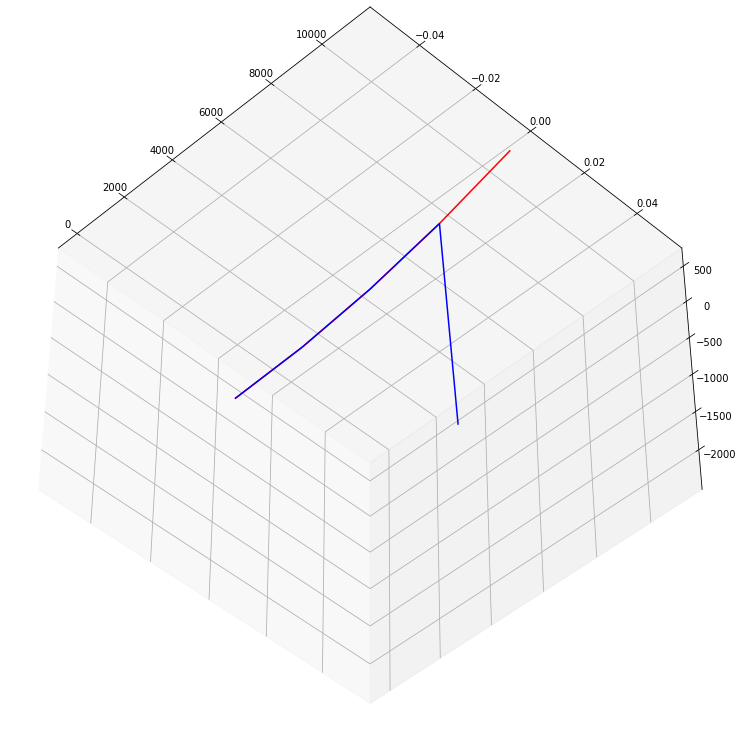

In [127]:
fig=plt.figure(figsize=(13,13))
ax = fig.gca(projection='3d')

X0=fin[0,[i for i in range(0,node_N)]]
Y0=fin[0,[i for i in range(2*node_N,3*node_N)]]
Z0=fin[0,[i for i in range(4*node_N,5*node_N)]]

j=-1
X=fin[j,[i for i in range(0,node_N)]]
Y=fin[j,[i for i in range(2*node_N,3*node_N)]]
Z=fin[j,[i for i in range(4*node_N,5*node_N)]]

num_true_pts = 200
tck, u = interpolate.splprep([X,Y,Z], s=2)
u_fine = np.linspace(0,1,num_true_pts)
x_fine, y_fine, z_fine = interpolate.splev(u_fine, tck)


ax.plot(X0,Y0,Z0, color='r')
ax.plot(X,Y,Z, color='b') 
# ax.plot(x_fine, y_fine, z_fine, color='b')
ax.view_init(-45,-45)
# ax.view_init(0,-90)
plt.show()

In [128]:
X,Y,Z

(array([   0.        , 2763.17121112, 5526.34242223, 8289.51363335,
        8832.18689058]),
 array([0., 0., 0., 0., 0.]),
 array([-2.70689232e-03,  4.33453038e+01,  1.73432005e+02,  3.90385448e+02,
        -2.44483910e+03]))

In [129]:
X0,Y0,Z0

(array([    0.        ,  2763.17121112,  5526.34242223,  8289.51363335,
        11052.68484446]),
 array([0., 0., 0., 0., 0.]),
 array([  0.        ,  43.34801072, 173.43471226, 390.38815474,
        694.42189511]))

In [130]:
us=fin.T

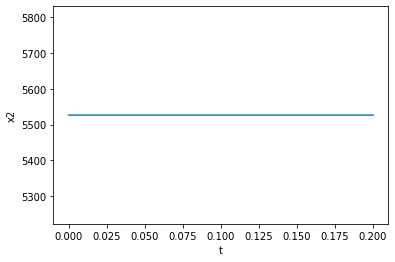

In [131]:
plt.plot(t,us.T[:,2],'-')
plt.xlabel('t')
plt.ylabel('x2')
plt.show()

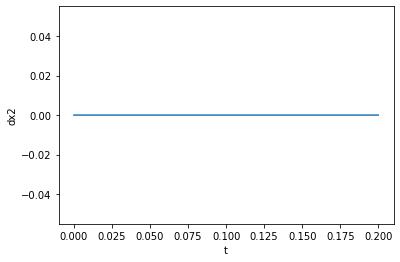

In [132]:
plt.plot(t,us.T[:,node_N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dx2')
plt.show()

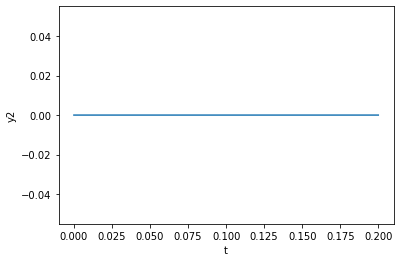

In [133]:
plt.plot(t,us.T[:,2*node_N +2] ,'-')
plt.xlabel('t')
plt.ylabel('y2')
plt.show()

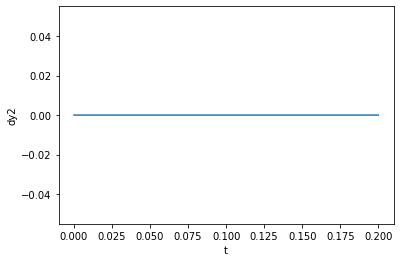

In [134]:
plt.plot(t,us.T[:,3*node_N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dy2')
plt.show()

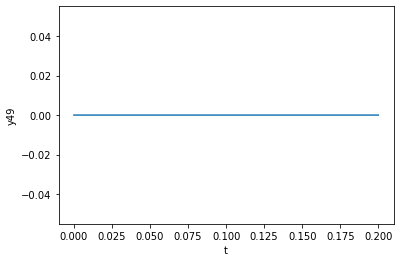

In [135]:
plt.plot(t,us.T[:,2*node_N+49] ,'-')
plt.xlabel('t')
plt.ylabel('y49')
plt.show()

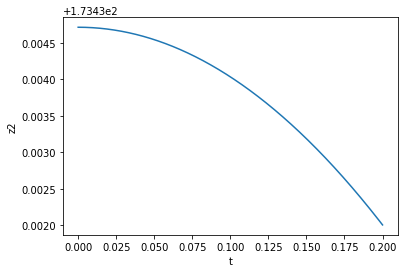

In [136]:
plt.plot(t,us.T[:,4*node_N+2] ,'-')
plt.xlabel('t')
plt.ylabel('z2')
plt.show()

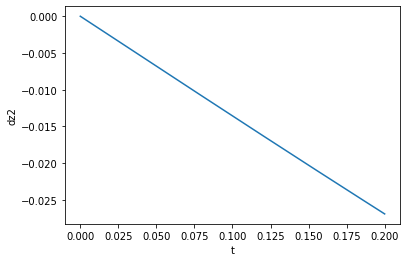

In [137]:
plt.plot(t,us.T[:,5*node_N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dz2')
plt.show()

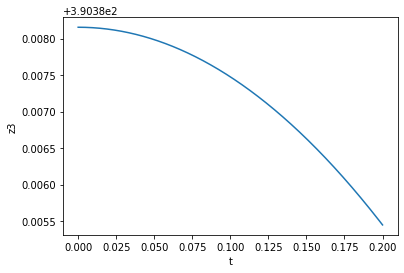

In [138]:
plt.plot(t,us.T[:,4*node_N+3] ,'-')
plt.xlabel('t')
plt.ylabel('z3')
plt.show()

In [139]:
plt.plot(t,us.T[:,4*node_N+49] ,'-')
plt.xlabel('t')
plt.ylabel('z49')
plt.show()

IndexError: index 69 is out of bounds for axis 1 with size 60

In [ ]:
plt.plot(t,us.T[:,8*node_N+2],'-')
plt.xlabel('t')
plt.ylabel('θ2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,9*node_N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dθ2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,10*node_N+2],'-')
plt.xlabel('t')
plt.ylabel('ψ2')
plt.show()

In [ ]:
plt.plot(t,us.T[:,11*node_N+2] ,'-')
plt.xlabel('t')
plt.ylabel('dψ2')
plt.show()